<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Forex/EURUSD/EURUSD_1D_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import pandas as pd

try:
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator
except:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)

     |████████████████████████████████| 727kB 4.8MB/s 
  Created wheel for Ta-Lib: filename=TA_Lib-0.4.17-cp36-cp36m-linux_x86_64.whl size=2405530 sha256=321b66056991d62ac67e2357ce2b1b4be8f056d01881ebfc3aedd77d853c130f
  Stored in directory: /root/.cache/pip/wheels/2a/2e/ec/71c565b2e0091e03a2b56abfbfd062f14a01a8d7b20ffe8bd5
Successfully built Ta-Lib


In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURUSD=X"
data_resample = '1D'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

folds = 0 # should be 0, corss validation cause overfitting

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

best_models = {}
ensemble_model_threshold = 0.05
split_percentages = [0.2,0.1] # validation size, test size

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50
cv_rfe = 5

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe', 'Super_learner'] # True for all , ['All','Fwe','RFE','RFECV','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
algos_to_include = [None, 'GLM' ,'XGBoost' ,'DeepLearning'] # [None, 'DRF', 'GLM' ,'XGBoost' ,'GBM' ,'DeepLearning' ,'StackedEnsemble'], None for all
is_EDA = True
is_minmax = True # use minmax
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-01,1.3980,1.4054,1.3955,1.3999,1.3999,0
2009-01-02,1.4003,1.4023,1.3843,1.3923,1.3923,0
2009-01-05,1.3958,1.3958,1.3556,1.3646,1.3646,0
2009-01-06,1.3632,1.3632,1.3318,1.3510,1.3510,0
2009-01-07,1.3499,1.3742,1.3437,1.3611,1.3611,0
...,...,...,...,...,...,...
2018-12-26,1.1413,1.1419,1.1376,1.1416,1.1416,0
2018-12-27,1.1364,1.1434,1.1359,1.1361,1.1361,0
2018-12-28,1.1431,1.1473,1.1431,1.1431,1.1431,0


,Open,High,Low,Close,Adj Close,Volume
count,2605.000000,2605.000000,2605.000000,2605.000000,2605.000000,2605.0
mean,1.258565,1.263361,1.253492,1.258516,1.258516,0.0
std,0.118513,0.118918,0.118288,0.118428,0.118428,0.0
min,1.039400,1.042000,0.760600,1.039000,1.039000,0.0
25%,1.139700,1.143500,1.135900,1.139500,1.139500,0.0
50%,1.280900,1.287000,1.274700,1.281200,1.281200,0.0
75%,1.354800,1.359600,1.350000,1.354700,1.354700,0.0
max,1.512600,1.514500,1.504100,1.512800,1.512800,0.0


0

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2605
Total Missing (%),0.0%
Total size in memory,142.6 KiB
Average record size in memory,56.0 B
Numeric,1
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import os

def fe(last_index = None):
  features_dataset = pd.read_pickle('full_dataset').sort_index()
  if last_index is not None:
    features_dataset = features_dataset[:-last_index]


  periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
  timeperiods = [8, 12, 14, 20, 24, 30]
  matypes = [0,1,2,3,4,5,6,8]
  nbdevs = [2, 3, 4, 5]

  # date features
  features_dataset['day'] = features_dataset.index.day
  features_dataset['dayofweek'] = features_dataset.index.dayofweek
  features_dataset['dayofyear'] = features_dataset.index.dayofyear
  features_dataset['days_in_month'] = features_dataset.index.days_in_month
  features_dataset['hour'] = features_dataset.index.hour
  features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
  features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
  features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
  features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
  features_dataset['minute'] = features_dataset.index.minute
  features_dataset['month'] = features_dataset.index.month
  features_dataset['quarter'] = features_dataset.index.quarter
  features_dataset['second'] = features_dataset.index.second
  features_dataset['week'] = features_dataset.index.week
  features_dataset['weekday'] = features_dataset.index.weekday
  features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
  features_dataset['weekofyear'] = features_dataset.index.weekofyear

  # Overlap Studies
  features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
  features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
  features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                      offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                      accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                      accelerationshort=-4e37, accelerationmaxshort=-4e37)

  for timeperiod in timeperiods:
      features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                            acceleration=timeperiod / 100,
                                                            maximum=timeperiod / 100)
      features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

      for matype in matypes:
          features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                            timeperiod=timeperiod, matype=matype)
          features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                                minperiod=2,
                                                                                maxperiod=timeperiod, matype=matype)
          features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                            timeperiod=timeperiod,
                                                                            vfactor=matype / 10)

          for nbdev in nbdevs:
              features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                  features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

              
  gc.collect()
  # Momentum Indicators
  features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                features_dataset['Close'])

  for timeperiod in timeperiods:
      features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
          features_dataset['High'],
          features_dataset['Low'],
          timeperiod=timeperiod)
      features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                    features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
          'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
      features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], features_dataset['Volume'],
                                                      timeperiod=timeperiod)
      features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                                features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                              features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                              timeperiod=timeperiod)
      features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                          features_dataset['Close'], timeperiod=timeperiod)

      
  gc.collect()
  features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
      features_dataset['Close'], fastperiod=12,
      slowperiod=26,
      signalperiod=9)
  features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
      features_dataset['Close'],
      fastperiod=12,
      fastmatype=0,
      slowperiod=26,
      slowmatype=0,
      signalperiod=9,
      signalmatype=0)

  features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                          features_dataset['Low'],
                                                                          features_dataset['Close'], fastk_period=5,
                                                                          slowk_period=3, slowk_matype=0,
                                                                          slowd_period=3, slowd_matype=0)
  features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                              features_dataset['Low'],
                                                                              features_dataset['Close'], fastk_period=5,
                                                                              fastd_period=3, fastd_matype=0)
  features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                    timeperiod=14,
                                                                                    fastk_period=5, fastd_period=3,
                                                                                    fastd_matype=0)
  features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                      timeperiod1=7, timeperiod2=14, timeperiod3=28)

  # Volume Indicators
  features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                              features_dataset['Volume'])
  features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    features_dataset['Volume'], fastperiod=3, slowperiod=10)
  features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

  gc.collect()
  # Volatility Indicators
  for timeperiod in timeperiods:
      features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  # Price Transform
  features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
  features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
  features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
  features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  gc.collect()
  # Cycle Indicators
  features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
  features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
  features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
  features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
  features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

  # Pattern Recognition
  features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
  features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
  features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
  features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'], penetration=0)
  features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  gc.collect()

  # Statistic Functions
  for timeperiod in timeperiods:
      features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                        timeperiod=timeperiod)
      features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                            timeperiod=timeperiod)
      features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                      timeperiod=timeperiod)
      features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
      features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

      
  gc.collect()
  # Math Transform
  features_dataset['ACOS'] = ACOS(features_dataset['Close'])
  features_dataset['ASIN'] = ASIN(features_dataset['Close'])
  features_dataset['ATAN'] = ATAN(features_dataset['Close'])
  features_dataset['CEIL'] = CEIL(features_dataset['Close'])
  features_dataset['COS'] = COS(features_dataset['Close'])
  features_dataset['COSH'] = COSH(features_dataset['Close'])
  features_dataset['EXP'] = EXP(features_dataset['Close'])
  features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
  features_dataset['LN'] = LN(features_dataset['Close'])
  features_dataset['LOG10'] = LOG10(features_dataset['Close'])
  features_dataset['SIN'] = SIN(features_dataset['Close'])
  features_dataset['SINH'] = SINH(features_dataset['Close'])
  features_dataset['SQRT'] = SQRT(features_dataset['Close'])
  features_dataset['TAN'] = TAN(features_dataset['Close'])
  features_dataset['TANH'] = TANH(features_dataset['Close'])

  gc.collect()
  # Math Operator
  features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
  features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
  features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
  features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

  for timeperiod in timeperiods:
      features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
          features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
      
  gc.collect()


  features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
  features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
  features_dataset.to_pickle('features_dataset' if last_index is None else 'features_dataset_' + str(last_index))
  if last_index is None:
    display(features_dataset)
    display(features_dataset.describe())

  del periods, timeperiods, matypes, nbdevs, features_dataset
  gc.collect()

fe()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# check features data leakage
fe(100)
long_df = pd.read_pickle('features_dataset')[:-100]
short_df =  pd.read_pickle('features_dataset_100')
if False in (long_df.index.values == short_df.index.values):
  print('mismatch INDEX', long_df.index.values == short_df.index.values)

for aCol in long_df.columns.values:
  try:
    if False in (long_df[aCol].values == short_df[aCol].values):
      print('mismatch, ', aCol, long_df[aCol].values == short_df[aCol].values)
  except:
    print('mismatch exception, ', aCol)

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del talib, long_df, short_df
gc.collect()
print('Nothing should be printed above')

Nothing should be printed above


In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]]
longs = label_df[data_label].values[1:] > label_df[data_label].values[:-1] 
shorts = label_df[data_label].values[1:] <= label_df[data_label].values[:-1] 
label_df = label_df[:-1]
label_df[data_label_name] = (longs*1 + shorts*0).astype(int)
scaled_df = features_dataset
scaled_df = pd.DataFrame((minmax_scale(scaled_df, axis=0, feature_range=(0, 1)) if is_minmax else scaled_df), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale, shorts, longs
gc.collect()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

0

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*(1-(split_percentages[0]+split_percentages[1]))),int(len(train_hf)*(1-split_percentages[1]))]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp926y2a5n
  JVM stdout: /tmp/tmp926y2a5n/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp926y2a5n/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,5 months and 18 days !!!
H2O cluster name:,H2O_from_python_unknownUser_sgz0l8
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline
from h2o.exceptions import H2OJobCancelled
from sklearn.metrics import accuracy_score

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num,best_models
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  nfolds = nfolds or folds
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo, keep_cross_validation_predictions=True)
      t_hf = (training_frame or train_hf)
      validation_frame =  t_hf[index_splits[0]:index_splits[1],:] if split_percentages[0] != 0 else None

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=validation_frame, leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except (KeyboardInterrupt, H2OJobCancelled):
      raise Exception('Stopped')
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    best_models[str(feature_name) + '_' + str(model_algo)] = {'id':aml.leader.model_id ,'AUC':getattr(model_performance, "auc")(),
                                                              'path': h2o.save_model(aml.leader,force=True)}
    predicted = aml.leader.predict(t_hf).as_data_frame()

    # predicted['predict'] = (predicted['p1'] >= aml.leader.find_threshold_by_max_metric('f1', train=False, valid=True, xval=False)).astype(int)
    predicted.to_csv(str(feature_name) + '_' + str(model_algo) + '.csv', )
    predicted = predicted[['predict']]
    print(predicted)
    start_idx = max(-index_splits[1],-20)
    predicted = predicted[start_idx:]
    predict_df = pd.read_pickle('predict_df')[start_idx:]

    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.572839,0.682643,0.496350,0.494732,0.244759
1,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.552444,0.688678,0.454763,0.497767,0.247772
2,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.550758,0.758059,0.433080,0.520358,0.270772
3,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.537938,0.797407,0.469361,0.537513,0.288920
4,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.532111,3.268947,0.492701,0.694590,0.482455
5,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.530025,0.706667,0.489051,0.504966,0.254991
6,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.512973,1.164604,0.492701,0.575093,0.330731
7,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.500000,0.691388,0.500000,0.499120,0.249121
8,DeepLearning_1_AutoML_20191207_222654,0.487640,0.720027,0.500000,0.509557,0.259648
9,DeepLearning_grid_1_AutoML_20191207_222654_mod...,0.484941,0.691609,0.500000,0.499231,0.249231


,variable,relative_importance,scaled_importance,percentage
0,SUB,1.000000,1.000000,0.002886
1,DIV,0.956111,0.956111,0.002759
2,TRANGE,0.944869,0.944869,0.002726
3,CDLRICKSHAWMAN,0.809369,0.809369,0.002335
4,weekday,0.748182,0.748182,0.002159
...,...,...,...,...
933,CDLHARAMI,0.305932,0.305932,0.000883
934,CDLGAPSIDESIDEWHITE,0.295343,0.295343,0.000852
935,CDLCOUNTERATTACK,0.281202,0.281202,0.000811
936,CDL3INSIDE,0.270718,0.270718,0.000781


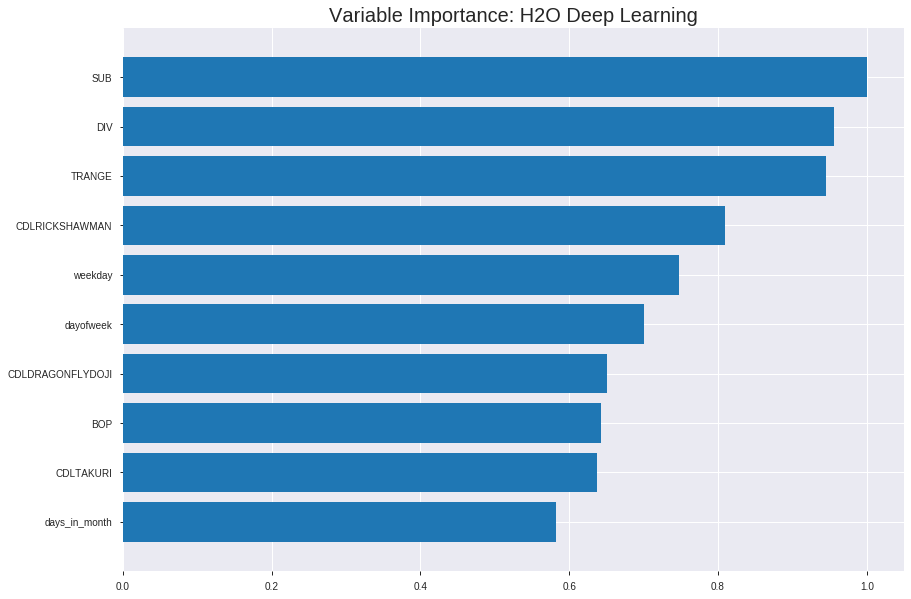

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_222654_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2346106804114577
RMSE: 0.4843662667976143
LogLoss: 0.6587626282002749
Mean Per-Class Error: 0.41385067307788836
AUC: 0.6265220795647329
pr_auc: 0.6114517785339447
Gini: 0.2530441591294659
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3524062072009178: 


,0,1,Error,Rate
0,95.0,836.0,0.898,(836.0/931.0)
1,12.0,844.0,0.014,(12.0/856.0)
Total,107.0,1680.0,0.4745,(848.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3524062,0.6656151,321.0
max f2,0.2770099,0.8283278,354.0
max f0point5,0.4663987,0.5756228,201.0
max accuracy,0.4873859,0.5831002,171.0
max precision,0.9771742,1.0,0.0
max recall,0.2215313,1.0,369.0
max specificity,0.9771742,1.0,0.0
max absolute_mcc,0.3524062,0.1853348,321.0
max min_per_class_accuracy,0.4889297,0.5359828,168.0
max mean_per_class_accuracy,0.4736461,0.5861493,191.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7534610,2.0876168,2.0876168,1.0,0.8448508,1.0,0.8448508,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.7052321,1.6237020,1.8556594,0.7777778,0.7268531,0.8888889,0.7858519,0.0163551,0.0373832,62.3701973,85.5659398
,3,0.0302182,0.6532869,1.8556594,1.8556594,0.8888889,0.6751352,0.8888889,0.7489464,0.0186916,0.0560748,85.5659398,85.5659398
,4,0.0402910,0.6263192,1.2757658,1.7106860,0.6111111,0.6388917,0.8194444,0.7214327,0.0128505,0.0689252,27.5765836,71.0686007
,5,0.0503637,0.5978190,1.6237020,1.6932892,0.7777778,0.6080717,0.8111111,0.6987605,0.0163551,0.0852804,62.3701973,69.3289200
,6,0.1001679,0.5460061,1.1728184,1.4345076,0.5617978,0.5670144,0.6871508,0.6332555,0.0584112,0.1436916,17.2818440,43.4507649
,7,0.1499720,0.5158560,1.1962748,1.3553930,0.5730337,0.5302577,0.6492537,0.5990510,0.0595794,0.2032710,19.6274808,35.5393012
,8,0.2003358,0.4987611,1.2293744,1.3237123,0.5888889,0.5058795,0.6340782,0.5756280,0.0619159,0.2651869,22.9374351,32.3712343
,9,0.5428092,0.4889272,1.0608641,1.1578741,0.5081699,0.4896061,0.5546392,0.5213544,0.3633178,0.6285047,6.0864104,15.7874073
,10,0.5998881,0.4797412,0.9824079,1.1411786,0.4705882,0.4844457,0.5466418,0.5178426,0.0560748,0.6845794,-1.7592084,14.1178599




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.24836455036937835
RMSE: 0.49836186688928996
LogLoss: 0.6899780021139833
Mean Per-Class Error: 0.44503284828390743
AUC: 0.5623119665991281
pr_auc: 0.53003144719906
Gini: 0.12462393319825615
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3459850061091517: 


,0,1,Error,Rate
0,7.0,260.0,0.9738,(260.0/267.0)
1,1.0,243.0,0.0041,(1.0/244.0)
Total,8.0,503.0,0.5108,(261.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3459850,0.6506024,391.0
max f2,0.3353342,0.8215488,397.0
max f0point5,0.3835387,0.5491170,310.0
max accuracy,0.4799518,0.5655577,118.0
max precision,0.5903521,0.7142857,6.0
max recall,0.3353342,1.0,397.0
max specificity,0.6420548,0.9962547,0.0
max absolute_mcc,0.4799518,0.1248420,118.0
max min_per_class_accuracy,0.4206238,0.5468165,221.0
max mean_per_class_accuracy,0.4799518,0.5549672,118.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 43.56 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5925253,1.3961749,1.3961749,0.6666667,0.6173616,0.6666667,0.6173616,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.5646133,1.2565574,1.3327124,0.6,0.5765508,0.6363636,0.5988112,0.0122951,0.0286885,25.6557377,33.2712370
,3,0.0313112,0.5596587,1.2565574,1.3089139,0.6,0.5625951,0.625,0.5874937,0.0122951,0.0409836,25.6557377,30.8913934
,4,0.0410959,0.5520825,0.8377049,1.1967213,0.4,0.5549409,0.5714286,0.5797430,0.0081967,0.0491803,-16.2295082,19.6721311
,5,0.0508806,0.5465909,0.4188525,1.0471311,0.2,0.5491197,0.5,0.5738539,0.0040984,0.0532787,-58.1147541,4.7131148
,6,0.1017613,0.5255965,1.4498739,1.2485025,0.6923077,0.5347563,0.5961538,0.5543051,0.0737705,0.1270492,44.9873897,24.8502522
,7,0.1506849,0.5123082,1.1727869,1.2239195,0.56,0.5187623,0.5844156,0.5427652,0.0573770,0.1844262,17.2786885,22.3919523
,8,0.2015656,0.4954274,0.8860340,1.1386280,0.4230769,0.5032525,0.5436893,0.5327911,0.0450820,0.2295082,-11.3965952,13.8628044
,9,0.3013699,0.4666084,1.1908550,1.1559240,0.5686275,0.4816645,0.5519481,0.5158596,0.1188525,0.3483607,19.0855031,15.5923994
,10,0.4011742,0.4454547,0.9855352,1.1135346,0.4705882,0.4560414,0.5317073,0.5009780,0.0983607,0.4467213,-1.4464802,11.3534586



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:34:53,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 22:34:56,5 min 14.809 sec,864 obs/sec,1.3760492,1,2459.0,0.6144700,1.4006886,-0.5129584,0.5693970,0.5579502,1.8556594,0.5209849,0.6846631,2.5458698,-0.8788607,0.5472232,0.5171358,1.7452186,0.5107632
,2019-12-07 22:35:13,5 min 31.497 sec,1081 obs/sec,10.8981533,8,19475.0,0.5082803,0.7138740,-0.0352189,0.5439860,0.4967021,0.6958723,0.5019586,0.5368462,0.7751606,-0.1551554,0.5129474,0.4964838,1.0471311,0.5048924
,2019-12-07 22:35:29,5 min 48.205 sec,1165 obs/sec,21.7073307,16,38791.0,0.4905359,0.6730067,0.0357997,0.5978554,0.5853970,1.8556594,0.4885283,0.5022878,0.6978254,-0.0112206,0.5030699,0.4805676,1.0471311,0.5205479
,2019-12-07 22:35:45,6 min 4.101 sec,1221 obs/sec,32.6099608,24,58274.0,0.4843663,0.6587626,0.0599013,0.6265221,0.6114518,2.0876168,0.4745383,0.4983619,0.6899780,0.0045251,0.5623120,0.5300314,1.3961749,0.5107632
,2019-12-07 22:36:01,6 min 19.767 sec,1256 obs/sec,43.5416900,32,77809.0,0.4785851,0.6460934,0.0822085,0.6564454,0.6392537,2.0876168,0.4432009,0.4998612,0.6928777,-0.0014739,0.5134463,0.4877612,1.3961749,0.5205479
,2019-12-07 22:36:16,6 min 35.087 sec,1252 obs/sec,53.0856184,39,94864.0,0.4782584,0.6444564,0.0834610,0.6656099,0.6627395,2.0876168,0.4336877,0.4996716,0.6924897,-0.0007141,0.5193406,0.4840770,0.6980874,0.5146771
,2019-12-07 22:36:32,6 min 50.554 sec,1274 obs/sec,63.9854505,47,114342.0,0.4719726,0.6301473,0.1073952,0.6792697,0.6663496,2.0876168,0.4325686,0.4991480,0.6914403,0.0013820,0.5284583,0.4983290,0.6980874,0.5166341
,2019-12-07 22:36:47,7 min 5.689 sec,1293 obs/sec,74.8601007,55,133775.0,0.4696529,0.6233339,0.1161479,0.6828095,0.6866212,1.9716381,0.4381645,0.5180013,0.7328214,-0.0754802,0.5122874,0.4830247,1.0471311,0.5048924
,2019-12-07 22:36:48,7 min 7.310 sec,1292 obs/sec,74.8601007,55,133775.0,0.4843663,0.6587626,0.0599013,0.6265221,0.6114518,2.0876168,0.4745383,0.4983619,0.6899780,0.0045251,0.5623120,0.5300314,1.3961749,0.5107632


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
SUB,1.0,1.0,0.0028855
DIV,0.9561112,0.9561112,0.0027589
TRANGE,0.9448687,0.9448687,0.0027264
CDLRICKSHAWMAN,0.8093689,0.8093689,0.0023354
weekday,0.7481823,0.7481823,0.0021589
---,---,---,---
CDLHARAMI,0.3059317,0.3059317,0.0008828
CDLGAPSIDESIDEWHITE,0.2953431,0.2953431,0.0008522
CDLCOUNTERATTACK,0.2812020,0.2812020,0.0008114
CDL3INSIDE,0.2707177,0.2707177,0.0007812



See the whole table with table.as_data_frame()


('accuracy', 0.59765625)

('F1', 0.6363636363636364)

('auc', 0.5728393547199901)

('logloss', 0.6826434721756438)

('mean_per_class_error', 0.42118015089247374)

('rmse', 0.4947317061017448)

('mse', 0.24475946102234314)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


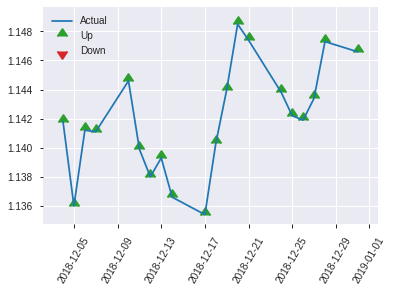


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.24475946102234314
RMSE: 0.4947317061017448
LogLoss: 0.6826434721756438
Mean Per-Class Error: 0.42118015089247374
AUC: 0.5728393547199901
pr_auc: 0.5341576305687428
Gini: 0.1456787094399803
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38442782292207506: 


,0,1,Error,Rate
0,1.0,136.0,0.9927,(136.0/137.0)
1,0.0,119.0,0.0,(0.0/119.0)
Total,1.0,255.0,0.5312,(136.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3844278,0.6363636,254.0
max f2,0.3844278,0.8139535,254.0
max f0point5,0.4718303,0.5375552,139.0
max accuracy,0.5329590,0.5976562,49.0
max precision,0.5691267,0.7333333,14.0
max recall,0.3844278,1.0,254.0
max specificity,0.6262738,0.9927007,0.0
max absolute_mcc,0.5329590,0.1927703,49.0
max min_per_class_accuracy,0.4788289,0.5547445,127.0
max mean_per_class_accuracy,0.5276046,0.5788198,57.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6181726,0.7170868,0.7170868,0.3333333,0.6243101,0.3333333,0.6243101,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.6040461,0.7170868,0.7170868,0.3333333,0.6079872,0.3333333,0.6161487,0.0084034,0.0168067,-28.2913165,-28.2913165
,3,0.03125,0.5956639,2.1512605,1.0756303,1.0,0.5994004,0.5,0.6119616,0.0168067,0.0336134,115.1260504,7.5630252
,4,0.0429688,0.5867153,2.1512605,1.3689840,1.0,0.5904513,0.6363636,0.6060952,0.0252101,0.0588235,115.1260504,36.8983957
,5,0.0507812,0.5732009,2.1512605,1.4893342,1.0,0.5794861,0.6923077,0.6020015,0.0168067,0.0756303,115.1260504,48.9334195
,6,0.1015625,0.5534374,1.1583710,1.3238526,0.5384615,0.5617498,0.6153846,0.5818756,0.0588235,0.1344538,15.8371041,32.3852618
,7,0.1523438,0.5421061,1.4893342,1.3790131,0.6923077,0.5469950,0.6410256,0.5702488,0.0756303,0.2100840,48.9334195,37.9013144
,8,0.203125,0.5313779,1.4893342,1.4065934,0.6923077,0.5368154,0.6538462,0.5618904,0.0756303,0.2857143,48.9334195,40.6593407
,9,0.3007812,0.5057180,0.7744538,1.2013533,0.36,0.5183466,0.5584416,0.5477528,0.0756303,0.3613445,-22.5546218,20.1353269
,10,0.4023438,0.4944114,0.9928895,1.1487313,0.4615385,0.4993218,0.5339806,0.5355275,0.1008403,0.4621849,-0.7110537,14.8731337


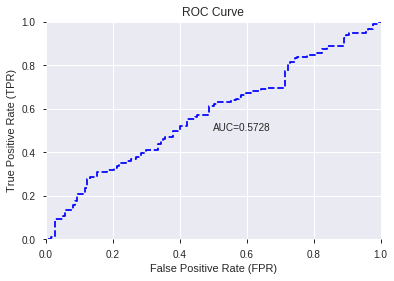

This function is available for GLM models only


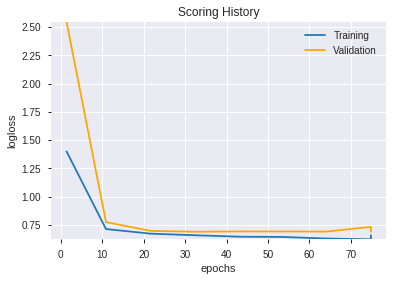

--2019-12-07 22:43:36--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.97.11
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.97.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  44.8MB/s    in 8.3s    

2019-12-07 22:43:45 (42.1 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unkno

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_222654_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_222654_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

938

['SUB',
 'DIV',
 'TRANGE',
 'CDLRICKSHAWMAN',
 'weekday',
 'dayofweek',
 'CDLDRAGONFLYDOJI',
 'BOP',
 'CDLTAKURI',
 'days_in_month',
 'CDLHIGHWAVE',
 'CDLGRAVESTONEDOJI',
 'CDLSPINNINGTOP',
 'aroondown_8',
 'CDLSHORTLINE',
 'MINUS_DM_8',
 'ULTOSC',
 'CDLDOJI',
 'CORREL_20',
 'aroonup_24',
 'STOCHF_fastk',
 'day',
 'CDLLONGLEGGEDDOJI',
 'CCI_8',
 'SAREXT',
 'aroondown_12',
 'ATR_24',
 'MINUS_DI_8',
 'AROONOSC_8',
 'HT_TRENDMODE',
 'ATR_30',
 'DX_12',
 'STOCHRSI_fastk',
 'aroonup_20',
 'weekday_name',
 'ATR_8',
 'aroondown_30',
 'PLUS_DM_30',
 'STOCHRSI_fastd',
 'MACDFIX_signal_20',
 'MACDFIX_signal_12',
 'MACDEXT_hist',
 'AROONOSC_30',
 'CDLINVERTEDHAMMER',
 'is_quarter_start',
 'NATR_24',
 'dayofyear',
 'CORREL_12',
 'DX_30',
 'month']

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_224355_model_9,0.581365,0.677758,0.465160,0.492519,0.242575
1,DeepLearning_grid_1_AutoML_20191207_224355_model_8,0.577624,0.696290,0.413942,0.501390,0.251392
2,DeepLearning_grid_1_AutoML_20191207_224355_model_5,0.571061,0.694551,0.492701,0.499355,0.249356
3,DeepLearning_grid_1_AutoML_20191207_224355_model_6,0.554561,0.719669,0.456419,0.507913,0.257976
4,DeepLearning_grid_1_AutoML_20191207_224355_model_7,0.553640,0.951795,0.500000,0.552296,0.305031
5,DeepLearning_grid_1_AutoML_20191207_224355_model_2,0.542784,0.844041,0.482856,0.545647,0.297731
6,DeepLearning_1_AutoML_20191207_224355,0.533767,0.737161,0.482304,0.516487,0.266759
7,DeepLearning_grid_1_AutoML_20191207_224355_model_3,0.525302,0.832955,0.474453,0.543626,0.295529
8,DeepLearning_grid_1_AutoML_20191207_224355_model_4,0.505612,1.080505,0.492701,0.600406,0.360487
9,DeepLearning_grid_1_AutoML_20191207_224355_model_1,0.504876,1.110779,0.496350,0.590075,0.348189


,variable,relative_importance,scaled_importance,percentage
0,SUB,1.000000,1.000000,0.035243
1,BOP,0.985628,0.985628,0.034737
2,TRANGE,0.962793,0.962793,0.033932
3,DIV,0.921853,0.921853,0.032489
4,STOCHF_fastk,0.643139,0.643139,0.022666
5,CDLRICKSHAWMAN,0.608691,0.608691,0.021452
6,CORREL_20,0.594047,0.594047,0.020936
7,CDLSHORTLINE,0.578542,0.578542,0.020390
8,CDLGRAVESTONEDOJI,0.578523,0.578523,0.020389
9,SAREXT,0.567871,0.567871,0.020014


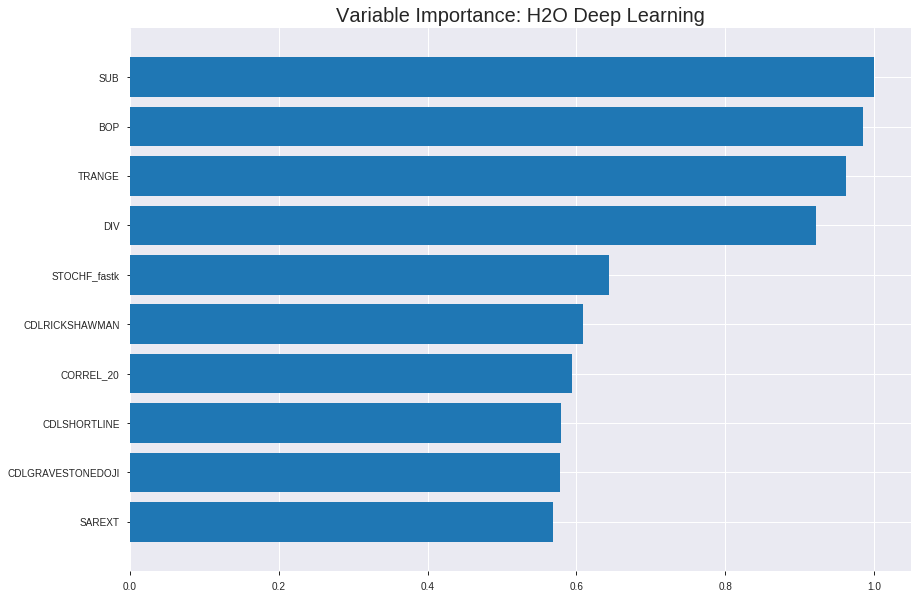

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_224355_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.22417681148460336
RMSE: 0.47347313702532623
LogLoss: 0.640667932452527
Mean Per-Class Error: 0.3670551964022205
AUC: 0.6813000040153789
pr_auc: 0.6384978348889475
Gini: 0.36260000803075787
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34178490952106344: 


,0,1,Error,Rate
0,237.0,694.0,0.7454,(694.0/931.0)
1,41.0,815.0,0.0479,(41.0/856.0)
Total,278.0,1509.0,0.4113,(735.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3417849,0.6892178,274.0
max f2,0.1843342,0.8321925,353.0
max f0point5,0.4718673,0.6132417,183.0
max accuracy,0.4889692,0.6267487,162.0
max precision,0.7844565,1.0,0.0
max recall,0.0000646,1.0,399.0
max specificity,0.7844565,1.0,0.0
max absolute_mcc,0.4181297,0.2886063,227.0
max min_per_class_accuracy,0.4956953,0.6144860,152.0
max mean_per_class_accuracy,0.4668819,0.6329448,187.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 45.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6695109,1.8556594,1.8556594,0.8888889,0.7015576,0.8888889,0.7015576,0.0186916,0.0186916,85.5659398,85.5659398
,2,0.0201455,0.6472734,1.8556594,1.8556594,0.8888889,0.6570524,0.8888889,0.6793050,0.0186916,0.0373832,85.5659398,85.5659398
,3,0.0302182,0.6371228,1.3917445,1.7010211,0.6666667,0.6422022,0.8148148,0.6669374,0.0140187,0.0514019,39.1744548,70.1021115
,4,0.0402910,0.6281323,1.6237020,1.6816913,0.7777778,0.6319586,0.8055556,0.6581927,0.0163551,0.0677570,62.3701973,68.1691329
,5,0.0503637,0.6150567,1.2757658,1.6005062,0.6111111,0.6231230,0.7666667,0.6511788,0.0128505,0.0806075,27.5765836,60.0506231
,6,0.1001679,0.5799595,1.4073821,1.5044836,0.6741573,0.5950500,0.7206704,0.6232712,0.0700935,0.1507009,40.7382127,50.4483632
,7,0.1499720,0.5532955,1.2666439,1.4254995,0.6067416,0.5677864,0.6828358,0.6048453,0.0630841,0.2137850,26.6643915,42.5499547
,8,0.2003358,0.5338609,1.3221573,1.3995197,0.6333333,0.5427213,0.6703911,0.5892275,0.0665888,0.2803738,32.2157321,39.9519657
,9,0.2999440,0.5098828,1.2549157,1.3514982,0.6011236,0.5199858,0.6473881,0.5662331,0.125,0.4053738,25.4915730,35.1498204
,10,0.4001119,0.4997987,1.0379771,1.2730083,0.4972067,0.5043254,0.6097902,0.5507345,0.1039720,0.5093458,3.7977079,27.3008300




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.23889078370893618
RMSE: 0.4887645483348155
LogLoss: 0.6686914832499145
Mean Per-Class Error: 0.41589918339780196
AUC: 0.6069334438509241
pr_auc: 0.5506325878432942
Gini: 0.21386688770184814
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2569356333420874: 


,0,1,Error,Rate
0,23.0,244.0,0.9139,(244.0/267.0)
1,1.0,243.0,0.0041,(1.0/244.0)
Total,24.0,487.0,0.4795,(245.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2569356,0.6648427,375.0
max f2,0.2569356,0.8304853,375.0
max f0point5,0.4651669,0.5736715,257.0
max accuracy,0.4988895,0.5831703,146.0
max precision,0.6204889,0.75,3.0
max recall,0.2101091,1.0,385.0
max specificity,0.6324172,0.9962547,0.0
max absolute_mcc,0.2569356,0.1936989,375.0
max min_per_class_accuracy,0.4921170,0.5614754,181.0
max mean_per_class_accuracy,0.4651669,0.5841008,257.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 46.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6162282,1.3961749,1.3961749,0.6666667,0.6234700,0.6666667,0.6234700,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.5973337,0.0,0.7615499,0.0,0.6028476,0.3636364,0.6140962,0.0,0.0163934,-100.0,-23.8450075
,3,0.0313112,0.5852655,1.6754098,1.0471311,0.8,0.5902175,0.5,0.6066341,0.0163934,0.0327869,67.5409836,4.7131148
,4,0.0410959,0.5616878,0.8377049,0.9972678,0.4,0.5750919,0.4761905,0.5991241,0.0081967,0.0409836,-16.2295082,-0.2732240
,5,0.0508806,0.5560965,1.6754098,1.1276797,0.8,0.5586924,0.5384615,0.5913488,0.0163934,0.0573770,67.5409836,12.7679697
,6,0.1017613,0.5347975,1.2887768,1.2082282,0.6153846,0.5461552,0.5769231,0.5687520,0.0655738,0.1229508,28.8776797,20.8228247
,7,0.1506849,0.5207548,1.5078689,1.3055142,0.72,0.5278996,0.6233766,0.5554882,0.0737705,0.1967213,50.7868852,30.5514158
,8,0.2015656,0.5108714,1.1276797,1.2606239,0.5384615,0.5152256,0.6019417,0.5453248,0.0573770,0.2540984,12.7679697,26.0623906
,9,0.3013699,0.5014252,1.1087271,1.2103204,0.5294118,0.5055962,0.5779221,0.5321680,0.1106557,0.3647541,10.8727097,21.0320417
,10,0.4011742,0.4977221,1.1087271,1.1850460,0.5294118,0.4993052,0.5658537,0.5239923,0.1106557,0.4754098,10.8727097,18.5045982



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:48:44,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 22:48:46,1 min 18.512 sec,1382 obs/sec,2.0,1,3574.0,0.5308633,0.7671310,-0.1292524,0.6442337,0.6025050,1.7396807,0.4465585,0.5420808,0.7935624,-0.1777922,0.5842543,0.5444293,1.7452186,0.5146771
,2019-12-07 22:48:53,1 min 25.055 sec,2077 obs/sec,10.0,5,17870.0,0.4734731,0.6406679,0.1017105,0.6813000,0.6384978,1.8556594,0.4113039,0.4887645,0.6686915,0.0424971,0.6069334,0.5506326,1.3961749,0.4794521
,2019-12-07 22:48:59,1 min 30.669 sec,2350 obs/sec,18.0,9,32166.0,0.4657669,0.6248393,0.1307134,0.6960502,0.6546796,1.9716381,0.3721321,0.4896707,0.6708605,0.0389435,0.6078698,0.5633527,1.3961749,0.4637965
,2019-12-07 22:49:05,1 min 37.025 sec,2565 obs/sec,28.0,14,50036.0,0.4623058,0.6165384,0.1435850,0.7080562,0.6741302,1.9716381,0.3827644,0.4895414,0.6704539,0.0394509,0.6037407,0.5476686,0.6980874,0.4618395
,2019-12-07 22:49:11,1 min 43.241 sec,2695 obs/sec,38.0,19,67906.0,0.4557052,0.6019277,0.1678653,0.7227444,0.6919733,1.9716381,0.3598209,0.4962551,0.6860638,0.0129238,0.5979846,0.5392649,1.0471311,0.4774951
,2019-12-07 22:49:17,1 min 49.005 sec,2818 obs/sec,48.0,24,85776.0,0.4504393,0.5906599,0.1869855,0.7378171,0.7068658,1.9716381,0.3368774,0.4940787,0.6807496,0.0215626,0.6022595,0.5489882,1.7452186,0.4872798
,2019-12-07 22:49:22,1 min 54.606 sec,2917 obs/sec,58.0,29,103646.0,0.4449784,0.5896751,0.2065792,0.7563079,0.7318493,1.9716381,0.3301623,0.5075236,0.7198568,-0.0324122,0.5975318,0.5380502,1.3961749,0.4833659
,2019-12-07 22:49:23,1 min 55.167 sec,2914 obs/sec,58.0,29,103646.0,0.4734731,0.6406679,0.1017105,0.6813000,0.6384978,1.8556594,0.4113039,0.4887645,0.6686915,0.0424971,0.6069334,0.5506326,1.3961749,0.4794521


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
SUB,1.0,1.0,0.0352434
BOP,0.9856281,0.9856281,0.0347369
TRANGE,0.9627929,0.9627929,0.0339321
DIV,0.9218526,0.9218526,0.0324892
STOCHF_fastk,0.6431388,0.6431388,0.0226664
---,---,---,---
STOCHRSI_fastk,0.4963432,0.4963432,0.0174928
MACDFIX_signal_12,0.4939982,0.4939982,0.0174102
CDLINVERTEDHAMMER,0.4920639,0.4920639,0.0173420
aroondown_12,0.4913353,0.4913353,0.0173163



See the whole table with table.as_data_frame()


('accuracy', 0.578125)

('F1', 0.6462395543175488)

('auc', 0.5813653928724775)

('logloss', 0.6777575274336229)

('mean_per_class_error', 0.41360485800159474)

('rmse', 0.4925193729445321)

('mse', 0.24257533272567508)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


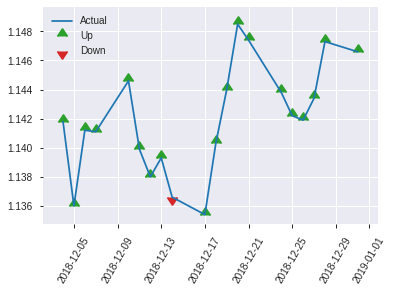


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.24257533272567508
RMSE: 0.4925193729445321
LogLoss: 0.6777575274336229
Mean Per-Class Error: 0.41360485800159474
AUC: 0.5813653928724775
pr_auc: 0.5142852603778629
Gini: 0.16273078574495492
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24786311228220093: 


,0,1,Error,Rate
0,13.0,124.0,0.9051,(124.0/137.0)
1,3.0,116.0,0.0252,(3.0/119.0)
Total,16.0,240.0,0.4961,(127.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2478631,0.6462396,233.0
max f2,0.1612070,0.8150685,247.0
max f0point5,0.4652832,0.5646100,178.0
max accuracy,0.4919314,0.578125,126.0
max precision,0.6502926,1.0,0.0
max recall,0.1612070,1.0,247.0
max specificity,0.6502926,1.0,0.0
max absolute_mcc,0.4534279,0.1938901,190.0
max min_per_class_accuracy,0.4946527,0.5693431,120.0
max mean_per_class_accuracy,0.4652832,0.5863951,178.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6139104,2.1512605,2.1512605,1.0,0.6361002,1.0,0.6361002,0.0252101,0.0252101,115.1260504,115.1260504
,2,0.0234375,0.5914732,0.0,1.0756303,0.0,0.6000505,0.5,0.6180754,0.0,0.0252101,-100.0,7.5630252
,3,0.03125,0.5832046,1.0756303,1.0756303,0.5,0.5851050,0.5,0.6098328,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.5776519,1.4341737,1.1734148,0.6666667,0.5810039,0.5454545,0.6019704,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0507812,0.5700967,2.1512605,1.3238526,1.0,0.5738113,0.6153846,0.5976382,0.0168067,0.0672269,115.1260504,32.3852618
,6,0.1015625,0.5378517,0.6619263,0.9928895,0.3076923,0.5507399,0.4615385,0.5741890,0.0336134,0.1008403,-33.8073691,-0.7110537
,7,0.1523438,0.5246508,1.3238526,1.1032105,0.6153846,0.5311752,0.5128205,0.5598511,0.0672269,0.1680672,32.3852618,10.3210515
,8,0.203125,0.5139133,0.8274079,1.0342599,0.3846154,0.5176913,0.4807692,0.5493111,0.0420168,0.2100840,-17.2592114,3.4259858
,9,0.3007812,0.5038969,1.2907563,1.1175379,0.6,0.5087928,0.5194805,0.5361558,0.1260504,0.3361345,29.0756303,11.7537924
,10,0.4023438,0.4989086,1.0756303,1.1069593,0.5,0.5007373,0.5145631,0.5272152,0.1092437,0.4453782,7.5630252,10.6959289


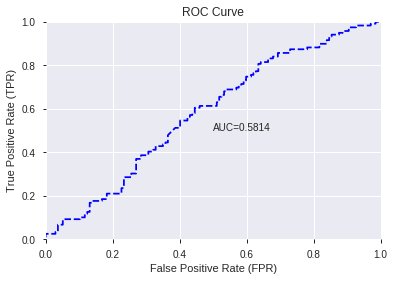

This function is available for GLM models only


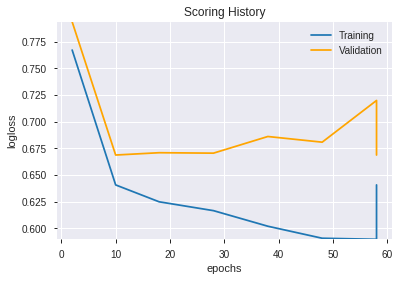

--2019-12-07 22:49:29--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.27.188
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.27.188|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_224355_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_224355_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_7_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

['SUB',
 'BOP',
 'TRANGE',
 'DIV',
 'STOCHF_fastk',
 'CDLRICKSHAWMAN',
 'CORREL_20',
 'CDLSHORTLINE',
 'CDLGRAVESTONEDOJI',
 'SAREXT',
 'is_quarter_start',
 'MINUS_DM_8',
 'ATR_24',
 'NATR_24',
 'weekday',
 'ATR_30',
 'dayofyear',
 'aroondown_8',
 'CDLSPINNINGTOP',
 'aroonup_24',
 'MINUS_DI_8',
 'dayofweek',
 'AROONOSC_8',
 'CDLHIGHWAVE',
 'CDLLONGLEGGEDDOJI',
 'CDLDRAGONFLYDOJI',
 'PLUS_DM_30',
 'month',
 'CDLTAKURI',
 'CDLDOJI',
 'ULTOSC',
 'days_in_month',
 'CCI_8',
 'DX_30',
 'DX_12',
 'STOCHRSI_fastd',
 'weekday_name',
 'day',
 'HT_TRENDMODE',
 'aroondown_30',
 'MACDFIX_signal_20',
 'CORREL_12',
 'aroonup_20',
 'ATR_8',
 'MACDEXT_hist',
 'STOCHRSI_fastk',
 'MACDFIX_signal_12',
 'CDLINVERTEDHAMMER',
 'aroondown_12',
 'AROONOSC_30']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_224936_model_1,0.60265,0.675131,0.393486,0.491498,0.24157


,variable,relative_importance,scaled_importance,percentage
0,DIV,2.647533,1.000000,0.225696
1,SUB,2.291410,0.865489,0.195338
2,ATR_30,0.843913,0.318755,0.071942
3,NATR_24,0.667622,0.252167,0.056913
4,STOCHF_fastk,0.528988,0.199804,0.045095
5,BOP,0.466260,0.176111,0.039748
6,TRANGE,0.456163,0.172297,0.038887
7,ATR_8,0.333048,0.125796,0.028392
8,CDLSPINNINGTOP,0.270221,0.102065,0.023036
9,ATR_24,0.255998,0.096693,0.021823


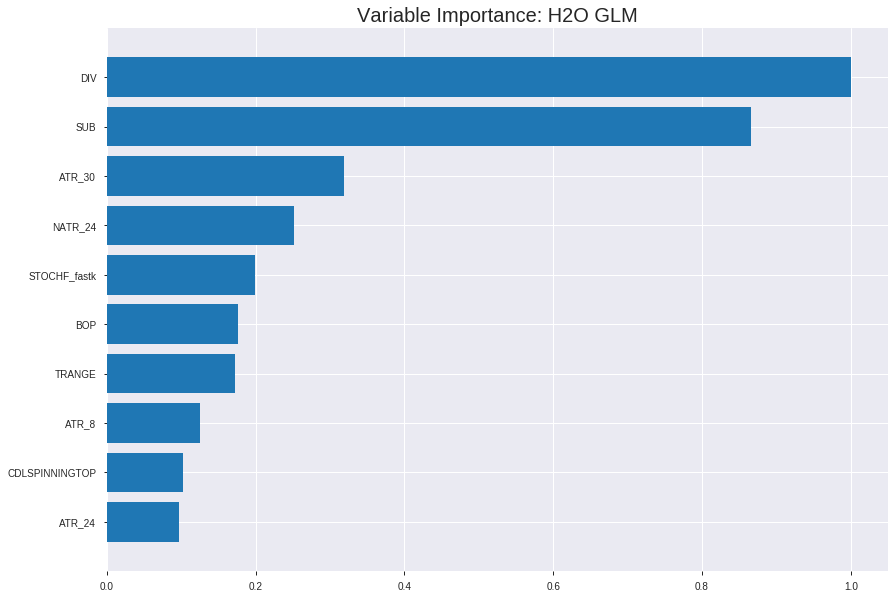

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_224936_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.22157310143919876
RMSE: 0.47071552071203127
LogLoss: 0.6315504351672123
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2474.1593649352335
Residual deviance: 2257.1612552876168
AIC: 2359.1612552876168
AUC: 0.6874855697320739
pr_auc: 0.6322645931428384
Gini: 0.37497113946414773
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3525358406713201: 


,0,1,Error,Rate
0,321.0,610.0,0.6552,(610.0/931.0)
1,80.0,776.0,0.0935,(80.0/856.0)
Total,401.0,1386.0,0.3861,(690.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3525358,0.6922391,279.0
max f2,0.2808538,0.8338344,318.0
max f0point5,0.4530178,0.6259874,216.0
max accuracy,0.4530178,0.6418579,216.0
max precision,0.9999623,1.0,0.0
max recall,0.1068740,1.0,387.0
max specificity,0.9999623,1.0,0.0
max absolute_mcc,0.3525358,0.3009586,279.0
max min_per_class_accuracy,0.4908322,0.6261682,187.0
max mean_per_class_accuracy,0.4530178,0.6458373,216.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8274934,1.8556594,1.8556594,0.8888889,0.8730802,0.8888889,0.8730802,0.0186916,0.0186916,85.5659398,85.5659398
,2,0.0201455,0.7875425,1.2757658,1.5657126,0.6111111,0.8092055,0.75,0.8411429,0.0128505,0.0315421,27.5765836,56.5712617
,3,0.0302182,0.7664764,1.2757658,1.4690637,0.6111111,0.7739770,0.7037037,0.8187543,0.0128505,0.0443925,27.5765836,46.9063690
,4,0.0402910,0.7474540,1.6237020,1.5077233,0.7777778,0.7547431,0.7222222,0.8027515,0.0163551,0.0607477,62.3701973,50.7723261
,5,0.0503637,0.7292927,1.5077233,1.5077233,0.7222222,0.7380221,0.7222222,0.7898056,0.0151869,0.0759346,50.7723261,50.7723261
,6,0.1001679,0.6805293,1.3604694,1.4345076,0.6516854,0.7065431,0.6871508,0.7484069,0.0677570,0.1436916,36.0469390,43.4507649
,7,0.1499720,0.6385077,1.2666439,1.3787619,0.6067416,0.6577300,0.6604478,0.7182941,0.0630841,0.2067757,26.6643915,37.8761857
,8,0.2003358,0.6158481,1.3917445,1.3820257,0.6666667,0.6276261,0.6620112,0.6955004,0.0700935,0.2768692,39.1744548,38.2025662
,9,0.2999440,0.5717929,1.2549157,1.3398138,0.6011236,0.5940462,0.6417910,0.6618085,0.125,0.4018692,25.4915730,33.9813782
,10,0.4001119,0.5297951,1.1779290,1.2992860,0.5642458,0.5502000,0.6223776,0.6338674,0.1179907,0.5198598,17.7929045,29.9285994




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.23834130438835643
RMSE: 0.48820211428091587
LogLoss: 0.6677049472935596
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 707.3655748698118
Residual deviance: 682.394456134018
AIC: 784.394456134018
AUC: 0.6160281205869712
pr_auc: 0.5820938800604741
Gini: 0.2320562411739424
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2870170397193977: 


,0,1,Error,Rate
0,45.0,222.0,0.8315,(222.0/267.0)
1,9.0,235.0,0.0369,(9.0/244.0)
Total,54.0,457.0,0.4521,(231.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2870170,0.6704708,350.0
max f2,0.2390539,0.8333333,377.0
max f0point5,0.4186516,0.5796089,227.0
max accuracy,0.4186516,0.5909980,227.0
max precision,0.6460627,0.9411765,14.0
max recall,0.2390539,1.0,377.0
max specificity,0.7665345,0.9962547,0.0
max absolute_mcc,0.2826079,0.2141146,357.0
max min_per_class_accuracy,0.4466255,0.5778689,192.0
max mean_per_class_accuracy,0.4186516,0.5948456,227.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 43.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6931086,1.7452186,1.7452186,0.8333333,0.7222856,0.8333333,0.7222856,0.0204918,0.0204918,74.5218579,74.5218579
,2,0.0215264,0.6623208,2.0942623,1.9038748,1.0,0.6736924,0.9090909,0.7001978,0.0204918,0.0409836,109.4262295,90.3874814
,3,0.0313112,0.6512686,2.0942623,1.9633709,1.0,0.6568727,0.9375,0.6866587,0.0204918,0.0614754,109.4262295,96.3370902
,4,0.0410959,0.6327339,1.2565574,1.7950820,0.6,0.6422894,0.8571429,0.6760946,0.0122951,0.0737705,25.6557377,79.5081967
,5,0.0508806,0.6127369,0.4188525,1.5304224,0.2,0.6222170,0.7307692,0.6657335,0.0040984,0.0778689,-58.1147541,53.0422446
,6,0.1017613,0.5687956,1.2082282,1.3693253,0.5769231,0.5881634,0.6538462,0.6269484,0.0614754,0.1393443,20.8228247,36.9325347
,7,0.1506849,0.5554219,1.0890164,1.2783159,0.52,0.5619295,0.6103896,0.6058384,0.0532787,0.1926230,8.9016393,27.8315946
,8,0.2015656,0.5340340,1.0471311,1.2199586,0.5,0.5430730,0.5825243,0.5899947,0.0532787,0.2459016,4.7131148,21.9958618
,9,0.3013699,0.5077843,1.1908550,1.2103204,0.5686275,0.5201760,0.5779221,0.5668729,0.1188525,0.3647541,19.0855031,21.0320417
,10,0.4011742,0.4724103,0.9444712,1.1441823,0.4509804,0.4903340,0.5463415,0.5478316,0.0942623,0.4590164,-5.5528769,14.4182327



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 22:49:36,0.000 sec,2,.75E1,51,1.3769411,1.3814468
,2019-12-07 22:49:36,0.029 sec,4,.46E1,51,1.3730506,1.3799986
,2019-12-07 22:49:36,0.046 sec,6,.29E1,51,1.3676430,1.3780028
,2019-12-07 22:49:36,0.069 sec,8,.18E1,51,1.3605732,1.3754758
,2019-12-07 22:49:36,0.084 sec,10,.11E1,51,1.3519645,1.3726238
---,---,---,---,---,---,---,---
,2019-12-07 22:49:36,0.316 sec,46,.21E-3,51,1.2622019,1.3354410
,2019-12-07 22:49:36,0.332 sec,48,.13E-3,51,1.2616733,1.3359037
,2019-12-07 22:49:36,0.343 sec,49,.81E-4,51,1.2613792,1.3365472
,2019-12-07 22:49:36,0.353 sec,50,.5E-4,51,1.2612124,1.3372570



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.61328125)

('F1', 0.6687500000000001)

('auc', 0.6026498190517083)

('logloss', 0.6751311744029975)

('mean_per_class_error', 0.3745629638716801)

('rmse', 0.4914975424739984)

('mse', 0.24156983425797984)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           0
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


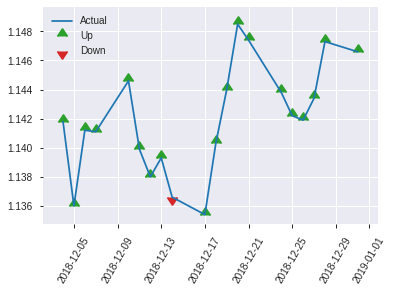


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.24156983425797984
RMSE: 0.4914975424739984
LogLoss: 0.6751311744029975
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 353.8308882659767
Residual deviance: 345.66716129433473
AIC: 447.66716129433473
AUC: 0.6026498190517083
pr_auc: 0.5037921340712224
Gini: 0.20529963810341667
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35929239961993137: 


,0,1,Error,Rate
0,43.0,94.0,0.6861,(94.0/137.0)
1,12.0,107.0,0.1008,(12.0/119.0)
Total,55.0,201.0,0.4141,(106.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3592924,0.6687500,200.0
max f2,0.2714510,0.8193277,237.0
max f0point5,0.4063850,0.5944931,169.0
max accuracy,0.4063850,0.6132812,169.0
max precision,0.4063850,0.5588235,169.0
max recall,0.2282516,1.0,250.0
max specificity,0.7784086,0.9927007,0.0
max absolute_mcc,0.4063850,0.2649207,169.0
max min_per_class_accuracy,0.4607425,0.5766423,126.0
max mean_per_class_accuracy,0.4063850,0.6254370,169.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 44.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7075208,0.0,0.0,0.0,0.7377357,0.0,0.7377357,0.0,0.0,-100.0,-100.0
,2,0.0234375,0.6895428,0.7170868,0.3585434,0.3333333,0.6940879,0.1666667,0.7159118,0.0084034,0.0084034,-28.2913165,-64.1456583
,3,0.03125,0.6732828,2.1512605,0.8067227,1.0,0.6796550,0.375,0.7068476,0.0168067,0.0252101,115.1260504,-19.3277311
,4,0.0429688,0.6326982,0.7170868,0.7822765,0.3333333,0.6493704,0.3636364,0.6911720,0.0084034,0.0336134,-28.2913165,-21.7723453
,5,0.0507812,0.6192982,1.0756303,0.8274079,0.5,0.6247485,0.3846154,0.6809530,0.0084034,0.0420168,7.5630252,-17.2592114
,6,0.1015625,0.5824185,0.9928895,0.9101487,0.4615385,0.5948502,0.4230769,0.6379016,0.0504202,0.0924370,-0.7110537,-8.9851325
,7,0.1523438,0.5683919,1.1583710,0.9928895,0.5384615,0.5753378,0.4615385,0.6170470,0.0588235,0.1512605,15.8371041,-0.7110537
,8,0.203125,0.5426434,1.3238526,1.0756303,0.6153846,0.5532474,0.5,0.6010971,0.0672269,0.2184874,32.3852618,7.5630252
,9,0.3007812,0.5075845,1.1186555,1.0895995,0.52,0.5253448,0.5064935,0.5765022,0.1092437,0.3277311,11.8655462,8.9599476
,10,0.4023438,0.4855869,1.2411118,1.1278453,0.5769231,0.4966170,0.5242718,0.5563370,0.1260504,0.4537815,24.1111829,12.7845313


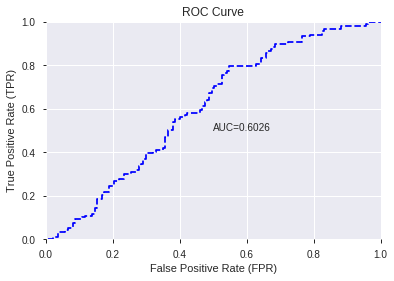

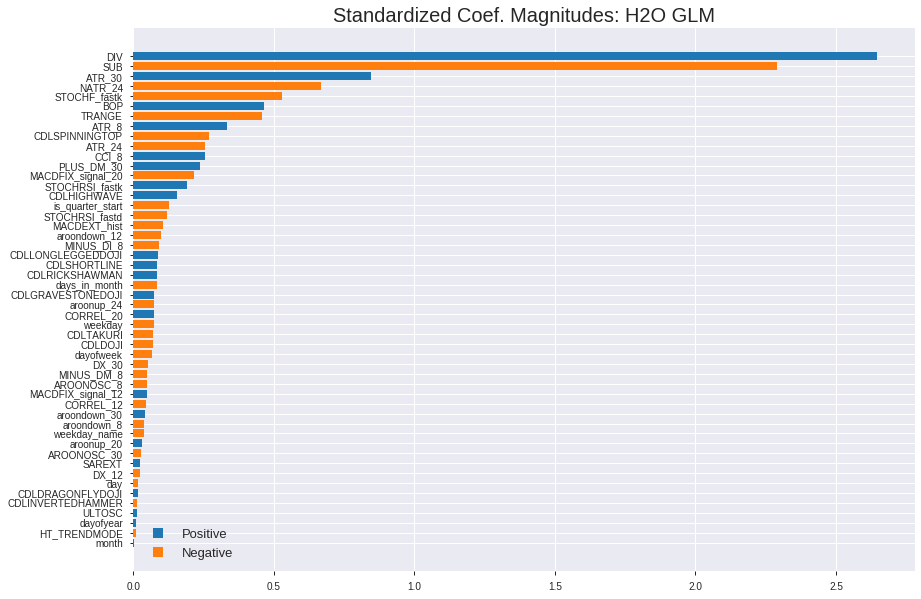

'log_likelihood'
--2019-12-07 22:49:41--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.176.211
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.176.211|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_224936_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_224936_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_12_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_12_s

['DIV',
 'SUB',
 'ATR_30',
 'NATR_24',
 'STOCHF_fastk',
 'BOP',
 'TRANGE',
 'ATR_8',
 'CDLSPINNINGTOP',
 'ATR_24',
 'CCI_8',
 'PLUS_DM_30',
 'MACDFIX_signal_20',
 'STOCHRSI_fastk',
 'CDLHIGHWAVE',
 'is_quarter_start',
 'STOCHRSI_fastd',
 'MACDEXT_hist',
 'aroondown_12',
 'MINUS_DI_8',
 'CDLLONGLEGGEDDOJI',
 'CDLSHORTLINE',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'CDLGRAVESTONEDOJI',
 'aroonup_24',
 'CORREL_20',
 'weekday',
 'CDLTAKURI',
 'CDLDOJI',
 'dayofweek',
 'DX_30',
 'MINUS_DM_8',
 'AROONOSC_8',
 'MACDFIX_signal_12',
 'CORREL_12',
 'aroondown_30',
 'aroondown_8',
 'weekday_name',
 'aroonup_20',
 'AROONOSC_30',
 'SAREXT',
 'DX_12',
 'day',
 'CDLDRAGONFLYDOJI',
 'CDLINVERTEDHAMMER',
 'ULTOSC',
 'dayofyear',
 'HT_TRENDMODE',
 'month']

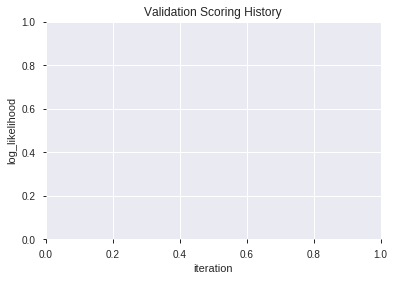

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_224947_model_4,0.640741,0.660097,0.375790,0.483775,0.234038
1,XGBoost_grid_1_AutoML_20191207_224947_model_3,0.632706,0.659992,0.405876,0.484018,0.234273
2,XGBoost_grid_1_AutoML_20191207_224947_model_6,0.625590,0.664659,0.440716,0.486175,0.236366
3,XGBoost_grid_1_AutoML_20191207_224947_model_7,0.623566,0.666247,0.381433,0.487252,0.237415
4,XGBoost_2_AutoML_20191207_224947,0.617003,0.670743,0.419923,0.489289,0.239404
5,XGBoost_grid_1_AutoML_20191207_224947_model_2,0.616758,0.670423,0.431976,0.488839,0.238963
6,XGBoost_3_AutoML_20191207_224947,0.616144,0.665609,0.398577,0.486851,0.237024
7,XGBoost_grid_1_AutoML_20191207_224947_model_1,0.608170,0.670462,0.402779,0.489417,0.239529
8,XGBoost_grid_1_AutoML_20191207_224947_model_5,0.601730,0.691910,0.425566,0.498653,0.248655
9,XGBoost_1_AutoML_20191207_224947,0.598049,0.680672,0.389284,0.493882,0.243919


,variable,relative_importance,scaled_importance,percentage
0,BOP,445.988647,1.000000,0.122966
1,DIV,266.109436,0.596673,0.073371
2,SUB,225.724991,0.506123,0.062236
3,CORREL_20,175.098145,0.392607,0.048277
4,ULTOSC,155.752106,0.349229,0.042943
5,STOCHF_fastk,154.935532,0.347398,0.042718
6,TRANGE,150.751846,0.338017,0.041565
7,aroondown_8,134.113449,0.300710,0.036977
8,NATR_24,126.648872,0.283973,0.034919
9,DX_30,106.190147,0.238101,0.029278


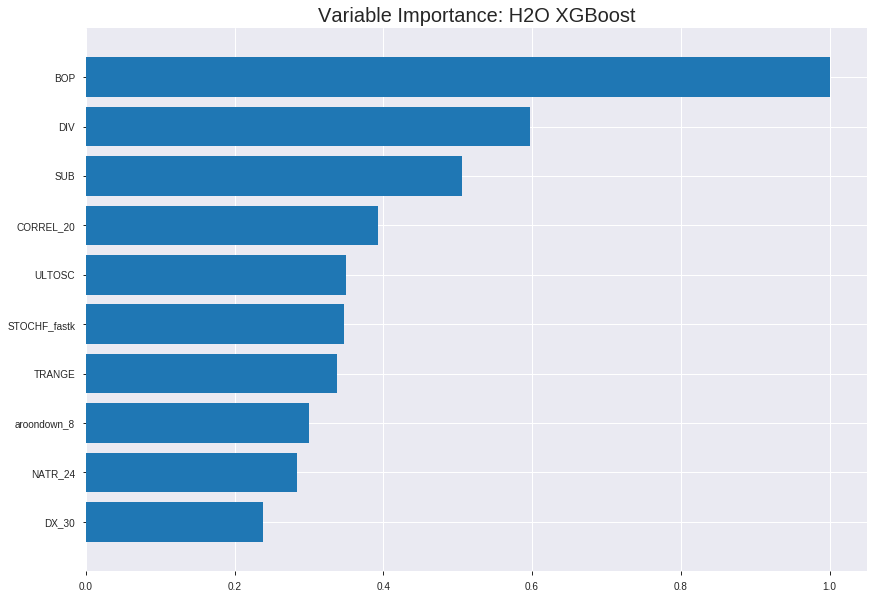

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_224947_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.2038354475351532
RMSE: 0.45148139223577444
LogLoss: 0.5965126374857446
Mean Per-Class Error: 0.27590484053926534
AUC: 0.7913853810092655
pr_auc: 0.7619126221254187
Gini: 0.582770762018531
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4627555211385091: 


,0,1,Error,Rate
0,556.0,375.0,0.4028,(375.0/931.0)
1,135.0,721.0,0.1577,(135.0/856.0)
Total,691.0,1096.0,0.2854,(510.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4627555,0.7387295,210.0
max f2,0.3908269,0.8470002,271.0
max f0point5,0.4865210,0.7014768,190.0
max accuracy,0.4865210,0.7218802,190.0
max precision,0.7471979,1.0,0.0
max recall,0.2113421,1.0,380.0
max specificity,0.7471979,1.0,0.0
max absolute_mcc,0.4702989,0.4530512,204.0
max min_per_class_accuracy,0.5013946,0.7114486,174.0
max mean_per_class_accuracy,0.4865210,0.7240952,190.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7030566,2.0876168,2.0876168,1.0,0.7186864,1.0,0.7186864,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.6779581,1.6237020,1.8556594,0.7777778,0.6929933,0.8888889,0.7058399,0.0163551,0.0373832,62.3701973,85.5659398
,3,0.0302182,0.6684150,2.0876168,1.9329785,1.0,0.6732415,0.9259259,0.6949738,0.0210280,0.0584112,108.7616822,93.2978539
,4,0.0402910,0.6596936,1.7396807,1.8846541,0.8333333,0.6639690,0.9027778,0.6872226,0.0175234,0.0759346,73.9680685,88.4654076
,5,0.0503637,0.6501498,1.9716381,1.9020509,0.9444444,0.6545274,0.9111111,0.6806835,0.0198598,0.0957944,97.1638110,90.2050883
,6,0.1001679,0.6268558,1.8295968,1.8660262,0.8764045,0.6376286,0.8938547,0.6592763,0.0911215,0.1869159,82.9596766,86.6026210
,7,0.1499720,0.6065958,1.7123149,1.8149803,0.8202247,0.6165312,0.8694030,0.6450811,0.0852804,0.2721963,71.2314922,81.4980297
,8,0.2003358,0.5883633,1.4381360,1.7202429,0.6888889,0.5960867,0.8240223,0.6327641,0.0724299,0.3446262,43.8136033,72.0242912
,9,0.2999440,0.5582560,1.3018285,1.5812918,0.6235955,0.5717562,0.7574627,0.6125040,0.1296729,0.4742991,30.1828468,58.1291847
,10,0.4001119,0.5280055,1.2712304,1.5036681,0.6089385,0.5430929,0.7202797,0.5951270,0.1273364,0.6016355,27.1230356,50.3668061




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.23312835552996267
RMSE: 0.48283367273830713
LogLoss: 0.6578695676284909
Mean Per-Class Error: 0.3885077055320194
AUC: 0.6437649659237429
pr_auc: 0.594883175752163
Gini: 0.28752993184748576
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33598753809928894: 


,0,1,Error,Rate
0,37.0,230.0,0.8614,(230.0/267.0)
1,4.0,240.0,0.0164,(4.0/244.0)
Total,41.0,470.0,0.4579,(234.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3359875,0.6722689,361.0
max f2,0.3137097,0.8333333,370.0
max f0point5,0.5107220,0.59375,169.0
max accuracy,0.5116350,0.6144814,168.0
max precision,0.7021382,1.0,0.0
max recall,0.2960257,1.0,377.0
max specificity,0.7021382,1.0,0.0
max absolute_mcc,0.4377437,0.2270093,266.0
max min_per_class_accuracy,0.4914213,0.5860656,195.0
max mean_per_class_accuracy,0.5107220,0.6114923,169.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6749937,2.0942623,2.0942623,1.0,0.6875672,1.0,0.6875672,0.0245902,0.0245902,109.4262295,109.4262295
,2,0.0215264,0.6620907,0.8377049,1.5230999,0.4,0.6690572,0.7272727,0.6791535,0.0081967,0.0327869,-16.2295082,52.3099851
,3,0.0313112,0.6547396,0.8377049,1.3089139,0.4,0.6585622,0.625,0.6727187,0.0081967,0.0409836,-16.2295082,30.8913934
,4,0.0410959,0.6425092,0.8377049,1.1967213,0.4,0.6487675,0.5714286,0.6670161,0.0081967,0.0491803,-16.2295082,19.6721311
,5,0.0508806,0.6359643,1.6754098,1.2887768,0.8,0.6394667,0.6153846,0.6617181,0.0163934,0.0655738,67.5409836,28.8776797
,6,0.1017613,0.5997765,1.2082282,1.2485025,0.5769231,0.6160703,0.5961538,0.6388942,0.0614754,0.1270492,20.8228247,24.8502522
,7,0.1506849,0.5842441,1.5078689,1.3327124,0.72,0.5939435,0.6363636,0.6242998,0.0737705,0.2008197,50.7868852,33.2712370
,8,0.2015656,0.5689542,1.2887768,1.3216218,0.6153846,0.5770587,0.6310680,0.6123749,0.0655738,0.2663934,28.8776797,32.1621837
,9,0.3013699,0.5443879,1.2729830,1.3055142,0.6078431,0.5565472,0.6233766,0.5938865,0.1270492,0.3934426,27.2982964,30.5514158
,10,0.4011742,0.5177857,1.1908550,1.2769892,0.5686275,0.5296389,0.6097561,0.5779029,0.1188525,0.5122951,19.0855031,27.6989204



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:49:54,1.875 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5209849,0.5,0.6931472,0.5,0.0,1.0,0.5225049
,2019-12-07 22:49:54,1.925 sec,5.0,0.4912263,0.6757107,0.7047850,0.6649053,1.7579931,0.3933968,0.4956895,0.6845444,0.6144011,0.5484885,1.7452186,0.4696673
,2019-12-07 22:49:54,1.965 sec,10.0,0.4845202,0.6624624,0.7325557,0.6899973,1.6237020,0.3463906,0.4931841,0.6795400,0.6254682,0.5645345,1.3961749,0.4540117
,2019-12-07 22:49:54,2.007 sec,15.0,0.4781729,0.6499230,0.7478562,0.7057437,1.7396807,0.3374370,0.4908913,0.6749202,0.6279471,0.5685727,1.0471311,0.4442270
,2019-12-07 22:49:54,2.068 sec,20.0,0.4726251,0.6389134,0.7575320,0.7173893,1.8556594,0.3273643,0.4876864,0.6684552,0.6438417,0.5935973,2.0942623,0.4500978
,2019-12-07 22:49:54,2.117 sec,25.0,0.4680856,0.6298128,0.7627746,0.7237992,1.9716381,0.3133744,0.4855012,0.6639859,0.6510637,0.5977464,1.7452186,0.4579256
,2019-12-07 22:49:54,2.167 sec,30.0,0.4643866,0.6223646,0.7648098,0.7256503,1.9716381,0.3055400,0.4843198,0.6614754,0.6491680,0.5971622,1.7452186,0.4422701
,2019-12-07 22:49:54,2.222 sec,35.0,0.4603796,0.6142991,0.7723312,0.7338088,1.8556594,0.3105764,0.4827548,0.6582035,0.6545251,0.5996506,1.7452186,0.4344423
,2019-12-07 22:49:54,2.287 sec,40.0,0.4575573,0.6085433,0.7769187,0.7394174,1.9716381,0.3005036,0.4821466,0.6568109,0.6536502,0.5967796,1.3961749,0.4363992
,2019-12-07 22:49:54,2.347 sec,45.0,0.4546572,0.6027707,0.7834080,0.7506484,1.9716381,0.2887521,0.4826443,0.6575973,0.6470575,0.5933164,1.7452186,0.4618395


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,445.9886475,1.0,0.1229663
DIV,266.1094360,0.5966731,0.0733707
SUB,225.7249908,0.5061227,0.0622360
CORREL_20,175.0981445,0.3926067,0.0482774
ULTOSC,155.7521057,0.3492289,0.0429434
---,---,---,---
CDLDOJI,9.8611021,0.0221107,0.0027189
CDLSHORTLINE,8.8669662,0.0198816,0.0024448
month,8.0660877,0.0180859,0.0022240
CDLSPINNINGTOP,7.1793094,0.0160975,0.0019795



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.625)

('F1', 0.6773162939297125)

('auc', 0.6407409679200147)

('logloss', 0.6600966118552023)

('mean_per_class_error', 0.3647181500337361)

('rmse', 0.48377465119292684)

('mse', 0.23403791313683803)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


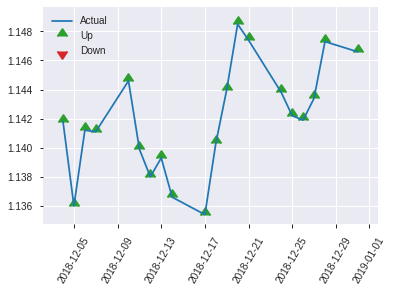


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23403791313683803
RMSE: 0.48377465119292684
LogLoss: 0.6600966118552023
Mean Per-Class Error: 0.3647181500337361
AUC: 0.6407409679200147
pr_auc: 0.5629484952020607
Gini: 0.28148193584002934
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4066968858242035: 


,0,1,Error,Rate
0,49.0,88.0,0.6423,(88.0/137.0)
1,13.0,106.0,0.1092,(13.0/119.0)
Total,62.0,194.0,0.3945,(101.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4066969,0.6773163,193.0
max f2,0.2167313,0.8139535,254.0
max f0point5,0.4451165,0.6031128,162.0
max accuracy,0.4451165,0.625,162.0
max precision,0.7164758,1.0,0.0
max recall,0.2167313,1.0,254.0
max specificity,0.7164758,1.0,0.0
max absolute_mcc,0.4066969,0.2892175,193.0
max min_per_class_accuracy,0.4825768,0.6134454,124.0
max mean_per_class_accuracy,0.4451165,0.6352818,162.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 47.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6905075,1.4341737,1.4341737,0.6666667,0.7050639,0.6666667,0.7050639,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.6506450,1.4341737,1.4341737,0.6666667,0.6634795,0.6666667,0.6842717,0.0168067,0.0336134,43.4173669,43.4173669
,3,0.03125,0.6415566,0.0,1.0756303,0.0,0.6421621,0.5,0.6737443,0.0,0.0336134,-100.0,7.5630252
,4,0.0429688,0.6318472,2.1512605,1.3689840,1.0,0.6370714,0.6363636,0.6637426,0.0252101,0.0588235,115.1260504,36.8983957
,5,0.0507812,0.6263019,2.1512605,1.4893342,1.0,0.6295299,0.6923077,0.6584791,0.0168067,0.0756303,115.1260504,48.9334195
,6,0.1015625,0.5964788,1.1583710,1.3238526,0.5384615,0.6131456,0.6153846,0.6358123,0.0588235,0.1344538,15.8371041,32.3852618
,7,0.1523438,0.5815742,0.8274079,1.1583710,0.3846154,0.5891138,0.5384615,0.6202462,0.0420168,0.1764706,-17.2592114,15.8371041
,8,0.203125,0.5607691,1.1583710,1.1583710,0.5384615,0.5685825,0.5384615,0.6073303,0.0588235,0.2352941,15.8371041,15.8371041
,9,0.3007812,0.5331324,1.2047059,1.1734148,0.56,0.5462325,0.5454545,0.5874933,0.1176471,0.3529412,20.4705882,17.3414820
,10,0.4023438,0.5042052,1.4893342,1.2531615,0.6923077,0.5195964,0.5825243,0.5703543,0.1512605,0.5042017,48.9334195,25.3161459


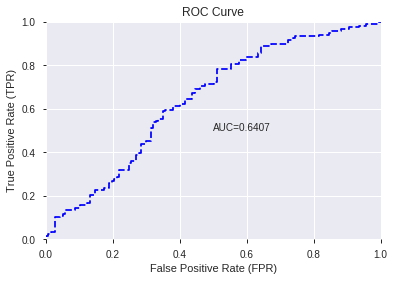

This function is available for GLM models only


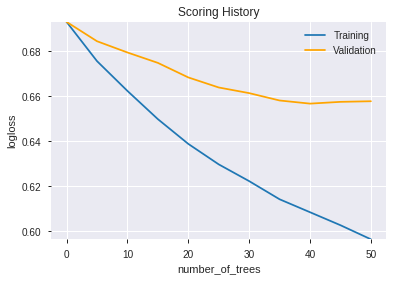

--2019-12-07 22:50:03--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.114.27
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.114.27|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_224947_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_224947_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_17_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'SUB',
 'CORREL_20',
 'ULTOSC',
 'STOCHF_fastk',
 'TRANGE',
 'aroondown_8',
 'NATR_24',
 'DX_30',
 'MINUS_DI_8',
 'ATR_30',
 'day',
 'CCI_8',
 'CORREL_12',
 'PLUS_DM_30',
 'DX_12',
 'SAREXT',
 'MINUS_DM_8',
 'STOCHRSI_fastd',
 'ATR_24',
 'ATR_8',
 'MACDEXT_hist',
 'CDLDRAGONFLYDOJI',
 'AROONOSC_30',
 'dayofweek',
 'dayofyear',
 'aroondown_30',
 'aroonup_20',
 'MACDFIX_signal_20',
 'aroonup_24',
 'aroondown_12',
 'CDLRICKSHAWMAN',
 'STOCHRSI_fastk',
 'AROONOSC_8',
 'CDLGRAVESTONEDOJI',
 'MACDFIX_signal_12',
 'days_in_month',
 'CDLHIGHWAVE',
 'weekday_name',
 'CDLTAKURI',
 'CDLDOJI',
 'CDLSHORTLINE',
 'month',
 'CDLSPINNINGTOP',
 'HT_TRENDMODE']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [15]:
# DRF with top DeepLearning features
model_train(feature_name='DLF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_grid_1_AutoML_20191207_225031_model_1,0.627737,0.679194,0.396031,0.493029,0.243078
1,GBM_5_AutoML_20191207_225031,0.624364,0.663786,0.390174,0.485752,0.235955
2,GBM_3_AutoML_20191207_225031,0.619334,0.680189,0.439612,0.493009,0.243058
3,GBM_grid_1_AutoML_20191207_225031_model_5,0.611237,0.689207,0.372140,0.498029,0.248032
4,GBM_2_AutoML_20191207_225031,0.607864,0.679473,0.395479,0.492960,0.243009
5,GBM_4_AutoML_20191207_225031,0.595780,0.702704,0.401889,0.502671,0.252678
6,GBM_1_AutoML_20191207_225031,0.588174,0.687949,0.419923,0.496928,0.246938
7,GBM_grid_1_AutoML_20191207_225031_model_3,0.586334,0.951608,0.439827,0.555732,0.308838
8,GBM_grid_1_AutoML_20191207_225031_model_2,0.584555,0.682976,0.446360,0.494927,0.244952
9,GBM_grid_1_AutoML_20191207_225031_model_4,0.574680,0.686016,0.437067,0.496438,0.246451


,variable,relative_importance,scaled_importance,percentage
0,BOP,291.243347,1.000000,0.082780
1,DIV,166.352386,0.571180,0.047283
2,STOCHF_fastk,149.084381,0.511889,0.042374
3,TRANGE,144.642761,0.496639,0.041112
4,SUB,126.772842,0.435282,0.036033
5,ULTOSC,116.698555,0.400691,0.033169
6,ATR_24,114.402046,0.392806,0.032517
7,CCI_8,112.574867,0.386532,0.031997
8,DX_30,112.513809,0.386322,0.031980
9,aroondown_12,103.820610,0.356474,0.029509


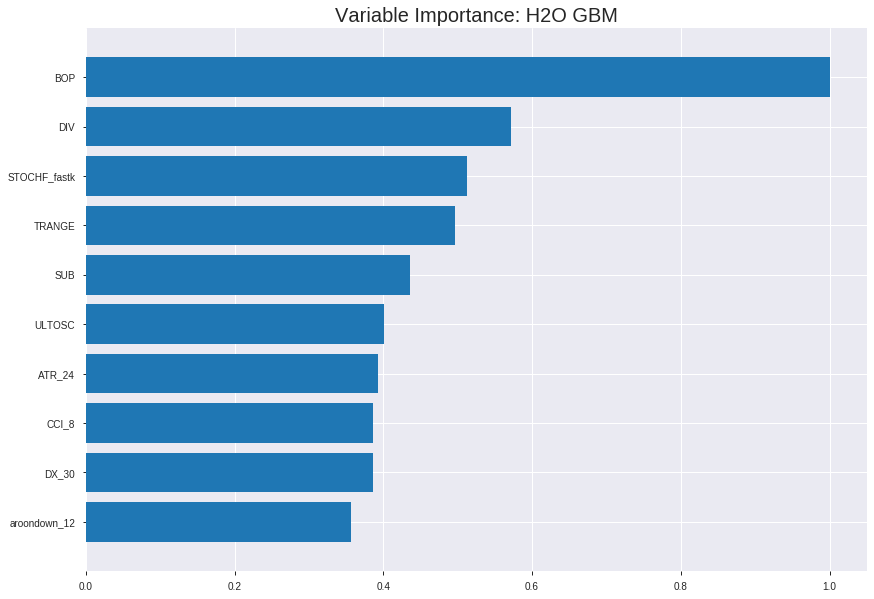

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_grid_1_AutoML_20191207_225031_model_1


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.20957864282713154
RMSE: 0.4577976002854663
LogLoss: 0.6116790215778745
Mean Per-Class Error: 0.04536437053916498
AUC: 0.9908581115673027
pr_auc: 0.9891935129866023
Gini: 0.9817162231346055
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4926506536122865: 


,0,1,Error,Rate
0,902.0,29.0,0.0311,(29.0/931.0)
1,51.0,805.0,0.0596,(51.0/856.0)
Total,953.0,834.0,0.0448,(80.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4926507,0.9526627,166.0
max f2,0.4762144,0.9632403,201.0
max f0point5,0.4951648,0.9640762,160.0
max accuracy,0.4926507,0.9552322,166.0
max precision,0.5981375,1.0,0.0
max recall,0.4558618,1.0,245.0
max specificity,0.5981375,1.0,0.0
max absolute_mcc,0.4926507,0.9104911,166.0
max min_per_class_accuracy,0.4899233,0.9509346,171.0
max mean_per_class_accuracy,0.4926507,0.9546356,166.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.5661176,2.0876168,2.0876168,1.0,0.5753737,1.0,0.5753737,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.5586053,2.0876168,2.0876168,1.0,0.5623271,1.0,0.5688504,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.5547968,2.0876168,2.0876168,1.0,0.5571869,1.0,0.5649626,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.5523094,2.0876168,2.0876168,1.0,0.5531010,1.0,0.5619972,0.0210280,0.0841121,108.7616822,108.7616822
,5,0.0503637,0.5491932,2.0876168,2.0876168,1.0,0.5506163,1.0,0.5597210,0.0210280,0.1051402,108.7616822,108.7616822
,6,0.1001679,0.5403388,2.0876168,2.0876168,1.0,0.5446468,1.0,0.5522260,0.1039720,0.2091121,108.7616822,108.7616822
,7,0.1499720,0.5337993,2.0876168,2.0876168,1.0,0.5370962,1.0,0.5472016,0.1039720,0.3130841,108.7616822,108.7616822
,8,0.2003358,0.5288314,2.0876168,2.0876168,1.0,0.5310423,1.0,0.5431392,0.1051402,0.4182243,108.7616822,108.7616822
,9,0.2999440,0.5163175,2.0758886,2.0837220,0.9943820,0.5231415,0.9981343,0.5364982,0.2067757,0.625,107.5888638,108.3722015
,10,0.4001119,0.5045618,1.9709902,2.0554996,0.9441341,0.5105629,0.9846154,0.5300053,0.1974299,0.8224299,97.0990184,105.5499641




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.2423286640337696
RMSE: 0.49226889403431695
LogLoss: 0.6777111169962255
Mean Per-Class Error: 0.3851154294836372
AUC: 0.6544790323570946
pr_auc: 0.5971015227478127
Gini: 0.3089580647141892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4486250854405202: 


,0,1,Error,Rate
0,57.0,210.0,0.7865,(210.0/267.0)
1,7.0,237.0,0.0287,(7.0/244.0)
Total,64.0,447.0,0.4247,(217.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4486251,0.6859624,337.0
max f2,0.4457565,0.8379888,346.0
max f0point5,0.4888086,0.5976277,163.0
max accuracy,0.4888086,0.6183953,163.0
max precision,0.5216455,0.7,26.0
max recall,0.4177342,1.0,388.0
max specificity,0.5481184,0.9962547,0.0
max absolute_mcc,0.4457565,0.2814332,346.0
max min_per_class_accuracy,0.4819339,0.6065574,192.0
max mean_per_class_accuracy,0.4888086,0.6148846,163.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5376231,1.3961749,1.3961749,0.6666667,0.5441648,0.6666667,0.5441648,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.5324189,0.8377049,1.1423249,0.4,0.5338412,0.5454545,0.5394722,0.0081967,0.0245902,-16.2295082,14.2324888
,3,0.0313112,0.5273819,2.0942623,1.4398053,1.0,0.5300855,0.6875,0.5365389,0.0204918,0.0450820,109.4262295,43.9805328
,4,0.0410959,0.5262826,1.2565574,1.3961749,0.6,0.5270162,0.6666667,0.5342716,0.0122951,0.0573770,25.6557377,39.6174863
,5,0.0508806,0.5237921,1.2565574,1.3693253,0.6,0.5251621,0.6538462,0.5325198,0.0122951,0.0696721,25.6557377,36.9325347
,6,0.1017613,0.5152317,1.2887768,1.3290511,0.6153846,0.5189025,0.6346154,0.5257111,0.0655738,0.1352459,28.8776797,32.9051072
,7,0.1506849,0.5088379,1.5078689,1.3871088,0.72,0.5118742,0.6623377,0.5212186,0.0737705,0.2090164,50.7868852,38.7108793
,8,0.2015656,0.5049489,1.2082282,1.3419545,0.5769231,0.5066700,0.6407767,0.5175462,0.0614754,0.2704918,20.8228247,34.1954480
,9,0.3013699,0.4968739,1.3140469,1.3327124,0.6274510,0.5006808,0.6363636,0.5119609,0.1311475,0.4016393,31.4046930,33.2712370
,10,0.4011742,0.4897782,1.1087271,1.2769892,0.5294118,0.4931408,0.6097561,0.5072788,0.1106557,0.5122951,10.8727097,27.6989204



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:50:37,0.026 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 22:50:37,0.101 sec,5.0,0.4919472,0.6771384,0.9325159,0.9255184,2.0876168,0.1415781,0.4983037,0.6897545,0.5914763,0.5425465,1.3961749,0.4735812
,2019-12-07 22:50:37,0.185 sec,10.0,0.4847223,0.6629744,0.9647538,0.9628410,2.0876168,0.1096810,0.4967557,0.6866657,0.6350387,0.5935021,1.7452186,0.4735812
,2019-12-07 22:50:37,0.263 sec,15.0,0.4786075,0.6511222,0.9771136,0.9754927,2.0876168,0.0884163,0.4957091,0.6845773,0.6449776,0.5935258,1.7452186,0.4422701
,2019-12-07 22:50:37,0.338 sec,20.0,0.4715097,0.6375208,0.9832157,0.9812730,2.0876168,0.0705092,0.4940593,0.6812907,0.6646405,0.6034394,1.0471311,0.4187867
,2019-12-07 22:50:37,0.411 sec,25.0,0.4646747,0.6245713,0.9882211,0.9864673,2.0876168,0.0548405,0.4932869,0.6797417,0.6530822,0.5970598,1.0471311,0.4383562
,2019-12-07 22:50:37,0.486 sec,30.0,0.4577976,0.6116790,0.9908581,0.9891935,2.0876168,0.0447678,0.4922689,0.6777111,0.6544790,0.5971015,1.3961749,0.4246575


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,291.2433472,1.0,0.0827804
DIV,166.3523865,0.5711800,0.0472825
STOCHF_fastk,149.0843811,0.5118894,0.0423744
TRANGE,144.6427612,0.4966389,0.0411120
SUB,126.7728424,0.4352815,0.0360328
---,---,---,---
CDLINVERTEDHAMMER,10.8394346,0.0372178,0.0030809
CDLLONGLEGGEDDOJI,9.9675541,0.0342241,0.0028331
CDLDOJI,9.6333475,0.0330766,0.0027381
HT_TRENDMODE,7.9197335,0.0271928,0.0022510



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.62109375)

('F1', 0.6707692307692308)

('auc', 0.6277372262773723)

('logloss', 0.6791938687454774)

('mean_per_class_error', 0.3683677850702325)

('rmse', 0.49302893951489846)

('mse', 0.2430775351991854)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


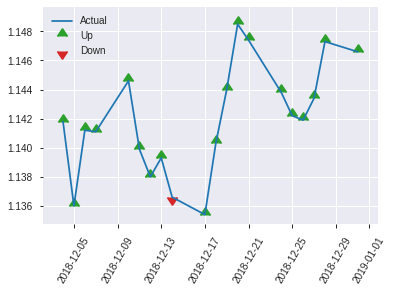


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.2430775351991854
RMSE: 0.49302893951489846
LogLoss: 0.6791938687454774
Mean Per-Class Error: 0.3683677850702325
AUC: 0.6277372262773723
pr_auc: 0.5272927613614335
Gini: 0.25547445255474455
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4530001608262146: 


,0,1,Error,Rate
0,40.0,97.0,0.708,(97.0/137.0)
1,10.0,109.0,0.084,(10.0/119.0)
Total,50.0,206.0,0.418,(107.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4530002,0.6707692,205.0
max f2,0.4026191,0.8184319,250.0
max f0point5,0.4733245,0.6,163.0
max accuracy,0.4733245,0.6210938,163.0
max precision,0.5445582,1.0,0.0
max recall,0.4026191,1.0,250.0
max specificity,0.5445582,1.0,0.0
max absolute_mcc,0.4733245,0.2736592,163.0
max min_per_class_accuracy,0.4827606,0.6058394,126.0
max mean_per_class_accuracy,0.4733245,0.6316322,163.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 47.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.5389538,0.7170868,0.7170868,0.3333333,0.5423823,0.3333333,0.5423823,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.5309664,0.7170868,0.7170868,0.3333333,0.5347193,0.3333333,0.5385508,0.0084034,0.0168067,-28.2913165,-28.2913165
,3,0.03125,0.5284406,1.0756303,0.8067227,0.5,0.5296664,0.375,0.5363297,0.0084034,0.0252101,7.5630252,-19.3277311
,4,0.0429688,0.5270248,0.7170868,0.7822765,0.3333333,0.5276894,0.3636364,0.5339733,0.0084034,0.0336134,-28.2913165,-21.7723453
,5,0.0507812,0.5262609,2.1512605,0.9928895,1.0,0.5269573,0.4615385,0.5328939,0.0168067,0.0504202,115.1260504,-0.7110537
,6,0.1015625,0.5193373,0.9928895,0.9928895,0.4615385,0.5220162,0.4615385,0.5274551,0.0504202,0.1008403,-0.7110537,-0.7110537
,7,0.1523438,0.5101031,1.6548158,1.2135316,0.7692308,0.5148141,0.5641026,0.5232414,0.0840336,0.1848739,65.4815772,21.3531566
,8,0.203125,0.5048486,1.1583710,1.1997414,0.5384615,0.5073007,0.5576923,0.5192562,0.0588235,0.2436975,15.8371041,19.9741435
,9,0.3007812,0.4974637,1.2907563,1.2292917,0.6,0.5001098,0.5714286,0.5130399,0.1260504,0.3697479,29.0756303,22.9291717
,10,0.4023438,0.4890969,1.0756303,1.1905034,0.5,0.4937894,0.5533981,0.5081805,0.1092437,0.4789916,7.5630252,19.0503386


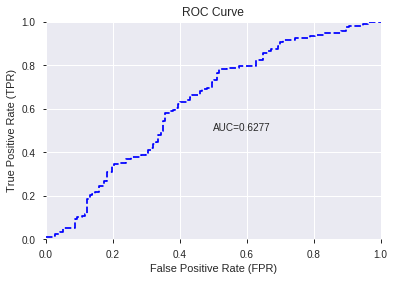

This function is available for GLM models only


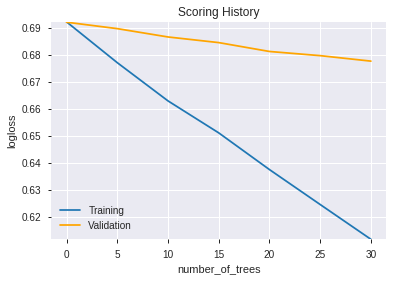

--2019-12-07 22:50:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.108.211
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.108.211|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       37
            colName:     CDLDRAGONFLYDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 5
            r

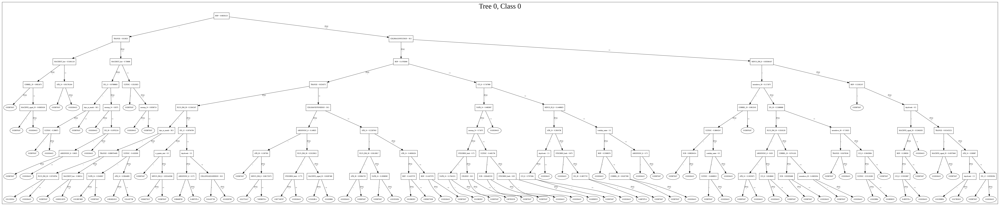

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_grid_1_AutoML_20191207_225031_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_grid_1_AutoML_20191207_225031_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_27_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_27_s

['BOP',
 'DIV',
 'STOCHF_fastk',
 'TRANGE',
 'SUB',
 'ULTOSC',
 'ATR_24',
 'CCI_8',
 'DX_30',
 'aroondown_12',
 'MACDEXT_hist',
 'STOCHRSI_fastd',
 'DX_12',
 'NATR_24',
 'ATR_30',
 'ATR_8',
 'MACDFIX_signal_20',
 'day',
 'dayofyear',
 'aroonup_24',
 'aroondown_8',
 'STOCHRSI_fastk',
 'AROONOSC_30',
 'MINUS_DI_8',
 'PLUS_DM_30',
 'MINUS_DM_8',
 'AROONOSC_8',
 'aroonup_20',
 'aroondown_30',
 'CORREL_12',
 'weekday',
 'CORREL_20',
 'SAREXT',
 'MACDFIX_signal_12',
 'month',
 'dayofweek',
 'weekday_name',
 'CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'CDLRICKSHAWMAN',
 'CDLDRAGONFLYDOJI',
 'CDLSPINNINGTOP',
 'days_in_month',
 'CDLSHORTLINE',
 'CDLHIGHWAVE',
 'CDLINVERTEDHAMMER',
 'CDLLONGLEGGEDDOJI',
 'CDLDOJI',
 'HT_TRENDMODE',
 'is_quarter_start']

In [16]:
# GBM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [17]:
# StackedEnsemble with top DeepLearning features
model_train(feature_name='DLF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191207_225053,0.624364,0.663786,0.390174,0.485752,0.235955
1,GBM_3_AutoML_20191207_225053,0.619334,0.680189,0.439612,0.493009,0.243058
2,XGBoost_2_AutoML_20191207_225053,0.617003,0.670743,0.419923,0.489289,0.239404
3,XGBoost_3_AutoML_20191207_225053,0.616144,0.665609,0.398577,0.486851,0.237024
4,GBM_2_AutoML_20191207_225053,0.607864,0.679473,0.395479,0.492960,0.243009
5,GLM_grid_1_AutoML_20191207_225053_model_1,0.602650,0.675131,0.393486,0.491498,0.241570
6,XGBoost_1_AutoML_20191207_225053,0.598049,0.680672,0.389284,0.493882,0.243919
7,GBM_4_AutoML_20191207_225053,0.595780,0.702704,0.401889,0.502671,0.252678
8,GBM_1_AutoML_20191207_225053,0.588174,0.687949,0.419923,0.496928,0.246938
9,DRF_1_AutoML_20191207_225053,0.554407,0.732013,0.451665,0.514388,0.264595


,variable,relative_importance,scaled_importance,percentage
0,BOP,72.246460,1.000000,0.136627
1,STOCHF_fastk,40.298782,0.557796,0.076210
2,DIV,29.394808,0.406868,0.055589
3,SUB,27.650719,0.382728,0.052291
4,MINUS_DI_8,22.994497,0.318279,0.043486
5,TRANGE,21.735897,0.300858,0.041105
6,ULTOSC,20.798241,0.287879,0.039332
7,STOCHRSI_fastd,20.279339,0.280697,0.038351
8,aroondown_8,18.881138,0.261343,0.035707
9,CORREL_20,15.524350,0.214880,0.029359


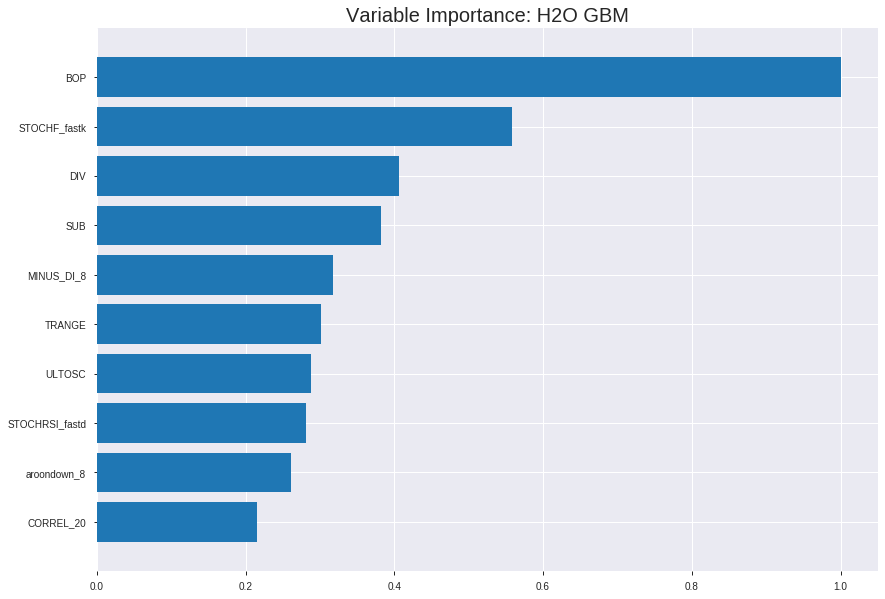

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191207_225053


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.19290448702755522
RMSE: 0.4392089332283159
LogLoss: 0.5723518700798984
Mean Per-Class Error: 0.25472434423843326
AUC: 0.8175800817129607
pr_auc: 0.7912862664883387
Gini: 0.6351601634259214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4502794823223169: 


,0,1,Error,Rate
0,561.0,370.0,0.3974,(370.0/931.0)
1,116.0,740.0,0.1355,(116.0/856.0)
Total,677.0,1110.0,0.272,(486.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4502795,0.7527976,213.0
max f2,0.3669062,0.8552768,276.0
max f0point5,0.5452412,0.7269099,134.0
max accuracy,0.4893575,0.7437045,180.0
max precision,0.7709134,1.0,0.0
max recall,0.1742160,1.0,384.0
max specificity,0.7709134,1.0,0.0
max absolute_mcc,0.4879979,0.4908427,181.0
max min_per_class_accuracy,0.5044356,0.7357680,169.0
max mean_per_class_accuracy,0.4879979,0.7452757,181.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.02 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7317349,2.0876168,2.0876168,1.0,0.7462603,1.0,0.7462603,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.7117439,1.8556594,1.9716381,0.8888889,0.7212620,0.9444444,0.7337611,0.0186916,0.0397196,85.5659398,97.1638110
,3,0.0302182,0.6952328,1.9716381,1.9716381,0.9444444,0.7035364,0.9444444,0.7236862,0.0198598,0.0595794,97.1638110,97.1638110
,4,0.0402910,0.6886552,2.0876168,2.0006328,1.0,0.6913372,0.9583333,0.7155990,0.0210280,0.0806075,108.7616822,100.0632788
,5,0.0503637,0.6800717,1.8556594,1.9716381,0.8888889,0.6849008,0.9444444,0.7094593,0.0186916,0.0992991,85.5659398,97.1638110
,6,0.1001679,0.6529373,1.7826840,1.8776889,0.8539326,0.6656093,0.8994413,0.6876568,0.0887850,0.1880841,78.2684028,87.7688874
,7,0.1499720,0.6275446,1.7592277,1.8383491,0.8426966,0.6415489,0.8805970,0.6723449,0.0876168,0.2757009,75.9227659,83.8349142
,8,0.2003358,0.6058081,1.6237020,1.7843876,0.7777778,0.6171232,0.8547486,0.6584623,0.0817757,0.3574766,62.3701973,78.4387563
,9,0.2999440,0.5668221,1.4073821,1.6591880,0.6741573,0.5866941,0.7947761,0.6346289,0.1401869,0.4976636,40.7382127,65.9187997
,10,0.4001119,0.5380609,1.2945557,1.5679024,0.6201117,0.5514038,0.7510490,0.6137935,0.1296729,0.6273364,29.4555683,56.7902425




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.2340408946583599
RMSE: 0.4837777327020745
LogLoss: 0.6594430501311014
Mean Per-Class Error: 0.38272088168477925
AUC: 0.6353226499662308
pr_auc: 0.5898192516907546
Gini: 0.27064529993246156
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2958573025612989: 


,0,1,Error,Rate
0,32.0,235.0,0.8801,(235.0/267.0)
1,3.0,241.0,0.0123,(3.0/244.0)
Total,35.0,476.0,0.4658,(238.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2958573,0.6694444,365.0
max f2,0.2709603,0.8299180,376.0
max f0point5,0.4454919,0.5993590,249.0
max accuracy,0.4758901,0.6105675,214.0
max precision,0.7493983,1.0,0.0
max recall,0.2460541,1.0,386.0
max specificity,0.7493983,1.0,0.0
max absolute_mcc,0.4454919,0.2446626,249.0
max min_per_class_accuracy,0.4941329,0.5842697,192.0
max mean_per_class_accuracy,0.4454919,0.6172791,249.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.7001964,1.0471311,1.0471311,0.5,0.7257505,0.5,0.7257505,0.0122951,0.0122951,4.7131148,4.7131148
,2,0.0215264,0.6826695,1.6754098,1.3327124,0.8,0.6892640,0.6363636,0.7091657,0.0163934,0.0286885,67.5409836,33.2712370
,3,0.0313112,0.6701526,1.6754098,1.4398053,0.8,0.6764377,0.6875,0.6989382,0.0163934,0.0450820,67.5409836,43.9805328
,4,0.0410959,0.6609327,1.6754098,1.4959016,0.8,0.6639969,0.7142857,0.6906188,0.0163934,0.0614754,67.5409836,49.5901639
,5,0.0508806,0.6521754,1.2565574,1.4498739,0.6,0.6577932,0.6923077,0.6843062,0.0122951,0.0737705,25.6557377,44.9873897
,6,0.1017613,0.6190828,1.6915195,1.5706967,0.8076923,0.6331695,0.75,0.6587379,0.0860656,0.1598361,69.1519546,57.0696721
,7,0.1506849,0.5963516,0.9214754,1.3599106,0.44,0.6071535,0.6493506,0.6419897,0.0450820,0.2049180,-7.8524590,35.9910581
,8,0.2015656,0.5810201,0.7249369,1.1996260,0.3461538,0.5883231,0.5728155,0.6284428,0.0368852,0.2418033,-27.5063052,19.9625975
,9,0.3013699,0.5471804,1.2319190,1.2103204,0.5882353,0.5614621,0.5779221,0.6062609,0.1229508,0.3647541,23.1918997,21.0320417
,10,0.4011742,0.5217378,1.2319190,1.2156937,0.5882353,0.5349095,0.5804878,0.5885100,0.1229508,0.4877049,23.1918997,21.5693723



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:51:03,0.003 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 22:51:03,0.052 sec,5.0,0.4801786,0.6538391,0.7380423,0.6896677,1.7579931,0.3486290,0.4908708,0.6748986,0.6428363,0.5785736,0.6980874,0.4657534
,2019-12-07 22:51:03,0.112 sec,10.0,0.4690904,0.6317296,0.7562389,0.7141213,1.7396807,0.3346391,0.4876182,0.6681746,0.6338951,0.5852712,1.3961749,0.4520548
,2019-12-07 22:51:03,0.175 sec,15.0,0.4601571,0.6139252,0.7745396,0.7356509,1.9716381,0.3139340,0.4857427,0.6641258,0.6342175,0.5886955,1.7452186,0.4598826
,2019-12-07 22:51:03,0.235 sec,20.0,0.4516780,0.5970776,0.7943555,0.7634835,2.0876168,0.3027420,0.4843710,0.6609833,0.6373565,0.5934596,1.0471311,0.4481409
,2019-12-07 22:51:03,0.301 sec,25.0,0.4450753,0.5839764,0.8074118,0.7811578,2.0876168,0.2714046,0.4848428,0.6616475,0.6288451,0.5824102,1.0471311,0.4500978
,2019-12-07 22:51:03,0.367 sec,30.0,0.4392089,0.5723519,0.8175801,0.7912863,2.0876168,0.2719642,0.4837777,0.6594431,0.6353226,0.5898193,1.0471311,0.4657534


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,72.2464600,1.0,0.1366273
STOCHF_fastk,40.2987823,0.5577959,0.0762101
DIV,29.3948078,0.4068685,0.0555893
SUB,27.6507187,0.3827277,0.0522910
MINUS_DI_8,22.9944973,0.3182785,0.0434855
---,---,---,---
CDLHIGHWAVE,0.0,0.0,0.0
CDLINVERTEDHAMMER,0.0,0.0,0.0
CDLLONGLEGGEDDOJI,0.0,0.0,0.0
CDLSHORTLINE,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.609375)

('F1', 0.680722891566265)

('auc', 0.6243636140587622)

('logloss', 0.6637855769283204)

('mean_per_class_error', 0.38649328344476475)

('rmse', 0.4857521919238452)

('mse', 0.23595519195882014)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


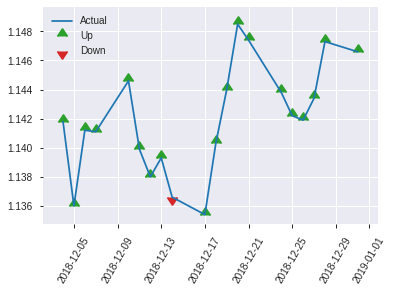


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.23595519195882014
RMSE: 0.4857521919238452
LogLoss: 0.6637855769283204
Mean Per-Class Error: 0.38649328344476475
AUC: 0.6243636140587622
pr_auc: 0.5434310913617483
Gini: 0.24872722811752435
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3488630783691681: 


,0,1,Error,Rate
0,37.0,100.0,0.7299,(100.0/137.0)
1,6.0,113.0,0.0504,(6.0/119.0)
Total,43.0,213.0,0.4141,(106.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3488631,0.6807229,212.0
max f2,0.3488631,0.8200290,212.0
max f0point5,0.4657131,0.5856515,140.0
max accuracy,0.4685974,0.609375,136.0
max precision,0.7359616,1.0,0.0
max recall,0.1724076,1.0,254.0
max specificity,0.7359616,1.0,0.0
max absolute_mcc,0.3488631,0.2930532,212.0
max min_per_class_accuracy,0.4787738,0.5985401,126.0
max mean_per_class_accuracy,0.4657131,0.6135067,140.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7121197,1.4341737,1.4341737,0.6666667,0.7293683,0.6666667,0.7293683,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.6811532,1.4341737,1.4341737,0.6666667,0.6904047,0.6666667,0.7098865,0.0168067,0.0336134,43.4173669,43.4173669
,3,0.03125,0.6727901,1.0756303,1.3445378,0.5,0.6780733,0.625,0.7019332,0.0084034,0.0420168,7.5630252,34.4537815
,4,0.0429688,0.6636669,0.7170868,1.1734148,0.3333333,0.6684396,0.5454545,0.6927986,0.0084034,0.0504202,-28.2913165,17.3414820
,5,0.0507812,0.6470974,2.1512605,1.3238526,1.0,0.6530127,0.6153846,0.6866777,0.0168067,0.0672269,115.1260504,32.3852618
,6,0.1015625,0.6167440,1.1583710,1.2411118,0.5384615,0.6308298,0.5769231,0.6587537,0.0588235,0.1260504,15.8371041,24.1111829
,7,0.1523438,0.5873864,1.1583710,1.2135316,0.5384615,0.6043479,0.5641026,0.6406185,0.0588235,0.1848739,15.8371041,21.3531566
,8,0.203125,0.5660291,1.3238526,1.2411118,0.6153846,0.5746224,0.5769231,0.6241194,0.0672269,0.2521008,32.3852618,24.1111829
,9,0.3007812,0.5274034,0.7744538,1.0895995,0.36,0.5485755,0.5064935,0.5995922,0.0756303,0.3277311,-22.5546218,8.9599476
,10,0.4023438,0.5035918,1.4893342,1.1905034,0.6923077,0.5149365,0.5533981,0.5782228,0.1512605,0.4789916,48.9334195,19.0503386


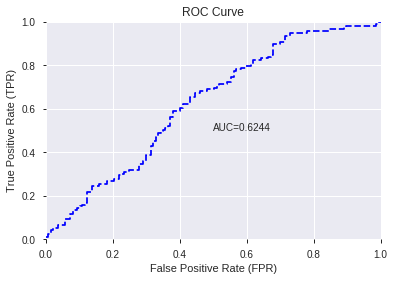

This function is available for GLM models only


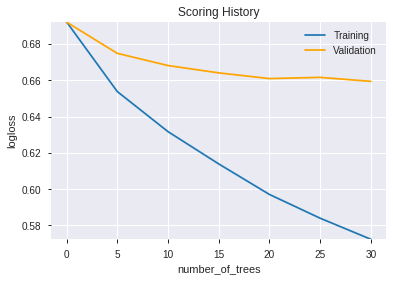

--2019-12-07 22:51:07--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.224.152
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.224.152|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       37
            colName:     CDLDRAGONFLYDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 3
            r

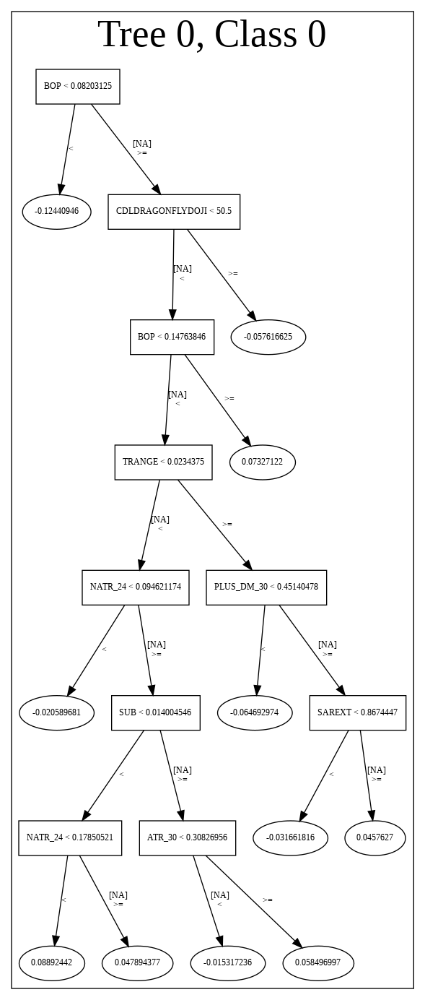

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191207_225053',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191207_225053',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_35_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_35_sid_9f32',
   'type': 'Key<

['BOP',
 'STOCHF_fastk',
 'DIV',
 'SUB',
 'MINUS_DI_8',
 'TRANGE',
 'ULTOSC',
 'STOCHRSI_fastd',
 'aroondown_8',
 'CORREL_20',
 'DX_30',
 'aroondown_12',
 'NATR_24',
 'ATR_8',
 'PLUS_DM_30',
 'ATR_24',
 'ATR_30',
 'dayofyear',
 'AROONOSC_30',
 'day',
 'CDLDRAGONFLYDOJI',
 'MACDFIX_signal_20',
 'DX_12',
 'MACDEXT_hist',
 'aroonup_24',
 'MINUS_DM_8',
 'dayofweek',
 'CORREL_12',
 'CCI_8',
 'SAREXT',
 'STOCHRSI_fastk',
 'MACDFIX_signal_12',
 'days_in_month',
 'AROONOSC_8',
 'aroonup_20',
 'CDLRICKSHAWMAN',
 'weekday',
 'weekday_name',
 'month',
 'aroondown_30',
 'CDLSPINNINGTOP',
 'is_quarter_start',
 'HT_TRENDMODE',
 'CDLDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLHIGHWAVE',
 'CDLINVERTEDHAMMER',
 'CDLLONGLEGGEDDOJI',
 'CDLSHORTLINE',
 'CDLTAKURI']

In [18]:
# All algos with top DeepLearning features
model_train(feature_name='DLF',model_algo=None,features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_225114_model_1,0.54309,0.687518,0.458965,0.497258,0.247266


,variable,relative_importance,scaled_importance,percentage
0,BOP,9.787627e-02,1.000000e+00,3.600665e-02
1,CDLRICKSHAWMAN,6.248138e-02,6.383711e-01,2.298560e-02
2,CDLSHORTLINE,5.160892e-02,5.272873e-01,1.898585e-02
3,is_quarter_start,4.438939e-02,4.535255e-01,1.632993e-02
4,CDLGRAVESTONEDOJI,4.410251e-02,4.505945e-01,1.622440e-02
...,...,...,...,...
933,MA_12_1,7.370127e-07,7.530044e-06,2.711316e-07
934,BBANDS_middleband_8_2_5,6.649595e-07,6.793878e-06,2.446248e-07
935,BBANDS_middleband_12_2_4,2.491273e-07,2.545329e-06,9.164875e-08
936,BBANDS_middleband_14_2_3,1.727521e-08,1.765005e-07,6.355191e-09


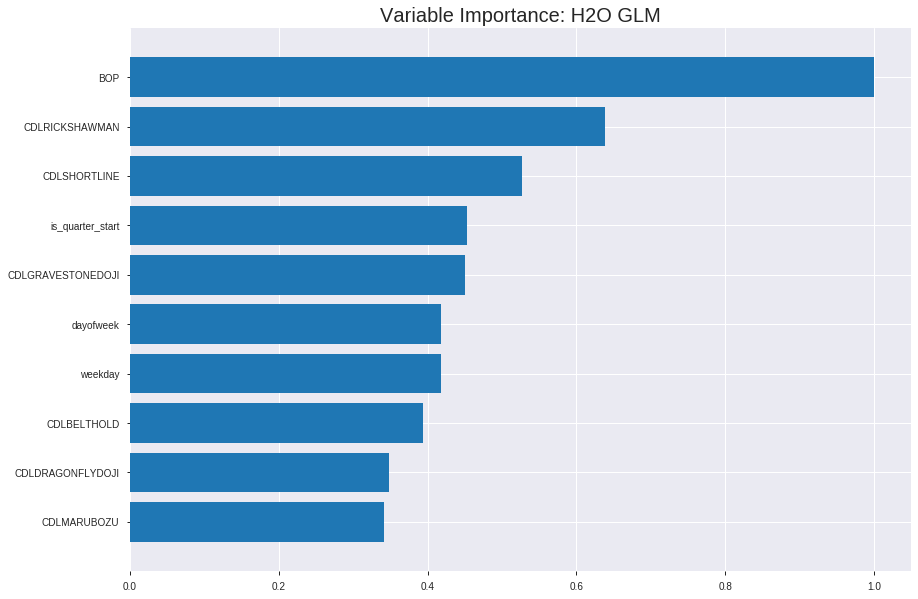

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_225114_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.23190328692784956
RMSE: 0.48156337789313836
LogLoss: 0.6559924428643918
Null degrees of freedom: 1786
Residual degrees of freedom: 849
Null deviance: 2474.1593649352335
Residual deviance: 2344.5169907973363
AIC: 4220.516990797336
AUC: 0.6688153126474398
pr_auc: 0.6267661459184501
Gini: 0.3376306252948795
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40574087873351: 


,0,1,Error,Rate
0,248.0,683.0,0.7336,(683.0/931.0)
1,65.0,791.0,0.0759,(65.0/856.0)
Total,313.0,1474.0,0.4186,(748.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4057409,0.6789700,293.0
max f2,0.3697171,0.8272313,332.0
max f0point5,0.4676440,0.6112637,212.0
max accuracy,0.4676440,0.6250699,212.0
max precision,0.9150897,1.0,0.0
max recall,0.1417458,1.0,399.0
max specificity,0.9150897,1.0,0.0
max absolute_mcc,0.4389279,0.2634692,252.0
max min_per_class_accuracy,0.4841141,0.6197637,188.0
max mean_per_class_accuracy,0.4676440,0.6292080,212.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6724346,1.9716381,1.9716381,0.9444444,0.7199016,0.9444444,0.7199016,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0201455,0.6353857,1.5077233,1.7396807,0.7222222,0.6504062,0.8333333,0.6851539,0.0151869,0.0350467,50.7723261,73.9680685
,3,0.0302182,0.6176629,1.6237020,1.7010211,0.7777778,0.6241155,0.8148148,0.6648078,0.0163551,0.0514019,62.3701973,70.1021115
,4,0.0402910,0.6074051,1.5077233,1.6526967,0.7222222,0.6120301,0.7916667,0.6516133,0.0151869,0.0665888,50.7723261,65.2696651
,5,0.0503637,0.5983806,1.5077233,1.6237020,0.7222222,0.6020022,0.7777778,0.6416911,0.0151869,0.0817757,50.7723261,62.3701973
,6,0.1001679,0.5711166,1.2431875,1.4345076,0.5955056,0.5826497,0.6871508,0.6123353,0.0619159,0.1436916,24.3187546,43.4507649
,7,0.1499720,0.5565603,1.1962748,1.3553930,0.5730337,0.5640252,0.6492537,0.5962920,0.0595794,0.2032710,19.6274808,35.5393012
,8,0.2003358,0.5410488,1.3917445,1.3645317,0.6666667,0.5494249,0.6536313,0.5845098,0.0700935,0.2733645,39.1744548,36.4531666
,9,0.2999440,0.5207263,1.2431875,1.3242346,0.5955056,0.5309107,0.6343284,0.5667101,0.1238318,0.3971963,24.3187546,32.4234552
,10,0.4001119,0.5005737,1.1196157,1.2730083,0.5363128,0.5099532,0.6097902,0.5525010,0.1121495,0.5093458,11.9615726,27.3008300




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.24715503812655856
RMSE: 0.4971468979351662
LogLoss: 0.6873567474258889
Null degrees of freedom: 510
Residual degrees of freedom: -427
Null deviance: 707.3655748698118
Residual deviance: 702.4785958692585
AIC: 2578.4785958692582
AUC: 0.5577147418186283
pr_auc: 0.5271097660724688
Gini: 0.11542948363725669
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3300686079249963: 


,0,1,Error,Rate
0,12.0,255.0,0.9551,(255.0/267.0)
1,3.0,241.0,0.0123,(3.0/244.0)
Total,15.0,496.0,0.5049,(258.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3300686,0.6513514,384.0
max f2,0.2976601,0.8232119,394.0
max f0point5,0.4383709,0.5540541,237.0
max accuracy,0.4383709,0.5596869,237.0
max precision,0.6678950,1.0,0.0
max recall,0.2976601,1.0,394.0
max specificity,0.6678950,1.0,0.0
max absolute_mcc,0.4383709,0.1318522,237.0
max min_per_class_accuracy,0.4557662,0.5450820,192.0
max mean_per_class_accuracy,0.4383709,0.5645300,237.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 45.33 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5804221,1.3961749,1.3961749,0.6666667,0.6150202,0.6666667,0.6150202,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.5727051,1.2565574,1.3327124,0.6,0.5756847,0.6363636,0.5971404,0.0122951,0.0286885,25.6557377,33.2712370
,3,0.0313112,0.5656397,1.6754098,1.4398053,0.8,0.5691079,0.6875,0.5883803,0.0163934,0.0450820,67.5409836,43.9805328
,4,0.0410959,0.5584449,1.2565574,1.3961749,0.6,0.5631188,0.6666667,0.5823656,0.0122951,0.0573770,25.6557377,39.6174863
,5,0.0508806,0.5532979,1.2565574,1.3693253,0.6,0.5549517,0.6538462,0.5770937,0.0122951,0.0696721,25.6557377,36.9325347
,6,0.1017613,0.5285366,1.1276797,1.2485025,0.5384615,0.5380267,0.5961538,0.5575602,0.0573770,0.1270492,12.7679697,24.8502522
,7,0.1506849,0.5152888,1.0890164,1.1967213,0.52,0.5212270,0.5714286,0.5457637,0.0532787,0.1803279,8.9016393,19.6721311
,8,0.2015656,0.5068227,0.9665826,1.1386280,0.4615385,0.5100596,0.5436893,0.5367510,0.0491803,0.2295082,-3.3417402,13.8628044
,9,0.3013699,0.4872574,0.8623433,1.0471311,0.4117647,0.4968462,0.5,0.5235358,0.0860656,0.3155738,-13.7656702,4.7131148
,10,0.4011742,0.4703480,1.1087271,1.0624550,0.5294118,0.4788611,0.5073171,0.5124216,0.1106557,0.4262295,10.8727097,6.2455018



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 22:51:16,0.000 sec,2,.75E1,931,1.3715677,1.3836379
,2019-12-07 22:51:17,0.988 sec,4,.54E1,935,1.3679117,1.3830212
,2019-12-07 22:51:18,1.946 sec,6,.4E1,937,1.3634719,1.3821557
,2019-12-07 22:51:19,2.902 sec,8,.29E1,937,1.3581893,1.3810267
,2019-12-07 22:51:20,3.834 sec,10,.21E1,937,1.3520442,1.3796726
,2019-12-07 22:51:21,4.795 sec,12,.15E1,937,1.3450833,1.3782109
,2019-12-07 22:51:22,5.746 sec,14,.11E1,937,1.3374179,1.3768419
,2019-12-07 22:51:23,6.697 sec,16,.81E0,937,1.3292163,1.3756218
,2019-12-07 22:51:24,7.639 sec,18,.59E0,937,1.3206688,1.3748548
,2019-12-07 22:51:25,8.614 sec,20,.43E0,938,1.3119849,1.3747135


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.55859375)

('F1', 0.6458923512747876)

('auc', 0.5430902287922468)

('logloss', 0.6875175240939578)

('mean_per_class_error', 0.441575170214071)

('rmse', 0.4972580097979278)

('mse', 0.24726552830819606)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


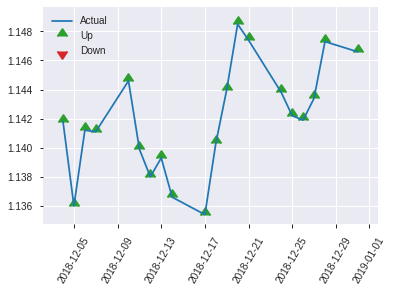


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.24726552830819606
RMSE: 0.4972580097979278
LogLoss: 0.6875175240939578
Null degrees of freedom: 255
Residual degrees of freedom: -682
Null deviance: 353.8308882659767
Residual deviance: 352.0089723361064
AIC: 2228.0089723361066
AUC: 0.5430902287922468
pr_auc: 0.4851274721051174
Gini: 0.08618045758449355
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3838293059822424: 


,0,1,Error,Rate
0,17.0,120.0,0.8759,(120.0/137.0)
1,5.0,114.0,0.042,(5.0/119.0)
Total,22.0,234.0,0.4883,(125.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3838293,0.6458924,233.0
max f2,0.3248832,0.8139535,254.0
max f0point5,0.4412412,0.5408805,168.0
max accuracy,0.4785000,0.5585938,93.0
max precision,0.5772786,0.6666667,2.0
max recall,0.3248832,1.0,254.0
max specificity,0.5984054,0.9927007,0.0
max absolute_mcc,0.3838293,0.1460505,233.0
max min_per_class_accuracy,0.4661502,0.5126050,121.0
max mean_per_class_accuracy,0.4412412,0.5584248,168.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.5750234,1.4341737,1.4341737,0.6666667,0.5883061,0.6666667,0.5883061,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.5645825,1.4341737,1.4341737,0.6666667,0.5686617,0.6666667,0.5784839,0.0168067,0.0336134,43.4173669,43.4173669
,3,0.03125,0.5570123,0.0,1.0756303,0.0,0.5588770,0.5,0.5735822,0.0,0.0336134,-100.0,7.5630252
,4,0.0429688,0.5547753,1.4341737,1.1734148,0.6666667,0.5560058,0.5454545,0.5687886,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0507812,0.5523514,1.0756303,1.1583710,0.5,0.5538522,0.5384615,0.5664907,0.0084034,0.0588235,7.5630252,15.8371041
,6,0.1015625,0.5308661,0.8274079,0.9928895,0.3846154,0.5424489,0.4615385,0.5544698,0.0420168,0.1008403,-17.2592114,-0.7110537
,7,0.1523438,0.5200097,0.8274079,0.9377289,0.3846154,0.5242632,0.4358974,0.5444009,0.0420168,0.1428571,-17.2592114,-6.2271062
,8,0.203125,0.5077307,0.8274079,0.9101487,0.3846154,0.5154556,0.4230769,0.5371646,0.0420168,0.1848739,-17.2592114,-8.9851325
,9,0.3007812,0.4928923,1.4628571,1.0895995,0.68,0.5005720,0.5064935,0.5252839,0.1428571,0.3277311,46.2857143,8.9599476
,10,0.4023438,0.4759527,1.1583710,1.1069593,0.5384615,0.4828956,0.5145631,0.5145839,0.1176471,0.4453782,15.8371041,10.6959289


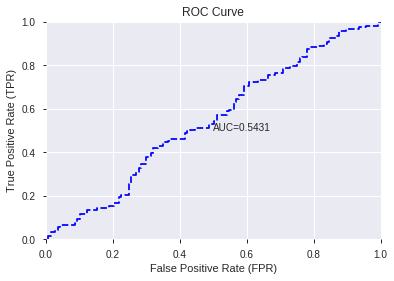

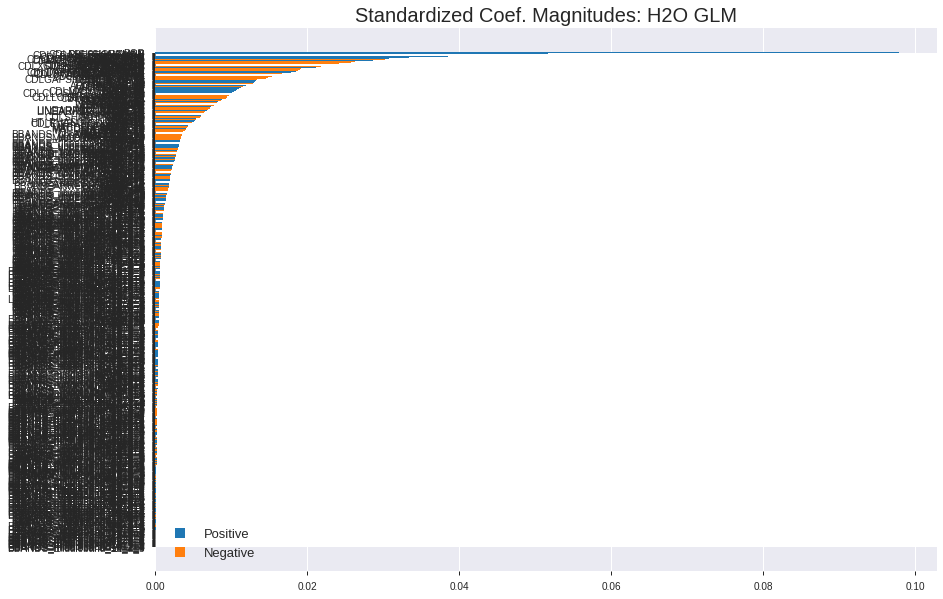

'log_likelihood'
--2019-12-07 22:51:49--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.132.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.132.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


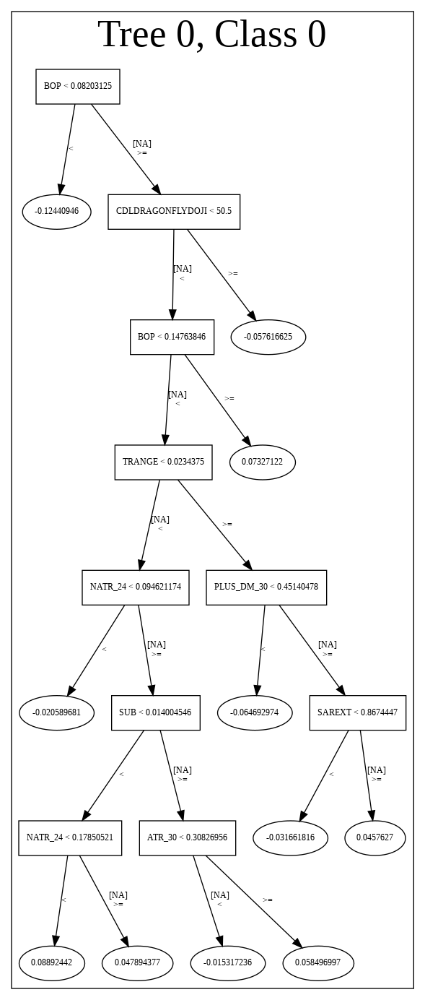

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_225114_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_225114_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_40_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_40_s

['BOP',
 'CDLRICKSHAWMAN',
 'CDLSHORTLINE',
 'is_quarter_start',
 'CDLGRAVESTONEDOJI',
 'dayofweek',
 'weekday',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'CDLMARUBOZU',
 'CDLTAKURI',
 'CDLSTICKSANDWICH',
 'CDLMORNINGDOJISTAR',
 'CDLSEPARATINGLINES',
 'aroondown_8',
 'CDLLONGLINE',
 'MINUS_DI_8',
 'CDLSPINNINGTOP',
 'CDLENGULFING',
 'aroondown_12',
 'is_quarter_end',
 'STOCHF_fastk',
 'CDLHOMINGPIGEON',
 'CDLADVANCEBLOCK',
 'CDLXSIDEGAP3METHODS',
 'CCI_8',
 'CDLHIGHWAVE',
 'TRANGE',
 'CDLHIKKAKEMOD',
 'CDLTASUKIGAP',
 'BETA_12',
 'CDLHANGINGMAN',
 'days_in_month',
 'CDL3OUTSIDE',
 'STOCHRSI_fastd',
 'CDLDARKCLOUDCOVER',
 'CDLHARAMI',
 'CDLINVERTEDHAMMER',
 'CDLHIKKAKE',
 'AROONOSC_12',
 'CDLSTALLEDPATTERN',
 'STOCHF_fastd',
 'STOCH_slowk',
 'BETA_24',
 'CDLEVENINGSTAR',
 'TAN',
 'BETA_8',
 'aroonup_24',
 'AROONOSC_8',
 'CDLGAPSIDESIDEWHITE']

938

['BOP',
 'CDLRICKSHAWMAN',
 'CDLSHORTLINE',
 'is_quarter_start',
 'CDLGRAVESTONEDOJI',
 'dayofweek',
 'weekday',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'CDLMARUBOZU',
 'CDLTAKURI',
 'CDLSTICKSANDWICH',
 'CDLMORNINGDOJISTAR',
 'CDLSEPARATINGLINES',
 'aroondown_8',
 'CDLLONGLINE',
 'MINUS_DI_8',
 'CDLSPINNINGTOP',
 'CDLENGULFING',
 'aroondown_12',
 'is_quarter_end',
 'STOCHF_fastk',
 'CDLHOMINGPIGEON',
 'CDLADVANCEBLOCK',
 'CDLXSIDEGAP3METHODS',
 'CCI_8',
 'CDLHIGHWAVE',
 'TRANGE',
 'CDLHIKKAKEMOD',
 'CDLTASUKIGAP',
 'BETA_12',
 'CDLHANGINGMAN',
 'days_in_month',
 'CDL3OUTSIDE',
 'STOCHRSI_fastd',
 'CDLDARKCLOUDCOVER',
 'CDLHARAMI',
 'CDLINVERTEDHAMMER',
 'CDLHIKKAKE',
 'AROONOSC_12',
 'CDLSTALLEDPATTERN',
 'STOCHF_fastd',
 'STOCH_slowk',
 'BETA_24',
 'CDLEVENINGSTAR',
 'TAN',
 'BETA_8',
 'aroonup_24',
 'AROONOSC_8',
 'CDLGAPSIDESIDEWHITE']

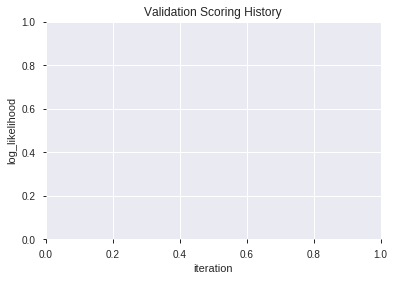

In [19]:
# GLM
features_list = model_train(feature_name='All',model_algo="GLM")
display(features_list[:model_selected_features])
display(len(features_list),features_list[:model_selected_features])

In [20]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [21]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [22]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

In [23]:
# DRF with top GLM features
model_train(feature_name='GLMF',model_algo="DRF",features_list = features_list[:model_selected_features])

[]

In [24]:
# GBM with top GLM features
model_train(feature_name='GLMF',model_algo="GBM",features_list = features_list[:model_selected_features])

[]

In [25]:
# StackedEnsemble with top GLM features
model_train(feature_name='GLMF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

[]

In [26]:
# All algos with top GLM features
model_train(feature_name='GLMF',model_algo=None,features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_225157_model_4,0.641170,0.662468,0.368153,0.485012,0.235236
1,XGBoost_3_AutoML_20191207_225157,0.628044,0.666271,0.397473,0.487306,0.237467
2,XGBoost_grid_1_AutoML_20191207_225157_model_3,0.619211,0.667504,0.412838,0.487868,0.238015
3,XGBoost_grid_1_AutoML_20191207_225157_model_2,0.615960,0.671614,0.415721,0.489672,0.239778
4,XGBoost_grid_1_AutoML_20191207_225157_model_7,0.614795,0.676551,0.402227,0.491829,0.241896
5,XGBoost_grid_1_AutoML_20191207_225157_model_5,0.613384,0.698227,0.394590,0.501423,0.251425
6,XGBoost_2_AutoML_20191207_225157,0.610869,0.671270,0.422468,0.489691,0.239797
7,XGBoost_grid_1_AutoML_20191207_225157_model_6,0.581795,0.681068,0.410630,0.494394,0.244426
8,XGBoost_1_AutoML_20191207_225157,0.575538,0.694354,0.446912,0.500486,0.250486
9,XGBoost_grid_1_AutoML_20191207_225157_model_1,0.569466,0.696932,0.442710,0.502150,0.252155


,variable,relative_importance,scaled_importance,percentage
0,BOP,385.360352,1.000000,0.092741
1,SUB,200.872055,0.521258,0.048342
2,DIV,199.738358,0.518316,0.048069
3,TRANGE,175.841110,0.456303,0.042318
4,aroondown_8,121.708267,0.315830,0.029290
...,...,...,...,...
151,WILLR_12,5.474437,0.014206,0.001317
152,BBANDS_lowerband_20_2_2,5.410825,0.014041,0.001302
153,month,5.262973,0.013657,0.001267
154,ATR_12,4.773945,0.012388,0.001149


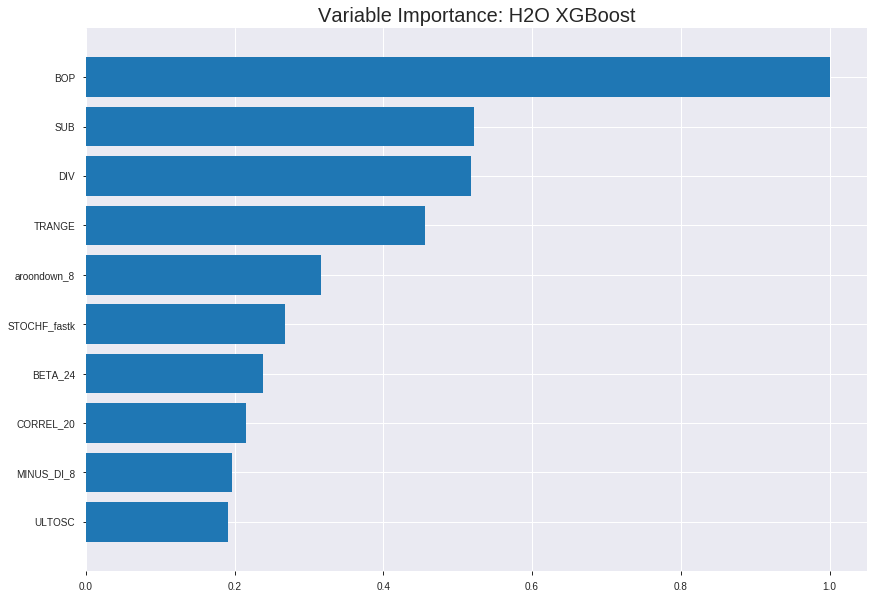

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_225157_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.19668271667888598
RMSE: 0.44348925204438266
LogLoss: 0.5820139411022007
Mean Per-Class Error: 0.24600469799331437
AUC: 0.8277239326620958
pr_auc: 0.7995146808789895
Gini: 0.6554478653241915
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4509017595223018: 


,0,1,Error,Rate
0,569.0,362.0,0.3888,(362.0/931.0)
1,89.0,767.0,0.104,(89.0/856.0)
Total,658.0,1129.0,0.2524,(451.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4509018,0.7727960,225.0
max f2,0.3813708,0.8575280,281.0
max f0point5,0.5186364,0.7337796,160.0
max accuracy,0.4528530,0.7481813,224.0
max precision,0.7777912,1.0,0.0
max recall,0.2455807,1.0,372.0
max specificity,0.7777912,1.0,0.0
max absolute_mcc,0.4509018,0.5253274,225.0
max min_per_class_accuracy,0.4975928,0.7394860,178.0
max mean_per_class_accuracy,0.4528530,0.7539953,224.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7126052,1.9716381,1.9716381,0.9444444,0.7311472,0.9444444,0.7311472,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0201455,0.6951182,1.9716381,1.9716381,0.9444444,0.7024856,0.9444444,0.7168164,0.0198598,0.0397196,97.1638110,97.1638110
,3,0.0302182,0.6836447,1.9716381,1.9716381,0.9444444,0.6891208,0.9444444,0.7075845,0.0198598,0.0595794,97.1638110,97.1638110
,4,0.0402910,0.6713779,1.9716381,1.9716381,0.9444444,0.6765937,0.9444444,0.6998368,0.0198598,0.0794393,97.1638110,97.1638110
,5,0.0503637,0.6619926,1.7396807,1.9252466,0.8333333,0.6669664,0.9222222,0.6932627,0.0175234,0.0969626,73.9680685,92.5246625
,6,0.1001679,0.6320679,1.8295968,1.8776889,0.8764045,0.6463318,0.8994413,0.6699284,0.0911215,0.1880841,82.9596766,87.7688874
,7,0.1499720,0.6064870,1.7826840,1.8461388,0.8539326,0.6178455,0.8843284,0.6526322,0.0887850,0.2768692,78.2684028,84.6138757
,8,0.2003358,0.5896355,1.6237020,1.7902189,0.7777778,0.5975972,0.8575419,0.6387966,0.0817757,0.3586449,62.3701973,79.0218895
,9,0.2999440,0.5565169,1.5246640,1.7020309,0.7303371,0.5721393,0.8152985,0.6166604,0.1518692,0.5105140,52.4663971,70.2030879
,10,0.4001119,0.5240006,1.1546037,1.5649827,0.5530726,0.5401726,0.7496503,0.5975117,0.1156542,0.6261682,15.4603717,56.4982681




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.23969649669230572
RMSE: 0.4895880887974152
LogLoss: 0.6713279932739495
Mean Per-Class Error: 0.3938877632467612
AUC: 0.6089749493461043
pr_auc: 0.5333480966025098
Gini: 0.2179498986922086
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3134573698043823: 


,0,1,Error,Rate
0,33.0,234.0,0.8764,(234.0/267.0)
1,1.0,243.0,0.0041,(1.0/244.0)
Total,34.0,477.0,0.4599,(235.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3134574,0.6740638,372.0
max f2,0.3134574,0.8362010,372.0
max f0point5,0.4203537,0.5906921,273.0
max accuracy,0.4810694,0.5968689,198.0
max precision,0.7195944,1.0,0.0
max recall,0.2970520,1.0,380.0
max specificity,0.7195944,1.0,0.0
max absolute_mcc,0.3134574,0.2395022,372.0
max min_per_class_accuracy,0.4803767,0.5955056,199.0
max mean_per_class_accuracy,0.4203537,0.6061122,273.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 47.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6775799,1.0471311,1.0471311,0.5,0.6970964,0.5,0.6970964,0.0122951,0.0122951,4.7131148,4.7131148
,2,0.0215264,0.6644819,1.2565574,1.1423249,0.6,0.6654851,0.5454545,0.6827276,0.0122951,0.0245902,25.6557377,14.2324888
,3,0.0313112,0.6588411,0.8377049,1.0471311,0.4,0.6609580,0.5,0.6759246,0.0081967,0.0327869,-16.2295082,4.7131148
,4,0.0410959,0.6528558,0.4188525,0.8975410,0.2,0.6549948,0.4285714,0.6709413,0.0040984,0.0368852,-58.1147541,-10.2459016
,5,0.0508806,0.6436793,2.0942623,1.1276797,1.0,0.6478154,0.5384615,0.6664940,0.0204918,0.0573770,109.4262295,12.7679697
,6,0.1017613,0.6061198,1.0471311,1.0874054,0.5,0.6241582,0.5192308,0.6453261,0.0532787,0.1106557,4.7131148,8.7405422
,7,0.1506849,0.5896050,1.0890164,1.0879285,0.52,0.5988390,0.5194805,0.6302329,0.0532787,0.1639344,8.9016393,8.7928465
,8,0.2015656,0.5737710,0.8860340,1.0369648,0.4230769,0.5813369,0.4951456,0.6178902,0.0450820,0.2090164,-11.3965952,3.6964826
,9,0.3013699,0.5306644,1.2729830,1.1151267,0.6078431,0.5537046,0.5324675,0.5966339,0.1270492,0.3360656,27.2982964,11.5126677
,10,0.4011742,0.5061525,1.3140469,1.1646142,0.6274510,0.5192287,0.5560976,0.5773770,0.1311475,0.4672131,31.4046930,16.4614154



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:52:12,6.246 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5209849,0.5,0.6931472,0.5,0.0,1.0,0.5225049
,2019-12-07 22:52:13,6.844 sec,5.0,0.4905662,0.6744134,0.7173318,0.6698642,1.7744743,0.3782876,0.4965345,0.6862216,0.5887901,0.5164019,1.0471311,0.4461840
,2019-12-07 22:52:13,7.039 sec,10.0,0.4830101,0.6595067,0.7434807,0.7045896,1.9716381,0.3475098,0.4951851,0.6834929,0.5826963,0.5244528,1.0471311,0.4520548
,2019-12-07 22:52:13,7.229 sec,15.0,0.4758901,0.6455169,0.7631485,0.7257326,1.9716381,0.3223279,0.4950447,0.6831633,0.5770783,0.5153035,0.6980874,0.4363992
,2019-12-07 22:52:13,7.408 sec,20.0,0.4702087,0.6343286,0.7729548,0.7381507,1.9716381,0.3072188,0.4933708,0.6797068,0.5889360,0.5182874,1.3961749,0.4442270
,2019-12-07 22:52:13,7.595 sec,25.0,0.4645750,0.6232852,0.7875413,0.7546208,1.9716381,0.2932289,0.4930784,0.6789757,0.5884294,0.5143463,1.3961749,0.4266145
,2019-12-07 22:52:14,7.796 sec,30.0,0.4597501,0.6137808,0.7962678,0.7616245,1.9716381,0.2814773,0.4918319,0.6763124,0.5953905,0.5194088,1.0471311,0.4461840
,2019-12-07 22:52:14,8.000 sec,35.0,0.4553959,0.6052138,0.8040451,0.7728671,1.9716381,0.2820369,0.4900117,0.6724427,0.6062657,0.5275815,0.6980874,0.4500978
,2019-12-07 22:52:14,8.184 sec,40.0,0.4511694,0.5968979,0.8132303,0.7842309,1.9716381,0.2652490,0.4889883,0.6702305,0.6109934,0.5312596,0.6980874,0.4363992
,2019-12-07 22:52:14,8.385 sec,45.0,0.4473219,0.5894034,0.8203476,0.7912868,1.9716381,0.2585339,0.4896972,0.6716002,0.6086066,0.5290231,1.0471311,0.4324853


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,385.3603516,1.0,0.0927412
SUB,200.8720551,0.5212577,0.0483421
DIV,199.7383575,0.5183158,0.0480692
TRANGE,175.8411102,0.4563031,0.0423181
aroondown_8,121.7082672,0.3158298,0.0292904
---,---,---,---
WILLR_12,5.4744372,0.0142060,0.0013175
BBANDS_lowerband_20_2_2,5.4108248,0.0140409,0.0013022
month,5.2629728,0.0136573,0.0012666
ATR_12,4.7739449,0.0123883,0.0011489



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.62109375)

('F1', 0.6711409395973155)

('auc', 0.6411703367478379)

('logloss', 0.6624680115031865)

('mean_per_class_error', 0.3667116481629148)

('rmse', 0.4850117761187438)

('mse', 0.23523642297385844)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


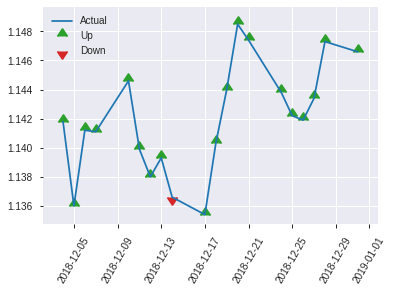


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23523642297385844
RMSE: 0.4850117761187438
LogLoss: 0.6624680115031865
Mean Per-Class Error: 0.3667116481629148
AUC: 0.6411703367478379
pr_auc: 0.5341348812688916
Gini: 0.2823406734956757
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39640626311302185: 


,0,1,Error,Rate
0,58.0,79.0,0.5766,(79.0/137.0)
1,19.0,100.0,0.1597,(19.0/119.0)
Total,77.0,179.0,0.3828,(98.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3964063,0.6711409,178.0
max f2,0.2656919,0.8171745,245.0
max f0point5,0.4052981,0.6007509,169.0
max accuracy,0.4874864,0.6210938,113.0
max precision,0.5208808,0.6103896,76.0
max recall,0.2200589,1.0,254.0
max specificity,0.7174206,0.9927007,0.0
max absolute_mcc,0.3964063,0.2867885,178.0
max min_per_class_accuracy,0.4694688,0.6131387,125.0
max mean_per_class_accuracy,0.4052981,0.6332884,169.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 45.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6619789,0.7170868,0.7170868,0.3333333,0.6808584,0.3333333,0.6808584,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.6527330,0.7170868,0.7170868,0.3333333,0.6573220,0.3333333,0.6690902,0.0084034,0.0168067,-28.2913165,-28.2913165
,3,0.03125,0.6475305,0.0,0.5378151,0.0,0.6488477,0.25,0.6640296,0.0,0.0168067,-100.0,-46.2184874
,4,0.0429688,0.6290740,0.0,0.3911383,0.0,0.6374690,0.1818182,0.6567858,0.0,0.0168067,-100.0,-60.8861727
,5,0.0507812,0.6220779,2.1512605,0.6619263,1.0,0.6252478,0.3076923,0.6519338,0.0168067,0.0336134,115.1260504,-33.8073691
,6,0.1015625,0.5890238,1.1583710,0.9101487,0.5384615,0.6055815,0.4230769,0.6287577,0.0588235,0.0924370,15.8371041,-8.9851325
,7,0.1523438,0.5669392,1.8202973,1.2135316,0.8461538,0.5772814,0.5641026,0.6115989,0.0924370,0.1848739,82.0297350,21.3531566
,8,0.203125,0.5455264,1.1583710,1.1997414,0.5384615,0.5562083,0.5576923,0.5977513,0.0588235,0.2436975,15.8371041,19.9741435
,9,0.3007812,0.5205160,1.5489076,1.3131071,0.72,0.5308850,0.6103896,0.5760415,0.1512605,0.3949580,54.8907563,31.3107061
,10,0.4023438,0.5004348,0.9928895,1.2322754,0.4615385,0.5113743,0.5728155,0.5597177,0.1008403,0.4957983,-0.7110537,23.2275434


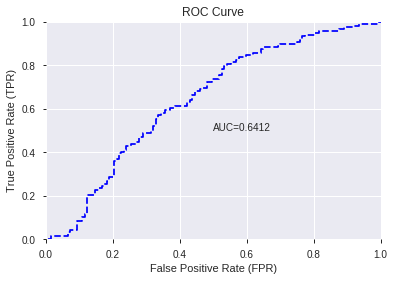

This function is available for GLM models only


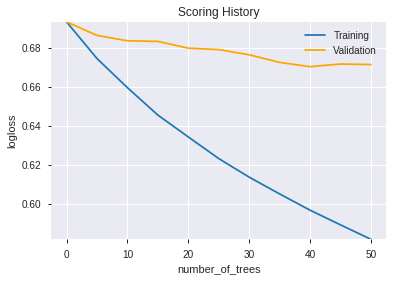

--2019-12-07 22:52:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.129.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.129.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

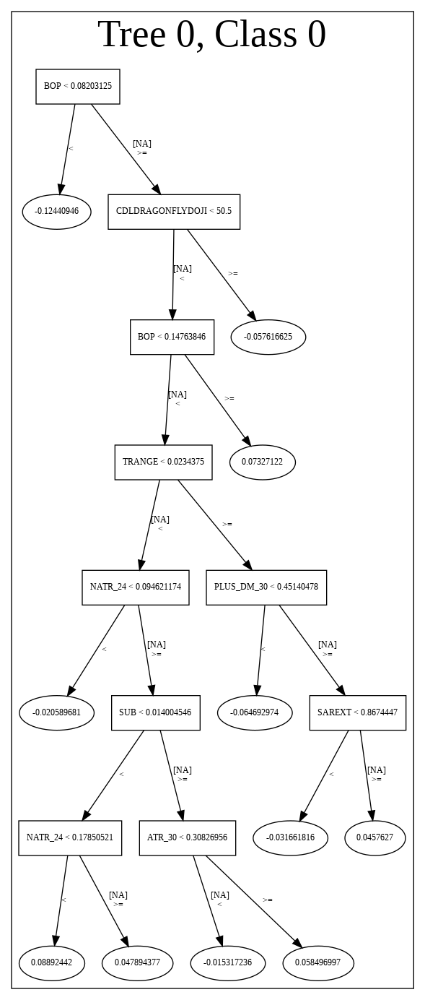

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_225157_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_225157_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_45_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

156

['BOP',
 'SUB',
 'DIV',
 'TRANGE',
 'aroondown_8',
 'STOCHF_fastk',
 'BETA_24',
 'CORREL_20',
 'MINUS_DI_8',
 'ULTOSC',
 'CMO_30',
 'CCI_8',
 'NATR_30',
 'STDDEV_30',
 'HT_PHASOR_quadrature',
 'NATR_20',
 'STOCHRSI_fastk',
 'WILLR_8',
 'CDLRICKSHAWMAN',
 'MINUS_DI_12',
 'MACDFIX_hist_24',
 'CORREL_12',
 'ATR_24',
 'STOCH_slowk',
 'HT_PHASOR_inphase',
 'CORREL_14',
 'MOM_30',
 'dayofweek',
 'day',
 'MINUS_DI_30',
 'STDDEV_20',
 'CDLDRAGONFLYDOJI',
 'aroondown_14',
 'SAREXT',
 'aroondown_24',
 'dayofyear',
 'MINUS_DM_30',
 'ADX_24',
 'PLUS_DI_12',
 'BBANDS_upperband_14_6_5',
 'NATR_24',
 'MINUS_DI_14',
 'BBANDS_lowerband_12_4_4',
 'aroonup_30',
 'CCI_12',
 'CDLGRAVESTONEDOJI',
 'LINEARREG_ANGLE_8',
 'DX_24',
 'MINUS_DM_20',
 'CORREL_30']

In [27]:
# XGBoost
features_list = model_train(feature_name='All',model_algo="XGBoost")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_225234_model_9,0.594124,0.680447,0.451665,0.494138,0.244173
1,DeepLearning_grid_1_AutoML_20191207_225234_model_8,0.586456,0.685245,0.394253,0.496277,0.246291
2,DeepLearning_1_AutoML_20191207_225234,0.561982,0.713132,0.442710,0.509566,0.259658
3,DeepLearning_grid_1_AutoML_20191207_225234_model_3,0.558486,0.901125,0.489051,0.561587,0.315380
4,DeepLearning_grid_1_AutoML_20191207_225234_model_5,0.543581,0.719487,0.434521,0.509013,0.259094
5,DeepLearning_grid_1_AutoML_20191207_225234_model_2,0.541373,0.886877,0.478654,0.558312,0.311712
6,DeepLearning_grid_1_AutoML_20191207_225234_model_6,0.538060,0.689202,0.471355,0.498462,0.248464
7,DeepLearning_grid_1_AutoML_20191207_225234_model_4,0.528308,0.964706,0.464822,0.574788,0.330381
8,DeepLearning_grid_1_AutoML_20191207_225234_model_1,0.501012,1.164981,0.492701,0.604158,0.365007
9,DeepLearning_grid_1_AutoML_20191207_225234_model_7,0.489051,0.828150,0.492701,0.551215,0.303839


,variable,relative_importance,scaled_importance,percentage
0,SUB,1.000000,1.000000,0.037296
1,TRANGE,0.980150,0.980150,0.036556
2,BOP,0.962190,0.962190,0.035886
3,DIV,0.961186,0.961186,0.035849
4,CDLDRAGONFLYDOJI,0.623172,0.623172,0.023242
5,CDLRICKSHAWMAN,0.613675,0.613675,0.022888
6,BETA_24,0.569689,0.569689,0.021247
7,dayofweek,0.562179,0.562179,0.020967
8,CDLGRAVESTONEDOJI,0.561604,0.561604,0.020946
9,STOCHF_fastk,0.558674,0.558674,0.020836


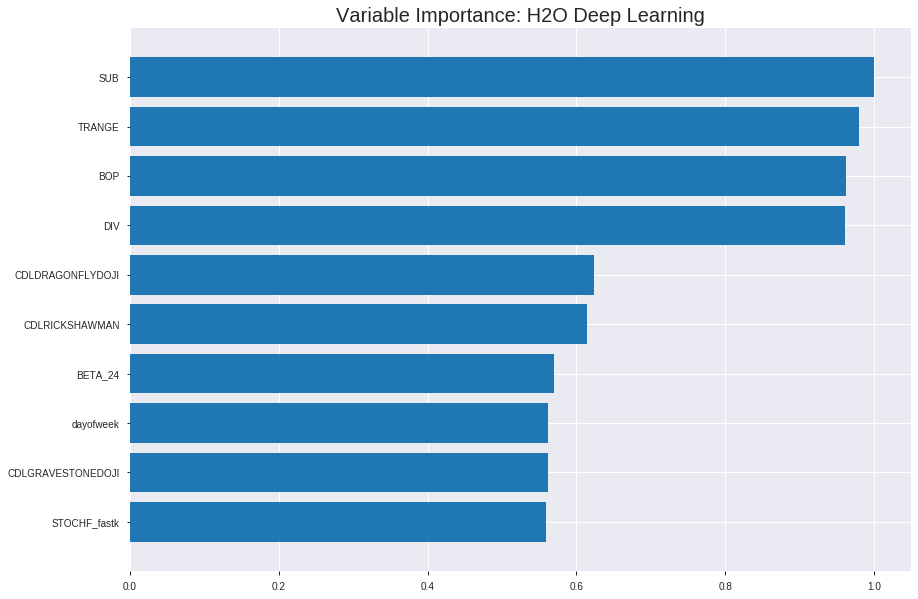

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_225234_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2260134103611507
RMSE: 0.4754086772043088
LogLoss: 0.6482377738584605
Mean Per-Class Error: 0.3660199815292571
AUC: 0.6731883112320186
pr_auc: 0.6174505666909237
Gini: 0.3463766224640372
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4679863801108517: 


,0,1,Error,Rate
0,283.0,648.0,0.696,(648.0/931.0)
1,61.0,795.0,0.0713,(61.0/856.0)
Total,344.0,1443.0,0.3968,(709.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4679864,0.6916050,218.0
max f2,0.2028521,0.8331694,329.0
max f0point5,0.5339535,0.6133861,166.0
max accuracy,0.5339535,0.6256295,166.0
max precision,0.7184866,1.0,0.0
max recall,0.0000000,1.0,399.0
max specificity,0.7184866,1.0,0.0
max absolute_mcc,0.5012814,0.2969788,194.0
max min_per_class_accuracy,0.5593848,0.6156542,125.0
max mean_per_class_accuracy,0.5339535,0.6339800,166.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 50.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6568457,1.7396807,1.7396807,0.8333333,0.6693423,0.8333333,0.6693423,0.0175234,0.0175234,73.9680685,73.9680685
,2,0.0201455,0.6400241,1.3917445,1.5657126,0.6666667,0.6464701,0.75,0.6579062,0.0140187,0.0315421,39.1744548,56.5712617
,3,0.0302182,0.6299420,1.8556594,1.6623615,0.8888889,0.6342711,0.7962963,0.6500278,0.0186916,0.0502336,85.5659398,66.2361544
,4,0.0402910,0.6223293,1.0438084,1.5077233,0.5,0.6258052,0.7222222,0.6439722,0.0105140,0.0607477,4.3808411,50.7723261
,5,0.0503637,0.6186633,1.3917445,1.4845275,0.6666667,0.6198739,0.7111111,0.6391525,0.0140187,0.0747664,39.1744548,48.4527518
,6,0.1001679,0.6021049,1.4073821,1.4461703,0.6741573,0.6087701,0.6927374,0.6240462,0.0700935,0.1448598,40.7382127,44.6170313
,7,0.1499720,0.5916763,1.2197312,1.3709722,0.5842697,0.5967690,0.6567164,0.6149877,0.0607477,0.2056075,21.9731177,37.0972242
,8,0.2003358,0.5840550,1.2525701,1.3412063,0.6,0.5879983,0.6424581,0.6082026,0.0630841,0.2686916,25.2570093,34.1206338
,9,0.2999440,0.5748915,1.1259057,1.2697072,0.5393258,0.5790949,0.6082090,0.5985363,0.1121495,0.3808411,12.5905702,26.9707246
,10,0.4001119,0.5672287,1.2595677,1.2671688,0.6033520,0.5708474,0.6069930,0.5916044,0.1261682,0.5070093,25.9567692,26.7168812




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2397250184095469
RMSE: 0.4896172162103237
LogLoss: 0.6709048116196181
Mean Per-Class Error: 0.39843893903112915
AUC: 0.6077930251120526
pr_auc: 0.5390835637127696
Gini: 0.21558605022410515
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40529252933879484: 


,0,1,Error,Rate
0,42.0,225.0,0.8427,(225.0/267.0)
1,9.0,235.0,0.0369,(9.0/244.0)
Total,51.0,460.0,0.4579,(234.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4052925,0.6676136,348.0
max f2,0.2053820,0.8242507,380.0
max f0point5,0.5473665,0.5843653,182.0
max accuracy,0.5473665,0.6007828,182.0
max precision,0.5806733,0.5777778,37.0
max recall,0.1443798,1.0,394.0
max specificity,0.6263813,0.9962547,0.0
max absolute_mcc,0.5322139,0.2037237,237.0
max min_per_class_accuracy,0.5488938,0.5917603,177.0
max mean_per_class_accuracy,0.5473665,0.6015611,182.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 51.22 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5999566,0.3490437,0.3490437,0.1666667,0.6121171,0.1666667,0.6121171,0.0040984,0.0040984,-65.0956284,-65.0956284
,2,0.0215264,0.5954657,1.6754098,0.9519374,0.8,0.5966979,0.4545455,0.6051084,0.0163934,0.0204918,67.5409836,-4.8062593
,3,0.0313112,0.5935350,1.2565574,1.0471311,0.6,0.5944415,0.5,0.6017750,0.0122951,0.0327869,25.6557377,4.7131148
,4,0.0410959,0.5902328,1.2565574,1.0969945,0.6,0.5917209,0.5238095,0.5993812,0.0122951,0.0450820,25.6557377,9.6994536
,5,0.0508806,0.5888285,1.2565574,1.1276797,0.6,0.5895821,0.5384615,0.5974967,0.0122951,0.0573770,25.6557377,12.7679697
,6,0.1017613,0.5791411,1.2887768,1.2082282,0.6153846,0.5832668,0.5769231,0.5903818,0.0655738,0.1229508,28.8776797,20.8228247
,7,0.1506849,0.5741995,0.9214754,1.1151267,0.44,0.5767697,0.5324675,0.5859623,0.0450820,0.1680328,-7.8524590,11.5126677
,8,0.2015656,0.5695563,1.2082282,1.1386280,0.5769231,0.5717960,0.5436893,0.5823863,0.0614754,0.2295082,20.8228247,13.8628044
,9,0.3013699,0.5636795,1.1497911,1.1423249,0.5490196,0.5662699,0.5454545,0.5770491,0.1147541,0.3442623,14.9791064,14.2324888
,10,0.4011742,0.5556941,1.2319190,1.1646142,0.5882353,0.5596742,0.5560976,0.5727265,0.1229508,0.4672131,23.1918997,16.4614154



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:57:40,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 22:57:43,1 min 17.747 sec,1487 obs/sec,2.5041970,1,4475.0,0.4902593,0.6738400,0.0368870,0.6497285,0.5918394,1.0438084,0.4045887,0.4959397,0.6849480,0.0141783,0.5675846,0.5075477,0.6980874,0.4696673
,2019-12-07 22:57:49,1 min 24.124 sec,2010 obs/sec,9.9809737,4,17836.0,0.4754087,0.6482378,0.0943511,0.6731883,0.6174506,1.7396807,0.3967543,0.4896172,0.6709048,0.0391534,0.6077930,0.5390836,0.3490437,0.4579256
,2019-12-07 22:57:55,1 min 29.657 sec,2244 obs/sec,17.4090655,7,31110.0,0.4705225,0.6367476,0.1128715,0.6860438,0.6387466,1.6237020,0.3777280,0.4898824,0.6716121,0.0381121,0.6117532,0.5482669,1.0471311,0.4422701
,2019-12-07 22:58:01,1 min 36.198 sec,2455 obs/sec,27.3284835,11,48836.0,0.4648650,0.6245826,0.1340769,0.6959687,0.6470111,1.7396807,0.3754896,0.4908201,0.6752769,0.0344263,0.6173175,0.5567642,1.3961749,0.4383562
,2019-12-07 22:58:07,1 min 42.314 sec,2613 obs/sec,37.2395076,15,66547.0,0.4668757,0.6320150,0.1265699,0.7141452,0.6751604,1.9716381,0.3732513,0.5013751,0.6979323,-0.0075491,0.6161586,0.5480279,0.6980874,0.4344423
,2019-12-07 22:58:13,1 min 48.242 sec,2730 obs/sec,47.1315053,19,84224.0,0.4573459,0.6132903,0.1618626,0.7237953,0.6846605,1.7396807,0.3603805,0.4968653,0.6899448,0.0104948,0.6060201,0.5368255,1.0471311,0.4598826
,2019-12-07 22:58:14,1 min 48.802 sec,2727 obs/sec,47.1315053,19,84224.0,0.4754087,0.6482378,0.0943511,0.6731883,0.6174506,1.7396807,0.3967543,0.4896172,0.6709048,0.0391534,0.6077930,0.5390836,0.3490437,0.4579256


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
SUB,1.0,1.0,0.0372962
TRANGE,0.9801497,0.9801497,0.0365559
BOP,0.9621903,0.9621903,0.0358861
DIV,0.9611863,0.9611863,0.0358486
CDLDRAGONFLYDOJI,0.6231723,0.6231723,0.0232420
---,---,---,---
aroondown_14,0.4584996,0.4584996,0.0171003
NATR_20,0.4584888,0.4584888,0.0170999
STOCHRSI_fastk,0.4560869,0.4560869,0.0170103
BBANDS_upperband_14_6_5,0.4532055,0.4532055,0.0169029



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.61328125)

('F1', 0.6495726495726496)

('auc', 0.594123780899221)

('logloss', 0.6804469712864626)

('mean_per_class_error', 0.3773231920505429)

('rmse', 0.4941381423315132)

('mse', 0.24417250370683882)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           0
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


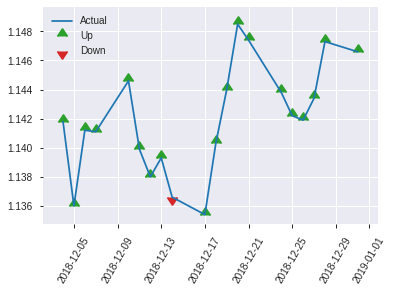


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.24417250370683882
RMSE: 0.4941381423315132
LogLoss: 0.6804469712864626
Mean Per-Class Error: 0.3773231920505429
AUC: 0.594123780899221
pr_auc: 0.5235625160886883
Gini: 0.18824756179844204
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42010744296874225: 


,0,1,Error,Rate
0,19.0,118.0,0.8613,(118.0/137.0)
1,5.0,114.0,0.042,(5.0/119.0)
Total,24.0,232.0,0.4805,(123.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4201074,0.6495726,231.0
max f2,0.2519176,0.8173077,251.0
max f0point5,0.5470817,0.5928854,159.0
max accuracy,0.5470817,0.6132812,159.0
max precision,0.6059142,0.6666667,2.0
max recall,0.2519176,1.0,251.0
max specificity,0.6251679,0.9927007,0.0
max absolute_mcc,0.5470817,0.2527730,159.0
max min_per_class_accuracy,0.5562576,0.5714286,125.0
max mean_per_class_accuracy,0.5470817,0.6226768,159.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 52.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6043452,1.4341737,1.4341737,0.6666667,0.6137901,0.6666667,0.6137901,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.5996945,0.0,0.7170868,0.0,0.6020270,0.3333333,0.6079085,0.0,0.0168067,-100.0,-28.2913165
,3,0.03125,0.5950327,2.1512605,1.0756303,1.0,0.5956594,0.5,0.6048462,0.0168067,0.0336134,115.1260504,7.5630252
,4,0.0429688,0.5923678,2.1512605,1.3689840,1.0,0.5935407,0.6363636,0.6017629,0.0252101,0.0588235,115.1260504,36.8983957
,5,0.0507812,0.5880831,1.0756303,1.3238526,0.5,0.5898408,0.6153846,0.5999287,0.0084034,0.0672269,7.5630252,32.3852618
,6,0.1015625,0.5791757,1.3238526,1.3238526,0.6153846,0.5836277,0.6153846,0.5917782,0.0672269,0.1344538,32.3852618,32.3852618
,7,0.1523438,0.5731700,0.8274079,1.1583710,0.3846154,0.5757791,0.5384615,0.5864452,0.0420168,0.1764706,-17.2592114,15.8371041
,8,0.203125,0.5709245,0.9928895,1.1170006,0.4615385,0.5716060,0.5192308,0.5827354,0.0504202,0.2268908,-0.7110537,11.7000646
,9,0.3007812,0.5649207,0.6884034,0.9778457,0.32,0.5672973,0.4545455,0.5777230,0.0672269,0.2941176,-31.1596639,-2.2154316
,10,0.4023438,0.5604560,1.4065934,1.0860733,0.6538462,0.5623745,0.5048544,0.5738486,0.1428571,0.4369748,40.6593407,8.6073264


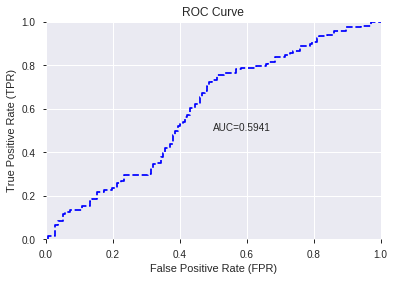

This function is available for GLM models only


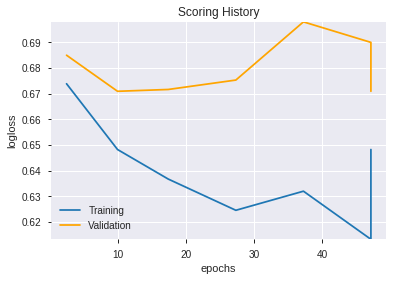

--2019-12-07 22:58:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.12
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.12|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


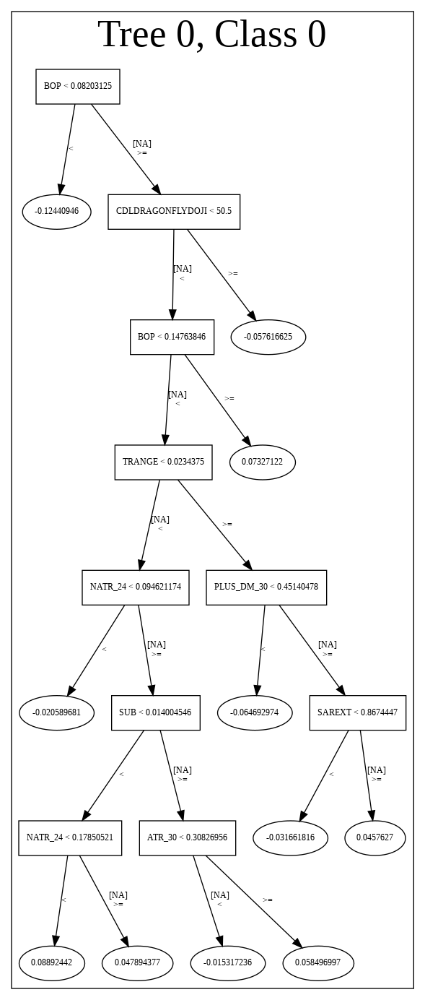

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_225234_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_225234_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['SUB',
 'TRANGE',
 'BOP',
 'DIV',
 'CDLDRAGONFLYDOJI',
 'CDLRICKSHAWMAN',
 'BETA_24',
 'dayofweek',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CORREL_30',
 'ADX_24',
 'SAREXT',
 'MINUS_DI_8',
 'CCI_8',
 'STOCH_slowk',
 'CORREL_20',
 'DX_24',
 'aroonup_30',
 'aroondown_8',
 'ULTOSC',
 'NATR_30',
 'aroondown_24',
 'WILLR_8',
 'CCI_12',
 'MINUS_DM_30',
 'day',
 'dayofyear',
 'PLUS_DI_12',
 'HT_PHASOR_quadrature',
 'BBANDS_lowerband_12_4_4',
 'MINUS_DI_12',
 'STDDEV_30',
 'CMO_30',
 'MOM_30',
 'CORREL_12',
 'HT_PHASOR_inphase',
 'STDDEV_20',
 'CORREL_14',
 'MACDFIX_hist_24',
 'MINUS_DI_30',
 'NATR_24',
 'ATR_24',
 'MINUS_DM_20',
 'MINUS_DI_14',
 'aroondown_14',
 'NATR_20',
 'STOCHRSI_fastk',
 'BBANDS_upperband_14_6_5',
 'LINEARREG_ANGLE_8']

In [28]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_225827_model_1,0.622953,0.664901,0.366497,0.486498,0.23668


,variable,relative_importance,scaled_importance,percentage
0,DIV,3.172240,1.000000,0.173464
1,SUB,2.795268,0.881166,0.152851
2,NATR_24,2.371712,0.747646,0.129690
3,ATR_24,1.542294,0.486184,0.084336
4,NATR_30,0.936157,0.295109,0.051191
5,MINUS_DI_8,0.894433,0.281956,0.048909
6,MINUS_DM_30,0.612649,0.193128,0.033501
7,MINUS_DI_14,0.565175,0.178163,0.030905
8,STOCHF_fastk,0.516230,0.162734,0.028228
9,MINUS_DM_20,0.506483,0.159661,0.027695


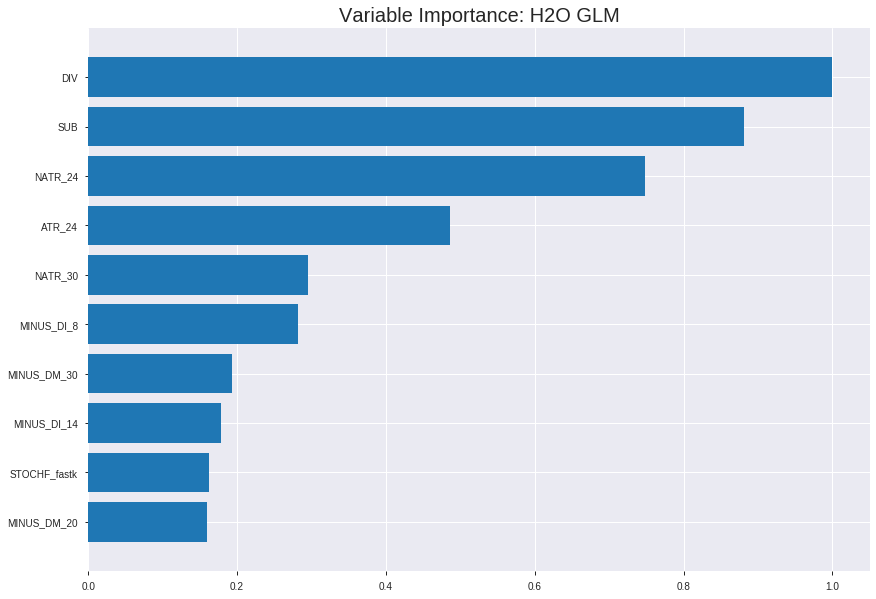

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_225827_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.22231983255796126
RMSE: 0.47150804082004927
LogLoss: 0.63286748812831
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2474.1593649352335
Residual deviance: 2261.8684025705797
AIC: 2363.8684025705797
AUC: 0.6834846210988085
pr_auc: 0.6188411142409806
Gini: 0.36696924219761695
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29692011684999003: 


,0,1,Error,Rate
0,235.0,696.0,0.7476,(696.0/931.0)
1,34.0,822.0,0.0397,(34.0/856.0)
Total,269.0,1518.0,0.4085,(730.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2969201,0.6925021,307.0
max f2,0.2017821,0.8331698,349.0
max f0point5,0.4690614,0.6239837,202.0
max accuracy,0.4690614,0.6396195,202.0
max precision,0.9999295,1.0,0.0
max recall,0.1032830,1.0,381.0
max specificity,0.9999295,1.0,0.0
max absolute_mcc,0.2950650,0.2971408,308.0
max min_per_class_accuracy,0.4950429,0.6369495,184.0
max mean_per_class_accuracy,0.4690614,0.6427480,202.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8112963,1.5077233,1.5077233,0.7222222,0.8615143,0.7222222,0.8615143,0.0151869,0.0151869,50.7723261,50.7723261
,2,0.0201455,0.7802158,1.2757658,1.3917445,0.6111111,0.7951547,0.6666667,0.8283345,0.0128505,0.0280374,27.5765836,39.1744548
,3,0.0302182,0.7627162,1.7396807,1.5077233,0.8333333,0.7693456,0.7222222,0.8086715,0.0175234,0.0455607,73.9680685,50.7723261
,4,0.0402910,0.7423124,1.3917445,1.4787286,0.6666667,0.7533477,0.7083333,0.7948406,0.0140187,0.0595794,39.1744548,47.8728583
,5,0.0503637,0.7298692,1.6237020,1.5077233,0.7777778,0.7355774,0.7222222,0.7829879,0.0163551,0.0759346,62.3701973,50.7723261
,6,0.1001679,0.6765368,1.2901003,1.3995197,0.6179775,0.7034329,0.6703911,0.7434326,0.0642523,0.1401869,29.0100284,39.9519657
,7,0.1499720,0.6438573,1.2197312,1.3398138,0.5842697,0.6605940,0.6417910,0.7159228,0.0607477,0.2009346,21.9731177,33.9813782
,8,0.2003358,0.6168988,1.1829829,1.3003870,0.5666667,0.6294347,0.6229050,0.6941800,0.0595794,0.2605140,18.2982866,30.0387015
,9,0.2999440,0.5732137,1.3604694,1.3203397,0.6516854,0.5940348,0.6324627,0.6609228,0.1355140,0.3960280,36.0469390,32.0339744
,10,0.4001119,0.5312660,1.3295437,1.3226439,0.6368715,0.5531142,0.6335664,0.6339330,0.1331776,0.5292056,32.9543675,32.2643945




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2368146874464378
RMSE: 0.48663609344811015
LogLoss: 0.6643859572277525
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 707.3655748698118
Residual deviance: 679.0024482867632
AIC: 781.0024482867632
AUC: 0.6242248418984466
pr_auc: 0.592019227691454
Gini: 0.24844968379689325
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29474116658958394: 


,0,1,Error,Rate
0,51.0,216.0,0.809,(216.0/267.0)
1,13.0,231.0,0.0533,(13.0/244.0)
Total,64.0,447.0,0.4481,(229.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2947412,0.6685962,343.0
max f2,0.1991928,0.8282417,386.0
max f0point5,0.3643961,0.5806636,291.0
max accuracy,0.5199240,0.5909980,131.0
max precision,0.8077226,1.0,0.0
max recall,0.1991928,1.0,386.0
max specificity,0.8077226,1.0,0.0
max absolute_mcc,0.3426880,0.2207820,315.0
max min_per_class_accuracy,0.4536597,0.5767790,203.0
max mean_per_class_accuracy,0.3643961,0.5920136,291.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 44.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.7201931,1.7452186,1.7452186,0.8333333,0.7535341,0.8333333,0.7535341,0.0204918,0.0204918,74.5218579,74.5218579
,2,0.0215264,0.6941186,1.6754098,1.7134873,0.8,0.7017658,0.8181818,0.7300031,0.0163934,0.0368852,67.5409836,71.3487332
,3,0.0313112,0.6796992,2.0942623,1.8324795,1.0,0.6872396,0.875,0.7166395,0.0204918,0.0573770,109.4262295,83.2479508
,4,0.0410959,0.6547713,1.2565574,1.6953552,0.6,0.6671637,0.8095238,0.7048595,0.0122951,0.0696721,25.6557377,69.5355191
,5,0.0508806,0.6424412,1.2565574,1.6109710,0.6,0.6486831,0.7692308,0.6940564,0.0122951,0.0819672,25.6557377,61.0970996
,6,0.1017613,0.6114047,1.2082282,1.4095996,0.5769231,0.6260864,0.6730769,0.6600714,0.0614754,0.1434426,20.8228247,40.9599622
,7,0.1506849,0.5776929,1.0052459,1.2783159,0.48,0.5901510,0.6103896,0.6373700,0.0491803,0.1926230,0.5245902,27.8315946
,8,0.2015656,0.5591843,1.2082282,1.2606239,0.5769231,0.5679451,0.6019417,0.6198452,0.0614754,0.2540984,20.8228247,26.0623906
,9,0.3013699,0.5278908,1.3140469,1.2783159,0.6274510,0.5421160,0.6103896,0.5941038,0.1311475,0.3852459,31.4046930,27.8315946
,10,0.4011742,0.4923010,0.8623433,1.1748301,0.4117647,0.5100909,0.5609756,0.5732030,0.0860656,0.4713115,-13.7656702,17.4830068



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 22:58:27,0.000 sec,2,.75E1,51,1.3789088,1.3823873
,2019-12-07 22:58:27,0.008 sec,4,.46E1,51,1.3760258,1.3812590
,2019-12-07 22:58:27,0.016 sec,6,.29E1,51,1.3719519,1.3795287
,2019-12-07 22:58:27,0.023 sec,8,.18E1,51,1.3663861,1.3770308
,2019-12-07 22:58:27,0.031 sec,10,.11E1,51,1.3591764,1.3736799
---,---,---,---,---,---,---,---
,2019-12-07 22:58:27,0.191 sec,50,.5E-4,51,1.2659588,1.3289055
,2019-12-07 22:58:27,0.196 sec,51,.31E-4,51,1.2657350,1.3287719
,2019-12-07 22:58:27,0.203 sec,52,.19E-4,51,1.2655345,1.3288858
,2019-12-07 22:58:27,0.213 sec,54,.12E-4,51,1.2651886,1.3293371



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6171875)

('F1', 0.6776315789473684)

('auc', 0.6229528307673434)

('logloss', 0.6649012578649889)

('mean_per_class_error', 0.3664969637490032)

('rmse', 0.4864980353068732)

('mse', 0.23668033835744762)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           0
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


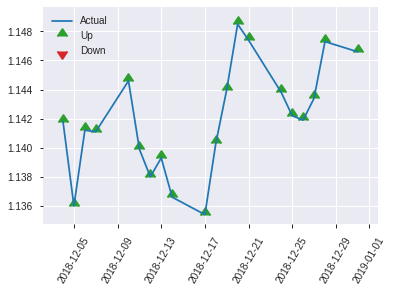


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.23668033835744762
RMSE: 0.4864980353068732
LogLoss: 0.6649012578649889
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 353.8308882659767
Residual deviance: 340.42944402687436
AIC: 442.42944402687436
AUC: 0.6229528307673434
pr_auc: 0.5256241666338737
Gini: 0.24590566153468685
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40047375228624743: 


,0,1,Error,Rate
0,55.0,82.0,0.5985,(82.0/137.0)
1,16.0,103.0,0.1345,(16.0/119.0)
Total,71.0,185.0,0.3828,(98.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4004738,0.6776316,184.0
max f2,0.2715493,0.8228731,240.0
max f0point5,0.4004738,0.5995343,184.0
max accuracy,0.4004738,0.6171875,184.0
max precision,0.6674667,0.6,4.0
max recall,0.2211834,1.0,250.0
max specificity,0.8141244,0.9927007,0.0
max absolute_mcc,0.4004738,0.2974677,184.0
max min_per_class_accuracy,0.4753323,0.5985401,126.0
max mean_per_class_accuracy,0.4004738,0.6335030,184.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.50 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6752103,0.7170868,0.7170868,0.3333333,0.7280759,0.3333333,0.7280759,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.6652879,1.4341737,1.0756303,0.6666667,0.6691651,0.5,0.6986205,0.0168067,0.0252101,43.4173669,7.5630252
,3,0.03125,0.6581916,0.0,0.8067227,0.0,0.6625472,0.375,0.6896022,0.0,0.0252101,-100.0,-19.3277311
,4,0.0429688,0.6483104,1.4341737,0.9778457,0.6666667,0.6520159,0.4545455,0.6793514,0.0168067,0.0420168,43.4173669,-2.2154316
,5,0.0507812,0.6404572,1.0756303,0.9928895,0.5,0.6438110,0.4615385,0.6738836,0.0084034,0.0504202,7.5630252,-0.7110537
,6,0.1015625,0.6052506,0.8274079,0.9101487,0.3846154,0.6218006,0.4230769,0.6478421,0.0420168,0.0924370,-17.2592114,-8.9851325
,7,0.1523438,0.5899607,1.3238526,1.0480500,0.6153846,0.5983710,0.4871795,0.6313517,0.0672269,0.1596639,32.3852618,4.8049989
,8,0.203125,0.5620182,1.4893342,1.1583710,0.6923077,0.5751952,0.5384615,0.6173126,0.0756303,0.2352941,48.9334195,15.8371041
,9,0.3007812,0.5399460,1.1186555,1.1454764,0.52,0.5491984,0.5324675,0.5951976,0.1092437,0.3445378,11.8655462,14.5476372
,10,0.4023438,0.5066129,1.3238526,1.1905034,0.6153846,0.5245331,0.5533981,0.5773599,0.1344538,0.4789916,32.3852618,19.0503386


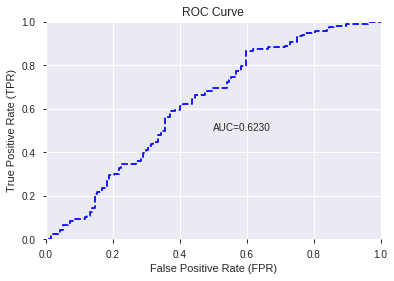

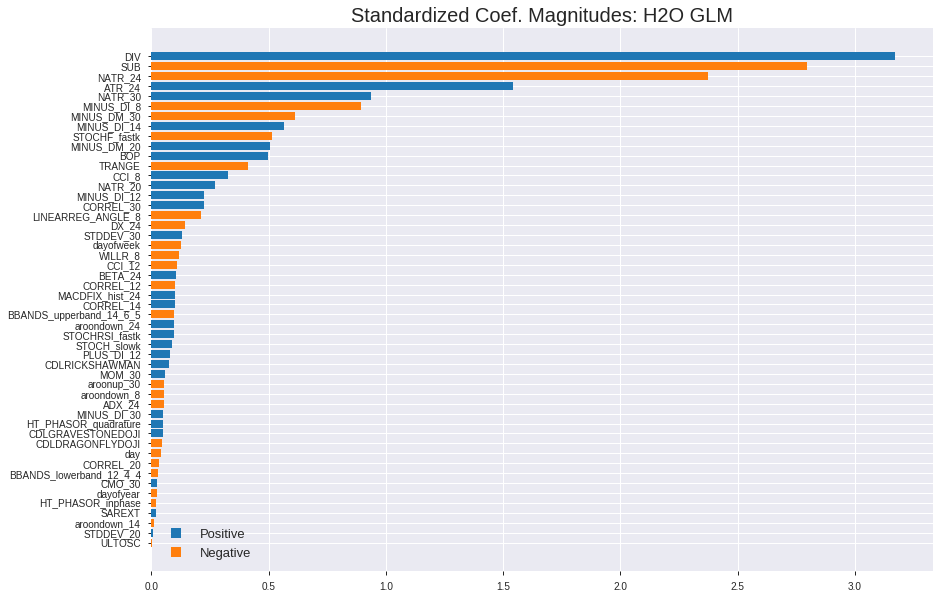

'log_likelihood'
--2019-12-07 22:58:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.9.68
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.9.68|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


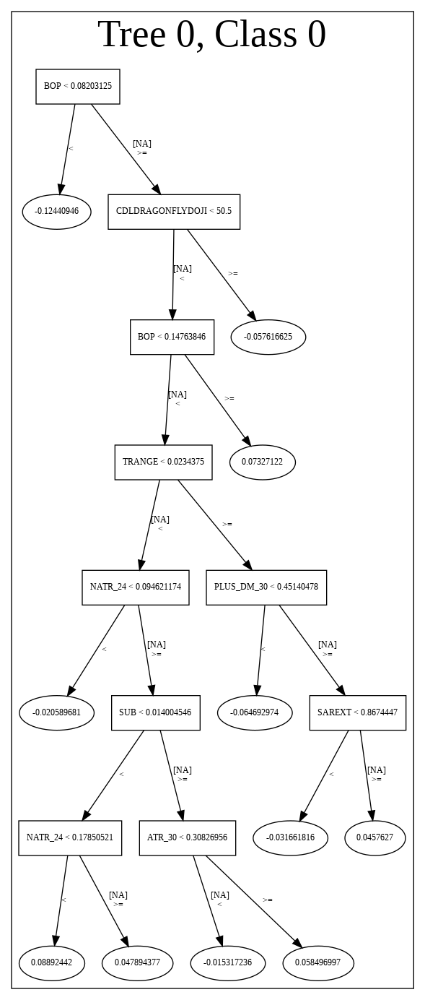

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_225827_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_225827_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_55_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_55_s

['DIV',
 'SUB',
 'NATR_24',
 'ATR_24',
 'NATR_30',
 'MINUS_DI_8',
 'MINUS_DM_30',
 'MINUS_DI_14',
 'STOCHF_fastk',
 'MINUS_DM_20',
 'BOP',
 'TRANGE',
 'CCI_8',
 'NATR_20',
 'MINUS_DI_12',
 'CORREL_30',
 'LINEARREG_ANGLE_8',
 'DX_24',
 'STDDEV_30',
 'dayofweek',
 'WILLR_8',
 'CCI_12',
 'BETA_24',
 'CORREL_12',
 'MACDFIX_hist_24',
 'CORREL_14',
 'BBANDS_upperband_14_6_5',
 'aroondown_24',
 'STOCHRSI_fastk',
 'STOCH_slowk',
 'PLUS_DI_12',
 'CDLRICKSHAWMAN',
 'MOM_30',
 'aroonup_30',
 'aroondown_8',
 'ADX_24',
 'MINUS_DI_30',
 'HT_PHASOR_quadrature',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'day',
 'CORREL_20',
 'BBANDS_lowerband_12_4_4',
 'CMO_30',
 'dayofyear',
 'HT_PHASOR_inphase',
 'SAREXT',
 'aroondown_14',
 'STDDEV_20',
 'ULTOSC']

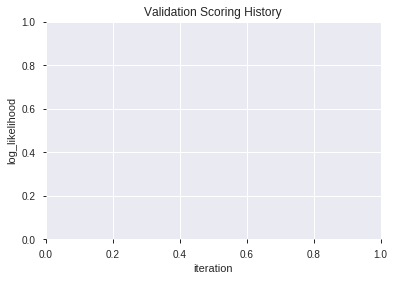

In [29]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_225839_model_4,0.644851,0.658329,0.376342,0.483016,0.233304
1,XGBoost_grid_1_AutoML_20191207_225839_model_6,0.640680,0.660293,0.402779,0.484401,0.234644
2,XGBoost_grid_1_AutoML_20191207_225839_model_5,0.628167,0.680561,0.400570,0.493326,0.243371
3,XGBoost_grid_1_AutoML_20191207_225839_model_2,0.625836,0.668317,0.400233,0.487858,0.238006
4,XGBoost_grid_1_AutoML_20191207_225839_model_3,0.620622,0.664113,0.413513,0.486343,0.236529
5,XGBoost_grid_1_AutoML_20191207_225839_model_7,0.619886,0.672327,0.419371,0.489632,0.239740
6,XGBoost_3_AutoML_20191207_225839,0.614181,0.671395,0.360087,0.489815,0.239919
7,XGBoost_2_AutoML_20191207_225839,0.612035,0.674146,0.412071,0.491126,0.241205
8,XGBoost_grid_1_AutoML_20191207_225839_model_1,0.608416,0.674849,0.396031,0.491132,0.241211
9,XGBoost_1_AutoML_20191207_225839,0.605226,0.682910,0.395479,0.494619,0.244648


,variable,relative_importance,scaled_importance,percentage
0,BOP,399.518860,1.000000,0.102251
1,DIV,227.108841,0.568456,0.058125
2,TRANGE,214.359634,0.536544,0.054862
3,SUB,210.282440,0.526339,0.053819
4,aroondown_8,146.909195,0.367715,0.037599
5,ULTOSC,134.009521,0.335427,0.034298
6,STOCHF_fastk,130.191116,0.325870,0.033320
7,CORREL_20,118.943039,0.297716,0.030442
8,CMO_30,112.812935,0.282372,0.028873
9,MINUS_DI_8,107.394775,0.268810,0.027486


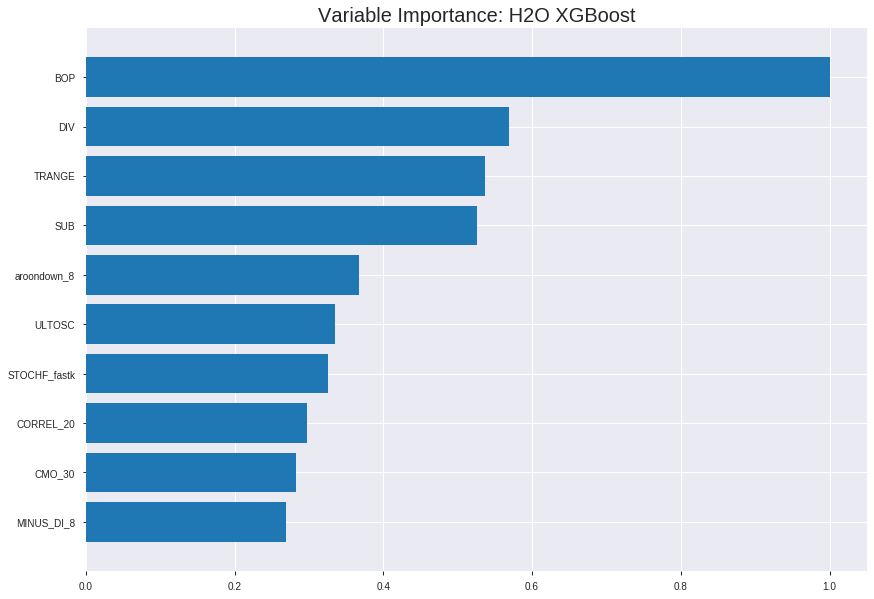

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_225839_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.19909373970444133
RMSE: 0.446199215266501
LogLoss: 0.5868130916511853
Mean Per-Class Error: 0.2560920826766515
AUC: 0.8135941907505747
pr_auc: 0.7796367782107655
Gini: 0.6271883815011494
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4600794851779938: 


,0,1,Error,Rate
0,571.0,360.0,0.3867,(360.0/931.0)
1,120.0,736.0,0.1402,(120.0/856.0)
Total,691.0,1096.0,0.2686,(480.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4600795,0.7540984,215.0
max f2,0.3754849,0.8527291,284.0
max f0point5,0.5343280,0.7237585,144.0
max accuracy,0.4799725,0.7409065,197.0
max precision,0.7601564,1.0,0.0
max recall,0.2365448,1.0,367.0
max specificity,0.7601564,1.0,0.0
max absolute_mcc,0.4799725,0.4910878,197.0
max min_per_class_accuracy,0.5012691,0.7271751,176.0
max mean_per_class_accuracy,0.4799725,0.7439079,197.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7129455,1.9716381,1.9716381,0.9444444,0.7286270,0.9444444,0.7286270,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0201455,0.6952321,1.7396807,1.8556594,0.8333333,0.7032129,0.8888889,0.7159200,0.0175234,0.0373832,73.9680685,85.5659398
,3,0.0302182,0.6811978,1.6237020,1.7783403,0.7777778,0.6875904,0.8518519,0.7064768,0.0163551,0.0537383,62.3701973,77.8340256
,4,0.0402910,0.6687992,1.8556594,1.7976700,0.8888889,0.6753219,0.8611111,0.6986880,0.0186916,0.0724299,85.5659398,79.7670042
,5,0.0503637,0.6603113,1.9716381,1.8324637,0.9444444,0.6638790,0.8777778,0.6917262,0.0198598,0.0922897,97.1638110,83.2463655
,6,0.1001679,0.6308495,1.9468786,1.8893515,0.9325843,0.6440033,0.9050279,0.6679981,0.0969626,0.1892523,94.6878610,88.9351538
,7,0.1499720,0.6089243,1.7826840,1.8539284,0.8539326,0.6199216,0.8880597,0.6520324,0.0887850,0.2780374,78.2684028,85.3928372
,8,0.2003358,0.5916693,1.4149403,1.7435682,0.6777778,0.6000330,0.8351955,0.6389599,0.0712617,0.3492991,41.4940291,74.3568240
,9,0.2999440,0.5560042,1.5363922,1.6747672,0.7359551,0.5720362,0.8022388,0.6167352,0.1530374,0.5023364,53.6392156,67.4767227
,10,0.4001119,0.5284734,1.2245797,1.5620629,0.5865922,0.5422871,0.7482517,0.5980972,0.1226636,0.625,22.4579700,56.2062937




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.24001513417376197
RMSE: 0.4899133945645516
LogLoss: 0.6718225375313372
Mean Per-Class Error: 0.405123718302941
AUC: 0.60162245963038
pr_auc: 0.537367596484897
Gini: 0.20324491926075994
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3157375454902649: 


,0,1,Error,Rate
0,29.0,238.0,0.8914,(238.0/267.0)
1,1.0,243.0,0.0041,(1.0/244.0)
Total,30.0,481.0,0.4677,(239.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3157375,0.6703448,370.0
max f2,0.3026911,0.8356164,373.0
max f0point5,0.4092535,0.5823864,284.0
max accuracy,0.4650804,0.5909980,219.0
max precision,0.7428826,1.0,0.0
max recall,0.3026911,1.0,373.0
max specificity,0.7428826,1.0,0.0
max absolute_mcc,0.3026911,0.2257868,373.0
max min_per_class_accuracy,0.4875331,0.5737705,191.0
max mean_per_class_accuracy,0.4163903,0.5948763,273.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 47.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6812531,1.0471311,1.0471311,0.5,0.6983929,0.5,0.6983929,0.0122951,0.0122951,4.7131148,4.7131148
,2,0.0215264,0.6657260,1.2565574,1.1423249,0.6,0.6722428,0.5454545,0.6865065,0.0122951,0.0245902,25.6557377,14.2324888
,3,0.0313112,0.6606630,0.8377049,1.0471311,0.4,0.6631142,0.5,0.6791964,0.0081967,0.0327869,-16.2295082,4.7131148
,4,0.0410959,0.6554882,1.2565574,1.0969945,0.6,0.6577244,0.5238095,0.6740840,0.0122951,0.0450820,25.6557377,9.6994536
,5,0.0508806,0.6418278,0.8377049,1.0471311,0.4,0.6496321,0.5,0.6693817,0.0081967,0.0532787,-16.2295082,4.7131148
,6,0.1017613,0.6102633,1.2887768,1.1679540,0.6153846,0.6246930,0.5576923,0.6470374,0.0655738,0.1188525,28.8776797,16.7953972
,7,0.1506849,0.5906275,0.8377049,1.0607303,0.4,0.5988037,0.5064935,0.6313771,0.0409836,0.1598361,-16.2295082,6.0730253
,8,0.2015656,0.5754334,1.4498739,1.1589607,0.6923077,0.5822549,0.5533981,0.6189773,0.0737705,0.2336066,44.9873897,15.8960688
,9,0.3013699,0.5406883,1.0676631,1.1287258,0.5098039,0.5555349,0.5389610,0.5979671,0.1065574,0.3401639,6.7663131,12.8725782
,10,0.4011742,0.5155303,1.1087271,1.1237505,0.5294118,0.5269699,0.5365854,0.5803044,0.1106557,0.4508197,10.8727097,12.3750500



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:58:44,1.613 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5209849,0.5,0.6931472,0.5,0.0,1.0,0.5225049
,2019-12-07 22:58:44,1.660 sec,5.0,0.4905490,0.6743788,0.7206978,0.6702515,1.6237020,0.3782876,0.4959965,0.6851518,0.6027276,0.5247716,0.5983607,0.4324853
,2019-12-07 22:58:44,1.693 sec,10.0,0.4830154,0.6595123,0.7445322,0.7067002,1.9777423,0.3609401,0.4954289,0.6839843,0.5819058,0.5191881,1.3961749,0.4422701
,2019-12-07 22:58:44,1.728 sec,15.0,0.4757116,0.6451683,0.7656092,0.7277450,1.9716381,0.3128148,0.4950528,0.6831662,0.5767023,0.5160700,0.6980874,0.4500978
,2019-12-07 22:58:44,1.761 sec,20.0,0.4706947,0.6352246,0.7726392,0.7291925,1.8556594,0.3156128,0.4932006,0.6793570,0.5868024,0.5219782,0.6980874,0.4520548
,2019-12-07 22:58:44,1.796 sec,25.0,0.4651415,0.6242878,0.7841809,0.7459235,1.9716381,0.3021824,0.4920369,0.6769030,0.5924050,0.5279804,1.3961749,0.4618395
,2019-12-07 22:58:44,1.831 sec,30.0,0.4609467,0.6159117,0.7881913,0.7477486,1.8556594,0.2870733,0.4906760,0.6739761,0.5977006,0.5310371,1.3961749,0.4540117
,2019-12-07 22:58:44,1.875 sec,35.0,0.4566427,0.6074293,0.7967898,0.7596610,1.9716381,0.3021824,0.4895728,0.6716418,0.6037868,0.5349049,1.0471311,0.4500978
,2019-12-07 22:58:45,1.918 sec,40.0,0.4530418,0.6002058,0.8015192,0.7654094,1.9716381,0.2686066,0.4891025,0.6704417,0.6051913,0.5400189,1.3961749,0.4579256
,2019-12-07 22:58:45,1.960 sec,45.0,0.4494474,0.5931387,0.8078014,0.7732506,1.9716381,0.2669278,0.4902364,0.6725375,0.5985142,0.5351845,1.0471311,0.4677104


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,399.5188599,1.0,0.1022508
DIV,227.1088409,0.5684559,0.0581251
TRANGE,214.3596344,0.5365445,0.0548621
SUB,210.2824402,0.5263392,0.0538186
aroondown_8,146.9091949,0.3677153,0.0375992
---,---,---,---
CDLGRAVESTONEDOJI,26.6205578,0.0666315,0.0068131
aroonup_30,24.6212387,0.0616272,0.0063014
MINUS_DI_14,12.5689812,0.0314603,0.0032168
CORREL_30,11.8943653,0.0297717,0.0030442



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.64453125)

('F1', 0.6752411575562701)

('auc', 0.6448506409863215)

('logloss', 0.6583293623448743)

('mean_per_class_error', 0.3475740661227995)

('rmse', 0.4830156489471984)

('mse', 0.23330411712788318)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


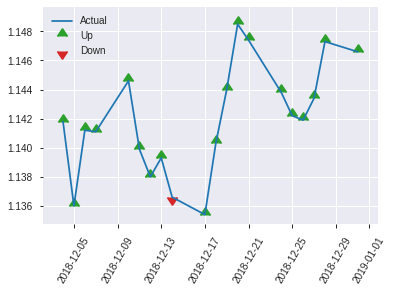


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23330411712788318
RMSE: 0.4830156489471984
LogLoss: 0.6583293623448743
Mean Per-Class Error: 0.3475740661227995
AUC: 0.6448506409863215
pr_auc: 0.5383595111272503
Gini: 0.289701281972643
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39722126722335815: 


,0,1,Error,Rate
0,50.0,87.0,0.635,(87.0/137.0)
1,14.0,105.0,0.1176,(14.0/119.0)
Total,64.0,192.0,0.3945,(101.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3972213,0.6752412,191.0
max f2,0.3005860,0.8227848,234.0
max f0point5,0.4480905,0.6190476,153.0
max accuracy,0.4480905,0.6445312,153.0
max precision,0.4792843,0.6030534,130.0
max recall,0.2447683,1.0,250.0
max specificity,0.7125547,0.9927007,0.0
max absolute_mcc,0.4480905,0.3105719,153.0
max min_per_class_accuracy,0.4829549,0.6277372,125.0
max mean_per_class_accuracy,0.4480905,0.6524259,153.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7013260,0.7170868,0.7170868,0.3333333,0.7074574,0.3333333,0.7074574,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.6451959,1.4341737,1.0756303,0.6666667,0.6740292,0.5,0.6907433,0.0168067,0.0252101,43.4173669,7.5630252
,3,0.03125,0.6389099,1.0756303,1.0756303,0.5,0.6410666,0.5,0.6783241,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.6329220,0.7170868,0.9778457,0.3333333,0.6365372,0.4545455,0.6669277,0.0084034,0.0420168,-28.2913165,-2.2154316
,5,0.0507812,0.6303376,0.0,0.8274079,0.0,0.6310475,0.3846154,0.6614077,0.0,0.0420168,-100.0,-17.2592114
,6,0.1015625,0.5938321,0.9928895,0.9101487,0.4615385,0.6066935,0.4230769,0.6340506,0.0504202,0.0924370,-0.7110537,-8.9851325
,7,0.1523438,0.5815316,1.4893342,1.1032105,0.6923077,0.5895345,0.5128205,0.6192119,0.0756303,0.1680672,48.9334195,10.3210515
,8,0.203125,0.5614775,1.1583710,1.1170006,0.5384615,0.5717065,0.5192308,0.6073356,0.0588235,0.2268908,15.8371041,11.7000646
,9,0.3007812,0.5333468,1.4628571,1.2292917,0.68,0.5468640,0.5714286,0.5877019,0.1428571,0.3697479,46.2857143,22.9291717
,10,0.4023438,0.5054865,1.1583710,1.2113894,0.5384615,0.5184073,0.5631068,0.5702101,0.1176471,0.4873950,15.8371041,21.1389410


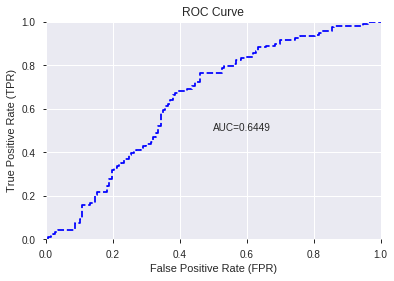

This function is available for GLM models only


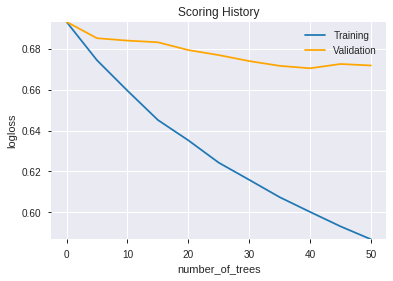

--2019-12-07 22:58:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.241.204
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.241.204|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

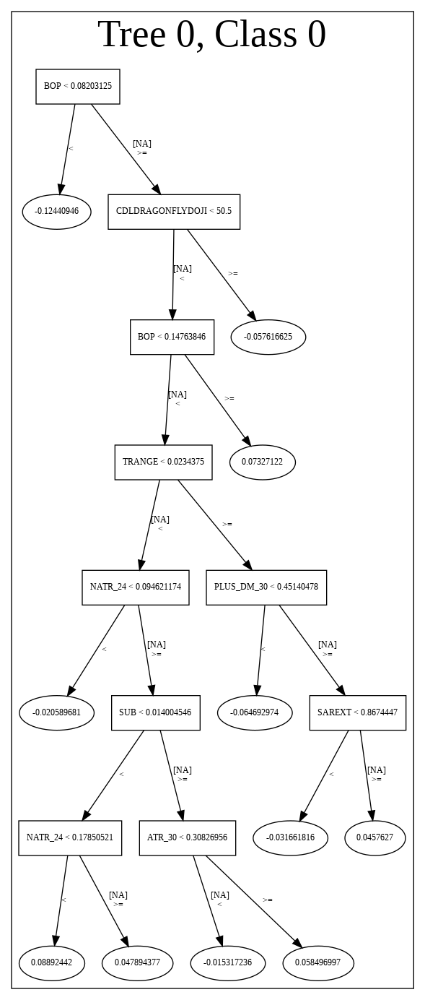

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_225839_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_225839_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_60_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'TRANGE',
 'SUB',
 'aroondown_8',
 'ULTOSC',
 'STOCHF_fastk',
 'CORREL_20',
 'CMO_30',
 'MINUS_DI_8',
 'day',
 'HT_PHASOR_quadrature',
 'BETA_24',
 'ATR_24',
 'BBANDS_upperband_14_6_5',
 'NATR_30',
 'STOCH_slowk',
 'CORREL_12',
 'HT_PHASOR_inphase',
 'CCI_8',
 'STDDEV_30',
 'PLUS_DI_12',
 'NATR_20',
 'MINUS_DM_20',
 'dayofyear',
 'WILLR_8',
 'SAREXT',
 'MINUS_DI_12',
 'DX_24',
 'STDDEV_20',
 'MACDFIX_hist_24',
 'aroondown_24',
 'dayofweek',
 'ADX_24',
 'MINUS_DI_30',
 'CORREL_14',
 'CDLDRAGONFLYDOJI',
 'NATR_24',
 'MOM_30',
 'aroondown_14',
 'MINUS_DM_30',
 'CDLRICKSHAWMAN',
 'STOCHRSI_fastk',
 'BBANDS_lowerband_12_4_4',
 'CCI_12',
 'CDLGRAVESTONEDOJI',
 'aroonup_30',
 'MINUS_DI_14',
 'CORREL_30',
 'LINEARREG_ANGLE_8']

In [30]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [31]:
# DRF with top XGBoost features
model_train(feature_name='XGBF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191207_225916,0.638165,0.668154,0.400233,0.488205,0.238344
1,GBM_4_AutoML_20191207_225916,0.627676,0.684331,0.418819,0.495664,0.245683
2,GBM_grid_1_AutoML_20191207_225916_model_5,0.625897,0.689116,0.382537,0.497983,0.247987
3,GBM_3_AutoML_20191207_225916,0.619825,0.685120,0.410078,0.495091,0.245115
4,GBM_grid_1_AutoML_20191207_225916_model_4,0.611421,0.683956,0.359750,0.495405,0.245426
5,GBM_grid_1_AutoML_20191207_225916_model_1,0.610869,0.679622,0.417929,0.493249,0.243295
6,GBM_grid_1_AutoML_20191207_225916_model_2,0.608416,0.681026,0.373796,0.493945,0.243982
7,GBM_1_AutoML_20191207_225916,0.605778,0.679034,0.401337,0.493419,0.243462
8,GBM_5_AutoML_20191207_225916,0.597252,0.683435,0.401337,0.495097,0.245121
9,GBM_grid_1_AutoML_20191207_225916_model_3,0.587131,0.977463,0.430320,0.558547,0.311975


,variable,relative_importance,scaled_importance,percentage
0,BOP,91.372276,1.000000,0.068201
1,STOCHF_fastk,65.872177,0.720921,0.049167
2,DIV,52.222748,0.571538,0.038979
3,TRANGE,46.468578,0.508563,0.034684
4,SUB,44.100269,0.482644,0.032917
5,dayofyear,41.889812,0.458452,0.031267
6,DX_24,39.815929,0.435755,0.029719
7,STOCH_slowk,37.842411,0.414156,0.028246
8,WILLR_8,36.360279,0.397936,0.027140
9,HT_PHASOR_quadrature,35.942165,0.393360,0.026827


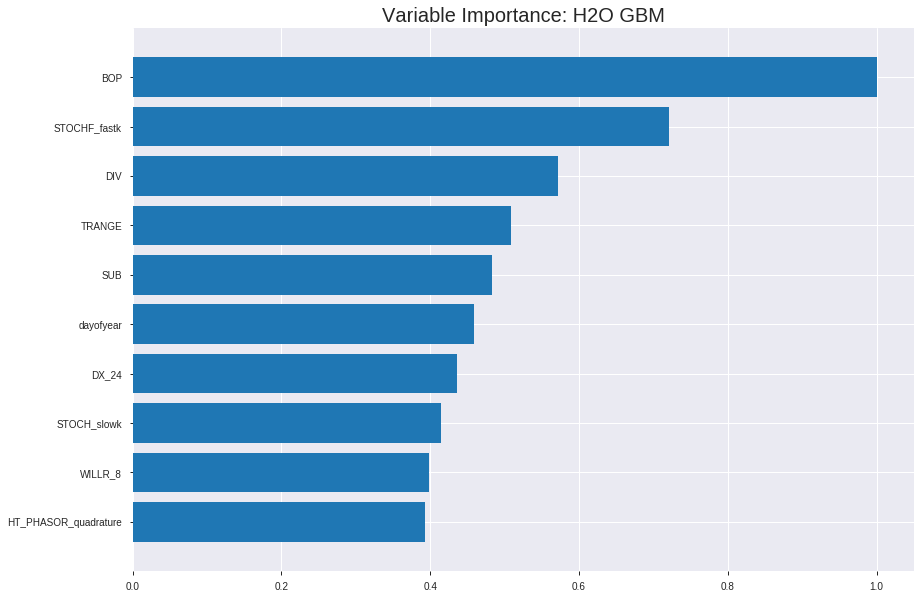

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191207_225916


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.10774478016291579
RMSE: 0.3282450002100806
LogLoss: 0.3826337045148675
Mean Per-Class Error: 0.05264789142415449
AUC: 0.9871827850668059
pr_auc: 0.9854893285229316
Gini: 0.9743655701336118
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5096929246628638: 


,0,1,Error,Rate
0,883.0,48.0,0.0516,(48.0/931.0)
1,46.0,810.0,0.0537,(46.0/856.0)
Total,929.0,858.0,0.0526,(94.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5096929,0.9451575,183.0
max f2,0.4601463,0.9576914,203.0
max f0point5,0.5607563,0.9540142,160.0
max accuracy,0.5096929,0.9473979,183.0
max precision,0.8934286,1.0,0.0
max recall,0.2875285,1.0,294.0
max specificity,0.8934286,1.0,0.0
max absolute_mcc,0.5096929,0.8946223,183.0
max min_per_class_accuracy,0.5096929,0.9462617,183.0
max mean_per_class_accuracy,0.5096929,0.9473521,183.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8543614,2.0876168,2.0876168,1.0,0.8687761,1.0,0.8687761,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.8356167,2.0876168,2.0876168,1.0,0.8429584,1.0,0.8558672,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.8224781,2.0876168,2.0876168,1.0,0.8307908,1.0,0.8475084,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.8113371,2.0876168,2.0876168,1.0,0.8166069,1.0,0.8397830,0.0210280,0.0841121,108.7616822,108.7616822
,5,0.0503637,0.8022889,2.0876168,2.0876168,1.0,0.8055287,1.0,0.8329322,0.0210280,0.1051402,108.7616822,108.7616822
,6,0.1001679,0.7633460,2.0876168,2.0876168,1.0,0.7796723,1.0,0.8064510,0.1039720,0.2091121,108.7616822,108.7616822
,7,0.1499720,0.7349910,2.0876168,2.0876168,1.0,0.7506540,1.0,0.7879214,0.1039720,0.3130841,108.7616822,108.7616822
,8,0.2003358,0.7097698,2.0876168,2.0876168,1.0,0.7233068,1.0,0.7716775,0.1051402,0.4182243,108.7616822,108.7616822
,9,0.2999440,0.6577022,2.0641605,2.0798272,0.9887640,0.6842089,0.9962687,0.7426301,0.2056075,0.6238318,106.4160454,107.9827207
,10,0.4001119,0.5873208,1.9943155,2.0584194,0.9553073,0.6253744,0.9860140,0.7132752,0.1997664,0.8235981,99.4315512,105.8419384




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.23764508067419293
RMSE: 0.4874885441466219
LogLoss: 0.6676390788850329
Mean Per-Class Error: 0.3990759501442869
AUC: 0.6358598882544361
pr_auc: 0.584774048606409
Gini: 0.27171977650887214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29084423880069304: 


,0,1,Error,Rate
0,65.0,202.0,0.7566,(202.0/267.0)
1,18.0,226.0,0.0738,(18.0/244.0)
Total,83.0,428.0,0.4305,(220.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2908442,0.6726190,331.0
max f2,0.2034828,0.8287671,377.0
max f0point5,0.4606837,0.5843195,214.0
max accuracy,0.4828755,0.5988258,201.0
max precision,0.6960021,0.75,40.0
max recall,0.1601219,1.0,390.0
max specificity,0.8823880,0.9962547,0.0
max absolute_mcc,0.2908442,0.2297778,331.0
max min_per_class_accuracy,0.4893351,0.5942623,195.0
max mean_per_class_accuracy,0.4606837,0.6009240,214.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 47.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8379281,1.3961749,1.3961749,0.6666667,0.8568622,0.6666667,0.8568622,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.7846170,1.2565574,1.3327124,0.6,0.8027107,0.6363636,0.8322479,0.0122951,0.0286885,25.6557377,33.2712370
,3,0.0313112,0.7702264,1.2565574,1.3089139,0.6,0.7784441,0.625,0.8154342,0.0122951,0.0409836,25.6557377,30.8913934
,4,0.0410959,0.7571871,1.2565574,1.2964481,0.6,0.7623822,0.6190476,0.8028028,0.0122951,0.0532787,25.6557377,29.6448087
,5,0.0508806,0.7420985,0.8377049,1.2082282,0.4,0.7496378,0.5769231,0.7925787,0.0081967,0.0614754,-16.2295082,20.8228247
,6,0.1017613,0.6862305,1.7720681,1.4901482,0.8461538,0.7099447,0.7115385,0.7512617,0.0901639,0.1516393,77.2068096,49.0148172
,7,0.1506849,0.6587830,1.1727869,1.3871088,0.56,0.6713509,0.6623377,0.7253166,0.0573770,0.2090164,17.2786885,38.7108793
,8,0.2015656,0.6289731,1.2887768,1.3622871,0.6153846,0.6435669,0.6504854,0.7046808,0.0655738,0.2745902,28.8776797,36.2287124
,9,0.3013699,0.5770884,1.0265992,1.2511177,0.4901961,0.6049985,0.5974026,0.6716691,0.1024590,0.3770492,2.6599164,25.1117735
,10,0.4011742,0.5338974,0.9444712,1.1748301,0.4509804,0.5570444,0.5609756,0.6431527,0.0942623,0.4713115,-5.5528769,17.4830068



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:59:18,0.003 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 22:59:18,0.070 sec,5.0,0.4578267,0.6107641,0.8634319,0.8452698,2.0876168,0.2344712,0.4880496,0.6691572,0.6401655,0.5858518,1.7452186,0.4324853
,2019-12-07 22:59:18,0.140 sec,10.0,0.4200915,0.5402479,0.9279710,0.9176963,2.0876168,0.1477336,0.4845085,0.6614808,0.6389068,0.5827060,1.0471311,0.4559687
,2019-12-07 22:59:18,0.210 sec,15.0,0.3908951,0.4878543,0.9585726,0.9537190,2.0876168,0.1085618,0.4817273,0.6553112,0.6472954,0.5947471,1.0471311,0.4481409
,2019-12-07 22:59:18,0.280 sec,20.0,0.3665950,0.4455661,0.9727030,0.9697258,2.0876168,0.0800224,0.4818367,0.6552100,0.6472033,0.5939278,1.3961749,0.4442270
,2019-12-07 22:59:18,0.352 sec,25.0,0.3434309,0.4071748,0.9827790,0.9809636,2.0876168,0.0643537,0.4833226,0.6583549,0.6439338,0.5937548,1.3961749,0.4481409
,2019-12-07 22:59:18,0.417 sec,30.0,0.3282450,0.3826337,0.9871828,0.9854893,2.0876168,0.0526021,0.4874885,0.6676391,0.6358599,0.5847740,1.3961749,0.4305284


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,91.3722763,1.0,0.0682009
STOCHF_fastk,65.8721771,0.7209208,0.0491675
DIV,52.2227478,0.5715382,0.0389794
TRANGE,46.4685783,0.5085632,0.0346845
SUB,44.1002693,0.4826439,0.0329168
---,---,---,---
CDLDRAGONFLYDOJI,8.5467968,0.0935382,0.0063794
MINUS_DM_30,8.1525650,0.0892236,0.0060851
MINUS_DM_20,7.5185456,0.0822848,0.0056119
SAREXT,6.1555786,0.0673681,0.0045946



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6171875)

('F1', 0.6666666666666667)

('auc', 0.6381647549530761)

('logloss', 0.6681540107051087)

('mean_per_class_error', 0.37919401337177205)

('rmse', 0.4882053305816873)

('mse', 0.23834444480837458)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


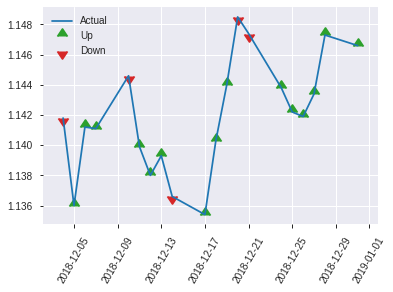


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.23834444480837458
RMSE: 0.4882053305816873
LogLoss: 0.6681540107051087
Mean Per-Class Error: 0.37919401337177205
AUC: 0.6381647549530761
pr_auc: 0.5497423114276274
Gini: 0.27632950990615224
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27924722230799315: 


,0,1,Error,Rate
0,40.0,97.0,0.708,(97.0/137.0)
1,11.0,108.0,0.0924,(11.0/119.0)
Total,51.0,205.0,0.4219,(108.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2792472,0.6666667,204.0
max f2,0.1839587,0.8240997,245.0
max f0point5,0.4152516,0.5925926,138.0
max accuracy,0.4277479,0.6171875,128.0
max precision,0.8416830,1.0,0.0
max recall,0.1839587,1.0,245.0
max specificity,0.8416830,1.0,0.0
max absolute_mcc,0.3145325,0.2590624,187.0
max min_per_class_accuracy,0.4296319,0.6058394,126.0
max mean_per_class_accuracy,0.4152516,0.6208060,138.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 43.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7787396,1.4341737,1.4341737,0.6666667,0.8061286,0.6666667,0.8061286,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.7556113,0.7170868,1.0756303,0.3333333,0.7638810,0.5,0.7850048,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.7442196,0.0,0.8067227,0.0,0.7484150,0.375,0.7758574,0.0,0.0252101,-100.0,-19.3277311
,4,0.0429688,0.7268705,1.4341737,0.9778457,0.6666667,0.7338421,0.4545455,0.7643987,0.0168067,0.0420168,43.4173669,-2.2154316
,5,0.0507812,0.7224269,2.1512605,1.1583710,1.0,0.7246703,0.5384615,0.7582866,0.0168067,0.0588235,115.1260504,15.8371041
,6,0.1015625,0.6820172,1.1583710,1.1583710,0.5384615,0.7093144,0.5384615,0.7338005,0.0588235,0.1176471,15.8371041,15.8371041
,7,0.1523438,0.6318568,1.4893342,1.2686921,0.6923077,0.6615309,0.5897436,0.7097106,0.0756303,0.1932773,48.9334195,26.8692092
,8,0.203125,0.5901847,1.3238526,1.2824822,0.6153846,0.6067614,0.5961538,0.6839733,0.0672269,0.2605042,32.3852618,28.2482224
,9,0.3007812,0.5245207,1.0326050,1.2013533,0.48,0.5595091,0.5584416,0.6435628,0.1008403,0.3613445,3.2605042,20.1353269
,10,0.4023438,0.4815922,1.4065934,1.2531615,0.6538462,0.5017207,0.5825243,0.6077580,0.1428571,0.5042017,40.6593407,25.3161459


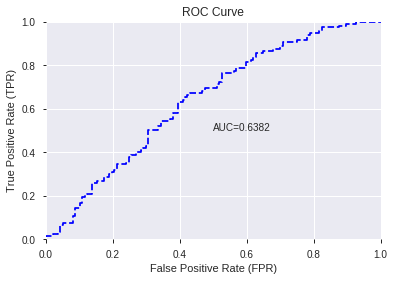

This function is available for GLM models only


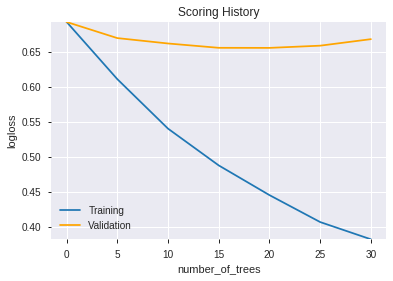

--2019-12-07 22:59:28--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.136.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.136.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       37
            colName:     CDLDRAGONFLYDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 5
            r

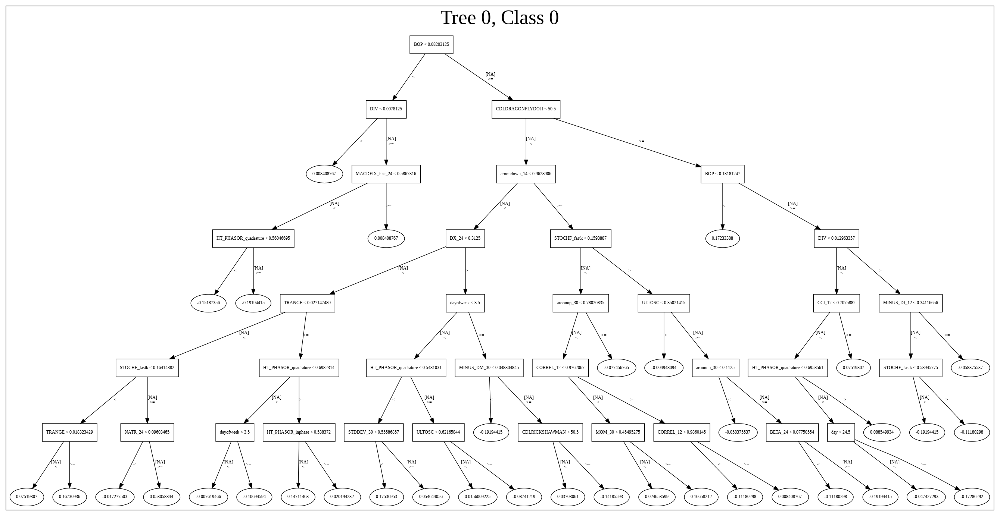

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191207_225916',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191207_225916',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_70_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_70_sid_9f32',
   'type': 'Key<

['BOP',
 'STOCHF_fastk',
 'DIV',
 'TRANGE',
 'SUB',
 'dayofyear',
 'DX_24',
 'STOCH_slowk',
 'WILLR_8',
 'HT_PHASOR_quadrature',
 'STDDEV_20',
 'BBANDS_upperband_14_6_5',
 'BETA_24',
 'HT_PHASOR_inphase',
 'MINUS_DI_8',
 'dayofweek',
 'ADX_24',
 'CCI_12',
 'MOM_30',
 'ULTOSC',
 'STOCHRSI_fastk',
 'CORREL_12',
 'CMO_30',
 'day',
 'MINUS_DI_14',
 'BBANDS_lowerband_12_4_4',
 'ATR_24',
 'PLUS_DI_12',
 'aroondown_14',
 'CCI_8',
 'MACDFIX_hist_24',
 'CORREL_14',
 'aroondown_8',
 'NATR_20',
 'aroonup_30',
 'CORREL_30',
 'LINEARREG_ANGLE_8',
 'CORREL_20',
 'STDDEV_30',
 'NATR_30',
 'aroondown_24',
 'NATR_24',
 'MINUS_DI_30',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'CDLDRAGONFLYDOJI',
 'MINUS_DM_30',
 'MINUS_DM_20',
 'SAREXT',
 'MINUS_DI_12']

In [32]:
# GBM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [33]:
# StackedEnsemble with top XGBoost features
model_train(feature_name='XGBF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191207_225937,0.638165,0.668154,0.400233,0.488205,0.238344
1,GBM_4_AutoML_20191207_225937,0.627676,0.684331,0.418819,0.495664,0.245683
2,GLM_grid_1_AutoML_20191207_225937_model_1,0.622953,0.664901,0.366497,0.486498,0.236680
3,GBM_3_AutoML_20191207_225937,0.619825,0.685120,0.410078,0.495091,0.245115
4,DRF_1_AutoML_20191207_225937,0.617708,0.673059,0.425566,0.490544,0.240633
5,XGBoost_3_AutoML_20191207_225937,0.614181,0.671395,0.360087,0.489815,0.239919
6,XGBoost_2_AutoML_20191207_225937,0.612035,0.674146,0.412071,0.491126,0.241205
7,GBM_1_AutoML_20191207_225937,0.605778,0.679034,0.401337,0.493419,0.243462
8,XGBoost_1_AutoML_20191207_225937,0.605226,0.682910,0.395479,0.494619,0.244648
9,GBM_5_AutoML_20191207_225937,0.597252,0.683435,0.401337,0.495097,0.245121


,variable,relative_importance,scaled_importance,percentage
0,BOP,91.372276,1.000000,0.068201
1,STOCHF_fastk,65.872177,0.720921,0.049167
2,DIV,52.222748,0.571538,0.038979
3,TRANGE,46.468578,0.508563,0.034684
4,SUB,44.100269,0.482644,0.032917
5,dayofyear,41.889812,0.458452,0.031267
6,DX_24,39.815929,0.435755,0.029719
7,STOCH_slowk,37.842411,0.414156,0.028246
8,WILLR_8,36.360279,0.397936,0.027140
9,HT_PHASOR_quadrature,35.942165,0.393360,0.026827


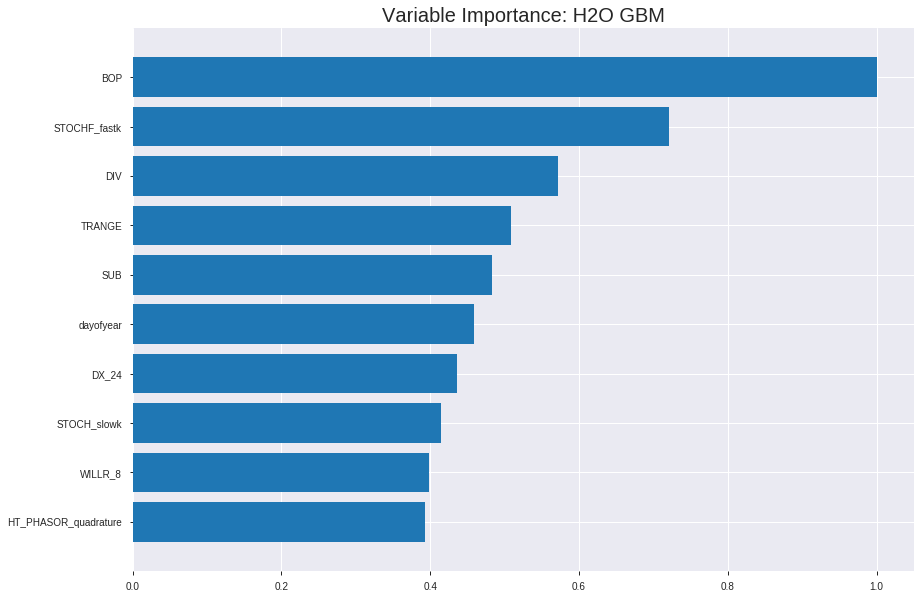

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191207_225937


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.10774478016291579
RMSE: 0.3282450002100806
LogLoss: 0.3826337045148675
Mean Per-Class Error: 0.05264789142415449
AUC: 0.9871827850668059
pr_auc: 0.9854893285229316
Gini: 0.9743655701336118
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5096929246628638: 


,0,1,Error,Rate
0,883.0,48.0,0.0516,(48.0/931.0)
1,46.0,810.0,0.0537,(46.0/856.0)
Total,929.0,858.0,0.0526,(94.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5096929,0.9451575,183.0
max f2,0.4601463,0.9576914,203.0
max f0point5,0.5607563,0.9540142,160.0
max accuracy,0.5096929,0.9473979,183.0
max precision,0.8934286,1.0,0.0
max recall,0.2875285,1.0,294.0
max specificity,0.8934286,1.0,0.0
max absolute_mcc,0.5096929,0.8946223,183.0
max min_per_class_accuracy,0.5096929,0.9462617,183.0
max mean_per_class_accuracy,0.5096929,0.9473521,183.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8543614,2.0876168,2.0876168,1.0,0.8687761,1.0,0.8687761,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.8356167,2.0876168,2.0876168,1.0,0.8429584,1.0,0.8558672,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.8224781,2.0876168,2.0876168,1.0,0.8307908,1.0,0.8475084,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.8113371,2.0876168,2.0876168,1.0,0.8166069,1.0,0.8397830,0.0210280,0.0841121,108.7616822,108.7616822
,5,0.0503637,0.8022889,2.0876168,2.0876168,1.0,0.8055287,1.0,0.8329322,0.0210280,0.1051402,108.7616822,108.7616822
,6,0.1001679,0.7633460,2.0876168,2.0876168,1.0,0.7796723,1.0,0.8064510,0.1039720,0.2091121,108.7616822,108.7616822
,7,0.1499720,0.7349910,2.0876168,2.0876168,1.0,0.7506540,1.0,0.7879214,0.1039720,0.3130841,108.7616822,108.7616822
,8,0.2003358,0.7097698,2.0876168,2.0876168,1.0,0.7233068,1.0,0.7716775,0.1051402,0.4182243,108.7616822,108.7616822
,9,0.2999440,0.6577022,2.0641605,2.0798272,0.9887640,0.6842089,0.9962687,0.7426301,0.2056075,0.6238318,106.4160454,107.9827207
,10,0.4001119,0.5873208,1.9943155,2.0584194,0.9553073,0.6253744,0.9860140,0.7132752,0.1997664,0.8235981,99.4315512,105.8419384




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.23764508067419293
RMSE: 0.4874885441466219
LogLoss: 0.6676390788850329
Mean Per-Class Error: 0.3990759501442869
AUC: 0.6358598882544361
pr_auc: 0.584774048606409
Gini: 0.27171977650887214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29084423880069304: 


,0,1,Error,Rate
0,65.0,202.0,0.7566,(202.0/267.0)
1,18.0,226.0,0.0738,(18.0/244.0)
Total,83.0,428.0,0.4305,(220.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2908442,0.6726190,331.0
max f2,0.2034828,0.8287671,377.0
max f0point5,0.4606837,0.5843195,214.0
max accuracy,0.4828755,0.5988258,201.0
max precision,0.6960021,0.75,40.0
max recall,0.1601219,1.0,390.0
max specificity,0.8823880,0.9962547,0.0
max absolute_mcc,0.2908442,0.2297778,331.0
max min_per_class_accuracy,0.4893351,0.5942623,195.0
max mean_per_class_accuracy,0.4606837,0.6009240,214.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 47.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8379281,1.3961749,1.3961749,0.6666667,0.8568622,0.6666667,0.8568622,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.7846170,1.2565574,1.3327124,0.6,0.8027107,0.6363636,0.8322479,0.0122951,0.0286885,25.6557377,33.2712370
,3,0.0313112,0.7702264,1.2565574,1.3089139,0.6,0.7784441,0.625,0.8154342,0.0122951,0.0409836,25.6557377,30.8913934
,4,0.0410959,0.7571871,1.2565574,1.2964481,0.6,0.7623822,0.6190476,0.8028028,0.0122951,0.0532787,25.6557377,29.6448087
,5,0.0508806,0.7420985,0.8377049,1.2082282,0.4,0.7496378,0.5769231,0.7925787,0.0081967,0.0614754,-16.2295082,20.8228247
,6,0.1017613,0.6862305,1.7720681,1.4901482,0.8461538,0.7099447,0.7115385,0.7512617,0.0901639,0.1516393,77.2068096,49.0148172
,7,0.1506849,0.6587830,1.1727869,1.3871088,0.56,0.6713509,0.6623377,0.7253166,0.0573770,0.2090164,17.2786885,38.7108793
,8,0.2015656,0.6289731,1.2887768,1.3622871,0.6153846,0.6435669,0.6504854,0.7046808,0.0655738,0.2745902,28.8776797,36.2287124
,9,0.3013699,0.5770884,1.0265992,1.2511177,0.4901961,0.6049985,0.5974026,0.6716691,0.1024590,0.3770492,2.6599164,25.1117735
,10,0.4011742,0.5338974,0.9444712,1.1748301,0.4509804,0.5570444,0.5609756,0.6431527,0.0942623,0.4713115,-5.5528769,17.4830068



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:59:43,0.002 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 22:59:43,0.066 sec,5.0,0.4578267,0.6107641,0.8634319,0.8452698,2.0876168,0.2344712,0.4880496,0.6691572,0.6401655,0.5858518,1.7452186,0.4324853
,2019-12-07 22:59:43,0.134 sec,10.0,0.4200915,0.5402479,0.9279710,0.9176963,2.0876168,0.1477336,0.4845085,0.6614808,0.6389068,0.5827060,1.0471311,0.4559687
,2019-12-07 22:59:44,0.201 sec,15.0,0.3908951,0.4878543,0.9585726,0.9537190,2.0876168,0.1085618,0.4817273,0.6553112,0.6472954,0.5947471,1.0471311,0.4481409
,2019-12-07 22:59:44,0.268 sec,20.0,0.3665950,0.4455661,0.9727030,0.9697258,2.0876168,0.0800224,0.4818367,0.6552100,0.6472033,0.5939278,1.3961749,0.4442270
,2019-12-07 22:59:44,0.343 sec,25.0,0.3434309,0.4071748,0.9827790,0.9809636,2.0876168,0.0643537,0.4833226,0.6583549,0.6439338,0.5937548,1.3961749,0.4481409
,2019-12-07 22:59:44,0.417 sec,30.0,0.3282450,0.3826337,0.9871828,0.9854893,2.0876168,0.0526021,0.4874885,0.6676391,0.6358599,0.5847740,1.3961749,0.4305284


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,91.3722763,1.0,0.0682009
STOCHF_fastk,65.8721771,0.7209208,0.0491675
DIV,52.2227478,0.5715382,0.0389794
TRANGE,46.4685783,0.5085632,0.0346845
SUB,44.1002693,0.4826439,0.0329168
---,---,---,---
CDLDRAGONFLYDOJI,8.5467968,0.0935382,0.0063794
MINUS_DM_30,8.1525650,0.0892236,0.0060851
MINUS_DM_20,7.5185456,0.0822848,0.0056119
SAREXT,6.1555786,0.0673681,0.0045946



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6171875)

('F1', 0.6666666666666667)

('auc', 0.6381647549530761)

('logloss', 0.6681540107051087)

('mean_per_class_error', 0.37919401337177205)

('rmse', 0.4882053305816873)

('mse', 0.23834444480837458)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


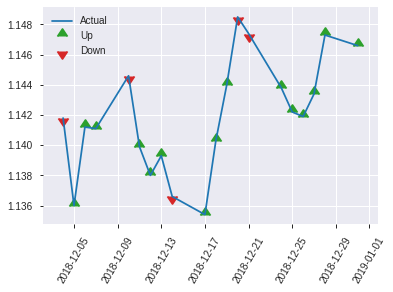


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.23834444480837458
RMSE: 0.4882053305816873
LogLoss: 0.6681540107051087
Mean Per-Class Error: 0.37919401337177205
AUC: 0.6381647549530761
pr_auc: 0.5497423114276274
Gini: 0.27632950990615224
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27924722230799315: 


,0,1,Error,Rate
0,40.0,97.0,0.708,(97.0/137.0)
1,11.0,108.0,0.0924,(11.0/119.0)
Total,51.0,205.0,0.4219,(108.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2792472,0.6666667,204.0
max f2,0.1839587,0.8240997,245.0
max f0point5,0.4152516,0.5925926,138.0
max accuracy,0.4277479,0.6171875,128.0
max precision,0.8416830,1.0,0.0
max recall,0.1839587,1.0,245.0
max specificity,0.8416830,1.0,0.0
max absolute_mcc,0.3145325,0.2590624,187.0
max min_per_class_accuracy,0.4296319,0.6058394,126.0
max mean_per_class_accuracy,0.4152516,0.6208060,138.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 43.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7787396,1.4341737,1.4341737,0.6666667,0.8061286,0.6666667,0.8061286,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.7556113,0.7170868,1.0756303,0.3333333,0.7638810,0.5,0.7850048,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.7442196,0.0,0.8067227,0.0,0.7484150,0.375,0.7758574,0.0,0.0252101,-100.0,-19.3277311
,4,0.0429688,0.7268705,1.4341737,0.9778457,0.6666667,0.7338421,0.4545455,0.7643987,0.0168067,0.0420168,43.4173669,-2.2154316
,5,0.0507812,0.7224269,2.1512605,1.1583710,1.0,0.7246703,0.5384615,0.7582866,0.0168067,0.0588235,115.1260504,15.8371041
,6,0.1015625,0.6820172,1.1583710,1.1583710,0.5384615,0.7093144,0.5384615,0.7338005,0.0588235,0.1176471,15.8371041,15.8371041
,7,0.1523438,0.6318568,1.4893342,1.2686921,0.6923077,0.6615309,0.5897436,0.7097106,0.0756303,0.1932773,48.9334195,26.8692092
,8,0.203125,0.5901847,1.3238526,1.2824822,0.6153846,0.6067614,0.5961538,0.6839733,0.0672269,0.2605042,32.3852618,28.2482224
,9,0.3007812,0.5245207,1.0326050,1.2013533,0.48,0.5595091,0.5584416,0.6435628,0.1008403,0.3613445,3.2605042,20.1353269
,10,0.4023438,0.4815922,1.4065934,1.2531615,0.6538462,0.5017207,0.5825243,0.6077580,0.1428571,0.5042017,40.6593407,25.3161459


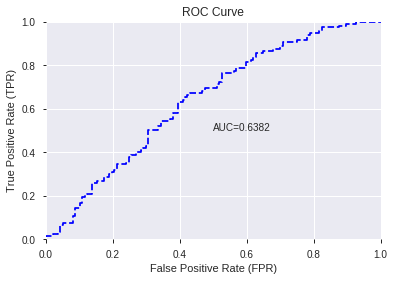

This function is available for GLM models only


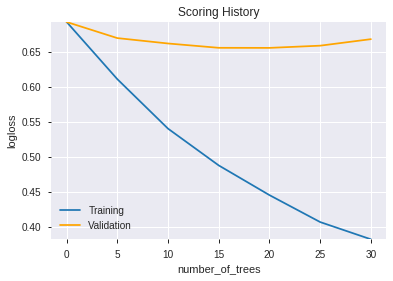

--2019-12-07 22:59:52--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.98.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.98.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       37
            colName:     CDLDRAGONFLYDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 5
            right

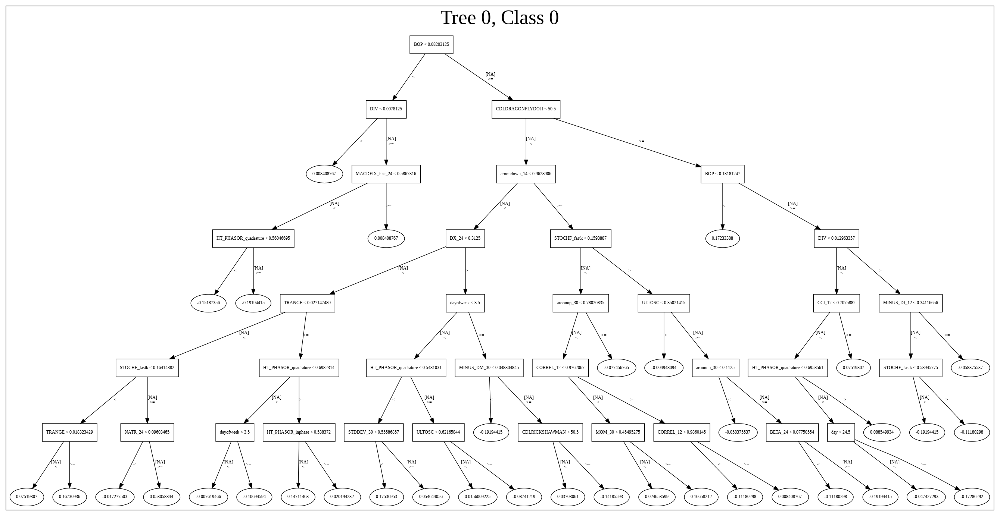

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191207_225937',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191207_225937',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_78_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_78_sid_9f32',
   'type': 'Key<

['BOP',
 'STOCHF_fastk',
 'DIV',
 'TRANGE',
 'SUB',
 'dayofyear',
 'DX_24',
 'STOCH_slowk',
 'WILLR_8',
 'HT_PHASOR_quadrature',
 'STDDEV_20',
 'BBANDS_upperband_14_6_5',
 'BETA_24',
 'HT_PHASOR_inphase',
 'MINUS_DI_8',
 'dayofweek',
 'ADX_24',
 'CCI_12',
 'MOM_30',
 'ULTOSC',
 'STOCHRSI_fastk',
 'CORREL_12',
 'CMO_30',
 'day',
 'MINUS_DI_14',
 'BBANDS_lowerband_12_4_4',
 'ATR_24',
 'PLUS_DI_12',
 'aroondown_14',
 'CCI_8',
 'MACDFIX_hist_24',
 'CORREL_14',
 'aroondown_8',
 'NATR_20',
 'aroonup_30',
 'CORREL_30',
 'LINEARREG_ANGLE_8',
 'CORREL_20',
 'STDDEV_30',
 'NATR_30',
 'aroondown_24',
 'NATR_24',
 'MINUS_DI_30',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'CDLDRAGONFLYDOJI',
 'MINUS_DM_30',
 'MINUS_DM_20',
 'SAREXT',
 'MINUS_DI_12']

In [34]:
# All algos with top XGBoost features
model_train(feature_name='XGBF',model_algo=None,features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [36]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [37]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [38]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [39]:
# DRF with top PCA features
model_train(feature_name='PCA',model_algo="DRF",training_frame=training_frame)

[]

In [40]:
# GBM with top PCA features
model_train(feature_name='PCA',model_algo="GBM",training_frame=training_frame)

[]

In [41]:
# StackedEnsemble with top PCA features
model_train(feature_name='PCA',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [42]:
# All algos with top PCA features
model_train(feature_name='PCA',model_algo=None,training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [44]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [45]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [46]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [47]:
# DRF with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DRF",training_frame=training_frame)

[]

In [48]:
# GBM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GBM",training_frame=training_frame)

[]

In [49]:
# StackedEnsemble with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [50]:
# All algos with Generalized Low Rank
model_train(feature_name='GLRM',model_algo=None,training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [52]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [53]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [54]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [55]:
# DRF with low correlation features
model_train(feature_name='HCF',model_algo="DRF",features_list=features_list)

[]

In [56]:
# GBM with low correlation features
model_train(feature_name='HCF',model_algo="GBM",features_list=features_list)

[]

In [57]:
# StackedEnsemble with low correlation features
model_train(feature_name='HCF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [58]:
# All algos with low correlation features
model_train(feature_name='HCF',model_algo=None,features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [60]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [61]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [62]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [63]:
# DRF with Low Variance features
model_train(feature_name='LVF',model_algo="DRF",features_list=features_list)

[]

In [64]:
# GBM with Low Variance features
model_train(feature_name='LVF',model_algo="GBM",features_list=features_list)

[]

In [65]:
# StackedEnsemble with Low Variance features
model_train(feature_name='LVF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [66]:
# All algos with Low Variance features
model_train(feature_name='LVF',model_algo=None,features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [68]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [69]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [70]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [71]:
# DRF with Select k best features
model_train(feature_name='KBest',model_algo="DRF",features_list=features_list)

[]

In [72]:
# GBM with Select k best features
model_train(feature_name='KBest',model_algo="GBM",features_list=features_list)

[]

In [73]:
# StackedEnsemble with Select k best features
model_train(feature_name='KBest',model_algo="StackedEnsemble",features_list=features_list)

[]

In [74]:
# All algos with Select k best features
model_train(feature_name='KBest',model_algo=None,features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [76]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [77]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [78]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [79]:
# DRF with Select Percentile features
model_train(feature_name='Percentile',model_algo="DRF",features_list=features_list)

[]

In [80]:
# GBM with Select Percentile features
model_train(feature_name='Percentile',model_algo="GBM",features_list=features_list)

[]

In [81]:
# StackedEnsemble with Select Percentile features
model_train(feature_name='Percentile',model_algo="StackedEnsemble",features_list=features_list)

[]

In [82]:
# All algos with Select Percentile features
model_train(feature_name='Percentile',model_algo=None,features_list=features_list)

[]

In [83]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [829] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


5

['BOP', 'CDLBELTHOLD', 'CDLDRAGONFLYDOJI', 'CDLRICKSHAWMAN', 'CDLTAKURI']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20191207_230000,0.551340,0.702411,0.478102,0.504687,0.254709
1,DeepLearning_grid_1_AutoML_20191207_230000_model_6,0.550758,0.698334,0.496350,0.501580,0.251583
2,DeepLearning_grid_1_AutoML_20191207_230000_model_5,0.534196,0.702452,0.496350,0.504086,0.254103
3,DeepLearning_grid_1_AutoML_20191207_230000_model_2,0.529258,0.698529,0.475005,0.502720,0.252727
4,DeepLearning_grid_1_AutoML_20191207_230000_model_7,0.527878,0.708566,0.478102,0.506141,0.256179
5,DeepLearning_grid_1_AutoML_20191207_230000_model_4,0.524535,0.703877,0.478102,0.505388,0.255417
6,DeepLearning_grid_1_AutoML_20191207_230000_model_3,0.524290,0.718924,0.471355,0.511925,0.262067
7,DeepLearning_grid_1_AutoML_20191207_230000_model_1,0.509753,0.729703,0.496350,0.516583,0.266858


,variable,relative_importance,scaled_importance,percentage
0,CDLRICKSHAWMAN,1.000000,1.000000,0.224753
1,CDLDRAGONFLYDOJI,0.966457,0.966457,0.217214
2,BOP,0.857928,0.857928,0.192822
3,CDLTAKURI,0.832558,0.832558,0.187119
4,CDLBELTHOLD,0.792396,0.792396,0.178093


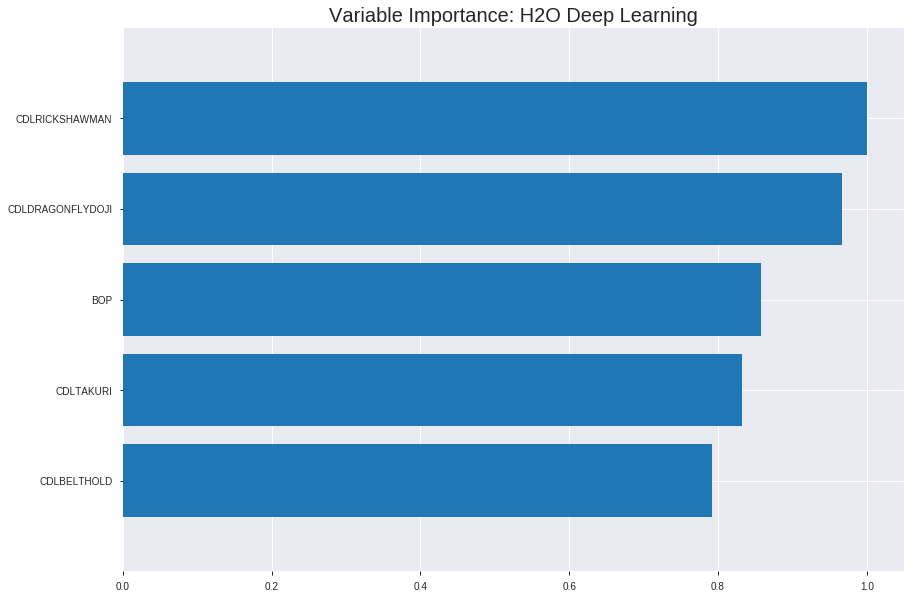

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20191207_230000


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.25099265679438765
RMSE: 0.5009916733782984
LogLoss: 0.7065745818628077
Mean Per-Class Error: 0.4404663611632553
AUC: 0.5701725107160424
pr_auc: 0.5361555439590507
Gini: 0.14034502143208472
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.288430754419249: 


,0,1,Error,Rate
0,202.0,729.0,0.783,(729.0/931.0)
1,86.0,770.0,0.1005,(86.0/856.0)
Total,288.0,1499.0,0.4561,(815.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2884308,0.6539278,303.0
max f2,0.1015182,0.8230532,382.0
max f0point5,0.2897263,0.5623902,302.0
max accuracy,0.5256289,0.5540011,158.0
max precision,0.8795999,0.7222222,9.0
max recall,0.0000000,1.0,399.0
max specificity,0.9230948,0.9989259,0.0
max absolute_mcc,0.2897263,0.1596223,302.0
max min_per_class_accuracy,0.4932612,0.5467290,191.0
max mean_per_class_accuracy,0.2955448,0.5595336,298.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 49.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8768676,1.5077233,1.5077233,0.7222222,0.8877007,0.7222222,0.8877007,0.0151869,0.0151869,50.7723261,50.7723261
,2,0.0201455,0.8511664,1.1597871,1.3337552,0.5555556,0.8688744,0.6388889,0.8782876,0.0116822,0.0268692,15.9787124,33.3755192
,3,0.0302182,0.7385085,1.5077233,1.3917445,0.7222222,0.7868853,0.6666667,0.8478201,0.0151869,0.0420561,50.7723261,39.1744548
,4,0.0402910,0.7064540,1.0438084,1.3047605,0.5,0.7233293,0.625,0.8166974,0.0105140,0.0525701,4.3808411,30.4760514
,5,0.0503637,0.6914724,1.0438084,1.2525701,0.5,0.6981812,0.6,0.7929942,0.0105140,0.0630841,4.3808411,25.2570093
,6,0.1001679,0.6537795,1.1493621,1.2012544,0.5505618,0.6690524,0.5754190,0.7313695,0.0572430,0.1203271,14.9362071,20.1254373
,7,0.2221600,0.6257392,1.1491469,1.1726412,0.5504587,0.6302109,0.5617128,0.6758215,0.1401869,0.2605140,14.9146875,17.2641187
,8,0.2999440,0.5793527,1.0062613,1.1294942,0.4820144,0.5966140,0.5410448,0.6552807,0.0782710,0.3387850,0.6261346,12.9494176
,9,0.4001119,0.5029074,1.0613024,1.1124224,0.5083799,0.5370242,0.5328671,0.6256752,0.1063084,0.4450935,6.1302407,11.2422391
,10,0.6273083,0.4917508,0.9718216,1.0615001,0.4655172,0.4944034,0.5084746,0.5781316,0.2207944,0.6658879,-2.8178376,6.1500079




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.25308051240573404
RMSE: 0.503071080868036
LogLoss: 0.7013811467083011
Mean Per-Class Error: 0.448808865966722
AUC: 0.5517206974887948
pr_auc: 0.5436188402750822
Gini: 0.10344139497758964
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.16641881399120495: 


,0,1,Error,Rate
0,6.0,261.0,0.9775,(261.0/267.0)
1,0.0,244.0,0.0,(0.0/244.0)
Total,6.0,505.0,0.5108,(261.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1664188,0.6515354,306.0
max f2,0.1664188,0.8237677,306.0
max f0point5,0.2940552,0.5473373,269.0
max accuracy,0.6527600,0.5675147,49.0
max precision,0.7104191,0.7692308,21.0
max recall,0.1664188,1.0,306.0
max specificity,0.8863641,0.9962547,0.0
max absolute_mcc,0.6527600,0.1524213,49.0
max min_per_class_accuracy,0.4966469,0.5393258,168.0
max mean_per_class_accuracy,0.6515869,0.5511911,50.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 51.37 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8572062,1.0471311,1.0471311,0.5,0.8761749,0.5,0.8761749,0.0122951,0.0122951,4.7131148,4.7131148
,2,0.0215264,0.7411474,2.0942623,1.5230999,1.0,0.8051568,0.7272727,0.8438940,0.0204918,0.0327869,109.4262295,52.3099851
,3,0.0313112,0.7212868,1.2565574,1.4398053,0.6,0.7307715,0.6875,0.8085432,0.0122951,0.0450820,25.6557377,43.9805328
,4,0.0410959,0.7155400,1.6754098,1.4959016,0.8,0.7188630,0.7142857,0.7871908,0.0163934,0.0614754,67.5409836,49.5901639
,5,0.0508806,0.7082870,2.0942623,1.6109710,1.0,0.7120540,0.7692308,0.7727414,0.0204918,0.0819672,109.4262295,61.0970996
,6,0.1017613,0.6613837,1.2887768,1.4498739,0.6153846,0.6807917,0.6923077,0.7267666,0.0655738,0.1475410,28.8776797,44.9873897
,7,0.2426614,0.6257392,0.9598702,1.1653556,0.4583333,0.6345742,0.5564516,0.6732355,0.1352459,0.2827869,-4.0129781,16.5355632
,8,0.3013699,0.5886760,0.8377049,1.1015276,0.4,0.5996903,0.5259740,0.6589085,0.0491803,0.3319672,-16.2295082,10.1527571
,9,0.4011742,0.5107040,1.0676631,1.0931028,0.5098039,0.5495507,0.5219512,0.6317024,0.1065574,0.4385246,6.7663131,9.3102759
,10,0.5009785,0.4964890,1.0676631,1.0880347,0.5098039,0.5007004,0.5195312,0.6056044,0.1065574,0.5450820,6.7663131,8.8034708



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:00:00,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 23:00:00,0.130 sec,17349 obs/sec,1.0,1,1787.0,0.5009917,0.7065746,-0.0057422,0.5701725,0.5361555,1.5077233,0.4560716,0.5030711,0.7013811,-0.0143771,0.5517207,0.5436188,1.0471311,0.5107632
,2019-12-07 23:00:00,0.214 sec,103895 obs/sec,10.0,10,17870.0,0.4941517,0.6813035,0.0215329,0.6079723,0.5710151,1.5077233,0.4426413,0.5060493,0.7065546,-0.0264231,0.5673620,0.5538927,1.3961749,0.5009785
,2019-12-07 23:00:00,0.229 sec,103294 obs/sec,10.0,10,17870.0,0.5009917,0.7065746,-0.0057422,0.5701725,0.5361555,1.5077233,0.4560716,0.5030711,0.7013811,-0.0143771,0.5517207,0.5436188,1.0471311,0.5107632


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLRICKSHAWMAN,1.0,1.0,0.2247525
CDLDRAGONFLYDOJI,0.9664568,0.9664568,0.2172136
BOP,0.8579282,0.8579282,0.1928215
CDLTAKURI,0.8325576,0.8325576,0.1871194
CDLBELTHOLD,0.7923958,0.7923958,0.1780929


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.56640625)

('F1', 0.6449864498644986)

('auc', 0.5513402441268478)

('logloss', 0.7024114536022599)

('mean_per_class_error', 0.4568484328037785)

('rmse', 0.5046874614389251)

('mse', 0.25470943373366645)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


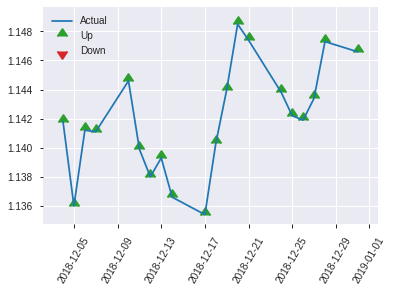


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.25470943373366645
RMSE: 0.5046874614389251
LogLoss: 0.7024114536022599
Mean Per-Class Error: 0.4568484328037785
AUC: 0.5513402441268478
pr_auc: 0.5293405881690537
Gini: 0.10268048825369558
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.16564649067480308: 


,0,1,Error,Rate
0,6.0,131.0,0.9562,(131.0/137.0)
1,0.0,119.0,0.0,(0.0/119.0)
Total,6.0,250.0,0.5117,(131.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1656465,0.6449864,151.0
max f2,0.1656465,0.8195592,151.0
max f0point5,0.4883091,0.5355191,107.0
max accuracy,0.6914724,0.5664062,20.0
max precision,0.8798694,1.0,0.0
max recall,0.1656465,1.0,151.0
max specificity,0.8798694,1.0,0.0
max absolute_mcc,0.8283703,0.1476980,7.0
max min_per_class_accuracy,0.5022433,0.5255474,79.0
max mean_per_class_accuracy,0.4883091,0.5431516,107.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 53.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8750178,2.1512605,2.1512605,1.0,0.8775927,1.0,0.8775927,0.0252101,0.0252101,115.1260504,115.1260504
,2,0.0234375,0.8523883,1.4341737,1.7927171,0.6666667,0.8667902,0.8333333,0.8721915,0.0168067,0.0420168,43.4173669,79.2717087
,3,0.03125,0.7749878,2.1512605,1.8823529,1.0,0.8381473,0.875,0.8636804,0.0168067,0.0588235,115.1260504,88.2352941
,4,0.0429688,0.7295705,0.7170868,1.5645531,0.3333333,0.7378287,0.7272727,0.8293572,0.0084034,0.0672269,-28.2913165,56.4553094
,5,0.0507812,0.7186385,1.0756303,1.4893342,0.5,0.7259219,0.6923077,0.8134441,0.0084034,0.0756303,7.5630252,48.9334195
,6,0.1015625,0.6702816,1.3238526,1.4065934,0.6153846,0.6964637,0.6538462,0.7549539,0.0672269,0.1428571,32.3852618,40.6593407
,7,0.1523438,0.6521647,0.8274079,1.2135316,0.3846154,0.6622137,0.5641026,0.7240405,0.0420168,0.1848739,-17.2592114,21.3531566
,8,0.3242188,0.6257392,0.9778457,1.0885897,0.4545455,0.6285924,0.5060241,0.6734415,0.1680672,0.3529412,-2.2154316,8.8589653
,9,0.40625,0.5789895,1.0244098,1.0756303,0.4761905,0.5933062,0.5,0.6572603,0.0840336,0.4369748,2.4409764,7.5630252
,10,0.5,0.5016851,0.9859944,1.0588235,0.4583333,0.5300964,0.4921875,0.6334171,0.0924370,0.5294118,-1.4005602,5.8823529


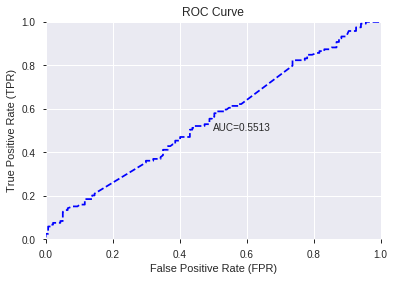

This function is available for GLM models only


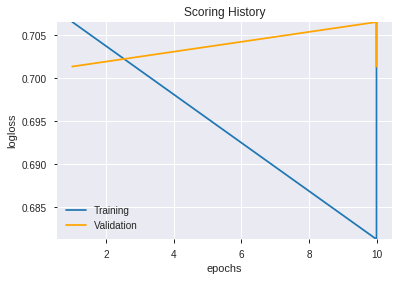

--2019-12-07 23:04:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.100.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.100.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


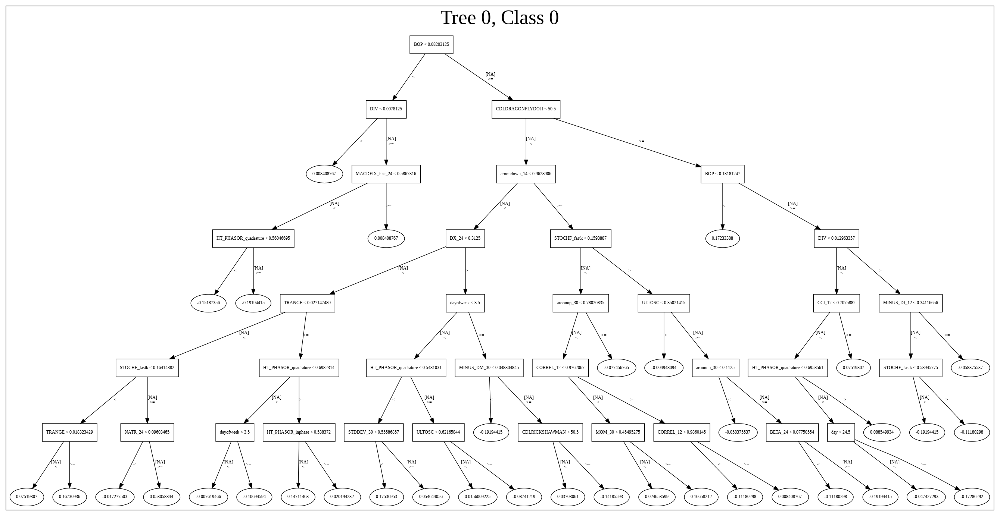

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20191207_230000',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20191207_230000',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_83_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_83_sid_9f32'

['CDLRICKSHAWMAN', 'CDLDRAGONFLYDOJI', 'BOP', 'CDLTAKURI', 'CDLBELTHOLD']

In [84]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_230414_model_1,0.551218,0.686176,0.475005,0.496603,0.246615


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.183703,1.000000,0.390086
1,CDLRICKSHAWMAN,0.099954,0.544107,0.212248
2,CDLDRAGONFLYDOJI,0.063536,0.345864,0.134917
3,CDLTAKURI,0.061896,0.336937,0.131434
4,CDLBELTHOLD,0.061840,0.336630,0.131315


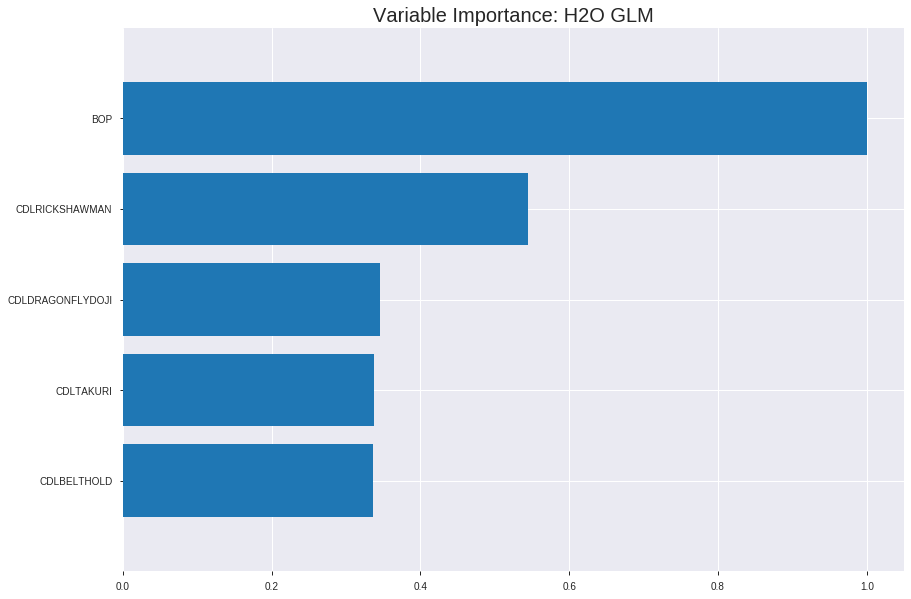

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_230414_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24078139566769732
RMSE: 0.4906948090898225
LogLoss: 0.6742276868316904
Null degrees of freedom: 1786
Residual degrees of freedom: 1781
Null deviance: 2474.1593649352335
Residual deviance: 2409.6897527364617
AIC: 2421.6897527364617
AUC: 0.6026205366553902
pr_auc: 0.56231824836779
Gini: 0.20524107331078034
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3792329315433855: 


,0,1,Error,Rate
0,155.0,776.0,0.8335,(776.0/931.0)
1,53.0,803.0,0.0619,(53.0/856.0)
Total,208.0,1579.0,0.4639,(829.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3792329,0.6595483,328.0
max f2,0.3059974,0.8221024,385.0
max f0point5,0.4178225,0.5683850,284.0
max accuracy,0.4754567,0.5825406,198.0
max precision,0.9798118,1.0,0.0
max recall,0.2830737,1.0,397.0
max specificity,0.9798118,1.0,0.0
max absolute_mcc,0.4178225,0.1796719,284.0
max min_per_class_accuracy,0.4733915,0.5724299,206.0
max mean_per_class_accuracy,0.4754567,0.5810511,198.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6553893,1.3917445,1.3917445,0.6666667,0.6833942,0.6666667,0.6833942,0.0140187,0.0140187,39.1744548,39.1744548
,2,0.0201455,0.6006461,1.1597871,1.2757658,0.5555556,0.6310210,0.6111111,0.6572076,0.0116822,0.0257009,15.9787124,27.5765836
,3,0.0302182,0.5810835,1.2757658,1.2757658,0.6111111,0.5897092,0.6111111,0.6347081,0.0128505,0.0385514,27.5765836,27.5765836
,4,0.0402910,0.5668445,1.3917445,1.3047605,0.6666667,0.5721096,0.625,0.6190585,0.0140187,0.0525701,39.1744548,30.4760514
,5,0.0503637,0.5555761,1.5077233,1.3453531,0.7222222,0.5611516,0.6444444,0.6074771,0.0151869,0.0677570,50.7723261,34.5353063
,6,0.1001679,0.5315157,1.1962748,1.2712304,0.5730337,0.5382976,0.6089385,0.5730806,0.0595794,0.1273364,19.6274808,27.1230356
,7,0.1516508,0.5281121,1.2480318,1.2633548,0.5978261,0.5296358,0.6051661,0.5583318,0.0642523,0.1915888,24.8031796,26.3354830
,8,0.2003358,0.5260375,0.9358282,1.1837604,0.4482759,0.5270848,0.5670391,0.5507382,0.0455607,0.2371495,-6.4171769,18.3760377
,9,0.3172916,0.5240390,1.1986317,1.1892420,0.5741627,0.5243242,0.5696649,0.5410018,0.1401869,0.3773364,19.8631668,18.9242035
,10,0.4001119,0.5174682,1.1002305,1.1708173,0.5270270,0.5207298,0.5608392,0.5368057,0.0911215,0.4684579,10.0230487,17.0817267




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.24656162293042763
RMSE: 0.496549718487915
LogLoss: 0.6861421834461576
Null degrees of freedom: 510
Residual degrees of freedom: 505
Null deviance: 707.3655748698118
Residual deviance: 701.237311481973
AIC: 713.237311481973
AUC: 0.5471771965371155
pr_auc: 0.530413748047778
Gini: 0.09435439307423099
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37494124142685975: 


,0,1,Error,Rate
0,8.0,259.0,0.97,(259.0/267.0)
1,2.0,242.0,0.0082,(2.0/244.0)
Total,10.0,501.0,0.5108,(261.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3749412,0.6496644,302.0
max f2,0.3202479,0.8209960,311.0
max f0point5,0.4249879,0.5493164,273.0
max accuracy,0.4736815,0.5616438,174.0
max precision,0.5487901,1.0,0.0
max recall,0.3202479,1.0,311.0
max specificity,0.5487901,1.0,0.0
max absolute_mcc,0.5359419,0.1477889,9.0
max min_per_class_accuracy,0.4741366,0.5580524,166.0
max mean_per_class_accuracy,0.4736815,0.5628722,174.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5383693,2.0942623,2.0942623,1.0,0.5425294,1.0,0.5425294,0.0245902,0.0245902,109.4262295,109.4262295
,2,0.0215264,0.5355405,1.6754098,1.9038748,0.8,0.5364078,0.9090909,0.5397468,0.0163934,0.0409836,67.5409836,90.3874814
,3,0.0313112,0.5339605,0.8377049,1.5706967,0.4,0.5349021,0.75,0.5382329,0.0081967,0.0491803,-16.2295082,57.0696721
,4,0.0410959,0.5325309,0.8377049,1.3961749,0.4,0.5332082,0.6666667,0.5370365,0.0081967,0.0573770,-16.2295082,39.6174863
,5,0.0508806,0.5319178,1.2565574,1.3693253,0.6,0.5321023,0.6538462,0.5360876,0.0122951,0.0696721,25.6557377,36.9325347
,6,0.1017613,0.5287571,0.9665826,1.1679540,0.4615385,0.5302068,0.5576923,0.5331472,0.0491803,0.1188525,-3.3417402,16.7953972
,7,0.1526419,0.5265215,0.9665826,1.1008302,0.4615385,0.5273438,0.5256410,0.5312128,0.0491803,0.1680328,-3.3417402,10.0830181
,8,0.2778865,0.5240390,0.8835169,1.0028862,0.421875,0.5244941,0.4788732,0.5281846,0.1106557,0.2786885,-11.6483094,0.2886169
,9,0.3033268,0.5215936,0.8054855,0.9863300,0.3846154,0.5219862,0.4709677,0.5276648,0.0204918,0.2991803,-19.4514502,-1.3670016
,10,0.4011742,0.5130694,1.3822131,1.0828868,0.66,0.5183960,0.5170732,0.5254041,0.1352459,0.4344262,38.2213115,8.2886845



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:04:14,0.000 sec,2,.75E1,6,1.3808852,1.3824508
,2019-12-07 23:04:14,0.006 sec,4,.46E1,6,1.3789354,1.3815101
,2019-12-07 23:04:14,0.013 sec,6,.29E1,6,1.3761552,1.3802140
,2019-12-07 23:04:14,0.022 sec,8,.18E1,6,1.3724191,1.3785675
,2019-12-07 23:04:14,0.030 sec,10,.11E1,6,1.3677876,1.3766984
,2019-12-07 23:04:14,0.036 sec,12,.69E0,6,1.3625615,1.3748637
,2019-12-07 23:04:14,0.044 sec,14,.43E0,6,1.3572571,1.3733906
,2019-12-07 23:04:14,0.052 sec,16,.27E0,6,1.3524209,1.3725167
,2019-12-07 23:04:14,0.059 sec,18,.17E0,6,1.3484554,1.3722844
,2019-12-07 23:04:14,0.065 sec,20,.1E0,6,1.3455338,1.3725548


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.56640625)

('F1', 0.6448087431693988)

('auc', 0.5512175673188984)

('logloss', 0.686175936856302)

('mean_per_class_error', 0.45626571796601856)

('rmse', 0.49660304090197394)

('mse', 0.24661458023308758)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


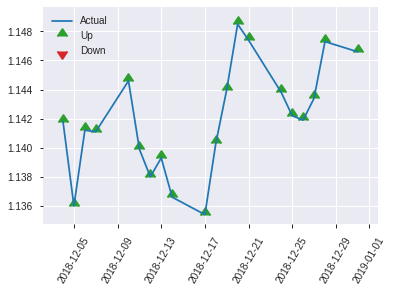


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.24661458023308758
RMSE: 0.49660304090197394
LogLoss: 0.686175936856302
Null degrees of freedom: 255
Residual degrees of freedom: 250
Null deviance: 353.8308882659767
Residual deviance: 351.32207967042655
AIC: 363.32207967042655
AUC: 0.5512175673188984
pr_auc: 0.5132040625192751
Gini: 0.10243513463779674
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37444051055456523: 


,0,1,Error,Rate
0,8.0,129.0,0.9416,(129.0/137.0)
1,1.0,118.0,0.0084,(1.0/119.0)
Total,9.0,247.0,0.5078,(130.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3744405,0.6448087,148.0
max f2,0.3744405,0.8160443,148.0
max f0point5,0.3777628,0.5342466,145.0
max accuracy,0.5265609,0.5664062,37.0
max precision,0.5378330,0.8,4.0
max recall,0.3212816,1.0,156.0
max specificity,0.5475116,0.9927007,0.0
max absolute_mcc,0.3744405,0.1353799,148.0
max min_per_class_accuracy,0.4769865,0.5328467,80.0
max mean_per_class_accuracy,0.4751386,0.5437343,82.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.5388713,1.4341737,1.4341737,0.6666667,0.5449171,0.6666667,0.5449171,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.5335985,1.4341737,1.4341737,0.6666667,0.5365258,0.6666667,0.5407214,0.0168067,0.0336134,43.4173669,43.4173669
,3,0.03125,0.5331207,1.0756303,1.3445378,0.5,0.5335264,0.625,0.5389227,0.0084034,0.0420168,7.5630252,34.4537815
,4,0.0429688,0.5323940,0.7170868,1.1734148,0.3333333,0.5326465,0.5454545,0.5372110,0.0084034,0.0504202,-28.2913165,17.3414820
,5,0.0507812,0.5322350,0.0,0.9928895,0.0,0.5323196,0.4615385,0.5364585,0.0,0.0504202,-100.0,-0.7110537
,6,0.1015625,0.5287847,1.4893342,1.2411118,0.6923077,0.5310671,0.5769231,0.5337628,0.0756303,0.1260504,48.9334195,24.1111829
,7,0.1523438,0.5267701,1.3238526,1.2686921,0.6153846,0.5277844,0.5897436,0.5317700,0.0672269,0.1932773,32.3852618,26.8692092
,8,0.34375,0.5240390,0.9219688,1.0756303,0.4285714,0.5245347,0.5,0.5277412,0.1764706,0.3697479,-7.8031212,7.5630252
,9,0.4023438,0.5204261,1.0039216,1.0651872,0.4666667,0.5214489,0.4951456,0.5268249,0.0588235,0.4285714,0.3921569,6.5187240
,10,0.5,0.4768632,1.1186555,1.0756303,0.52,0.5122961,0.5,0.5239872,0.1092437,0.5378151,11.8655462,7.5630252


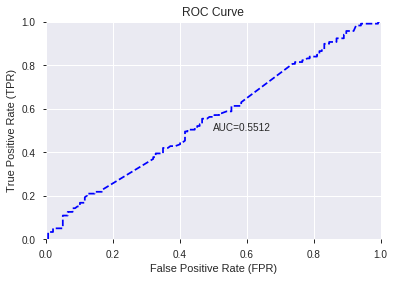

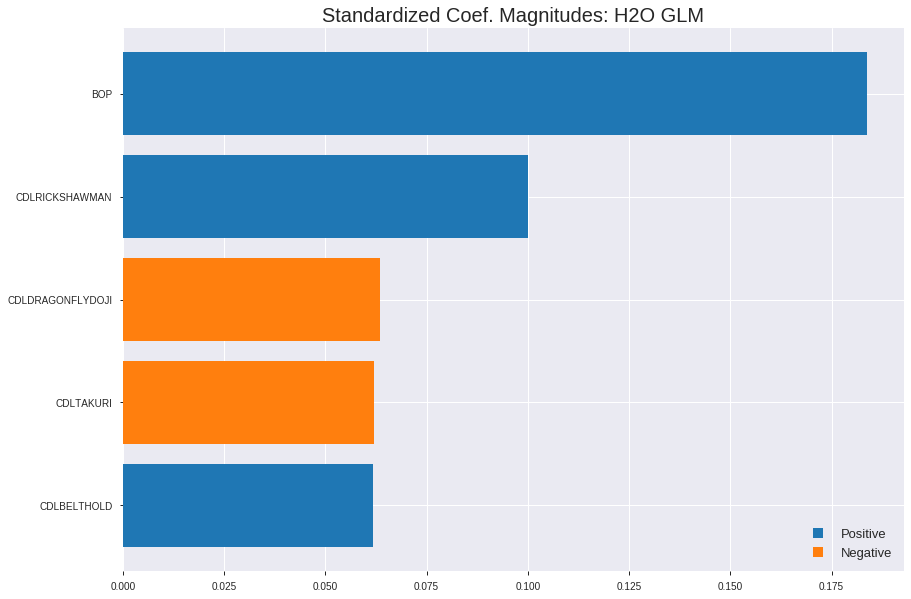

'log_likelihood'
--2019-12-07 23:04:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.84.251
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.84.251|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


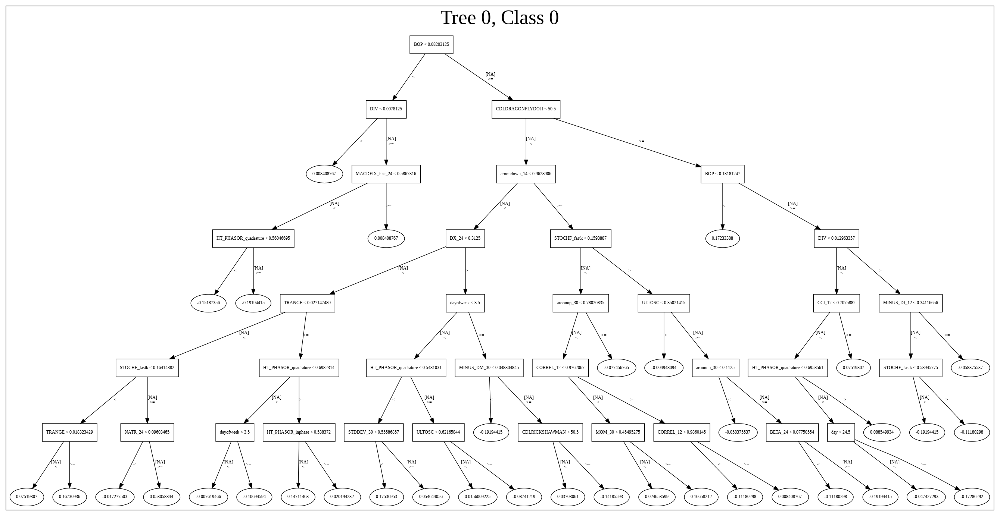

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_230414_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_230414_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_88_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_88_s

['BOP', 'CDLRICKSHAWMAN', 'CDLDRAGONFLYDOJI', 'CDLTAKURI', 'CDLBELTHOLD']

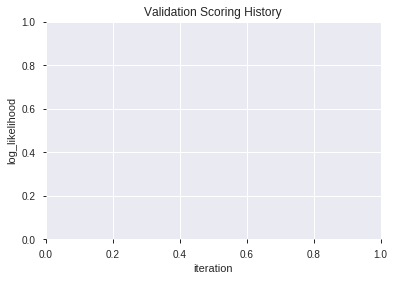

In [85]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_230425_model_5,0.564651,0.684983,0.481752,0.496118,0.246133
1,XGBoost_grid_1_AutoML_20191207_230425_model_3,0.564405,0.684666,0.444581,0.495792,0.245810
2,XGBoost_1_AutoML_20191207_230425,0.564129,0.685197,0.465712,0.496003,0.246019
3,XGBoost_grid_1_AutoML_20191207_230425_model_7,0.562074,0.686742,0.473011,0.496723,0.246734
4,XGBoost_grid_1_AutoML_20191207_230425_model_2,0.558824,0.686530,0.469914,0.496733,0.246743
5,XGBoost_3_AutoML_20191207_230425,0.558455,0.686692,0.481752,0.496914,0.246924
6,XGBoost_grid_1_AutoML_20191207_230425_model_6,0.557689,0.686763,0.481752,0.497064,0.247073
7,XGBoost_2_AutoML_20191207_230425,0.551739,0.687957,0.457523,0.497416,0.247423
8,XGBoost_grid_1_AutoML_20191207_230425_model_1,0.547813,0.688379,0.481752,0.497765,0.247770
9,XGBoost_grid_1_AutoML_20191207_230425_model_4,0.547323,0.689254,0.473563,0.498071,0.248075


,variable,relative_importance,scaled_importance,percentage
0,BOP,2343.162109,1.000000,0.830019
1,CDLBELTHOLD,180.304672,0.076949,0.063869
2,CDLDRAGONFLYDOJI,123.449654,0.052685,0.043730
3,CDLRICKSHAWMAN,100.728455,0.042988,0.035681
4,CDLTAKURI,75.375961,0.032168,0.026700


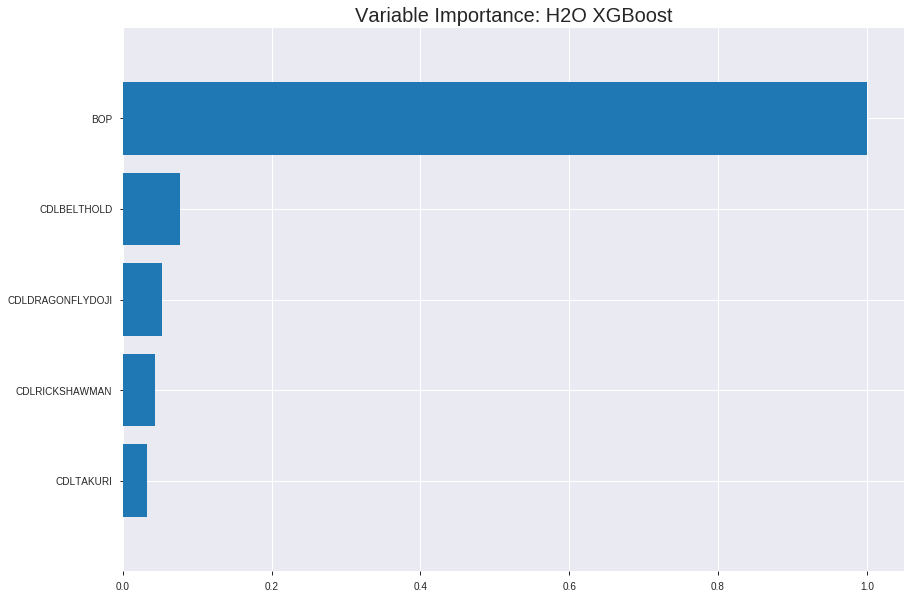

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_230425_model_5


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.22152516086233168
RMSE: 0.47066459486807766
LogLoss: 0.6334958570828646
Mean Per-Class Error: 0.3459706927532449
AUC: 0.7181586727165042
pr_auc: 0.7043733098917714
Gini: 0.4363173454330085
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4563445970416069: 


,0,1,Error,Rate
0,376.0,555.0,0.5961,(555.0/931.0)
1,115.0,741.0,0.1343,(115.0/856.0)
Total,491.0,1296.0,0.3749,(670.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4563446,0.6886617,241.0
max f2,0.3041329,0.8330067,351.0
max f0point5,0.5151608,0.6427790,160.0
max accuracy,0.5151608,0.6552882,160.0
max precision,0.7807232,1.0,0.0
max recall,0.1958488,1.0,392.0
max specificity,0.7807232,1.0,0.0
max absolute_mcc,0.5151608,0.3090883,160.0
max min_per_class_accuracy,0.4846559,0.6519871,203.0
max mean_per_class_accuracy,0.4851050,0.6540293,202.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6773061,2.0876168,2.0876168,1.0,0.7023567,1.0,0.7023567,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.6592101,1.9716381,2.0296275,0.9444444,0.6690236,0.9722222,0.6856902,0.0198598,0.0408879,97.1638110,102.9627466
,3,0.0313374,0.6490992,1.8788551,1.9757802,0.9,0.6529578,0.9464286,0.6740000,0.0210280,0.0619159,87.8855140,97.5780207
,4,0.0408506,0.6348399,1.9648158,1.9732269,0.9411765,0.6397462,0.9452055,0.6660231,0.0186916,0.0806075,96.4815833,97.3226860
,5,0.0503637,0.6260979,1.7192139,1.9252466,0.8235294,0.6302814,0.9222222,0.6592719,0.0163551,0.0969626,71.9213854,92.5246625
,6,0.1001679,0.6000286,1.6419458,1.7843876,0.7865169,0.6118674,0.8547486,0.6357021,0.0817757,0.1787383,64.1945815,78.4387563
,7,0.1499720,0.5632316,1.3839258,1.6513984,0.6629213,0.5821450,0.7910448,0.6179163,0.0689252,0.2476636,38.3925759,65.1398382
,8,0.2003358,0.5465600,1.2989616,1.5627970,0.6222222,0.5534557,0.7486034,0.6017111,0.0654206,0.3130841,29.8961578,56.2796951
,9,0.2999440,0.5277946,1.2080030,1.4449736,0.5786517,0.5336766,0.6921642,0.5791176,0.1203271,0.4334112,20.8002993,44.4973584
,10,0.4017907,0.5136264,1.2158647,1.3868986,0.5824176,0.5238115,0.6643454,0.5650985,0.1238318,0.5572430,21.5864743,38.6898641




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2466933248114227
RMSE: 0.4966823177962174
LogLoss: 0.6861487198132765
Mean Per-Class Error: 0.44289156996377477
AUC: 0.5567784122306133
pr_auc: 0.5247492087631221
Gini: 0.11355682446122661
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30627042055130005: 


,0,1,Error,Rate
0,7.0,260.0,0.9738,(260.0/267.0)
1,0.0,244.0,0.0,(0.0/244.0)
Total,7.0,504.0,0.5088,(260.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3062704,0.6524064,301.0
max f2,0.3062704,0.8243243,301.0
max f0point5,0.4645655,0.5510076,198.0
max accuracy,0.4645655,0.5499022,198.0
max precision,0.6819164,1.0,0.0
max recall,0.3062704,1.0,301.0
max specificity,0.6819164,1.0,0.0
max absolute_mcc,0.4645655,0.1202243,198.0
max min_per_class_accuracy,0.4920030,0.5286885,155.0
max mean_per_class_accuracy,0.4645655,0.5571084,198.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0136986,0.6337069,1.1967213,1.1967213,0.5714286,0.6440168,0.5714286,0.6440168,0.0163934,0.0163934,19.6721311,19.6721311
,2,0.0215264,0.6255956,0.5235656,0.9519374,0.25,0.6284446,0.4545455,0.6383542,0.0040984,0.0204918,-47.6434426,-4.8062593
,3,0.0313112,0.6172024,0.8377049,0.9162398,0.4,0.6199275,0.4375,0.6325958,0.0081967,0.0286885,-16.2295082,-8.3760246
,4,0.0410959,0.6078272,2.0942623,1.1967213,1.0,0.6126374,0.5714286,0.6278438,0.0204918,0.0491803,109.4262295,19.6721311
,5,0.0508806,0.6027503,1.2565574,1.2082282,0.6,0.6065115,0.5769231,0.6237415,0.0122951,0.0614754,25.6557377,20.8228247
,6,0.1037182,0.5665728,1.3186096,1.2644603,0.6296296,0.5833887,0.6037736,0.6031844,0.0696721,0.1311475,31.8609593,26.4460254
,7,0.1506849,0.5476089,1.1343921,1.2239195,0.5416667,0.5554676,0.5844156,0.5883116,0.0532787,0.1844262,13.4392077,22.3919523
,8,0.2015656,0.5359312,0.9665826,1.1589607,0.4615385,0.5434256,0.5533981,0.5769812,0.0491803,0.2336066,-3.3417402,15.8960688
,9,0.3150685,0.5265362,0.9388072,1.0796507,0.4482759,0.5277906,0.5155280,0.5592603,0.1065574,0.3401639,-6.1192764,7.9650748
,10,0.4011742,0.5119186,1.0947280,1.0828868,0.5227273,0.5188367,0.5170732,0.5505841,0.0942623,0.4344262,9.4728018,8.2886845



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:04:30,1.489 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5209849,0.5,0.6931472,0.5,0.0,1.0,0.5225049
,2019-12-07 23:04:30,1.563 sec,5.0,0.4921551,0.6775357,0.6993247,0.6684210,1.8556594,0.3978735,0.4989165,0.6909771,0.5370541,0.5033274,0.6980874,0.5146771
,2019-12-07 23:04:30,1.596 sec,10.0,0.4891533,0.6715507,0.6886795,0.6669671,1.9716381,0.4320090,0.4973584,0.6878470,0.5575305,0.5255139,1.3961749,0.5127202
,2019-12-07 23:04:30,1.625 sec,15.0,0.4867905,0.6667586,0.6829469,0.6617259,1.9927251,0.4437605,0.4969167,0.6869333,0.5418432,0.5231010,1.7452186,0.5127202
,2019-12-07 23:04:30,1.665 sec,20.0,0.4837148,0.6605018,0.6888282,0.6716474,1.9777423,0.4426413,0.4962230,0.6854948,0.5637318,0.5333108,1.3961749,0.4833659
,2019-12-07 23:04:30,1.721 sec,25.0,0.4803408,0.6536284,0.6972956,0.6822106,1.9060849,0.4348069,0.4958733,0.6847494,0.5599788,0.5396656,1.7452186,0.5127202
,2019-12-07 23:04:30,1.799 sec,30.0,0.4753887,0.6434953,0.7121525,0.6969555,1.9777423,0.3878008,0.4961600,0.6852509,0.5645453,0.5328308,1.3961749,0.5127202
,2019-12-07 23:04:30,1.852 sec,35.0,0.4734479,0.6394691,0.7182308,0.7001481,1.9832360,0.3698937,0.4963770,0.6856022,0.5546218,0.5244976,1.0471311,0.5127202
,2019-12-07 23:04:31,1.900 sec,40.0,0.4718621,0.6360975,0.7202987,0.7038002,1.9777423,0.3670957,0.4966021,0.6860432,0.5533708,0.5230725,1.0471311,0.5068493
,2019-12-07 23:04:31,1.952 sec,45.0,0.4711638,0.6345548,0.7170237,0.7008020,1.9716381,0.3732513,0.4965606,0.6859075,0.5508765,0.5219735,1.1967213,0.5068493


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,2343.1621094,1.0,0.8300194
CDLBELTHOLD,180.3046722,0.0769493,0.0638694
CDLDRAGONFLYDOJI,123.4496536,0.0526851,0.0437296
CDLRICKSHAWMAN,100.7284546,0.0429883,0.0356811
CDLTAKURI,75.3759613,0.0321685,0.0267005


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5859375)

('F1', 0.6432432432432432)

('auc', 0.564650677789364)

('logloss', 0.6849828659718527)

('mean_per_class_error', 0.4354413298165981)

('rmse', 0.4961183925321493)

('mse', 0.24613345940868378)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


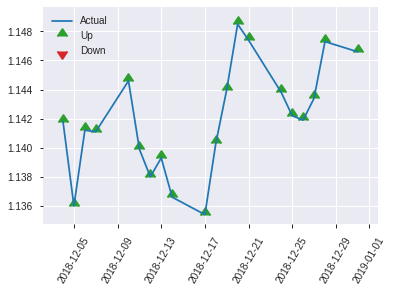


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.24613345940868378
RMSE: 0.4961183925321493
LogLoss: 0.6849828659718527
Mean Per-Class Error: 0.4354413298165981
AUC: 0.564650677789364
pr_auc: 0.522550919918816
Gini: 0.1293013555787279
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25341394543647766: 


,0,1,Error,Rate
0,5.0,132.0,0.9635,(132.0/137.0)
1,0.0,119.0,0.0,(0.0/119.0)
Total,5.0,251.0,0.5156,(132.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2534139,0.6432432,130.0
max f2,0.2534139,0.8184319,130.0
max f0point5,0.4637088,0.5316864,91.0
max accuracy,0.5330990,0.5859375,34.0
max precision,0.6777502,1.0,0.0
max recall,0.2534139,1.0,130.0
max specificity,0.6777502,1.0,0.0
max absolute_mcc,0.5330990,0.1636949,34.0
max min_per_class_accuracy,0.4998823,0.5401460,66.0
max mean_per_class_accuracy,0.5330990,0.5645587,34.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6453598,1.4341737,1.4341737,0.6666667,0.6670258,0.6666667,0.6670258,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0273438,0.6140365,1.0756303,1.2292917,0.5,0.6223679,0.5714286,0.6415070,0.0168067,0.0336134,7.5630252,22.9291717
,3,0.03125,0.6083230,2.1512605,1.3445378,1.0,0.6090863,0.625,0.6374544,0.0084034,0.0420168,115.1260504,34.4537815
,4,0.0429688,0.6048627,1.4341737,1.3689840,0.6666667,0.6070810,0.6363636,0.6291708,0.0168067,0.0588235,43.4173669,36.8983957
,5,0.0507812,0.5886711,1.0756303,1.3238526,0.5,0.5956714,0.6153846,0.6240170,0.0084034,0.0672269,7.5630252,32.3852618
,6,0.1015625,0.5625237,1.1583710,1.2411118,0.5384615,0.5768947,0.5769231,0.6004559,0.0588235,0.1260504,15.8371041,24.1111829
,7,0.1523438,0.5476958,1.4893342,1.3238526,0.6923077,0.5557735,0.6153846,0.5855618,0.0756303,0.2016807,48.9334195,32.3852618
,8,0.203125,0.5284212,1.1583710,1.2824822,0.5384615,0.5389911,0.5961538,0.5739191,0.0588235,0.2605042,15.8371041,28.2482224
,9,0.3515625,0.5277537,0.9624060,1.1473389,0.4473684,0.5277537,0.5333333,0.5544270,0.1428571,0.4033613,-3.7593985,14.7338936
,10,0.4023438,0.5189685,0.9928895,1.1278453,0.4615385,0.5242725,0.5242718,0.5506211,0.0504202,0.4537815,-0.7110537,12.7845313


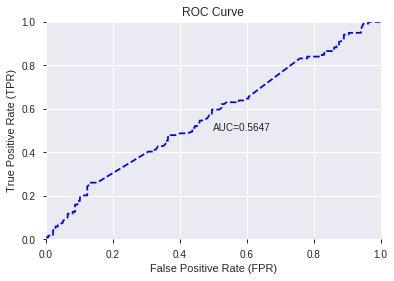

This function is available for GLM models only


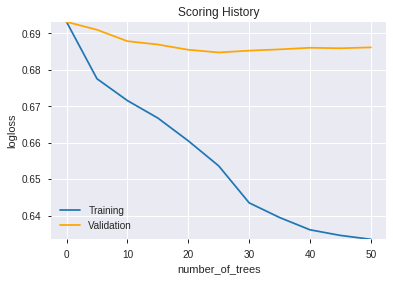

--2019-12-07 23:04:35--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.142.108
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.142.108|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

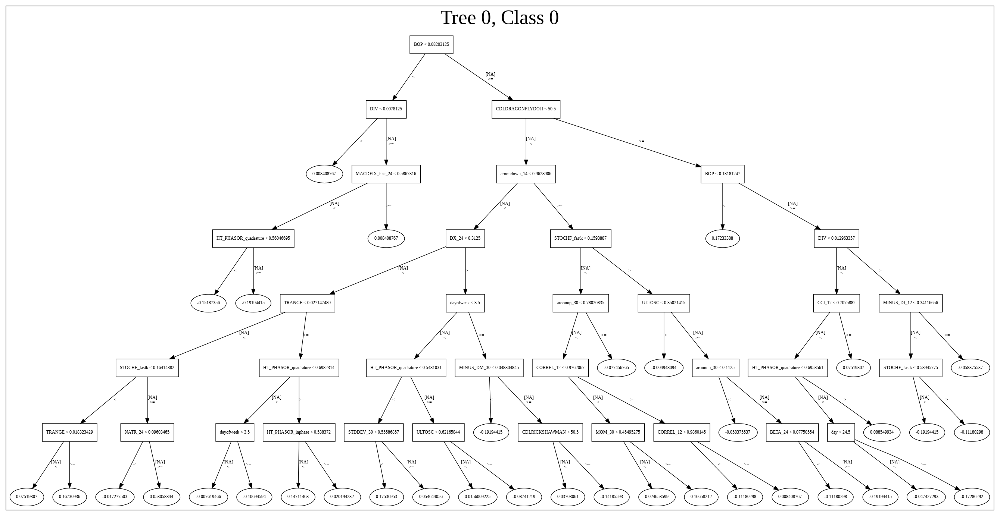

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_230425_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_230425_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_93_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP', 'CDLBELTHOLD', 'CDLDRAGONFLYDOJI', 'CDLRICKSHAWMAN', 'CDLTAKURI']

In [86]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [87]:
# DRF with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191207_230459,0.581365,0.678799,0.478102,0.493672,0.243712
1,GBM_3_AutoML_20191207_230459,0.574066,0.681358,0.478102,0.494973,0.244999
2,GBM_grid_1_AutoML_20191207_230459_model_4,0.572870,0.688814,0.478102,0.497834,0.247839
3,GBM_4_AutoML_20191207_230459,0.570785,0.680431,0.474453,0.494700,0.244728
4,GBM_5_AutoML_20191207_230459,0.551984,0.686291,0.473563,0.496627,0.246638
5,GBM_grid_1_AutoML_20191207_230459_model_2,0.548672,0.688846,0.478102,0.497854,0.247858
6,GBM_grid_1_AutoML_20191207_230459_model_3,0.547813,0.702931,0.460406,0.504143,0.254160
7,GBM_grid_1_AutoML_20191207_230459_model_1,0.546004,0.689321,0.478102,0.498090,0.248094
8,GBM_1_AutoML_20191207_230459,0.544685,0.687000,0.474453,0.497493,0.247500
9,GBM_grid_1_AutoML_20191207_230459_model_5,0.541250,0.690462,0.478102,0.498657,0.248659


,variable,relative_importance,scaled_importance,percentage
0,BOP,258.403870,1.000000,0.828280
1,CDLDRAGONFLYDOJI,19.690828,0.076202,0.063116
2,CDLRICKSHAWMAN,12.720868,0.049229,0.040775
3,CDLBELTHOLD,12.475641,0.048280,0.039989
4,CDLTAKURI,8.685299,0.033611,0.027840


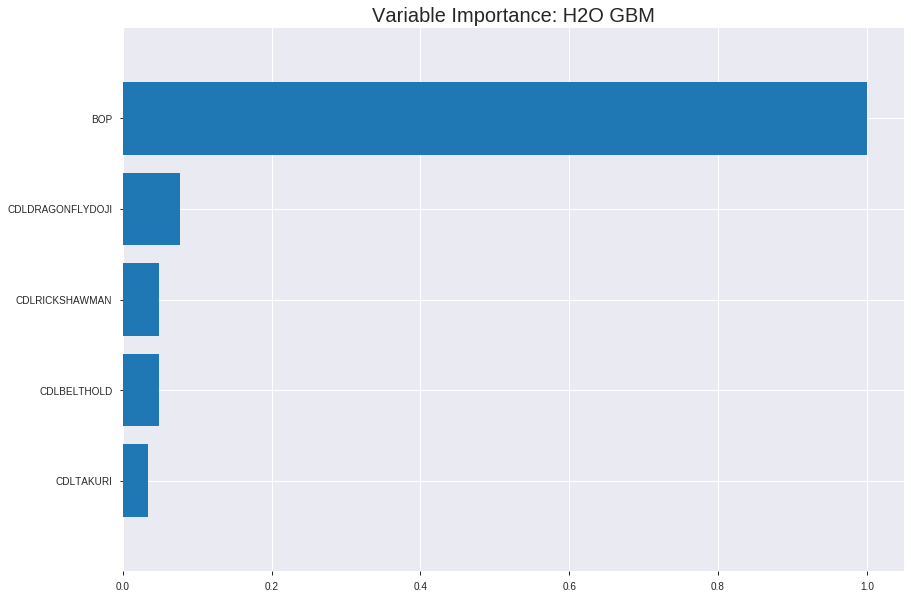

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191207_230459


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.2183998821696031
RMSE: 0.46733273175501316
LogLoss: 0.6245701251460207
Mean Per-Class Error: 0.3546432837768654
AUC: 0.7072882891474347
pr_auc: 0.688715842340003
Gini: 0.4145765782948694
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.421492282253127: 


,0,1,Error,Rate
0,280.0,651.0,0.6992,(651.0/931.0)
1,66.0,790.0,0.0771,(66.0/856.0)
Total,346.0,1441.0,0.4012,(717.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4214923,0.6878537,289.0
max f2,0.2247966,0.8312170,366.0
max f0point5,0.5088081,0.6359649,181.0
max accuracy,0.5088081,0.6496922,181.0
max precision,0.8080920,1.0,0.0
max recall,0.1337216,1.0,380.0
max specificity,0.8080920,1.0,0.0
max absolute_mcc,0.5088081,0.2976701,181.0
max min_per_class_accuracy,0.4845148,0.6436916,215.0
max mean_per_class_accuracy,0.5088081,0.6453567,181.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.97 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7689684,1.9716381,1.9716381,0.9444444,0.7912695,0.9444444,0.7912695,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0212647,0.7481565,1.8788551,1.9228050,0.9,0.7516014,0.9210526,0.7703915,0.0210280,0.0408879,87.8855140,92.2804968
,3,0.0302182,0.7250057,2.0876168,1.9716381,1.0,0.7305538,0.9444444,0.7585878,0.0186916,0.0595794,108.7616822,97.1638110
,4,0.0430890,0.7098926,1.9060849,1.9520573,0.9130435,0.7159603,0.9350649,0.7458549,0.0245327,0.0841121,90.6084925,95.2057289
,5,0.0509233,0.6991751,1.3420394,1.8582084,0.6428571,0.7023225,0.8901099,0.7391576,0.0105140,0.0946262,34.2039386,85.8208380
,6,0.1029659,0.6198032,1.6162195,1.7358988,0.7741935,0.6485035,0.8315217,0.6933379,0.0841121,0.1787383,61.6219475,73.5898771
,7,0.1516508,0.5807902,1.3677490,1.6177105,0.6551724,0.5996912,0.7749077,0.6632742,0.0665888,0.2453271,36.7748953,61.7710453
,8,0.2020145,0.5647317,1.2525701,1.5266782,0.6,0.5712390,0.7313019,0.6403291,0.0630841,0.3084112,25.2570093,52.6678230
,9,0.3038612,0.5586850,1.1929239,1.4148121,0.5714286,0.5589741,0.6777164,0.6130610,0.1214953,0.4299065,19.2923899,41.4812137
,10,0.4001119,0.5069615,1.2622799,1.3781191,0.6046512,0.5300891,0.6601399,0.5931013,0.1214953,0.5514019,26.2279939,37.8119077




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.24787850925547894
RMSE: 0.4978739893341275
LogLoss: 0.6888694129399852
Mean Per-Class Error: 0.45239301283232025
AUC: 0.5596411248234788
pr_auc: 0.5413169689235284
Gini: 0.11928224964695766
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21289404756934274: 


,0,1,Error,Rate
0,4.0,263.0,0.985,(263.0/267.0)
1,0.0,244.0,0.0,(0.0/244.0)
Total,4.0,507.0,0.5147,(263.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2128940,0.6498003,197.0
max f2,0.2128940,0.8226568,197.0
max f0point5,0.4491881,0.5460089,139.0
max accuracy,0.5621922,0.5538160,52.0
max precision,0.7249965,1.0,0.0
max recall,0.2128940,1.0,197.0
max specificity,0.7249965,1.0,0.0
max absolute_mcc,0.5621922,0.1031125,52.0
max min_per_class_accuracy,0.4867351,0.5286885,107.0
max mean_per_class_accuracy,0.4648925,0.5476070,125.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6969479,1.7452186,1.7452186,0.8333333,0.7076391,0.8333333,0.7076391,0.0204918,0.0204918,74.5218579,74.5218579
,2,0.0234834,0.6482609,1.3961749,1.5706967,0.6666667,0.6618538,0.75,0.6847465,0.0163934,0.0368852,39.6174863,57.0696721
,3,0.0332681,0.6393574,0.8377049,1.3551109,0.4,0.6422526,0.6470588,0.6722483,0.0081967,0.0450820,-16.2295082,35.5110897
,4,0.0410959,0.6319231,1.0471311,1.2964481,0.5,0.6351354,0.6190476,0.6651792,0.0081967,0.0532787,4.7131148,29.6448087
,5,0.0528376,0.6250479,1.7452186,1.3961749,0.8333333,0.6263618,0.6666667,0.6565531,0.0204918,0.0737705,74.5218579,39.6174863
,6,0.1017613,0.5851398,1.0890164,1.2485025,0.52,0.6020756,0.5961538,0.6303620,0.0532787,0.1270492,8.9016393,24.8502522
,7,0.1506849,0.5666890,1.0890164,1.1967213,0.52,0.5748584,0.5714286,0.6123413,0.0532787,0.1803279,8.9016393,19.6721311
,8,0.2700587,0.5586851,1.0642972,1.1381860,0.5081967,0.5598582,0.5434783,0.5891423,0.1270492,0.3073770,6.4297232,13.8186030
,9,0.3013699,0.5421750,0.6544570,1.0879285,0.3125,0.5495559,0.5194805,0.5850294,0.0204918,0.3278689,-34.5543033,8.7928465
,10,0.4090020,0.5071052,1.0661699,1.0822025,0.5090909,0.5207631,0.5167464,0.5681172,0.1147541,0.4426230,6.6169896,8.2202526



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:05:00,0.003 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 23:05:00,0.025 sec,5.0,0.4862815,0.6656019,0.6729756,0.6391374,1.9716381,0.4476777,0.4965489,0.6862065,0.5581983,0.5400712,1.7452186,0.4951076
,2019-12-07 23:05:00,0.042 sec,10.0,0.4774781,0.6472373,0.6904457,0.6688137,1.9716381,0.4264130,0.4954938,0.6839908,0.5630948,0.5438513,1.4959016,0.5146771
,2019-12-07 23:05:00,0.063 sec,15.0,0.4746382,0.6408272,0.6935864,0.6736613,1.8556594,0.4264130,0.4959497,0.6849279,0.5642460,0.5410120,1.3961749,0.5146771
,2019-12-07 23:05:01,0.081 sec,20.0,0.4711956,0.6333223,0.6987688,0.6793496,1.8467380,0.4135422,0.4968358,0.6866318,0.5614754,0.5374446,1.3961749,0.5146771
,2019-12-07 23:05:01,0.101 sec,25.0,0.4691820,0.6288537,0.7037278,0.6849398,2.0876168,0.4107443,0.4975651,0.6883706,0.5642383,0.5368570,1.3961749,0.5146771
,2019-12-07 23:05:01,0.122 sec,30.0,0.4673327,0.6245701,0.7072883,0.6887158,1.9716381,0.4012311,0.4978740,0.6888694,0.5596411,0.5413170,1.7452186,0.5146771


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,258.4038696,1.0,0.8282799
CDLDRAGONFLYDOJI,19.6908283,0.0762018,0.0631164
CDLRICKSHAWMAN,12.7208681,0.0492286,0.0407751
CDLBELTHOLD,12.4756413,0.0482796,0.0399890
CDLTAKURI,8.6852989,0.0336113,0.0278396


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5703125)

('F1', 0.6449864498644986)

('auc', 0.5813653928724775)

('logloss', 0.6787991226195567)

('mean_per_class_error', 0.42964485064098634)

('rmse', 0.4936721439387585)

('mse', 0.24371218570109032)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


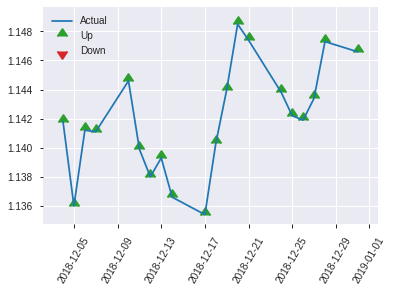


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.24371218570109032
RMSE: 0.4936721439387585
LogLoss: 0.6787991226195567
Mean Per-Class Error: 0.42964485064098634
AUC: 0.5813653928724775
pr_auc: 0.5307919841750904
Gini: 0.16273078574495492
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25230498806998053: 


,0,1,Error,Rate
0,6.0,131.0,0.9562,(131.0/137.0)
1,0.0,119.0,0.0,(0.0/119.0)
Total,6.0,250.0,0.5117,(131.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2523050,0.6449864,118.0
max f2,0.2523050,0.8195592,118.0
max f0point5,0.4567633,0.5543359,81.0
max accuracy,0.5128582,0.5703125,47.0
max precision,0.7249965,1.0,0.0
max recall,0.2523050,1.0,118.0
max specificity,0.7249965,1.0,0.0
max absolute_mcc,0.4567633,0.1676537,81.0
max min_per_class_accuracy,0.4896133,0.5474453,62.0
max mean_per_class_accuracy,0.4567633,0.5703551,81.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6513742,2.1512605,2.1512605,1.0,0.6889544,1.0,0.6889544,0.0252101,0.0252101,115.1260504,115.1260504
,2,0.0234375,0.6384415,0.7170868,1.4341737,0.3333333,0.6420867,0.6666667,0.6655206,0.0084034,0.0336134,-28.2913165,43.4173669
,3,0.03125,0.6283746,0.0,1.0756303,0.0,0.6346345,0.5,0.6577991,0.0,0.0336134,-100.0,7.5630252
,4,0.0429688,0.6134680,1.4341737,1.1734148,0.6666667,0.6188813,0.5454545,0.6471851,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0585938,0.6038876,1.0756303,1.1473389,0.5,0.6044702,0.5333333,0.6357945,0.0168067,0.0672269,7.5630252,14.7338936
,6,0.1015625,0.5847516,1.3689840,1.2411118,0.6363636,0.5953524,0.5769231,0.6186844,0.0588235,0.1260504,36.8983957,24.1111829
,7,0.15625,0.5654461,1.0756303,1.1831933,0.5,0.5711062,0.55,0.6020320,0.0588235,0.1848739,7.5630252,18.3193277
,8,0.3242188,0.5586851,1.0506156,1.1145085,0.4883721,0.5592891,0.5180723,0.5798881,0.1764706,0.3613445,5.0615595,11.4508454
,9,0.4023438,0.5149700,1.2907563,1.1487313,0.6,0.5306911,0.5339806,0.5703353,0.1008403,0.4621849,29.0756303,14.8731337
,10,0.5,0.4893653,0.9465546,1.1092437,0.44,0.5039915,0.515625,0.5573775,0.0924370,0.5546218,-5.3445378,10.9243697


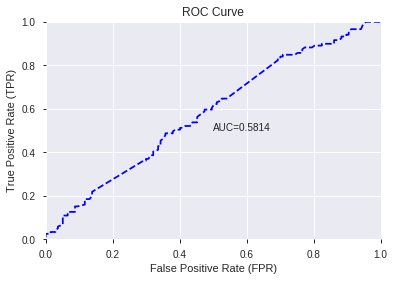

This function is available for GLM models only


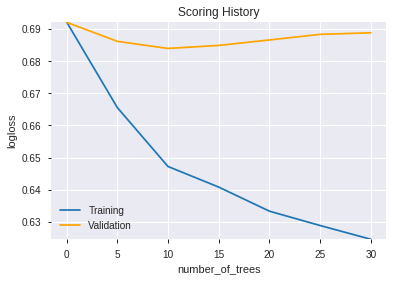

--2019-12-07 23:05:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.160.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.160.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       4
            colName:     CDLTAKURI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 3
            rightChil

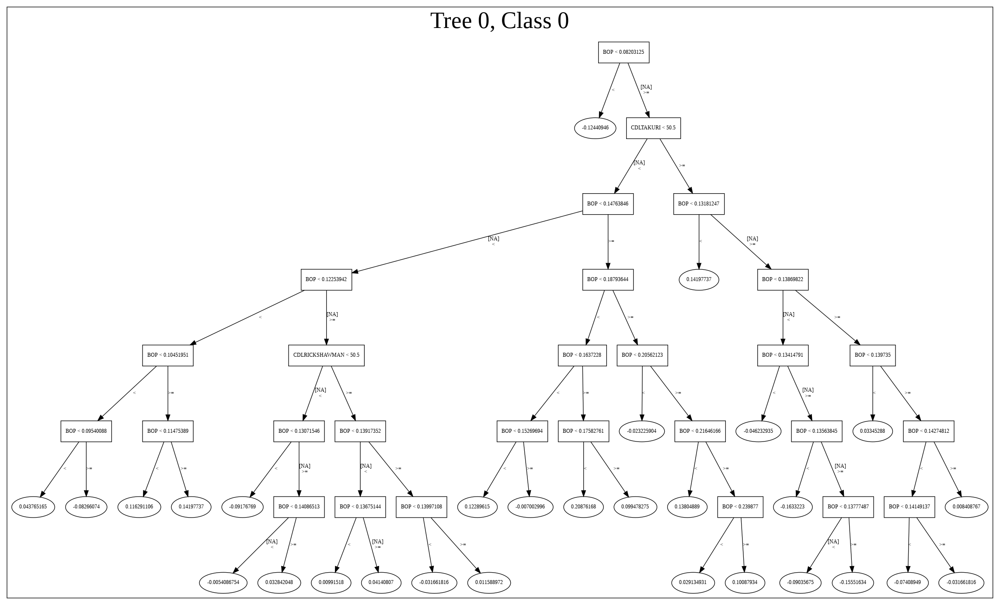

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191207_230459',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191207_230459',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_103_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_103_sid_9f32',
   'type': 'Ke

['BOP', 'CDLDRAGONFLYDOJI', 'CDLRICKSHAWMAN', 'CDLBELTHOLD', 'CDLTAKURI']

In [88]:
# GBM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GBM",features_list=features_list)

In [89]:
# StackedEnsemble with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191207_230516,0.581365,0.678799,0.478102,0.493672,0.243712
1,GBM_3_AutoML_20191207_230516,0.574066,0.681358,0.478102,0.494973,0.244999
2,GBM_4_AutoML_20191207_230516,0.570785,0.680431,0.474453,0.494700,0.244728
3,XGBoost_1_AutoML_20191207_230516,0.564129,0.685197,0.465712,0.496003,0.246019
4,XGBoost_3_AutoML_20191207_230516,0.558455,0.686692,0.481752,0.496914,0.246924
5,GBM_5_AutoML_20191207_230516,0.551984,0.686291,0.473563,0.496627,0.246638
6,XGBoost_2_AutoML_20191207_230516,0.551739,0.687957,0.457523,0.497416,0.247423
7,GLM_grid_1_AutoML_20191207_230516_model_1,0.551218,0.686176,0.475005,0.496603,0.246615
8,GBM_1_AutoML_20191207_230516,0.544685,0.687000,0.474453,0.497493,0.247500
9,DRF_1_AutoML_20191207_230516,0.542231,0.707202,0.481752,0.506230,0.256269


,variable,relative_importance,scaled_importance,percentage
0,BOP,258.403870,1.000000,0.828280
1,CDLDRAGONFLYDOJI,19.690828,0.076202,0.063116
2,CDLRICKSHAWMAN,12.720868,0.049229,0.040775
3,CDLBELTHOLD,12.475641,0.048280,0.039989
4,CDLTAKURI,8.685299,0.033611,0.027840


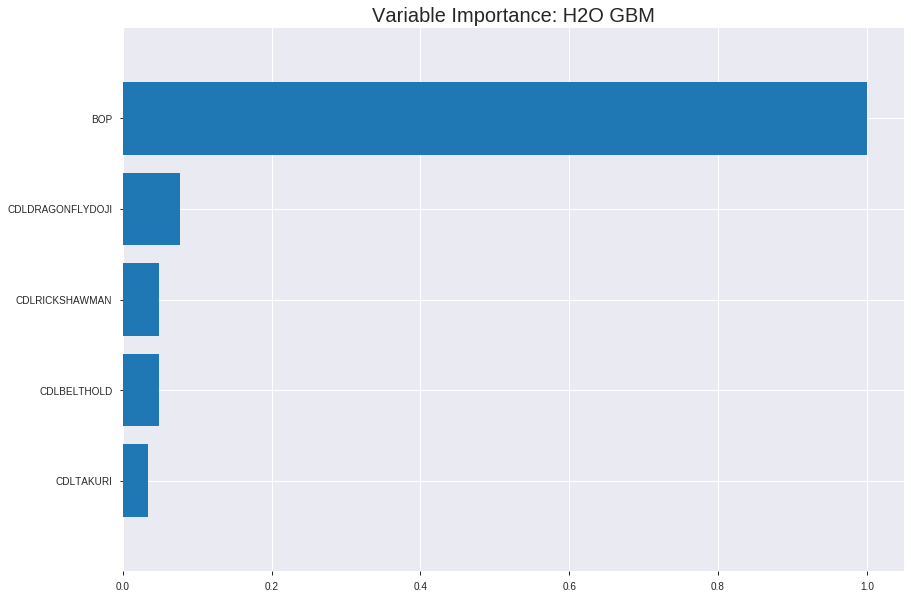

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191207_230516


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.2183998821696031
RMSE: 0.46733273175501316
LogLoss: 0.6245701251460207
Mean Per-Class Error: 0.3546432837768654
AUC: 0.7072882891474347
pr_auc: 0.688715842340003
Gini: 0.4145765782948694
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.421492282253127: 


,0,1,Error,Rate
0,280.0,651.0,0.6992,(651.0/931.0)
1,66.0,790.0,0.0771,(66.0/856.0)
Total,346.0,1441.0,0.4012,(717.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4214923,0.6878537,289.0
max f2,0.2247966,0.8312170,366.0
max f0point5,0.5088081,0.6359649,181.0
max accuracy,0.5088081,0.6496922,181.0
max precision,0.8080920,1.0,0.0
max recall,0.1337216,1.0,380.0
max specificity,0.8080920,1.0,0.0
max absolute_mcc,0.5088081,0.2976701,181.0
max min_per_class_accuracy,0.4845148,0.6436916,215.0
max mean_per_class_accuracy,0.5088081,0.6453567,181.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.97 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7689684,1.9716381,1.9716381,0.9444444,0.7912695,0.9444444,0.7912695,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0212647,0.7481565,1.8788551,1.9228050,0.9,0.7516014,0.9210526,0.7703915,0.0210280,0.0408879,87.8855140,92.2804968
,3,0.0302182,0.7250057,2.0876168,1.9716381,1.0,0.7305538,0.9444444,0.7585878,0.0186916,0.0595794,108.7616822,97.1638110
,4,0.0430890,0.7098926,1.9060849,1.9520573,0.9130435,0.7159603,0.9350649,0.7458549,0.0245327,0.0841121,90.6084925,95.2057289
,5,0.0509233,0.6991751,1.3420394,1.8582084,0.6428571,0.7023225,0.8901099,0.7391576,0.0105140,0.0946262,34.2039386,85.8208380
,6,0.1029659,0.6198032,1.6162195,1.7358988,0.7741935,0.6485035,0.8315217,0.6933379,0.0841121,0.1787383,61.6219475,73.5898771
,7,0.1516508,0.5807902,1.3677490,1.6177105,0.6551724,0.5996912,0.7749077,0.6632742,0.0665888,0.2453271,36.7748953,61.7710453
,8,0.2020145,0.5647317,1.2525701,1.5266782,0.6,0.5712390,0.7313019,0.6403291,0.0630841,0.3084112,25.2570093,52.6678230
,9,0.3038612,0.5586850,1.1929239,1.4148121,0.5714286,0.5589741,0.6777164,0.6130610,0.1214953,0.4299065,19.2923899,41.4812137
,10,0.4001119,0.5069615,1.2622799,1.3781191,0.6046512,0.5300891,0.6601399,0.5931013,0.1214953,0.5514019,26.2279939,37.8119077




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.24787850925547894
RMSE: 0.4978739893341275
LogLoss: 0.6888694129399852
Mean Per-Class Error: 0.45239301283232025
AUC: 0.5596411248234788
pr_auc: 0.5413169689235284
Gini: 0.11928224964695766
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21289404756934274: 


,0,1,Error,Rate
0,4.0,263.0,0.985,(263.0/267.0)
1,0.0,244.0,0.0,(0.0/244.0)
Total,4.0,507.0,0.5147,(263.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2128940,0.6498003,197.0
max f2,0.2128940,0.8226568,197.0
max f0point5,0.4491881,0.5460089,139.0
max accuracy,0.5621922,0.5538160,52.0
max precision,0.7249965,1.0,0.0
max recall,0.2128940,1.0,197.0
max specificity,0.7249965,1.0,0.0
max absolute_mcc,0.5621922,0.1031125,52.0
max min_per_class_accuracy,0.4867351,0.5286885,107.0
max mean_per_class_accuracy,0.4648925,0.5476070,125.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6969479,1.7452186,1.7452186,0.8333333,0.7076391,0.8333333,0.7076391,0.0204918,0.0204918,74.5218579,74.5218579
,2,0.0234834,0.6482609,1.3961749,1.5706967,0.6666667,0.6618538,0.75,0.6847465,0.0163934,0.0368852,39.6174863,57.0696721
,3,0.0332681,0.6393574,0.8377049,1.3551109,0.4,0.6422526,0.6470588,0.6722483,0.0081967,0.0450820,-16.2295082,35.5110897
,4,0.0410959,0.6319231,1.0471311,1.2964481,0.5,0.6351354,0.6190476,0.6651792,0.0081967,0.0532787,4.7131148,29.6448087
,5,0.0528376,0.6250479,1.7452186,1.3961749,0.8333333,0.6263618,0.6666667,0.6565531,0.0204918,0.0737705,74.5218579,39.6174863
,6,0.1017613,0.5851398,1.0890164,1.2485025,0.52,0.6020756,0.5961538,0.6303620,0.0532787,0.1270492,8.9016393,24.8502522
,7,0.1506849,0.5666890,1.0890164,1.1967213,0.52,0.5748584,0.5714286,0.6123413,0.0532787,0.1803279,8.9016393,19.6721311
,8,0.2700587,0.5586851,1.0642972,1.1381860,0.5081967,0.5598582,0.5434783,0.5891423,0.1270492,0.3073770,6.4297232,13.8186030
,9,0.3013699,0.5421750,0.6544570,1.0879285,0.3125,0.5495559,0.5194805,0.5850294,0.0204918,0.3278689,-34.5543033,8.7928465
,10,0.4090020,0.5071052,1.0661699,1.0822025,0.5090909,0.5207631,0.5167464,0.5681172,0.1147541,0.4426230,6.6169896,8.2202526



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:05:22,0.003 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 23:05:22,0.022 sec,5.0,0.4862815,0.6656019,0.6729756,0.6391374,1.9716381,0.4476777,0.4965489,0.6862065,0.5581983,0.5400712,1.7452186,0.4951076
,2019-12-07 23:05:22,0.041 sec,10.0,0.4774781,0.6472373,0.6904457,0.6688137,1.9716381,0.4264130,0.4954938,0.6839908,0.5630948,0.5438513,1.4959016,0.5146771
,2019-12-07 23:05:22,0.059 sec,15.0,0.4746382,0.6408272,0.6935864,0.6736613,1.8556594,0.4264130,0.4959497,0.6849279,0.5642460,0.5410120,1.3961749,0.5146771
,2019-12-07 23:05:22,0.079 sec,20.0,0.4711956,0.6333223,0.6987688,0.6793496,1.8467380,0.4135422,0.4968358,0.6866318,0.5614754,0.5374446,1.3961749,0.5146771
,2019-12-07 23:05:22,0.099 sec,25.0,0.4691820,0.6288537,0.7037278,0.6849398,2.0876168,0.4107443,0.4975651,0.6883706,0.5642383,0.5368570,1.3961749,0.5146771
,2019-12-07 23:05:22,0.119 sec,30.0,0.4673327,0.6245701,0.7072883,0.6887158,1.9716381,0.4012311,0.4978740,0.6888694,0.5596411,0.5413170,1.7452186,0.5146771


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,258.4038696,1.0,0.8282799
CDLDRAGONFLYDOJI,19.6908283,0.0762018,0.0631164
CDLRICKSHAWMAN,12.7208681,0.0492286,0.0407751
CDLBELTHOLD,12.4756413,0.0482796,0.0399890
CDLTAKURI,8.6852989,0.0336113,0.0278396


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5703125)

('F1', 0.6449864498644986)

('auc', 0.5813653928724775)

('logloss', 0.6787991226195567)

('mean_per_class_error', 0.42964485064098634)

('rmse', 0.4936721439387585)

('mse', 0.24371218570109032)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


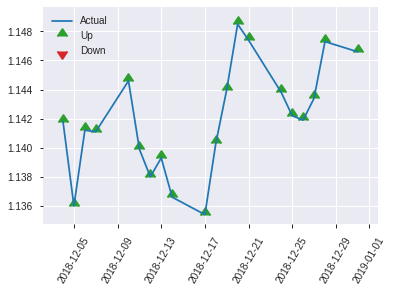


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.24371218570109032
RMSE: 0.4936721439387585
LogLoss: 0.6787991226195567
Mean Per-Class Error: 0.42964485064098634
AUC: 0.5813653928724775
pr_auc: 0.5307919841750904
Gini: 0.16273078574495492
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25230498806998053: 


,0,1,Error,Rate
0,6.0,131.0,0.9562,(131.0/137.0)
1,0.0,119.0,0.0,(0.0/119.0)
Total,6.0,250.0,0.5117,(131.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2523050,0.6449864,118.0
max f2,0.2523050,0.8195592,118.0
max f0point5,0.4567633,0.5543359,81.0
max accuracy,0.5128582,0.5703125,47.0
max precision,0.7249965,1.0,0.0
max recall,0.2523050,1.0,118.0
max specificity,0.7249965,1.0,0.0
max absolute_mcc,0.4567633,0.1676537,81.0
max min_per_class_accuracy,0.4896133,0.5474453,62.0
max mean_per_class_accuracy,0.4567633,0.5703551,81.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6513742,2.1512605,2.1512605,1.0,0.6889544,1.0,0.6889544,0.0252101,0.0252101,115.1260504,115.1260504
,2,0.0234375,0.6384415,0.7170868,1.4341737,0.3333333,0.6420867,0.6666667,0.6655206,0.0084034,0.0336134,-28.2913165,43.4173669
,3,0.03125,0.6283746,0.0,1.0756303,0.0,0.6346345,0.5,0.6577991,0.0,0.0336134,-100.0,7.5630252
,4,0.0429688,0.6134680,1.4341737,1.1734148,0.6666667,0.6188813,0.5454545,0.6471851,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0585938,0.6038876,1.0756303,1.1473389,0.5,0.6044702,0.5333333,0.6357945,0.0168067,0.0672269,7.5630252,14.7338936
,6,0.1015625,0.5847516,1.3689840,1.2411118,0.6363636,0.5953524,0.5769231,0.6186844,0.0588235,0.1260504,36.8983957,24.1111829
,7,0.15625,0.5654461,1.0756303,1.1831933,0.5,0.5711062,0.55,0.6020320,0.0588235,0.1848739,7.5630252,18.3193277
,8,0.3242188,0.5586851,1.0506156,1.1145085,0.4883721,0.5592891,0.5180723,0.5798881,0.1764706,0.3613445,5.0615595,11.4508454
,9,0.4023438,0.5149700,1.2907563,1.1487313,0.6,0.5306911,0.5339806,0.5703353,0.1008403,0.4621849,29.0756303,14.8731337
,10,0.5,0.4893653,0.9465546,1.1092437,0.44,0.5039915,0.515625,0.5573775,0.0924370,0.5546218,-5.3445378,10.9243697


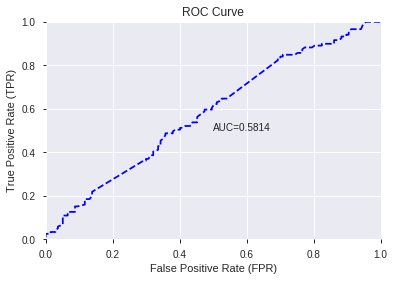

This function is available for GLM models only


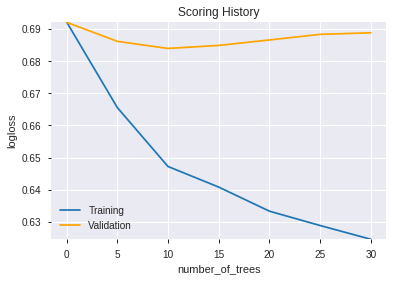

--2019-12-07 23:05:30--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.207.147
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.207.147|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1682.0
            depth:       1
            colId:       4
            colName:     CDLTAKURI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.018606767
            squaredErr:  420.49048
            leftChild:   Node 3
            rightChil

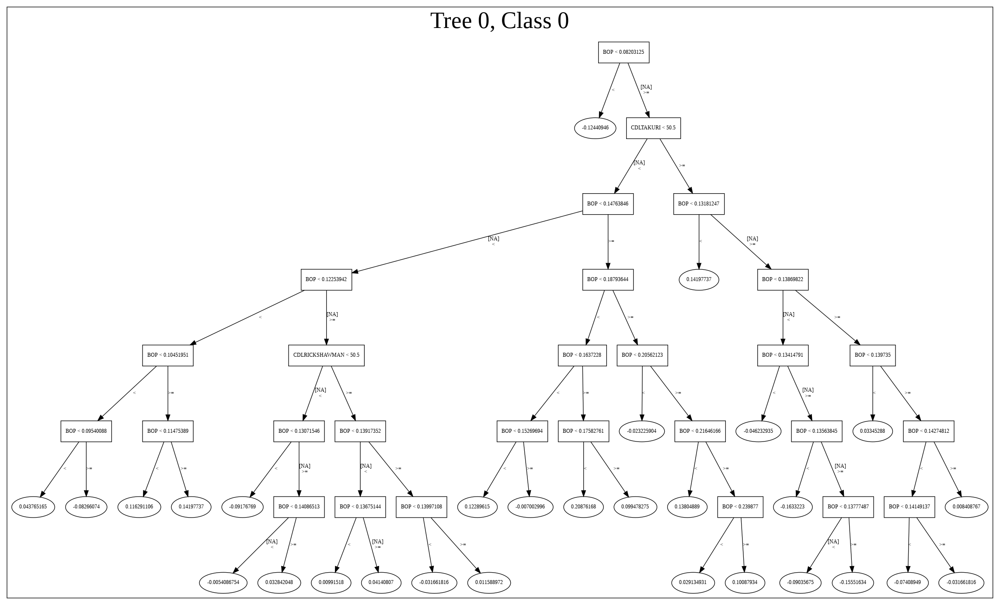

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191207_230516',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191207_230516',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_111_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_111_sid_9f32',
   'type': 'Ke

['BOP', 'CDLDRAGONFLYDOJI', 'CDLRICKSHAWMAN', 'CDLBELTHOLD', 'CDLTAKURI']

In [90]:
# All algos with Select Family-wise error features
model_train(feature_name='Fwe',model_algo=None,features_list=features_list)

In [91]:
# recursive feature elimination
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFE
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFE(ExtraTreeClassifier(random_state=1,criterion='entropy'), n_features_to_select=select_rfe, step=1).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFE, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BBANDS_upperband_12_6_3',
 'BBANDS_middleband_20_2_2',
 'BOP',
 'ADXR_8',
 'aroondown_8',
 'AROONOSC_8',
 'CCI_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'aroondown_12',
 'CCI_12',
 'MINUS_DI_12',
 'MOM_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'ROC_12',
 'ROCP_12',
 'CMO_14',
 'MACDFIX_hist_14',
 'MINUS_DI_14',
 'PLUS_DM_14',
 'ROCR_14',
 'WILLR_14',
 'CCI_20',
 'MOM_20',
 'PLUS_DI_20',
 'ROC_20',
 'CMO_24',
 'MOM_24',
 'ROC_24',
 'CCI_30',
 'MINUS_DI_30',
 'RSI_30',
 'MACD',
 'PPO',
 'STOCH_slowk',
 'STOCH_slowd',
 'STOCHF_fastd',
 'ATR_8',
 'NATR_8',
 'ATR_20',
 'TRANGE',
 'HT_PHASOR_inphase',
 'HT_PHASOR_quadrature',
 'CDLSPINNINGTOP',
 'BETA_8',
 'CORREL_8',
 'CORREL_12',
 'VAR_12']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_230547_model_9,0.617126,0.655622,0.382322,0.482496,0.232802
1,DeepLearning_grid_1_AutoML_20191207_230547_model_8,0.601791,0.662348,0.396031,0.485667,0.235872
2,DeepLearning_grid_1_AutoML_20191207_230547_model_6,0.598847,0.665282,0.423020,0.487271,0.237433
3,DeepLearning_grid_1_AutoML_20191207_230547_model_5,0.594369,0.666534,0.439612,0.487959,0.238104
4,DeepLearning_grid_1_AutoML_20191207_230547_model_3,0.565295,0.736667,0.460406,0.515244,0.265477
5,DeepLearning_1_AutoML_20191207_230547,0.545298,0.731846,0.481752,0.514925,0.265148
6,DeepLearning_grid_1_AutoML_20191207_230547_model_7,0.542600,0.769066,0.489603,0.515406,0.265643
7,DeepLearning_grid_1_AutoML_20191207_230547_model_2,0.521070,0.797307,0.485401,0.535223,0.286464
8,DeepLearning_grid_1_AutoML_20191207_230547_model_1,0.501257,0.953428,0.476661,0.568561,0.323262
9,DeepLearning_grid_1_AutoML_20191207_230547_model_4,0.483960,0.876200,0.478102,0.563063,0.317039


,variable,relative_importance,scaled_importance,percentage
0,TRANGE,1.000000,1.000000,0.071140
1,BOP,0.796062,0.796062,0.056631
2,MINUS_DI_12,0.324998,0.324998,0.023120
3,CCI_8,0.318360,0.318360,0.022648
4,ATR_20,0.313954,0.313954,0.022335
5,ADXR_8,0.298880,0.298880,0.021262
6,WILLR_8,0.292826,0.292826,0.020832
7,aroondown_8,0.289513,0.289513,0.020596
8,CDLSPINNINGTOP,0.289210,0.289210,0.020574
9,VAR_12,0.287084,0.287084,0.020423


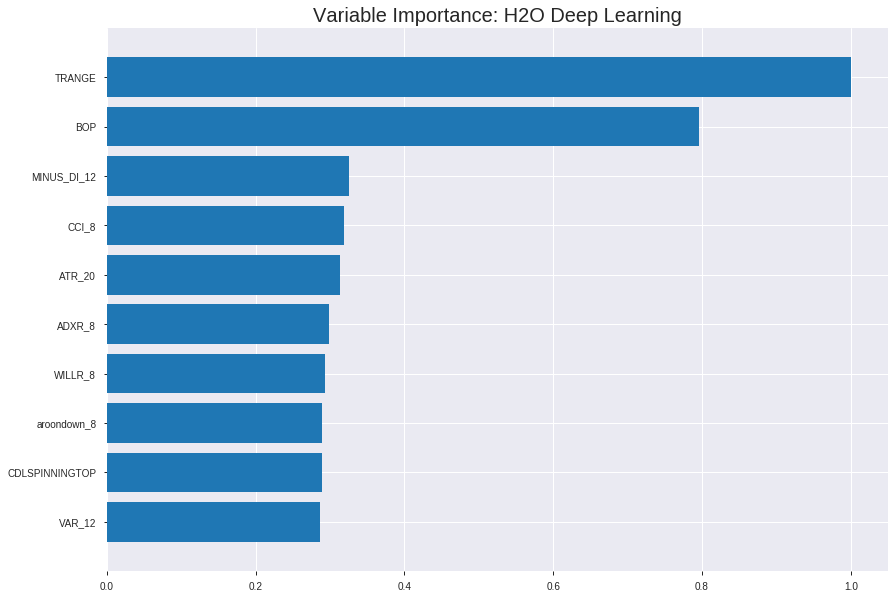

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_230547_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.22439081556751578
RMSE: 0.4736990770178002
LogLoss: 0.6459615333075567
Mean Per-Class Error: 0.367965558087475
AUC: 0.67645331620105
pr_auc: 0.6316695006661256
Gini: 0.35290663240209996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2604837752764534: 


,0,1,Error,Rate
0,233.0,698.0,0.7497,(698.0/931.0)
1,43.0,813.0,0.0502,(43.0/856.0)
Total,276.0,1511.0,0.4147,(741.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2604838,0.6869455,299.0
max f2,0.1540938,0.8285938,355.0
max f0point5,0.5307877,0.6137255,158.0
max accuracy,0.5307877,0.6278679,158.0
max precision,0.9301889,1.0,0.0
max recall,0.0000000,1.0,399.0
max specificity,0.9301889,1.0,0.0
max absolute_mcc,0.2758969,0.2765771,293.0
max min_per_class_accuracy,0.5566773,0.6238318,133.0
max mean_per_class_accuracy,0.5307877,0.6320344,158.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7032030,1.6237020,1.6237020,0.7777778,0.7291846,0.7777778,0.7291846,0.0163551,0.0163551,62.3701973,62.3701973
,2,0.0201455,0.6887429,1.5077233,1.5657126,0.7222222,0.6964141,0.75,0.7127994,0.0151869,0.0315421,50.7723261,56.5712617
,3,0.0302182,0.6756993,1.5077233,1.5463828,0.7222222,0.6830510,0.7407407,0.7028832,0.0151869,0.0467290,50.7723261,54.6382831
,4,0.0402910,0.6641420,1.6237020,1.5657126,0.7777778,0.6692996,0.75,0.6944873,0.0163551,0.0630841,62.3701973,56.5712617
,5,0.0503637,0.6561114,1.7396807,1.6005062,0.8333333,0.6596681,0.7666667,0.6875235,0.0175234,0.0806075,73.9680685,60.0506231
,6,0.1001679,0.6255113,1.4542949,1.5278090,0.6966292,0.6388353,0.7318436,0.6633154,0.0724299,0.1530374,45.4294865,52.7808959
,7,0.1499720,0.6072212,1.1962748,1.4177099,0.5730337,0.6148971,0.6791045,0.6472362,0.0595794,0.2126168,19.6274808,41.7709932
,8,0.2003358,0.5961329,1.2525701,1.3761943,0.6,0.6017512,0.6592179,0.6358014,0.0630841,0.2757009,25.2570093,37.6194330
,9,0.2999440,0.5807859,1.2783721,1.3437086,0.6123596,0.5882062,0.6436567,0.6199956,0.1273364,0.4030374,27.8372099,34.3708589
,10,0.4001119,0.5658538,1.1079531,1.2846873,0.5307263,0.5733295,0.6153846,0.6083127,0.1109813,0.5140187,10.7953062,28.4687275




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.23604407194522128
RMSE: 0.48584367027390746
LogLoss: 0.6636184722083625
Mean Per-Class Error: 0.40582212807760787
AUC: 0.6208709400135076
pr_auc: 0.5810398876223773
Gini: 0.24174188002701524
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3580828131715278: 


,0,1,Error,Rate
0,57.0,210.0,0.7865,(210.0/267.0)
1,16.0,228.0,0.0656,(16.0/244.0)
Total,73.0,438.0,0.4423,(226.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3580828,0.6686217,329.0
max f2,0.2227570,0.8293515,377.0
max f0point5,0.4289344,0.5803571,280.0
max accuracy,0.5308160,0.5949119,148.0
max precision,0.6255403,1.0,0.0
max recall,0.0869395,1.0,398.0
max specificity,0.6255403,1.0,0.0
max absolute_mcc,0.4289344,0.2121133,280.0
max min_per_class_accuracy,0.5207104,0.5860656,163.0
max mean_per_class_accuracy,0.5249236,0.5941779,157.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 47.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6131290,1.7452186,1.7452186,0.8333333,0.6193781,0.8333333,0.6193781,0.0204918,0.0204918,74.5218579,74.5218579
,2,0.0215264,0.6000046,1.6754098,1.7134873,0.8,0.6069170,0.8181818,0.6137140,0.0163934,0.0368852,67.5409836,71.3487332
,3,0.0313112,0.5947421,0.8377049,1.4398053,0.4,0.5985337,0.6875,0.6089701,0.0081967,0.0450820,-16.2295082,43.9805328
,4,0.0410959,0.5921834,2.0942623,1.5956284,1.0,0.5932862,0.7619048,0.6052359,0.0204918,0.0655738,109.4262295,59.5628415
,5,0.0508806,0.5908039,1.2565574,1.5304224,0.6,0.5915145,0.7307692,0.6025971,0.0122951,0.0778689,25.6557377,53.0422446
,6,0.1017613,0.5784242,1.2887768,1.4095996,0.6153846,0.5843137,0.6730769,0.5934554,0.0655738,0.1434426,28.8776797,40.9599622
,7,0.1506849,0.5692836,0.9214754,1.2511177,0.44,0.5739697,0.5974026,0.5871289,0.0450820,0.1885246,-7.8524590,25.1117735
,8,0.2015656,0.5635719,1.2082282,1.2402913,0.5769231,0.5658945,0.5922330,0.5817688,0.0614754,0.25,20.8228247,24.0291262
,9,0.3013699,0.5556092,1.1908550,1.2239195,0.5686275,0.5589878,0.5844156,0.5742244,0.1188525,0.3688525,19.0855031,22.3919523
,10,0.4011742,0.5429187,1.1497911,1.2054778,0.5490196,0.5504780,0.5756098,0.5683168,0.1147541,0.4836066,14.9791064,20.5477809



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:10:58,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 23:11:01,1 min 12.960 sec,1396 obs/sec,2.0,1,3574.0,0.5384811,0.7807880,-0.1618943,0.5151668,0.4940171,1.1597871,0.5198657,0.5291596,0.7572195,-0.1223134,0.5693728,0.5482394,1.7452186,0.5185910
,2019-12-07 23:11:06,1 min 18.319 sec,1936 obs/sec,8.0,4,14296.0,0.4994308,0.6923935,0.0005150,0.6240131,0.5778187,1.3917445,0.4292110,0.5026496,0.6984673,-0.0126780,0.5788973,0.5375823,1.3961749,0.5048924
,2019-12-07 23:11:12,1 min 24.334 sec,2219 obs/sec,16.0,8,28592.0,0.4830766,0.6606923,0.0649007,0.6464333,0.6023120,1.8556594,0.4191382,0.4908060,0.6742254,0.0344820,0.6075474,0.5540460,1.3961749,0.4246575
,2019-12-07 23:11:18,1 min 29.935 sec,2386 obs/sec,24.0,12,42888.0,0.4819044,0.6582089,0.0694334,0.6657172,0.6119985,1.5077233,0.4152210,0.4935981,0.6799636,0.0234654,0.6090287,0.5586610,1.0471311,0.4677104
,2019-12-07 23:11:23,1 min 35.107 sec,2527 obs/sec,32.0,16,57184.0,0.4768851,0.6489484,0.0887171,0.6768737,0.6260475,1.6237020,0.3922776,0.4904098,0.6733146,0.0360400,0.6101031,0.5593387,1.3961749,0.4696673
,2019-12-07 23:11:28,1 min 40.295 sec,2486 obs/sec,38.0,19,67906.0,0.4736991,0.6459615,0.1008529,0.6764533,0.6316695,1.6237020,0.4146614,0.4858437,0.6636185,0.0539070,0.6208709,0.5810399,1.7452186,0.4422701
,2019-12-07 23:11:34,1 min 46.191 sec,2623 obs/sec,48.0,24,85776.0,0.4702300,0.6362947,0.1139741,0.6858600,0.6419768,1.7396807,0.3816452,0.4922209,0.6768032,0.0289071,0.5920289,0.5439805,1.0471311,0.4716243
,2019-12-07 23:11:34,1 min 46.750 sec,2621 obs/sec,48.0,24,85776.0,0.4736991,0.6459615,0.1008529,0.6764533,0.6316695,1.6237020,0.4146614,0.4858437,0.6636185,0.0539070,0.6208709,0.5810399,1.7452186,0.4422701


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
TRANGE,1.0,1.0,0.0711395
BOP,0.7960615,0.7960615,0.0566314
MINUS_DI_12,0.3249977,0.3249977,0.0231202
CCI_8,0.3183598,0.3183598,0.0226480
ATR_20,0.3139541,0.3139541,0.0223345
---,---,---,---
ROC_24,0.2226927,0.2226927,0.0158423
MOM_12,0.2191920,0.2191920,0.0155932
MOM_24,0.2183267,0.2183267,0.0155317
ROCR_14,0.2145108,0.2145108,0.0152602



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.59765625)

('F1', 0.6867469879518073)

('auc', 0.6171256823897442)

('logloss', 0.6556215328836965)

('mean_per_class_error', 0.3823222719744832)

('rmse', 0.4824957496433432)

('mse', 0.23280214842389169)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


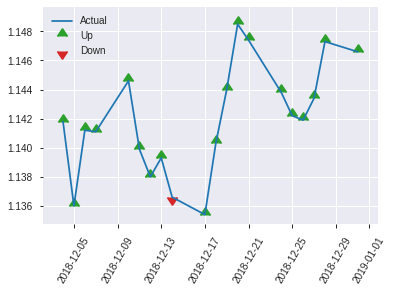


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23280214842389169
RMSE: 0.4824957496433432
LogLoss: 0.6556215328836965
Mean Per-Class Error: 0.3823222719744832
AUC: 0.6171256823897442
pr_auc: 0.5213580910089605
Gini: 0.23425136477948838
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3980269926126503: 


,0,1,Error,Rate
0,38.0,99.0,0.7226,(99.0/137.0)
1,5.0,114.0,0.042,(5.0/119.0)
Total,43.0,213.0,0.4062,(104.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3980270,0.6867470,212.0
max f2,0.3702726,0.8333333,219.0
max f0point5,0.3980270,0.5870237,212.0
max accuracy,0.5537228,0.5976562,99.0
max precision,0.6026637,0.6,4.0
max recall,0.2485122,1.0,242.0
max specificity,0.6624613,0.9927007,0.0
max absolute_mcc,0.3980270,0.3140032,212.0
max min_per_class_accuracy,0.5403981,0.5547445,127.0
max mean_per_class_accuracy,0.3980270,0.6176777,212.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 49.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6116879,0.7170868,0.7170868,0.3333333,0.6335090,0.3333333,0.6335090,0.0084034,0.0084034,-28.2913165,-28.2913165
,2,0.0234375,0.6017518,1.4341737,1.0756303,0.6666667,0.6039620,0.5,0.6187355,0.0168067,0.0252101,43.4173669,7.5630252
,3,0.03125,0.5963029,1.0756303,1.0756303,0.5,0.5978848,0.5,0.6135228,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.5925484,0.0,0.7822765,0.0,0.5943244,0.3636364,0.6082869,0.0,0.0336134,-100.0,-21.7723453
,5,0.0507812,0.5896644,1.0756303,0.8274079,0.5,0.5907120,0.3846154,0.6055831,0.0084034,0.0420168,7.5630252,-17.2592114
,6,0.1015625,0.5808054,1.1583710,0.9928895,0.5384615,0.5857966,0.4615385,0.5956898,0.0588235,0.1008403,15.8371041,-0.7110537
,7,0.1523438,0.5763701,0.9928895,0.9928895,0.4615385,0.5785858,0.4615385,0.5899885,0.0504202,0.1512605,-0.7110537,-0.7110537
,8,0.203125,0.5708407,1.3238526,1.0756303,0.6153846,0.5728317,0.5,0.5856993,0.0672269,0.2184874,32.3852618,7.5630252
,9,0.3007812,0.5630282,1.3768067,1.1734148,0.64,0.5672241,0.5454545,0.5797009,0.1344538,0.3529412,37.6806723,17.3414820
,10,0.4023438,0.5536434,1.4065934,1.2322754,0.6538462,0.5578843,0.5728155,0.5741938,0.1428571,0.4957983,40.6593407,23.2275434


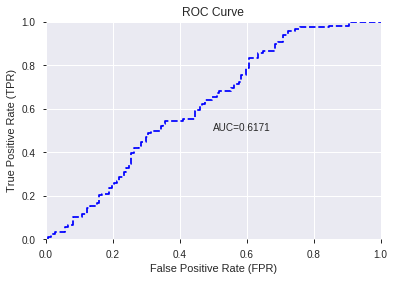

This function is available for GLM models only


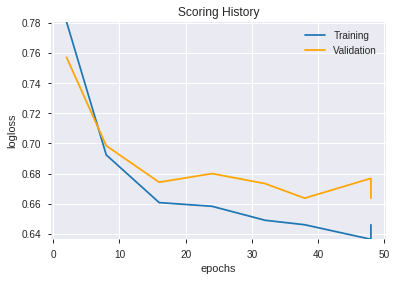

--2019-12-07 23:11:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.8.28
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.8.28|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


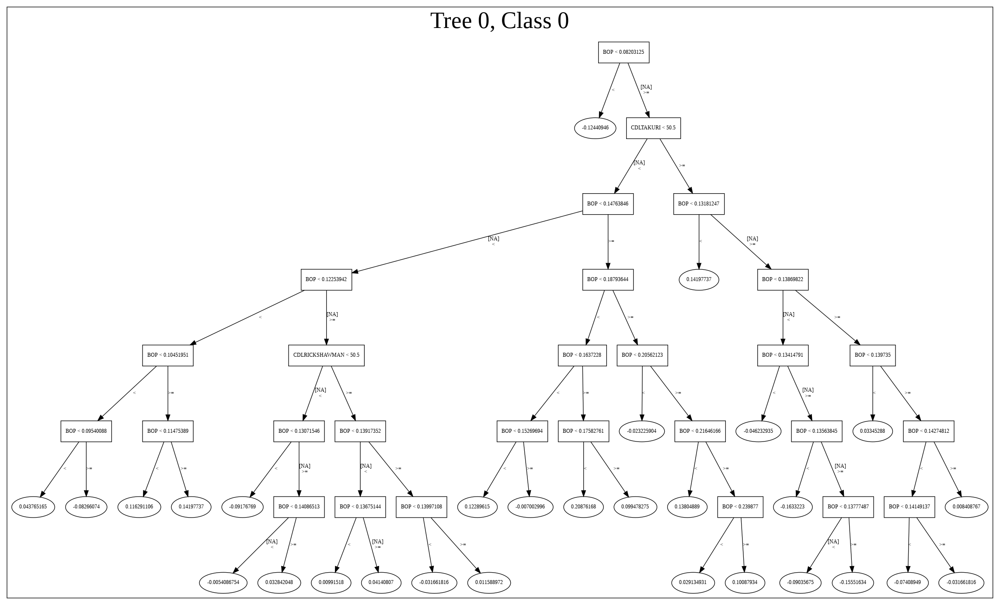

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_230547_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_230547_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_116_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['TRANGE',
 'BOP',
 'MINUS_DI_12',
 'CCI_8',
 'ATR_20',
 'ADXR_8',
 'WILLR_8',
 'aroondown_8',
 'CDLSPINNINGTOP',
 'VAR_12',
 'MINUS_DI_14',
 'BETA_8',
 'HT_PHASOR_quadrature',
 'BBANDS_middleband_20_2_2',
 'aroondown_12',
 'CCI_30',
 'STOCH_slowk',
 'WILLR_14',
 'ATR_8',
 'STOCHF_fastd',
 'AROONOSC_8',
 'CCI_20',
 'RSI_8',
 'CCI_12',
 'PLUS_DI_12',
 'MINUS_DI_30',
 'BBANDS_upperband_12_6_3',
 'PLUS_DI_20',
 'ROCR100_8',
 'RSI_30',
 'CORREL_8',
 'NATR_8',
 'PLUS_DM_12',
 'CORREL_12',
 'CMO_24',
 'ROC_12',
 'CMO_14',
 'ROCP_12',
 'PPO',
 'MACD',
 'STOCH_slowd',
 'MACDFIX_hist_14',
 'HT_PHASOR_inphase',
 'PLUS_DM_14',
 'MOM_20',
 'ROC_24',
 'MOM_12',
 'MOM_24',
 'ROCR_14',
 'ROC_20']

In [92]:
# DeepLearning with recursive feature elimination
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_231148_model_1,0.627676,0.665995,0.417715,0.486828,0.237002


,variable,relative_importance,scaled_importance,percentage
0,CMO_14,0.799912,1.000000,0.093912
1,MINUS_DI_12,0.658218,0.822864,0.077277
2,RSI_30,0.574928,0.718739,0.067498
3,CCI_8,0.499530,0.624482,0.058646
4,BOP,0.486528,0.608227,0.057120
5,MOM_12,0.460741,0.575990,0.054092
6,MINUS_DI_14,0.391569,0.489516,0.045971
7,NATR_8,0.362191,0.452788,0.042522
8,ATR_8,0.311638,0.389591,0.036587
9,ATR_20,0.291046,0.363848,0.034170


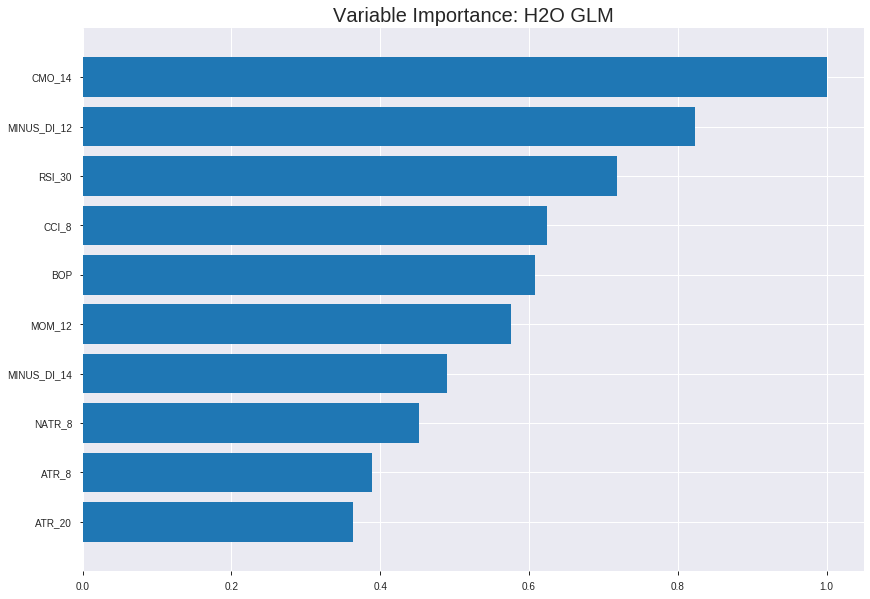

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_231148_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2299348247846317
RMSE: 0.47951519765762557
LogLoss: 0.6558300171464359
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2474.1593649352335
Residual deviance: 2343.9364812813606
AIC: 2445.9364812813606
AUC: 0.6660440738026642
pr_auc: 0.6009497167826154
Gini: 0.33208814760532834
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4126113100303399: 


,0,1,Error,Rate
0,362.0,569.0,0.6112,(569.0/931.0)
1,123.0,733.0,0.1437,(123.0/856.0)
Total,485.0,1302.0,0.3872,(692.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4126113,0.6793327,259.0
max f2,0.2849482,0.8264625,342.0
max f0point5,0.4821516,0.6136364,195.0
max accuracy,0.4826828,0.6295467,194.0
max precision,0.9999006,1.0,0.0
max recall,0.0000331,1.0,399.0
max specificity,0.9999006,1.0,0.0
max absolute_mcc,0.4126113,0.2753882,259.0
max min_per_class_accuracy,0.4821516,0.6283566,195.0
max mean_per_class_accuracy,0.4595038,0.6303681,214.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7795353,1.1597871,1.1597871,0.5555556,0.8199015,0.5555556,0.8199015,0.0116822,0.0116822,15.9787124,15.9787124
,2,0.0201455,0.7496112,1.3917445,1.2757658,0.6666667,0.7617650,0.6111111,0.7908333,0.0140187,0.0257009,39.1744548,27.5765836
,3,0.0302182,0.7136939,1.5077233,1.3530850,0.7222222,0.7312473,0.6481481,0.7709713,0.0151869,0.0408879,50.7723261,35.3084978
,4,0.0402910,0.6985790,1.3917445,1.3627499,0.6666667,0.7039722,0.6527778,0.7542215,0.0140187,0.0549065,39.1744548,36.2749870
,5,0.0503637,0.6861916,1.2757658,1.3453531,0.6111111,0.6919067,0.6444444,0.7417585,0.0128505,0.0677570,27.5765836,34.5353063
,6,0.1001679,0.6397118,1.2901003,1.3178810,0.6179775,0.6601170,0.6312849,0.7011658,0.0642523,0.1320093,29.0100284,31.7881011
,7,0.1499720,0.6056205,1.3839258,1.3398138,0.6629213,0.6226388,0.6417910,0.6750878,0.0689252,0.2009346,38.3925759,33.9813782
,8,0.2003358,0.5802408,1.3221573,1.3353750,0.6333333,0.5930481,0.6396648,0.6544633,0.0665888,0.2675234,32.2157321,33.5375007
,9,0.2999440,0.5419030,1.2666439,1.3125501,0.6067416,0.5606861,0.6287313,0.6233209,0.1261682,0.3936916,26.6643915,31.2550129
,10,0.4001119,0.5110903,1.2129170,1.2876070,0.5810056,0.5270415,0.6167832,0.5992174,0.1214953,0.5151869,21.2917036,28.7607019




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2349918230348099
RMSE: 0.484759551772639
LogLoss: 0.6620063436942087
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 707.3655748698118
Residual deviance: 676.5704832554813
AIC: 778.5704832554813
AUC: 0.639474734450789
pr_auc: 0.5840369631032118
Gini: 0.2789494689015779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40033992675712404: 


,0,1,Error,Rate
0,62.0,205.0,0.7678,(205.0/267.0)
1,17.0,227.0,0.0697,(17.0/244.0)
Total,79.0,432.0,0.4344,(222.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4003399,0.6715976,328.0
max f2,0.3205985,0.8293515,377.0
max f0point5,0.5021017,0.5998322,184.0
max accuracy,0.5050445,0.6183953,180.0
max precision,0.7446166,1.0,0.0
max recall,0.2275085,1.0,396.0
max specificity,0.7446166,1.0,0.0
max absolute_mcc,0.5021017,0.2343837,184.0
max min_per_class_accuracy,0.4950874,0.6029963,197.0
max mean_per_class_accuracy,0.5021017,0.6170028,184.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 49.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6995416,1.3961749,1.3961749,0.6666667,0.7153695,0.6666667,0.7153695,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.6814943,0.4188525,0.9519374,0.2,0.6857780,0.4545455,0.7019188,0.0040984,0.0204918,-58.1147541,-4.8062593
,3,0.0313112,0.6593294,1.2565574,1.0471311,0.6,0.6693554,0.5,0.6917428,0.0122951,0.0327869,25.6557377,4.7131148
,4,0.0410959,0.6547226,2.0942623,1.2964481,1.0,0.6567110,0.6190476,0.6834019,0.0204918,0.0532787,109.4262295,29.6448087
,5,0.0508806,0.6421987,1.2565574,1.2887768,0.6,0.6467608,0.6153846,0.6763555,0.0122951,0.0655738,25.6557377,28.8776797
,6,0.1017613,0.6116674,1.4498739,1.3693253,0.6923077,0.6248839,0.6538462,0.6506197,0.0737705,0.1393443,44.9873897,36.9325347
,7,0.1506849,0.5910969,1.1727869,1.3055142,0.56,0.6016276,0.6233766,0.6347132,0.0573770,0.1967213,17.2786885,30.5514158
,8,0.2015656,0.5678995,1.3693253,1.3216218,0.6538462,0.5801927,0.6310680,0.6209507,0.0696721,0.2663934,36.9325347,32.1621837
,9,0.3013699,0.5448653,1.1908550,1.2783159,0.5686275,0.5560083,0.6103896,0.5994438,0.1188525,0.3852459,19.0855031,27.8315946
,10,0.4011742,0.5176481,1.1087271,1.2361255,0.5294118,0.5323096,0.5902439,0.5827421,0.1106557,0.4959016,10.8727097,23.6125550



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:11:48,0.000 sec,2,.75E1,51,1.3811083,1.3848103
,2019-12-07 23:11:48,0.007 sec,4,.46E1,51,1.3794500,1.3846519
,2019-12-07 23:11:48,0.014 sec,6,.29E1,51,1.3770785,1.3841423
,2019-12-07 23:11:48,0.024 sec,8,.18E1,51,1.3737669,1.3830908
,2019-12-07 23:11:48,0.033 sec,10,.11E1,51,1.3693130,1.3813232
---,---,---,---,---,---,---,---
,2019-12-07 23:11:48,0.156 sec,42,.54E-3,51,1.3106801,1.3242224
,2019-12-07 23:11:48,0.163 sec,44,.34E-3,51,1.3097190,1.3251587
,2019-12-07 23:11:48,0.172 sec,46,.21E-3,51,1.3088051,1.3266025
,2019-12-07 23:11:48,0.180 sec,48,.13E-3,51,1.3079847,1.3282586



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.59765625)

('F1', 0.6705202312138727)

('auc', 0.6276758878733976)

('logloss', 0.6659945842928143)

('mean_per_class_error', 0.3897135496534381)

('rmse', 0.48682818581105564)

('mse', 0.2370016825000837)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


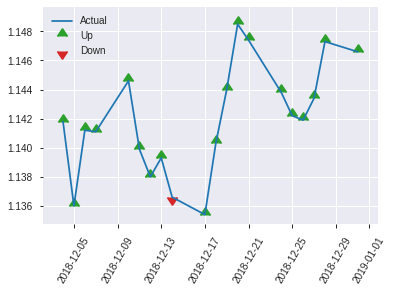


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2370016825000837
RMSE: 0.48682818581105564
LogLoss: 0.6659945842928143
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 353.8308882659767
Residual deviance: 340.98922715792094
AIC: 442.98922715792094
AUC: 0.6276758878733976
pr_auc: 0.5480322494009956
Gini: 0.25535177574679513
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36540875668162814: 


,0,1,Error,Rate
0,26.0,111.0,0.8102,(111.0/137.0)
1,3.0,116.0,0.0252,(3.0/119.0)
Total,29.0,227.0,0.4453,(114.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3654088,0.6705202,226.0
max f2,0.3559313,0.8274895,236.0
max f0point5,0.4199123,0.5824040,171.0
max accuracy,0.4199123,0.5976562,171.0
max precision,0.6584376,0.6666667,2.0
max recall,0.2893635,1.0,250.0
max specificity,0.6862483,0.9927007,0.0
max absolute_mcc,0.3654088,0.2589852,226.0
max min_per_class_accuracy,0.4681771,0.5714286,120.0
max mean_per_class_accuracy,0.4199123,0.6102865,171.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6567696,1.4341737,1.4341737,0.6666667,0.6718603,0.6666667,0.6718603,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.6389805,0.7170868,1.0756303,0.3333333,0.6504431,0.5,0.6611517,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.6140035,1.0756303,1.0756303,0.5,0.6173582,0.5,0.6502033,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.6069150,1.4341737,1.1734148,0.6666667,0.6102974,0.5454545,0.6393199,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0507812,0.6016679,0.0,0.9928895,0.0,0.6045066,0.4615385,0.6339640,0.0,0.0504202,-100.0,-0.7110537
,6,0.1015625,0.5783953,1.3238526,1.1583710,0.6153846,0.5911683,0.5384615,0.6125661,0.0672269,0.1176471,32.3852618,15.8371041
,7,0.1523438,0.5585697,1.6548158,1.3238526,0.7692308,0.5653988,0.6153846,0.5968437,0.0840336,0.2016807,65.4815772,32.3852618
,8,0.203125,0.5497847,1.3238526,1.3238526,0.6153846,0.5535754,0.6153846,0.5860266,0.0672269,0.2689076,32.3852618,32.3852618
,9,0.3007812,0.5215869,1.0326050,1.2292917,0.48,0.5339826,0.5714286,0.5691292,0.1008403,0.3697479,3.2605042,22.9291717
,10,0.4023438,0.4872563,1.1583710,1.2113894,0.5384615,0.5023158,0.5631068,0.5522637,0.1176471,0.4873950,15.8371041,21.1389410


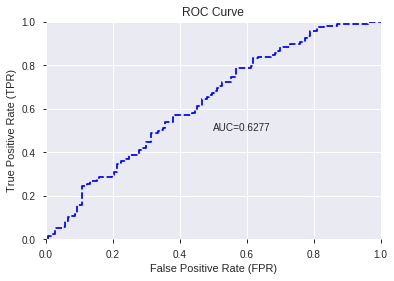

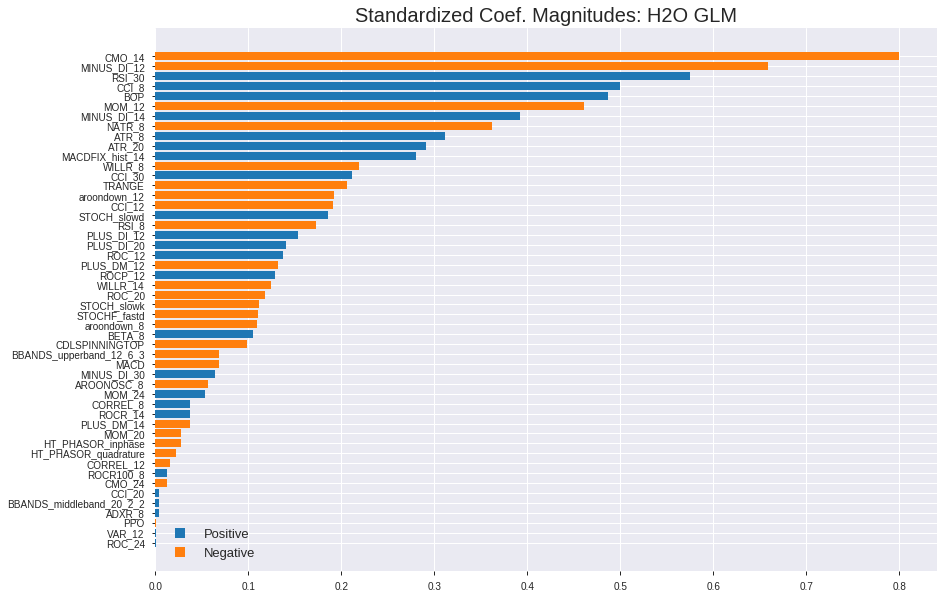

'log_likelihood'
--2019-12-07 23:11:52--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


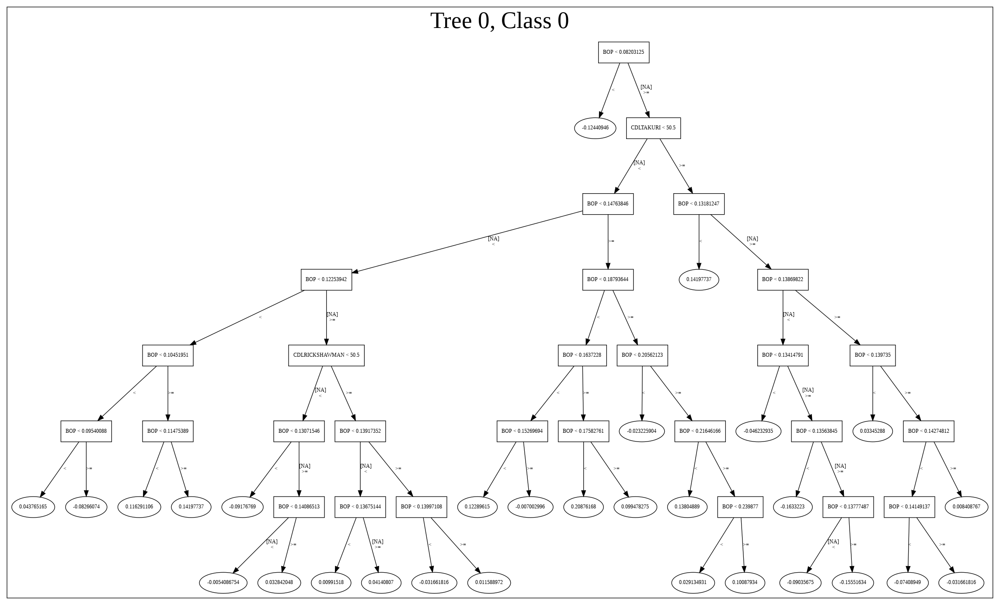

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_231148_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_231148_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_121_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_121

['CMO_14',
 'MINUS_DI_12',
 'RSI_30',
 'CCI_8',
 'BOP',
 'MOM_12',
 'MINUS_DI_14',
 'NATR_8',
 'ATR_8',
 'ATR_20',
 'MACDFIX_hist_14',
 'WILLR_8',
 'CCI_30',
 'TRANGE',
 'aroondown_12',
 'CCI_12',
 'STOCH_slowd',
 'RSI_8',
 'PLUS_DI_12',
 'PLUS_DI_20',
 'ROC_12',
 'PLUS_DM_12',
 'ROCP_12',
 'WILLR_14',
 'ROC_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'aroondown_8',
 'BETA_8',
 'CDLSPINNINGTOP',
 'BBANDS_upperband_12_6_3',
 'MACD',
 'MINUS_DI_30',
 'AROONOSC_8',
 'MOM_24',
 'CORREL_8',
 'ROCR_14',
 'PLUS_DM_14',
 'MOM_20',
 'HT_PHASOR_inphase',
 'HT_PHASOR_quadrature',
 'CORREL_12',
 'ROCR100_8',
 'CMO_24',
 'CCI_20',
 'BBANDS_middleband_20_2_2',
 'ADXR_8',
 'PPO',
 'VAR_12',
 'ROC_24']

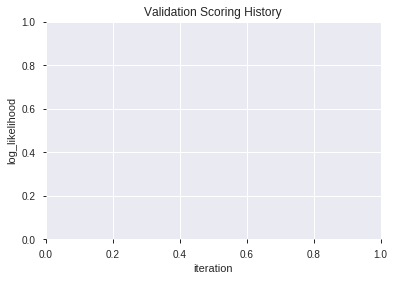

In [93]:
# GLM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_231200_model_4,0.626326,0.662714,0.428663,0.485243,0.235461
1,XGBoost_grid_1_AutoML_20191207_231200_model_1,0.605870,0.673008,0.450561,0.490306,0.240400
2,XGBoost_1_AutoML_20191207_231200,0.601975,0.676376,0.429982,0.491676,0.241745
3,XGBoost_2_AutoML_20191207_231200,0.601730,0.673928,0.413175,0.490826,0.240910
4,XGBoost_3_AutoML_20191207_231200,0.600871,0.672156,0.450561,0.489654,0.239761
5,XGBoost_grid_1_AutoML_20191207_231200_model_2,0.599276,0.668963,0.423572,0.488457,0.238590
6,XGBoost_grid_1_AutoML_20191207_231200_model_3,0.597927,0.672676,0.435963,0.490135,0.240232
7,XGBoost_grid_1_AutoML_20191207_231200_model_6,0.586947,0.677099,0.443262,0.492257,0.242317
8,XGBoost_grid_1_AutoML_20191207_231200_model_7,0.573023,0.684658,0.428663,0.496468,0.246481
9,XGBoost_grid_1_AutoML_20191207_231200_model_5,0.560940,0.711104,0.459517,0.506648,0.256692


,variable,relative_importance,scaled_importance,percentage
0,BOP,515.611755,1.000000,0.154063
1,TRANGE,373.984131,0.725321,0.111745
2,aroondown_8,264.806458,0.513577,0.079123
3,WILLR_8,261.764069,0.507677,0.078214
4,HT_PHASOR_quadrature,152.715515,0.296183,0.045631
5,PLUS_DM_14,111.882553,0.216990,0.033430
6,ATR_20,105.539093,0.204687,0.031535
7,STOCH_slowd,90.611107,0.175735,0.027074
8,PPO,85.170929,0.165184,0.025449
9,CORREL_12,71.571457,0.138809,0.021385


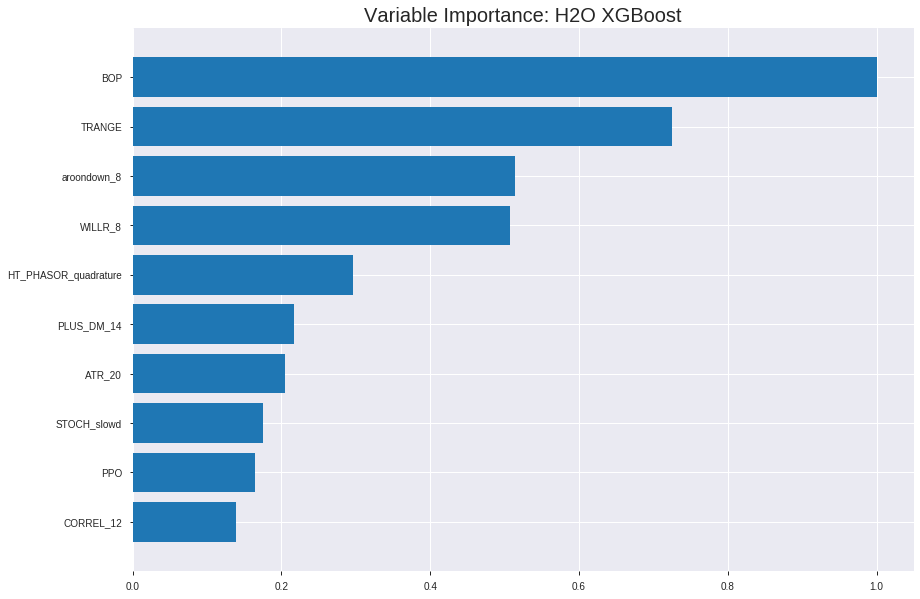

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_231200_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.20703158627910115
RMSE: 0.45500723761177814
LogLoss: 0.6034605813179049
Mean Per-Class Error: 0.28452222010299444
AUC: 0.7865223807181505
pr_auc: 0.758240119500336
Gini: 0.573044761436301
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4488530457019806: 


,0,1,Error,Rate
0,497.0,434.0,0.4662,(434.0/931.0)
1,105.0,751.0,0.1227,(105.0/856.0)
Total,602.0,1185.0,0.3016,(539.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4488530,0.7359138,226.0
max f2,0.3504729,0.8403784,307.0
max f0point5,0.5033890,0.7048250,167.0
max accuracy,0.5033890,0.7162843,167.0
max precision,0.7348191,1.0,0.0
max recall,0.2289626,1.0,377.0
max specificity,0.7348191,1.0,0.0
max absolute_mcc,0.4498054,0.4346439,225.0
max min_per_class_accuracy,0.4979257,0.7114486,174.0
max mean_per_class_accuracy,0.5033890,0.7154778,167.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 48.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.6884294,1.9716381,1.9716381,0.9444444,0.7044755,0.9444444,0.7044755,0.0198598,0.0198598,97.1638110,97.1638110
,2,0.0201455,0.6707434,1.9716381,1.9716381,0.9444444,0.6759276,0.9444444,0.6902016,0.0198598,0.0397196,97.1638110,97.1638110
,3,0.0302182,0.6610315,1.9716381,1.9716381,0.9444444,0.6645459,0.9444444,0.6816497,0.0198598,0.0595794,97.1638110,97.1638110
,4,0.0402910,0.6539906,1.8556594,1.9426434,0.8888889,0.6576093,0.9305556,0.6756396,0.0186916,0.0782710,85.5659398,94.2643432
,5,0.0503637,0.6472971,1.7396807,1.9020509,0.8333333,0.6510937,0.9111111,0.6707304,0.0175234,0.0957944,73.9680685,90.2050883
,6,0.1001679,0.6226902,1.7592277,1.8310382,0.8426966,0.6348088,0.8770950,0.6528700,0.0876168,0.1834112,75.9227659,83.1038219
,7,0.1499720,0.6003863,1.6654022,1.7760322,0.7977528,0.6107556,0.8507463,0.6388842,0.0829439,0.2663551,66.5402184,77.6032222
,8,0.2003358,0.5797345,1.5541147,1.7202429,0.7444444,0.5899731,0.8240223,0.6265881,0.0782710,0.3446262,55.4114746,72.0242912
,9,0.2999440,0.5489774,1.3135567,1.5851867,0.6292135,0.5643472,0.7593284,0.6059185,0.1308411,0.4754673,31.3556652,58.5186654
,10,0.4001119,0.5213569,1.2945557,1.5124273,0.6201117,0.5348509,0.7244755,0.5881268,0.1296729,0.6051402,29.4555683,51.2427292




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.24029289030525147
RMSE: 0.4901967873265302
LogLoss: 0.672260188642361
Mean Per-Class Error: 0.4196138024191073
AUC: 0.5808313378768343
pr_auc: 0.5504062429842805
Gini: 0.16166267575366855
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4088219702243805: 


,0,1,Error,Rate
0,52.0,215.0,0.8052,(215.0/267.0)
1,13.0,231.0,0.0533,(13.0/244.0)
Total,65.0,446.0,0.4462,(228.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4088220,0.6695652,340.0
max f2,0.3373815,0.8333333,378.0
max f0point5,0.4315449,0.5745342,319.0
max accuracy,0.4315449,0.5655577,319.0
max precision,0.6994309,1.0,0.0
max recall,0.3373815,1.0,378.0
max specificity,0.6994309,1.0,0.0
max absolute_mcc,0.4088220,0.2120874,340.0
max min_per_class_accuracy,0.5108478,0.5205993,194.0
max mean_per_class_accuracy,0.4315449,0.5803862,319.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 49.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6736915,1.3961749,1.3961749,0.6666667,0.6840339,0.6666667,0.6840339,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.6567410,1.6754098,1.5230999,0.8,0.6615314,0.7272727,0.6738055,0.0163934,0.0327869,67.5409836,52.3099851
,3,0.0313112,0.6434414,1.6754098,1.5706967,0.8,0.6508756,0.75,0.6666399,0.0163934,0.0491803,67.5409836,57.0696721
,4,0.0410959,0.6366835,1.6754098,1.5956284,0.8,0.6389182,0.7619048,0.6600395,0.0163934,0.0655738,67.5409836,59.5628415
,5,0.0508806,0.6266409,0.8377049,1.4498739,0.4,0.6317529,0.6923077,0.6545997,0.0081967,0.0737705,-16.2295082,44.9873897
,6,0.1017613,0.5999044,1.1276797,1.2887768,0.5384615,0.6116359,0.6153846,0.6331178,0.0573770,0.1311475,12.7679697,28.8776797
,7,0.1506849,0.5776183,1.3403279,1.3055142,0.64,0.5887863,0.6233766,0.6187245,0.0655738,0.1967213,34.0327869,30.5514158
,8,0.2015656,0.5622219,0.9665826,1.2199586,0.4615385,0.5696007,0.5825243,0.6063243,0.0491803,0.2459016,-3.3417402,21.9958618
,9,0.3013699,0.5462077,1.0265992,1.1559240,0.4901961,0.5534901,0.5519481,0.5888273,0.1024590,0.3483607,2.6599164,15.5923994
,10,0.4011742,0.5267523,1.0265992,1.1237505,0.4901961,0.5372855,0.5365854,0.5760047,0.1024590,0.4508197,2.6599164,12.3750500



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:12:04,1.552 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5209849,0.5,0.6931472,0.5,0.0,1.0,0.5225049
,2019-12-07 23:12:04,1.607 sec,5.0,0.4911804,0.6756034,0.6940733,0.6461269,1.7245530,0.4146614,0.4968033,0.6867403,0.5527952,0.5065439,0.8975410,0.4579256
,2019-12-07 23:12:04,1.639 sec,10.0,0.4845460,0.6624564,0.7256267,0.6855557,1.8556594,0.3626189,0.4958822,0.6848396,0.5509609,0.5055136,1.3961749,0.4716243
,2019-12-07 23:12:04,1.676 sec,15.0,0.4790216,0.6514984,0.7391083,0.7032559,1.8556594,0.3508674,0.4937015,0.6804100,0.5781835,0.5207599,1.0471311,0.4500978
,2019-12-07 23:12:04,1.709 sec,20.0,0.4745501,0.6425850,0.7490551,0.7150330,1.8556594,0.3503078,0.4938857,0.6806617,0.5621892,0.5252822,1.7452186,0.4598826
,2019-12-07 23:12:04,1.749 sec,25.0,0.4706338,0.6348116,0.7616942,0.7299919,1.9716381,0.3340795,0.4924616,0.6776861,0.5734174,0.5353462,1.3961749,0.4755382
,2019-12-07 23:12:04,1.792 sec,30.0,0.4670907,0.6277458,0.7678038,0.7372097,1.9716381,0.3374370,0.4924573,0.6775462,0.5681909,0.5315964,1.7452186,0.4716243
,2019-12-07 23:12:05,1.831 sec,35.0,0.4640390,0.6215830,0.7723462,0.7424003,1.9716381,0.3055400,0.4911296,0.6746447,0.5743845,0.5382690,1.3961749,0.4677104
,2019-12-07 23:12:05,1.870 sec,40.0,0.4611006,0.6155625,0.7753433,0.7471547,1.9716381,0.3060996,0.4899173,0.6720465,0.5860502,0.5468071,1.3961749,0.4481409
,2019-12-07 23:12:05,1.911 sec,45.0,0.4580846,0.6095378,0.7805363,0.7543582,1.9716381,0.3027420,0.4900834,0.6722696,0.5867103,0.5525206,1.3961749,0.4540117


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,515.6117554,1.0,0.1540629
TRANGE,373.9841309,0.7253212,0.1117451
aroondown_8,264.8064575,0.5135772,0.0791232
WILLR_8,261.7640686,0.5076767,0.0782141
HT_PHASOR_quadrature,152.7155151,0.2961832,0.0456308
---,---,---,---
BETA_8,14.4443836,0.0280141,0.0043159
WILLR_14,13.4519415,0.0260893,0.0040194
MOM_20,9.6754303,0.0187650,0.0028910
AROONOSC_8,8.2740574,0.0160471,0.0024723



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.59765625)

('F1', 0.664756446991404)

('auc', 0.6263264429859535)

('logloss', 0.6627140243970541)

('mean_per_class_error', 0.39412991473961845)

('rmse', 0.48524349273472667)

('mse', 0.23546124724139672)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


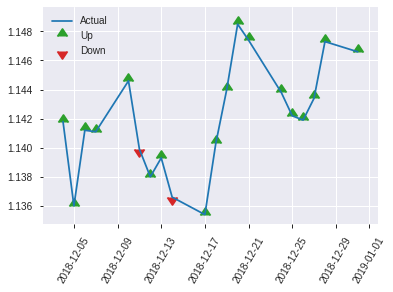


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23546124724139672
RMSE: 0.48524349273472667
LogLoss: 0.6627140243970541
Mean Per-Class Error: 0.39412991473961845
AUC: 0.6263264429859535
pr_auc: 0.5519280767219991
Gini: 0.25265288597190705
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34786078333854675: 


,0,1,Error,Rate
0,23.0,114.0,0.8321,(114.0/137.0)
1,3.0,116.0,0.0252,(3.0/119.0)
Total,26.0,230.0,0.457,(117.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3478608,0.6647564,229.0
max f2,0.3478608,0.8215297,229.0
max f0point5,0.4784247,0.5787349,155.0
max accuracy,0.5346645,0.5976562,77.0
max precision,0.6448705,0.75,3.0
max recall,0.2135801,1.0,252.0
max specificity,0.6703911,0.9927007,0.0
max absolute_mcc,0.3478608,0.2355729,229.0
max min_per_class_accuracy,0.5018697,0.5798319,125.0
max mean_per_class_accuracy,0.4784247,0.6058701,155.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.54 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6506812,1.4341737,1.4341737,0.6666667,0.6650589,0.6666667,0.6650589,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.6317791,0.7170868,1.0756303,0.3333333,0.6392345,0.5,0.6521467,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.6184227,1.0756303,1.0756303,0.5,0.6265931,0.5,0.6457583,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.6126565,0.7170868,0.9778457,0.3333333,0.6142905,0.4545455,0.6371762,0.0084034,0.0420168,-28.2913165,-2.2154316
,5,0.0507812,0.6092567,1.0756303,0.9928895,0.5,0.6106606,0.4615385,0.6330968,0.0084034,0.0504202,7.5630252,-0.7110537
,6,0.1015625,0.5937862,1.6548158,1.3238526,0.7692308,0.6026789,0.6153846,0.6178879,0.0840336,0.1344538,65.4815772,32.3852618
,7,0.1523438,0.5720045,0.9928895,1.2135316,0.4615385,0.5803457,0.5641026,0.6053738,0.0504202,0.1848739,-0.7110537,21.3531566
,8,0.203125,0.5546901,1.4893342,1.2824822,0.6923077,0.5625014,0.5961538,0.5946557,0.0756303,0.2605042,48.9334195,28.2482224
,9,0.3007812,0.5346996,1.2907563,1.2851686,0.6,0.5437085,0.5974026,0.5781144,0.1260504,0.3865546,29.0756303,28.5168613
,10,0.4023438,0.5146126,0.9101487,1.1905034,0.4230769,0.5249274,0.5533981,0.5646886,0.0924370,0.4789916,-8.9851325,19.0503386


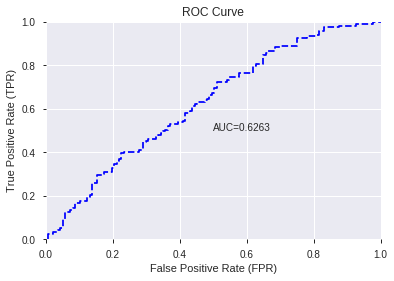

This function is available for GLM models only


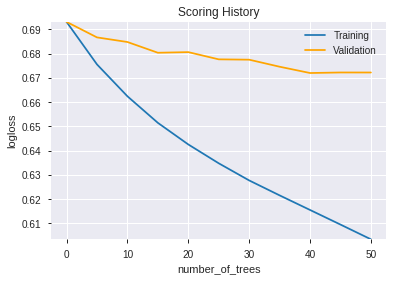

--2019-12-07 23:12:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.112.160
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.112.160|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

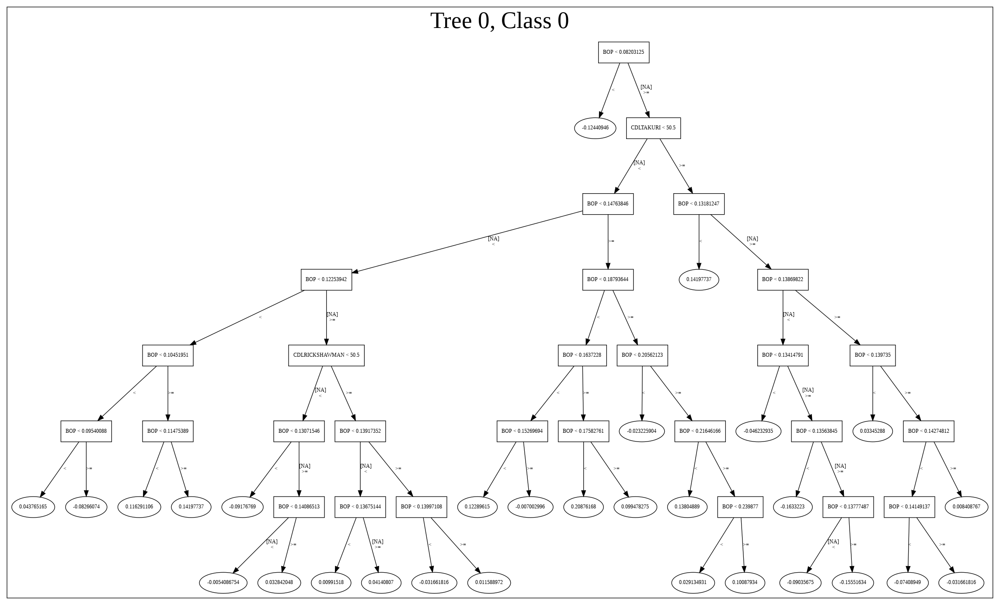

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_231200_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_231200_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_126_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'TRANGE',
 'aroondown_8',
 'WILLR_8',
 'HT_PHASOR_quadrature',
 'PLUS_DM_14',
 'ATR_20',
 'STOCH_slowd',
 'PPO',
 'CORREL_12',
 'CMO_24',
 'STOCH_slowk',
 'ADXR_8',
 'MINUS_DI_30',
 'CCI_8',
 'PLUS_DI_12',
 'VAR_12',
 'RSI_30',
 'aroondown_12',
 'CCI_30',
 'MINUS_DI_12',
 'HT_PHASOR_inphase',
 'CMO_14',
 'CORREL_8',
 'NATR_8',
 'MOM_12',
 'BBANDS_middleband_20_2_2',
 'PLUS_DM_12',
 'ROCR100_8',
 'MACDFIX_hist_14',
 'BBANDS_upperband_12_6_3',
 'CCI_12',
 'MOM_24',
 'PLUS_DI_20',
 'CCI_20',
 'ROC_20',
 'RSI_8',
 'MINUS_DI_14',
 'ATR_8',
 'MACD',
 'ROC_24',
 'CDLSPINNINGTOP',
 'BETA_8',
 'WILLR_14',
 'MOM_20',
 'AROONOSC_8',
 'ROCR_14']

In [94]:
# XGBoost with recursive feature elimination
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [95]:
# DRF with recursive feature elimination
model_train(feature_name='RFE',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_grid_1_AutoML_20191207_231237_model_2,0.628289,0.681972,0.439275,0.494423,0.244454
1,GBM_5_AutoML_20191207_231237,0.625468,0.659452,0.418819,0.483925,0.234184
2,GBM_3_AutoML_20191207_231237,0.621665,0.673850,0.448016,0.489669,0.239776
3,GBM_1_AutoML_20191207_231237,0.615960,0.669640,0.413728,0.488444,0.238577
4,GBM_2_AutoML_20191207_231237,0.607925,0.679430,0.446574,0.492852,0.242903
5,GBM_grid_1_AutoML_20191207_231237_model_1,0.600564,0.680272,0.446360,0.493584,0.243625
6,GBM_grid_1_AutoML_20191207_231237_model_4,0.593940,0.685388,0.461510,0.496124,0.246139
7,GBM_grid_1_AutoML_20191207_231237_model_5,0.582163,0.689604,0.427774,0.498228,0.248231
8,GBM_4_AutoML_20191207_231237,0.572410,0.697837,0.443814,0.500560,0.250560
9,GBM_grid_1_AutoML_20191207_231237_model_3,0.518371,1.062844,0.474453,0.585978,0.343370


,variable,relative_importance,scaled_importance,percentage
0,BOP,196.746933,1.000000,0.149025
1,WILLR_8,126.280807,0.641844,0.095651
2,TRANGE,118.305611,0.601309,0.089610
3,aroondown_8,88.407425,0.449346,0.066964
4,WILLR_14,64.058846,0.325590,0.048521
5,aroondown_12,45.699104,0.232274,0.034615
6,PLUS_DM_14,41.849304,0.212706,0.031699
7,ATR_20,27.493193,0.139739,0.020825
8,VAR_12,27.488014,0.139713,0.020821
9,RSI_30,27.055115,0.137512,0.020493


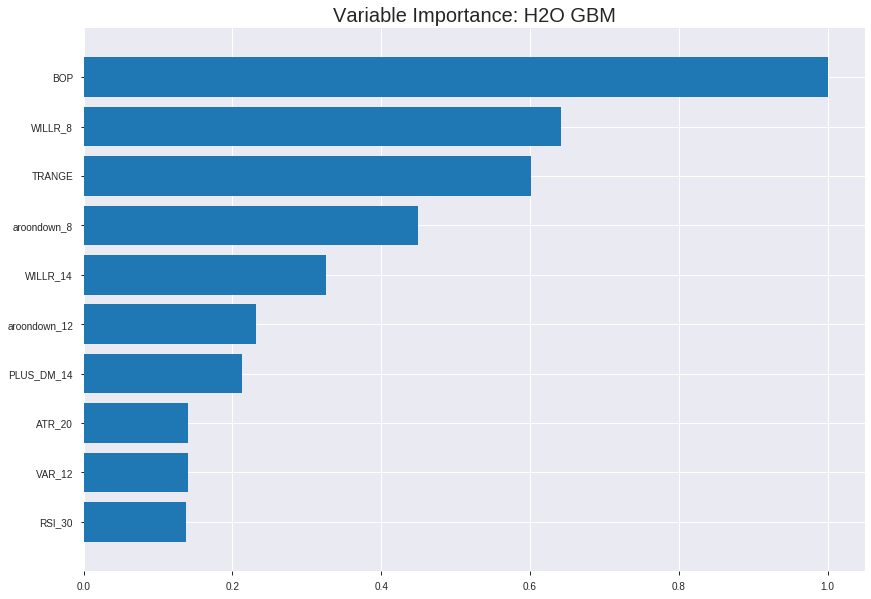

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_grid_1_AutoML_20191207_231237_model_2


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.2339038951376337
RMSE: 0.48363611852056054
LogLoss: 0.6607076147823296
Mean Per-Class Error: 0.24561382595340153
AUC: 0.8292253079293694
pr_auc: 0.8121869043613023
Gini: 0.6584506158587389
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4815206643012506: 


,0,1,Error,Rate
0,573.0,358.0,0.3845,(358.0/931.0)
1,111.0,745.0,0.1297,(111.0/856.0)
Total,684.0,1103.0,0.2625,(469.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4815207,0.7605921,183.0
max f2,0.4656696,0.8520366,239.0
max f0point5,0.4897300,0.7392103,148.0
max accuracy,0.4875221,0.7526581,158.0
max precision,0.5388044,1.0,0.0
max recall,0.4162724,1.0,336.0
max specificity,0.5388044,1.0,0.0
max absolute_mcc,0.4875221,0.5092723,158.0
max min_per_class_accuracy,0.4897300,0.7518797,148.0
max mean_per_class_accuracy,0.4875221,0.7543862,158.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.5278554,2.0876168,2.0876168,1.0,0.5322178,1.0,0.5322178,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.5223263,2.0876168,2.0876168,1.0,0.5249171,1.0,0.5285675,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.5191108,2.0876168,2.0876168,1.0,0.5207891,1.0,0.5259747,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.5173882,1.8556594,2.0296275,0.8888889,0.5183967,0.9722222,0.5240802,0.0186916,0.0817757,85.5659398,102.9627466
,5,0.0503637,0.5155820,2.0876168,2.0412253,1.0,0.5165556,0.9777778,0.5225753,0.0210280,0.1028037,108.7616822,104.1225337
,6,0.1001679,0.5093106,1.8765095,1.9593275,0.8988764,0.5121258,0.9385475,0.5173797,0.0934579,0.1962617,87.6509503,95.9327520
,7,0.1499720,0.5056570,1.7826840,1.9006661,0.8539326,0.5073259,0.9104478,0.5140410,0.0887850,0.2850467,78.2684028,90.0666062
,8,0.2003358,0.5026943,1.4845275,1.7960502,0.7111111,0.5040046,0.8603352,0.5115179,0.0747664,0.3598131,48.4527518,79.6050227
,9,0.2999440,0.4980219,1.4542949,1.6825568,0.6966292,0.5003197,0.8059701,0.5077991,0.1448598,0.5046729,45.4294865,68.2556842
,10,0.4001119,0.4938726,1.3412063,1.5970999,0.6424581,0.4958946,0.7650350,0.5048188,0.1343458,0.6390187,34.1206338,59.7099863




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.2458745988564757
RMSE: 0.4958574380368572
LogLoss: 0.684825637486563
Mean Per-Class Error: 0.43219285319580036
AUC: 0.5797184871369804
pr_auc: 0.5329930988157161
Gini: 0.15943697427396075
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4473819205114905: 


,0,1,Error,Rate
0,30.0,237.0,0.8876,(237.0/267.0)
1,4.0,240.0,0.0164,(4.0/244.0)
Total,34.0,477.0,0.4716,(241.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4473819,0.6657420,365.0
max f2,0.4286839,0.8310627,380.0
max f0point5,0.4642969,0.5670363,327.0
max accuracy,0.4962085,0.5655577,133.0
max precision,0.5215314,0.7142857,5.0
max recall,0.4286839,1.0,380.0
max specificity,0.5361127,0.9962547,0.0
max absolute_mcc,0.4473819,0.1923401,365.0
max min_per_class_accuracy,0.4916821,0.5532787,177.0
max mean_per_class_accuracy,0.4642969,0.5678071,327.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 48.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.5225571,1.3961749,1.3961749,0.6666667,0.5267170,0.6666667,0.5267170,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.5172344,1.2565574,1.3327124,0.6,0.5196025,0.6363636,0.5234831,0.0122951,0.0286885,25.6557377,33.2712370
,3,0.0313112,0.5140322,1.2565574,1.3089139,0.6,0.5161370,0.625,0.5211875,0.0122951,0.0409836,25.6557377,30.8913934
,4,0.0410959,0.5114346,0.0,0.9972678,0.0,0.5127905,0.4761905,0.5191882,0.0,0.0409836,-100.0,-0.2732240
,5,0.0508806,0.5094151,1.6754098,1.1276797,0.8,0.5102056,0.5384615,0.5174608,0.0163934,0.0573770,67.5409836,12.7679697
,6,0.1017613,0.5050443,1.3693253,1.2485025,0.6538462,0.5067405,0.5961538,0.5121006,0.0696721,0.1270492,36.9325347,24.8502522
,7,0.1506849,0.5024603,0.9214754,1.1423249,0.44,0.5037333,0.5454545,0.5093840,0.0450820,0.1721311,-7.8524590,14.2324888
,8,0.2015656,0.5006363,1.2887768,1.1792933,0.6153846,0.5013674,0.5631068,0.5073604,0.0655738,0.2377049,28.8776797,17.9293331
,9,0.3013699,0.4976811,1.0265992,1.1287258,0.4901961,0.4991389,0.5389610,0.5046377,0.1024590,0.3401639,2.6599164,12.8725782
,10,0.4011742,0.4951729,1.1908550,1.1441823,0.5686275,0.4964245,0.5463415,0.5025944,0.1188525,0.4590164,19.0855031,14.4182327



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:12:43,0.473 sec,0.0,0.4995594,0.6922662,0.5,0.0,1.0,0.5209849,0.4994956,0.6921385,0.5,0.0,1.0,0.5225049
,2019-12-07 23:12:43,0.517 sec,5.0,0.4968528,0.6868596,0.7584078,0.7261532,2.0876168,0.3318411,0.4987192,0.6905843,0.5666559,0.5145289,1.3961749,0.4657534
,2019-12-07 23:12:43,0.640 sec,10.0,0.4939814,0.6811467,0.7902736,0.7583492,2.0876168,0.2803581,0.4980711,0.6892851,0.5569626,0.5146962,1.7452186,0.4618395
,2019-12-07 23:12:43,0.688 sec,15.0,0.4911284,0.6754928,0.8128068,0.7854714,2.0876168,0.2775602,0.4975215,0.6881813,0.5672315,0.5171912,1.0471311,0.4774951
,2019-12-07 23:12:43,0.735 sec,20.0,0.4884920,0.6702781,0.8181366,0.7954268,2.0876168,0.2613318,0.4968186,0.6867697,0.5806471,0.5334054,1.3961749,0.4559687
,2019-12-07 23:12:43,0.783 sec,25.0,0.4860187,0.6653977,0.8226677,0.8019759,2.0876168,0.2607722,0.4962161,0.6855575,0.5874854,0.5459927,1.3961749,0.4618395
,2019-12-07 23:12:43,0.829 sec,30.0,0.4836361,0.6607076,0.8292253,0.8121869,2.0876168,0.2624510,0.4958574,0.6848256,0.5797185,0.5329931,1.3961749,0.4716243


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,196.7469330,1.0,0.1490252
WILLR_8,126.2808075,0.6418438,0.0956509
TRANGE,118.3056107,0.6013085,0.0896101
aroondown_8,88.4074249,0.4493459,0.0669639
WILLR_14,64.0588455,0.3255901,0.0485211
---,---,---,---
CDLSPINNINGTOP,6.3519564,0.0322849,0.0048113
MINUS_DI_12,5.6458883,0.0286962,0.0042765
ROC_20,4.9375982,0.0250962,0.0037400
ROCR_14,4.8578115,0.0246907,0.0036795



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.61328125)

('F1', 0.6489675516224189)

('auc', 0.6282892719131448)

('logloss', 0.6819716564624316)

('mean_per_class_error', 0.38759737471630995)

('rmse', 0.4944226790391273)

('mse', 0.2444537855482279)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


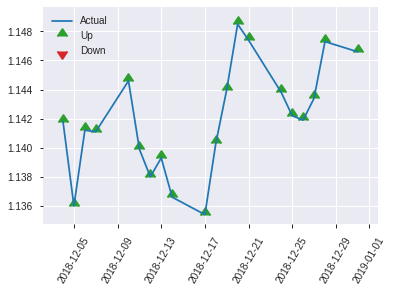


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.2444537855482279
RMSE: 0.4944226790391273
LogLoss: 0.6819716564624316
Mean Per-Class Error: 0.38759737471630995
AUC: 0.6282892719131448
pr_auc: 0.5685535111148178
Gini: 0.25657854382628953
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4597149703406896: 


,0,1,Error,Rate
0,27.0,110.0,0.8029,(110.0/137.0)
1,9.0,110.0,0.0756,(9.0/119.0)
Total,36.0,220.0,0.4648,(119.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4597150,0.6489676,219.0
max f2,0.3954536,0.8161866,252.0
max f0point5,0.4919317,0.5847076,136.0
max accuracy,0.4989494,0.6132812,61.0
max precision,0.5056095,0.68,24.0
max recall,0.3954536,1.0,252.0
max specificity,0.5282478,0.9927007,0.0
max absolute_mcc,0.4919317,0.2248053,136.0
max min_per_class_accuracy,0.4932237,0.5966387,123.0
max mean_per_class_accuracy,0.4919317,0.6124026,136.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 48.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.5167230,1.4341737,1.4341737,0.6666667,0.5240006,0.6666667,0.5240006,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.5126581,0.7170868,1.0756303,0.3333333,0.5132272,0.5,0.5186139,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.5121185,0.0,0.8067227,0.0,0.5123185,0.375,0.5170400,0.0,0.0252101,-100.0,-19.3277311
,4,0.0429688,0.5112943,2.1512605,1.1734148,1.0,0.5117912,0.5454545,0.5156085,0.0252101,0.0504202,115.1260504,17.3414820
,5,0.0507812,0.5096427,1.0756303,1.1583710,0.5,0.5105387,0.5384615,0.5148286,0.0084034,0.0588235,7.5630252,15.8371041
,6,0.1015625,0.5050531,1.6548158,1.4065934,0.7692308,0.5075084,0.6538462,0.5111685,0.0840336,0.1428571,65.4815772,40.6593407
,7,0.1523438,0.5020734,1.4893342,1.4341737,0.6923077,0.5037318,0.6666667,0.5086896,0.0756303,0.2184874,48.9334195,43.4173669
,8,0.203125,0.5003025,1.3238526,1.4065934,0.6153846,0.5011682,0.6538462,0.5068092,0.0672269,0.2857143,32.3852618,40.6593407
,9,0.3007812,0.4977014,1.1186555,1.3131071,0.52,0.4987371,0.6103896,0.5041884,0.1092437,0.3949580,11.8655462,31.3107061
,10,0.4023438,0.4954975,0.9928895,1.2322754,0.4615385,0.4964463,0.5728155,0.5022341,0.1008403,0.4957983,-0.7110537,23.2275434


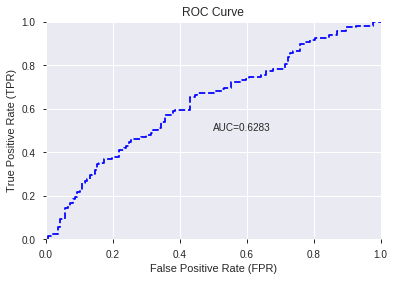

This function is available for GLM models only


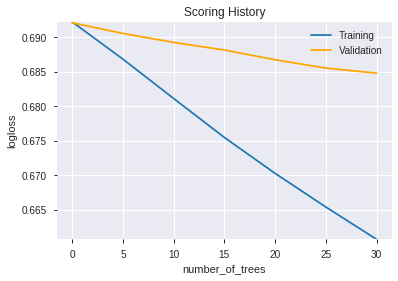

--2019-12-07 23:12:48--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.168.235
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.168.235|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      389.0
            depth:       1
            colId:       20
            colName:     MINUS_DI_14
            leftward:    false
            naVsRest:    false
            splitVal:    0.22070312
            isBitset:    false
            predValue:   -0.121688634
            squaredErr:  89.33162
            leftChild:   Node 5
            

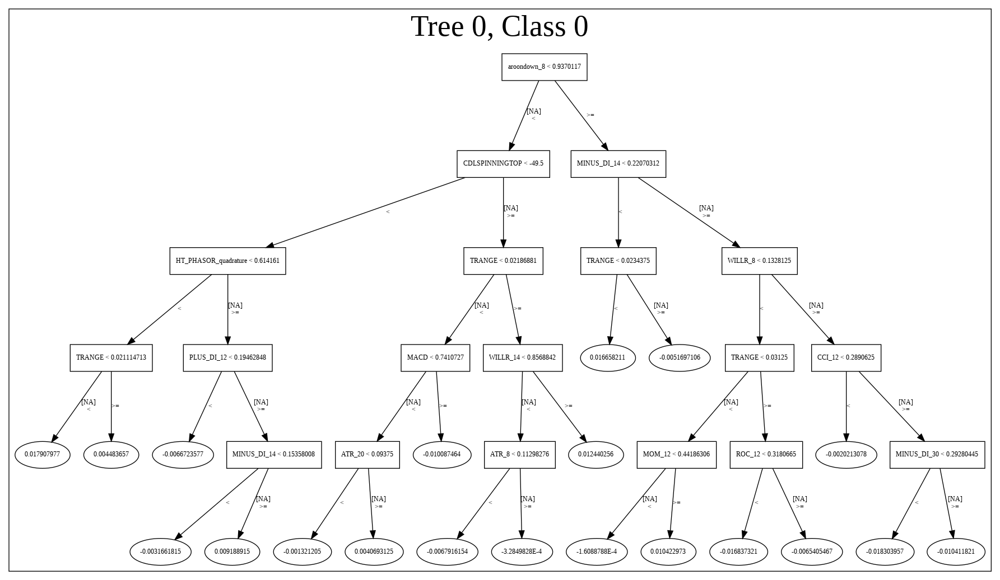

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_grid_1_AutoML_20191207_231237_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_grid_1_AutoML_20191207_231237_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_136_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_136

['BOP',
 'WILLR_8',
 'TRANGE',
 'aroondown_8',
 'WILLR_14',
 'aroondown_12',
 'PLUS_DM_14',
 'ATR_20',
 'VAR_12',
 'RSI_30',
 'RSI_8',
 'PLUS_DI_20',
 'NATR_8',
 'CCI_12',
 'HT_PHASOR_quadrature',
 'CCI_8',
 'PLUS_DI_12',
 'STOCH_slowd',
 'ADXR_8',
 'BBANDS_middleband_20_2_2',
 'CCI_30',
 'HT_PHASOR_inphase',
 'STOCH_slowk',
 'CORREL_8',
 'BBANDS_upperband_12_6_3',
 'ROC_24',
 'CMO_24',
 'ROCR100_8',
 'MINUS_DI_30',
 'STOCHF_fastd',
 'MINUS_DI_14',
 'CMO_14',
 'PLUS_DM_12',
 'CORREL_12',
 'MOM_24',
 'PPO',
 'BETA_8',
 'MACDFIX_hist_14',
 'MACD',
 'AROONOSC_8',
 'ATR_8',
 'MOM_12',
 'ROCP_12',
 'MOM_20',
 'CCI_20',
 'CDLSPINNINGTOP',
 'MINUS_DI_12',
 'ROC_20',
 'ROCR_14',
 'ROC_12']

In [96]:
# GBM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GBM",features_list=features_list)

In [97]:
# StackedEnsemble with recursive feature elimination
model_train(feature_name='RFE',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_231256_model_1,0.627676,0.665995,0.417715,0.486828,0.237002
1,GBM_5_AutoML_20191207_231256,0.625468,0.659452,0.418819,0.483925,0.234184
2,GBM_3_AutoML_20191207_231256,0.621665,0.673850,0.448016,0.489669,0.239776
3,GBM_1_AutoML_20191207_231256,0.615960,0.669640,0.413728,0.488444,0.238577
4,GBM_2_AutoML_20191207_231256,0.607925,0.679430,0.446574,0.492852,0.242903
5,XGBoost_1_AutoML_20191207_231256,0.601975,0.676376,0.429982,0.491676,0.241745
6,XGBoost_2_AutoML_20191207_231256,0.601730,0.673928,0.413175,0.490826,0.240910
7,XGBoost_3_AutoML_20191207_231256,0.600871,0.672156,0.450561,0.489654,0.239761
8,GBM_4_AutoML_20191207_231256,0.572410,0.697837,0.443814,0.500560,0.250560
9,DRF_1_AutoML_20191207_231256,0.550052,0.720785,0.449672,0.508665,0.258740


,variable,relative_importance,scaled_importance,percentage
0,CMO_14,0.799912,1.000000,0.093912
1,MINUS_DI_12,0.658218,0.822864,0.077277
2,RSI_30,0.574928,0.718739,0.067498
3,CCI_8,0.499530,0.624482,0.058646
4,BOP,0.486528,0.608227,0.057120
5,MOM_12,0.460741,0.575990,0.054092
6,MINUS_DI_14,0.391569,0.489516,0.045971
7,NATR_8,0.362191,0.452788,0.042522
8,ATR_8,0.311638,0.389591,0.036587
9,ATR_20,0.291046,0.363848,0.034170


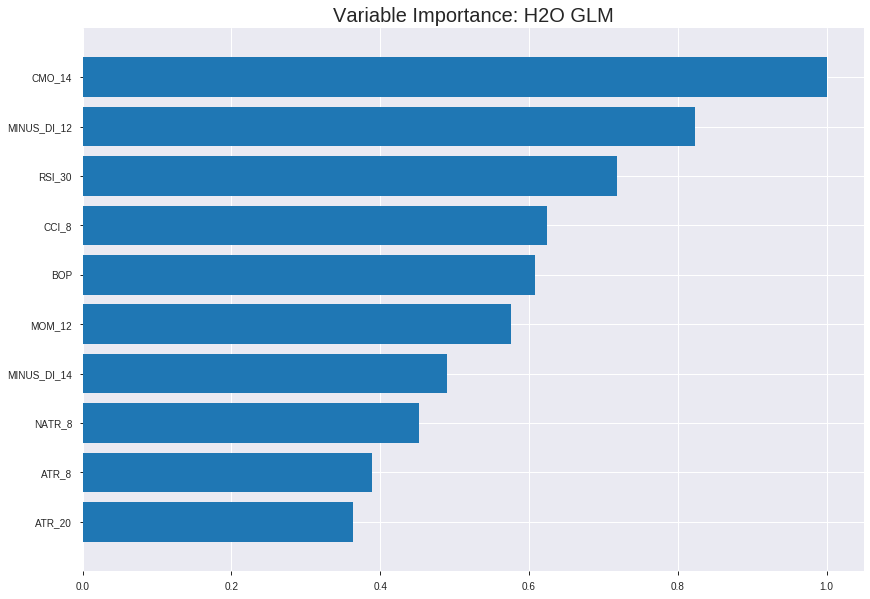

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_231256_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2299348247846317
RMSE: 0.47951519765762557
LogLoss: 0.6558300171464359
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2474.1593649352335
Residual deviance: 2343.9364812813606
AIC: 2445.9364812813606
AUC: 0.6660440738026642
pr_auc: 0.6009497167826154
Gini: 0.33208814760532834
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4126113100303399: 


,0,1,Error,Rate
0,362.0,569.0,0.6112,(569.0/931.0)
1,123.0,733.0,0.1437,(123.0/856.0)
Total,485.0,1302.0,0.3872,(692.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4126113,0.6793327,259.0
max f2,0.2849482,0.8264625,342.0
max f0point5,0.4821516,0.6136364,195.0
max accuracy,0.4826828,0.6295467,194.0
max precision,0.9999006,1.0,0.0
max recall,0.0000331,1.0,399.0
max specificity,0.9999006,1.0,0.0
max absolute_mcc,0.4126113,0.2753882,259.0
max min_per_class_accuracy,0.4821516,0.6283566,195.0
max mean_per_class_accuracy,0.4595038,0.6303681,214.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7795353,1.1597871,1.1597871,0.5555556,0.8199015,0.5555556,0.8199015,0.0116822,0.0116822,15.9787124,15.9787124
,2,0.0201455,0.7496112,1.3917445,1.2757658,0.6666667,0.7617650,0.6111111,0.7908333,0.0140187,0.0257009,39.1744548,27.5765836
,3,0.0302182,0.7136939,1.5077233,1.3530850,0.7222222,0.7312473,0.6481481,0.7709713,0.0151869,0.0408879,50.7723261,35.3084978
,4,0.0402910,0.6985790,1.3917445,1.3627499,0.6666667,0.7039722,0.6527778,0.7542215,0.0140187,0.0549065,39.1744548,36.2749870
,5,0.0503637,0.6861916,1.2757658,1.3453531,0.6111111,0.6919067,0.6444444,0.7417585,0.0128505,0.0677570,27.5765836,34.5353063
,6,0.1001679,0.6397118,1.2901003,1.3178810,0.6179775,0.6601170,0.6312849,0.7011658,0.0642523,0.1320093,29.0100284,31.7881011
,7,0.1499720,0.6056205,1.3839258,1.3398138,0.6629213,0.6226388,0.6417910,0.6750878,0.0689252,0.2009346,38.3925759,33.9813782
,8,0.2003358,0.5802408,1.3221573,1.3353750,0.6333333,0.5930481,0.6396648,0.6544633,0.0665888,0.2675234,32.2157321,33.5375007
,9,0.2999440,0.5419030,1.2666439,1.3125501,0.6067416,0.5606861,0.6287313,0.6233209,0.1261682,0.3936916,26.6643915,31.2550129
,10,0.4001119,0.5110903,1.2129170,1.2876070,0.5810056,0.5270415,0.6167832,0.5992174,0.1214953,0.5151869,21.2917036,28.7607019




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2349918230348099
RMSE: 0.484759551772639
LogLoss: 0.6620063436942087
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 707.3655748698118
Residual deviance: 676.5704832554813
AIC: 778.5704832554813
AUC: 0.639474734450789
pr_auc: 0.5840369631032118
Gini: 0.2789494689015779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40033992675712404: 


,0,1,Error,Rate
0,62.0,205.0,0.7678,(205.0/267.0)
1,17.0,227.0,0.0697,(17.0/244.0)
Total,79.0,432.0,0.4344,(222.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4003399,0.6715976,328.0
max f2,0.3205985,0.8293515,377.0
max f0point5,0.5021017,0.5998322,184.0
max accuracy,0.5050445,0.6183953,180.0
max precision,0.7446166,1.0,0.0
max recall,0.2275085,1.0,396.0
max specificity,0.7446166,1.0,0.0
max absolute_mcc,0.5021017,0.2343837,184.0
max min_per_class_accuracy,0.4950874,0.6029963,197.0
max mean_per_class_accuracy,0.5021017,0.6170028,184.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 49.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.6995416,1.3961749,1.3961749,0.6666667,0.7153695,0.6666667,0.7153695,0.0163934,0.0163934,39.6174863,39.6174863
,2,0.0215264,0.6814943,0.4188525,0.9519374,0.2,0.6857780,0.4545455,0.7019188,0.0040984,0.0204918,-58.1147541,-4.8062593
,3,0.0313112,0.6593294,1.2565574,1.0471311,0.6,0.6693554,0.5,0.6917428,0.0122951,0.0327869,25.6557377,4.7131148
,4,0.0410959,0.6547226,2.0942623,1.2964481,1.0,0.6567110,0.6190476,0.6834019,0.0204918,0.0532787,109.4262295,29.6448087
,5,0.0508806,0.6421987,1.2565574,1.2887768,0.6,0.6467608,0.6153846,0.6763555,0.0122951,0.0655738,25.6557377,28.8776797
,6,0.1017613,0.6116674,1.4498739,1.3693253,0.6923077,0.6248839,0.6538462,0.6506197,0.0737705,0.1393443,44.9873897,36.9325347
,7,0.1506849,0.5910969,1.1727869,1.3055142,0.56,0.6016276,0.6233766,0.6347132,0.0573770,0.1967213,17.2786885,30.5514158
,8,0.2015656,0.5678995,1.3693253,1.3216218,0.6538462,0.5801927,0.6310680,0.6209507,0.0696721,0.2663934,36.9325347,32.1621837
,9,0.3013699,0.5448653,1.1908550,1.2783159,0.5686275,0.5560083,0.6103896,0.5994438,0.1188525,0.3852459,19.0855031,27.8315946
,10,0.4011742,0.5176481,1.1087271,1.2361255,0.5294118,0.5323096,0.5902439,0.5827421,0.1106557,0.4959016,10.8727097,23.6125550



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:13:00,0.000 sec,2,.75E1,51,1.3811083,1.3848103
,2019-12-07 23:13:00,0.006 sec,4,.46E1,51,1.3794500,1.3846519
,2019-12-07 23:13:00,0.013 sec,6,.29E1,51,1.3770785,1.3841423
,2019-12-07 23:13:00,0.019 sec,8,.18E1,51,1.3737669,1.3830908
,2019-12-07 23:13:00,0.026 sec,10,.11E1,51,1.3693130,1.3813232
---,---,---,---,---,---,---,---
,2019-12-07 23:13:00,0.146 sec,42,.54E-3,51,1.3106801,1.3242224
,2019-12-07 23:13:00,0.156 sec,44,.34E-3,51,1.3097190,1.3251587
,2019-12-07 23:13:00,0.166 sec,46,.21E-3,51,1.3088051,1.3266025
,2019-12-07 23:13:00,0.176 sec,48,.13E-3,51,1.3079847,1.3282586



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.59765625)

('F1', 0.6705202312138727)

('auc', 0.6276758878733976)

('logloss', 0.6659945842928143)

('mean_per_class_error', 0.3897135496534381)

('rmse', 0.48682818581105564)

('mse', 0.2370016825000837)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


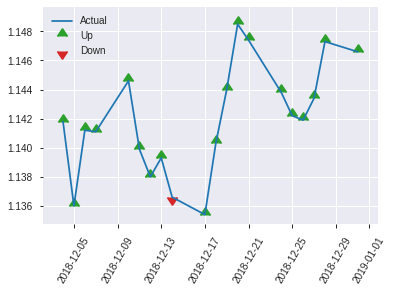


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2370016825000837
RMSE: 0.48682818581105564
LogLoss: 0.6659945842928143
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 353.8308882659767
Residual deviance: 340.98922715792094
AIC: 442.98922715792094
AUC: 0.6276758878733976
pr_auc: 0.5480322494009956
Gini: 0.25535177574679513
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36540875668162814: 


,0,1,Error,Rate
0,26.0,111.0,0.8102,(111.0/137.0)
1,3.0,116.0,0.0252,(3.0/119.0)
Total,29.0,227.0,0.4453,(114.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3654088,0.6705202,226.0
max f2,0.3559313,0.8274895,236.0
max f0point5,0.4199123,0.5824040,171.0
max accuracy,0.4199123,0.5976562,171.0
max precision,0.6584376,0.6666667,2.0
max recall,0.2893635,1.0,250.0
max specificity,0.6862483,0.9927007,0.0
max absolute_mcc,0.3654088,0.2589852,226.0
max min_per_class_accuracy,0.4681771,0.5714286,120.0
max mean_per_class_accuracy,0.4199123,0.6102865,171.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 46.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.6567696,1.4341737,1.4341737,0.6666667,0.6718603,0.6666667,0.6718603,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.6389805,0.7170868,1.0756303,0.3333333,0.6504431,0.5,0.6611517,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.6140035,1.0756303,1.0756303,0.5,0.6173582,0.5,0.6502033,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.6069150,1.4341737,1.1734148,0.6666667,0.6102974,0.5454545,0.6393199,0.0168067,0.0504202,43.4173669,17.3414820
,5,0.0507812,0.6016679,0.0,0.9928895,0.0,0.6045066,0.4615385,0.6339640,0.0,0.0504202,-100.0,-0.7110537
,6,0.1015625,0.5783953,1.3238526,1.1583710,0.6153846,0.5911683,0.5384615,0.6125661,0.0672269,0.1176471,32.3852618,15.8371041
,7,0.1523438,0.5585697,1.6548158,1.3238526,0.7692308,0.5653988,0.6153846,0.5968437,0.0840336,0.2016807,65.4815772,32.3852618
,8,0.203125,0.5497847,1.3238526,1.3238526,0.6153846,0.5535754,0.6153846,0.5860266,0.0672269,0.2689076,32.3852618,32.3852618
,9,0.3007812,0.5215869,1.0326050,1.2292917,0.48,0.5339826,0.5714286,0.5691292,0.1008403,0.3697479,3.2605042,22.9291717
,10,0.4023438,0.4872563,1.1583710,1.2113894,0.5384615,0.5023158,0.5631068,0.5522637,0.1176471,0.4873950,15.8371041,21.1389410


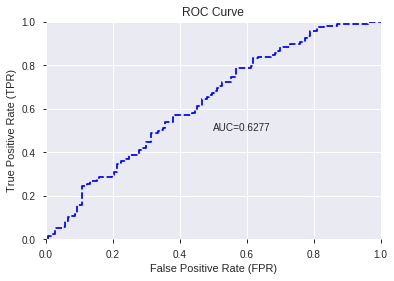

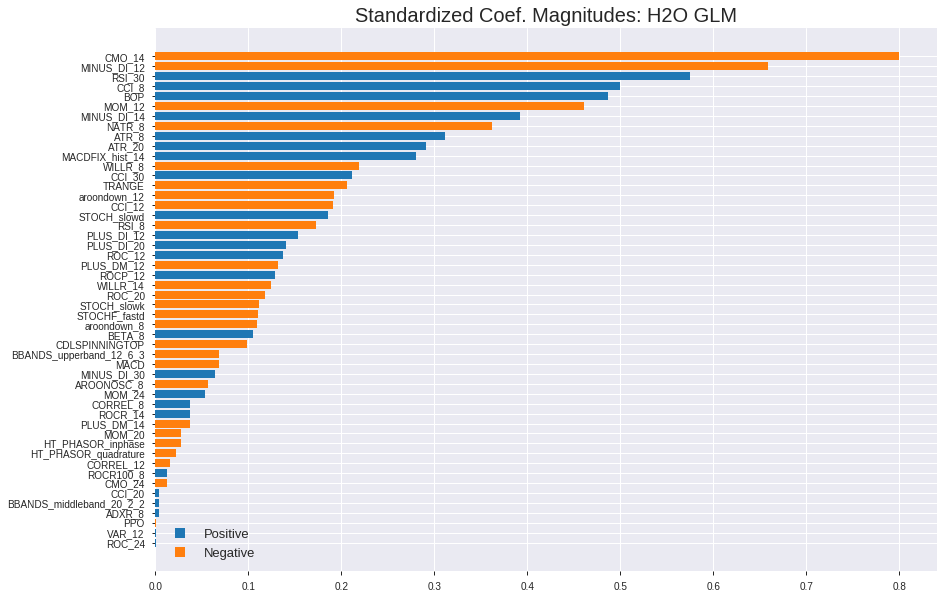

'log_likelihood'
--2019-12-07 23:13:11--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.132.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.132.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


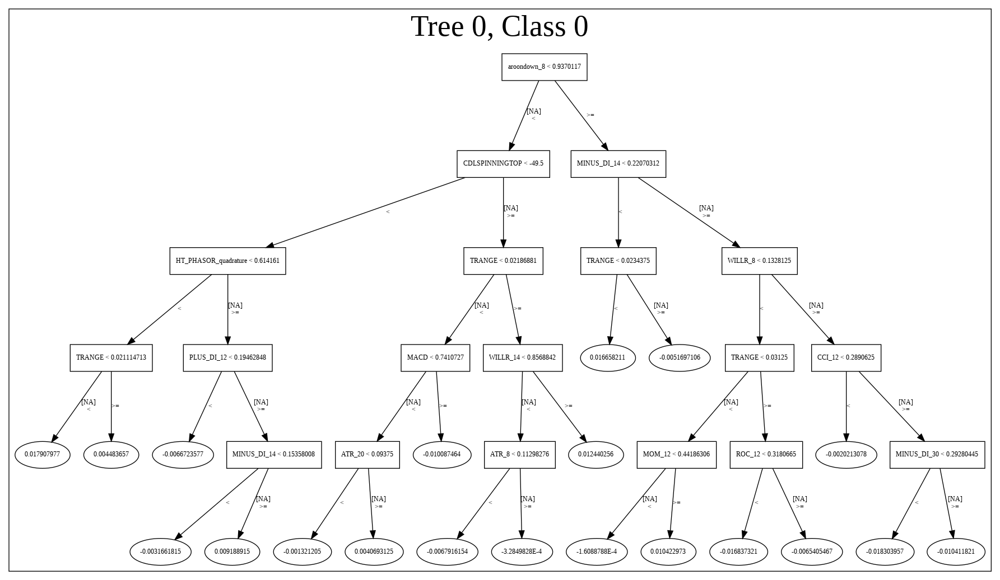

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_231256_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_231256_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_144_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_144

['CMO_14',
 'MINUS_DI_12',
 'RSI_30',
 'CCI_8',
 'BOP',
 'MOM_12',
 'MINUS_DI_14',
 'NATR_8',
 'ATR_8',
 'ATR_20',
 'MACDFIX_hist_14',
 'WILLR_8',
 'CCI_30',
 'TRANGE',
 'aroondown_12',
 'CCI_12',
 'STOCH_slowd',
 'RSI_8',
 'PLUS_DI_12',
 'PLUS_DI_20',
 'ROC_12',
 'PLUS_DM_12',
 'ROCP_12',
 'WILLR_14',
 'ROC_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'aroondown_8',
 'BETA_8',
 'CDLSPINNINGTOP',
 'BBANDS_upperband_12_6_3',
 'MACD',
 'MINUS_DI_30',
 'AROONOSC_8',
 'MOM_24',
 'CORREL_8',
 'ROCR_14',
 'PLUS_DM_14',
 'MOM_20',
 'HT_PHASOR_inphase',
 'HT_PHASOR_quadrature',
 'CORREL_12',
 'ROCR100_8',
 'CMO_24',
 'CCI_20',
 'BBANDS_middleband_20_2_2',
 'ADXR_8',
 'PPO',
 'VAR_12',
 'ROC_24']

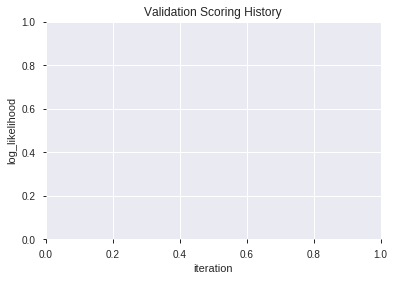

In [98]:
# All algos with recursive feature elimination
model_train(feature_name='RFE',model_algo=None,features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFECV' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=cv_rfe).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

In [100]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DeepLearning",features_list=features_list)

[]

In [101]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GLM",features_list=features_list)

[]

In [102]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="XGBoost",features_list=features_list)

[]

In [103]:
# DRF with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DRF",features_list=features_list)

[]

In [104]:
# GBM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GBM",features_list=features_list)

[]

In [105]:
# StackedEnsemble with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="StackedEnsemble",features_list=features_list)

[]

In [106]:
# All algos with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo=None,features_list=features_list)

[]

In [107]:
# Stacked ensemble

## filter models based on ensemble_model_threshold
models_arr = []
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_arr.append(best_models[model_name]['id'])

from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

try:
  ensemble = H2OStackedEnsembleEstimator(seed=1,
                                        base_models=models_arr)

  ensemble.train(y=data_label_name, training_frame=train_hf[:index_splits[0],:], blending_frame =train_hf[index_splits[0]:index_splits[1],:])
except:
  pass

try:
  display(ensemble)
  model_performance = ensemble.model_performance(test_data=train_hf[index_splits[1]:,:])
  display(model_performance)
  for k in models_summary:
    result = getattr(model_performance, k)()
    result = result[0][1] if isinstance(result,list) else result
    models_summary[k] = models_summary[k].append(pd.DataFrame({'StackedEnsemble':[result]},index=['All']))
    display((k,result))
except Exception as e:
  print(e)

stackedensemble Model Build progress: |███████████████████████████████████| 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_model_python_1575757602815_3820
No model summary for this model


ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.0936828737226837
RMSE: 0.30607658146725913
LogLoss: 0.3380586583855608
Null degrees of freedom: 1786
Residual degrees of freedom: 1779
Null deviance: 2474.175911744812
Residual deviance: 1208.2216450699943
AIC: 1224.2216450699943
AUC: 0.9831272523766024
pr_auc: 0.9817951195174152
Gini: 0.9662545047532047
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5309419102484196: 


,0,1,Error,Rate
0,872.0,59.0,0.0634,(59.0/931.0)
1,59.0,797.0,0.0689,(59.0/856.0)
Total,931.0,856.0,0.066,(118.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5309419,0.9310748,184.0
max f2,0.4503716,0.9468401,214.0
max f0point5,0.6056742,0.9449948,155.0
max accuracy,0.5340622,0.9339675,183.0
max precision,0.9705318,1.0,0.0
max recall,0.2697509,1.0,287.0
max specificity,0.9705318,1.0,0.0
max absolute_mcc,0.5309419,0.8677020,184.0
max min_per_class_accuracy,0.5256451,0.9323308,186.0
max mean_per_class_accuracy,0.5309419,0.9338510,184.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9081827,2.0876168,2.0876168,1.0,0.9321338,1.0,0.9321338,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.8880708,2.0876168,2.0876168,1.0,0.8991193,1.0,0.9156266,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.8778867,2.0876168,2.0876168,1.0,0.8824031,1.0,0.9045521,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.8669276,2.0876168,2.0876168,1.0,0.8728419,1.0,0.8966245,0.0210280,0.0841121,108.7616822,108.7616822
,5,0.0503637,0.8556554,2.0876168,2.0876168,1.0,0.8602397,1.0,0.8893476,0.0210280,0.1051402,108.7616822,108.7616822
,6,0.1001679,0.8169535,2.0876168,2.0876168,1.0,0.8357256,1.0,0.8626864,0.1039720,0.2091121,108.7616822,108.7616822
,7,0.1499720,0.7796884,2.0876168,2.0876168,1.0,0.7970749,1.0,0.8408975,0.1039720,0.3130841,108.7616822,108.7616822
,8,0.2003358,0.7500609,2.0876168,2.0876168,1.0,0.7651522,1.0,0.8218554,0.1051402,0.4182243,108.7616822,108.7616822
,9,0.2999440,0.6936426,2.0641605,2.0798272,0.9887640,0.7225162,0.9962687,0.7888659,0.2056075,0.6238318,106.4160454,107.9827207
,10,0.4001119,0.6176811,1.9360022,2.0438207,0.9273743,0.6600974,0.9790210,0.7566287,0.1939252,0.8177570,93.6002193,104.3820665



ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.23228775637354598
RMSE: 0.4819624014106764
LogLoss: 0.6552817395982758
Null degrees of freedom: 255
Residual degrees of freedom: 248
Null deviance: 353.78906016284543
Residual deviance: 335.50425067431723
AIC: 351.50425067431723
AUC: 0.6527939643010489
pr_auc: 0.5560430046615307
Gini: 0.3055879286020977
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3915242957031101: 


,0,1,Error,Rate
0,67.0,70.0,0.5109,(70.0/137.0)
1,22.0,97.0,0.1849,(22.0/119.0)
Total,89.0,167.0,0.3594,(92.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3915243,0.6783217,165.0
max f2,0.1273616,0.8217270,240.0
max f0point5,0.3915243,0.6162643,165.0
max accuracy,0.3938514,0.640625,163.0
max precision,0.7800282,1.0,0.0
max recall,0.1090721,1.0,247.0
max specificity,0.7800282,1.0,0.0
max absolute_mcc,0.3915243,0.3185716,165.0
max min_per_class_accuracy,0.4731705,0.6134454,123.0
max mean_per_class_accuracy,0.3915243,0.6520886,165.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 44.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7716775,1.4341737,1.4341737,0.6666667,0.7753513,0.6666667,0.7753513,0.0168067,0.0168067,43.4173669,43.4173669
,2,0.0234375,0.7497475,0.7170868,1.0756303,0.3333333,0.7625848,0.5,0.7689680,0.0084034,0.0252101,-28.2913165,7.5630252
,3,0.03125,0.7366607,1.0756303,1.0756303,0.5,0.7419724,0.5,0.7622191,0.0084034,0.0336134,7.5630252,7.5630252
,4,0.0429688,0.7272306,0.7170868,0.9778457,0.3333333,0.7329040,0.4545455,0.7542241,0.0084034,0.0420168,-28.2913165,-2.2154316
,5,0.0507812,0.7105788,1.0756303,0.9928895,0.5,0.7155046,0.4615385,0.7482673,0.0084034,0.0504202,7.5630252,-0.7110537
,6,0.1015625,0.6700265,1.3238526,1.1583710,0.6153846,0.6890611,0.5384615,0.7186642,0.0672269,0.1176471,32.3852618,15.8371041
,7,0.1523438,0.6360729,1.6548158,1.3238526,0.7692308,0.6530478,0.6153846,0.6967921,0.0840336,0.2016807,65.4815772,32.3852618
,8,0.203125,0.5920690,0.8274079,1.1997414,0.3846154,0.6083405,0.5576923,0.6746792,0.0420168,0.2436975,-17.2592114,19.9741435
,9,0.3007812,0.5437788,1.2047059,1.2013533,0.56,0.5626153,0.5584416,0.6382948,0.1176471,0.3613445,20.4705882,20.1353269
,10,0.4023438,0.5035084,1.4065934,1.2531615,0.6538462,0.5211925,0.5825243,0.6087350,0.1428571,0.5042017,40.6593407,25.3161459


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.640625)

('F1', 0.6783216783216783)

('auc', 0.6527939643010489)

('logloss', 0.6552817395982758)

('mean_per_class_error', 0.3479114273446605)

('rmse', 0.4819624014106764)

('mse', 0.23228775637354598)

Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_231321_model_1,0.649512,0.649982,0.392934,0.479646,0.230060
1,DeepLearning_grid_1_AutoML_20191207_231321_model_165,0.645096,1.655804,0.394927,0.586710,0.344229
2,DeepLearning_grid_1_AutoML_20191207_231321_model_240,0.644605,1.752826,0.390940,0.575352,0.331030
3,DeepLearning_grid_1_AutoML_20191207_231321_model_103,0.642029,6.207785,0.427559,0.617767,0.381636
4,DeepLearning_grid_1_AutoML_20191207_231321_model_202,0.641170,1.788107,0.418819,0.589359,0.347344
...,...,...,...,...,...,...
375,XRT_1_AutoML_20191207_231321,0.590198,1.762536,0.500000,0.583215,0.340140
376,GBM_1_AutoML_20191207_231321,0.589339,1.344612,0.416150,0.611674,0.374145
377,XGBoost_grid_1_AutoML_20191207_231321_model_97,0.586395,0.924260,0.500000,0.567209,0.321726
378,GBM_grid_1_AutoML_20191207_231321_model_27,0.565969,0.680034,0.496350,0.493437,0.243480


,variable,relative_importance,scaled_importance,percentage
0,XGBF_['DRF'],0.162745,1.000000,0.125546
1,XGBF_None,0.126083,0.774730,0.097264
2,XGBF_['GBM'],0.126078,0.774694,0.097259
3,DLF_['GBM'],0.118500,0.728130,0.091414
4,XGBF_['DRF']predict,0.109125,0.670526,0.084182
5,DLF_['GBM']predict,0.072515,0.445572,0.055940
6,XGBF_Nonepredict,0.061426,0.377438,0.047386
7,XGBF_['GBM']predict,0.061402,0.377292,0.047367
8,All_['XGBoost'],0.050652,0.311233,0.039074
9,DLF_None,0.046907,0.288221,0.036185


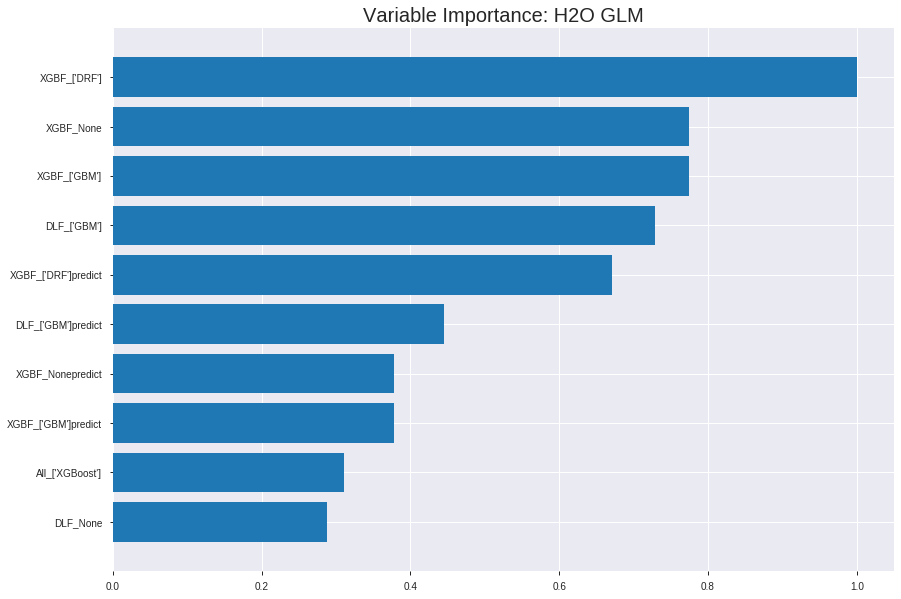

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_231321_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.11349256936484685
RMSE: 0.3368865823461167
LogLoss: 0.39295265982858785
Null degrees of freedom: 1786
Residual degrees of freedom: 1756
Null deviance: 2474.1593649352712
Residual deviance: 1404.4128062273728
AIC: 1466.4128062273728
AUC: 0.9838933113825954
pr_auc: 0.9830561498077025
Gini: 0.9677866227651908
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5610576390948515: 


,0,1,Error,Rate
0,886.0,45.0,0.0483,(45.0/931.0)
1,66.0,790.0,0.0771,(66.0/856.0)
Total,952.0,835.0,0.0621,(111.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5610576,0.9343584,152.0
max f2,0.4866559,0.9518375,185.0
max f0point5,0.5875173,0.9509510,137.0
max accuracy,0.5632657,0.9378847,151.0
max precision,0.8242932,1.0,0.0
max recall,0.2915419,1.0,279.0
max specificity,0.8242932,1.0,0.0
max absolute_mcc,0.5632657,0.8757485,151.0
max min_per_class_accuracy,0.5433734,0.9334049,160.0
max mean_per_class_accuracy,0.5610576,0.9372810,152.0


Gains/Lift Table: Avg response rate: 47.90 %, avg score: 47.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.7920802,2.0876168,2.0876168,1.0,0.8041411,1.0,0.8041411,0.0210280,0.0210280,108.7616822,108.7616822
,2,0.0201455,0.7792473,2.0876168,2.0876168,1.0,0.7859263,1.0,0.7950337,0.0210280,0.0420561,108.7616822,108.7616822
,3,0.0302182,0.7715841,2.0876168,2.0876168,1.0,0.7755433,1.0,0.7885369,0.0210280,0.0630841,108.7616822,108.7616822
,4,0.0402910,0.7648035,2.0876168,2.0876168,1.0,0.7680065,1.0,0.7834043,0.0210280,0.0841121,108.7616822,108.7616822
,5,0.0503637,0.7559284,2.0876168,2.0876168,1.0,0.7602053,1.0,0.7787645,0.0210280,0.1051402,108.7616822,108.7616822
,6,0.1001679,0.7354927,2.0876168,2.0876168,1.0,0.7452545,1.0,0.7621031,0.1039720,0.2091121,108.7616822,108.7616822
,7,0.1499720,0.7167311,2.0876168,2.0876168,1.0,0.7263859,1.0,0.7502418,0.1039720,0.3130841,108.7616822,108.7616822
,8,0.2003358,0.7004569,2.0876168,2.0876168,1.0,0.7082276,1.0,0.7396795,0.1051402,0.4182243,108.7616822,108.7616822
,9,0.2999440,0.6611546,2.0641605,2.0798272,0.9887640,0.6827819,0.9962687,0.7207844,0.2056075,0.6238318,106.4160454,107.9827207
,10,0.4001119,0.6153098,1.9709902,2.0525799,0.9441341,0.6402825,0.9832168,0.7006308,0.1974299,0.8212617,97.0990184,105.2579897




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2274292635545813
RMSE: 0.4768954430004351
LogLoss: 0.6435113005186159
Null degrees of freedom: 510
Residual degrees of freedom: 480
Null deviance: 707.3655748698048
Residual deviance: 657.6685491300253
AIC: 719.6685491300253
AUC: 0.6622920120341377
pr_auc: 0.5937174988392043
Gini: 0.32458402406827536
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35797012044036336: 


,0,1,Error,Rate
0,71.0,196.0,0.7341,(196.0/267.0)
1,17.0,227.0,0.0697,(17.0/244.0)
Total,88.0,423.0,0.4168,(213.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3579701,0.6806597,319.0
max f2,0.2286939,0.8396421,366.0
max f0point5,0.4930150,0.6233509,233.0
max accuracy,0.4930150,0.6399217,233.0
max precision,0.7877731,1.0,0.0
max recall,0.2286939,1.0,366.0
max specificity,0.7877731,1.0,0.0
max absolute_mcc,0.4930150,0.3002711,233.0
max min_per_class_accuracy,0.5456715,0.6142322,182.0
max mean_per_class_accuracy,0.4930150,0.6457220,233.0


Gains/Lift Table: Avg response rate: 47.75 %, avg score: 50.26 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.7484689,1.0471311,1.0471311,0.5,0.7617254,0.5,0.7617254,0.0122951,0.0122951,4.7131148,4.7131148
,2,0.0215264,0.7280733,0.8377049,0.9519374,0.4,0.7371472,0.4545455,0.7505535,0.0081967,0.0204918,-16.2295082,-4.8062593
,3,0.0313112,0.7017093,1.6754098,1.1780225,0.8,0.7112295,0.5625,0.7382648,0.0163934,0.0368852,67.5409836,17.8022541
,4,0.0410959,0.6973661,2.0942623,1.3961749,1.0,0.6991927,0.6666667,0.7289619,0.0204918,0.0573770,109.4262295,39.6174863
,5,0.0508806,0.6915062,1.6754098,1.4498739,0.8,0.6931471,0.6923077,0.7220744,0.0163934,0.0737705,67.5409836,44.9873897
,6,0.1017613,0.6596013,1.3693253,1.4095996,0.6538462,0.6749986,0.6730769,0.6985365,0.0696721,0.1434426,36.9325347,40.9599622
,7,0.1506849,0.6422374,0.9214754,1.2511177,0.44,0.6505266,0.5974026,0.6829489,0.0450820,0.1885246,-7.8524590,25.1117735
,8,0.2015656,0.6269463,1.4498739,1.3012892,0.6923077,0.6329143,0.6213592,0.6703188,0.0737705,0.2622951,44.9873897,30.1289193
,9,0.3013699,0.5976858,1.3140469,1.3055142,0.6274510,0.6140687,0.6233766,0.6516905,0.1311475,0.3934426,31.4046930,30.5514158
,10,0.4011742,0.5673817,1.0676631,1.2463415,0.5098039,0.5799920,0.5951220,0.6338533,0.1065574,0.5,6.7663131,24.6341463



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:13:24,0.000 sec,2,.48E2,31,1.3124335,1.3634033
,2019-12-07 23:13:24,0.009 sec,4,.3E2,31,1.2756887,1.3534437
,2019-12-07 23:13:24,0.015 sec,6,.18E2,31,1.2251060,1.3406098
,2019-12-07 23:13:24,0.021 sec,8,.11E2,31,1.1594822,1.3256430
,2019-12-07 23:13:24,0.027 sec,10,.71E1,31,1.0799060,1.3104040
,2019-12-07 23:13:24,0.033 sec,12,.44E1,31,0.9889582,1.2973585
,2019-12-07 23:13:24,0.039 sec,14,.27E1,31,0.8898383,1.2889384
,2019-12-07 23:13:24,0.045 sec,16,.17E1,31,0.7859053,1.2870226
,2019-12-07 23:13:24,0.051 sec,18,.11E1,31,0.6805560,1.2926103
,2019-12-07 23:13:24,0.058 sec,20,.66E0,31,0.5776100,1.3059554


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.63671875)

('F1', 0.6708074534161491)

('auc', 0.6495123596884008)

('logloss', 0.649982497707014)

('mean_per_class_error', 0.3554253818315647)

('rmse', 0.47964593934341904)

('mse', 0.23006022712863083)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        1
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


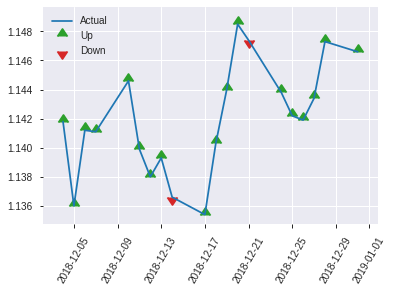


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.23006022712863083
RMSE: 0.47964593934341904
LogLoss: 0.649982497707014
Null degrees of freedom: 255
Residual degrees of freedom: 225
Null deviance: 353.830888265976
Residual deviance: 332.79103882599117
AIC: 394.79103882599117
AUC: 0.6495123596884008
pr_auc: 0.5596840323200343
Gini: 0.29902471937680164
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34124314774131953: 


,0,1,Error,Rate
0,42.0,95.0,0.6934,(95.0/137.0)
1,11.0,108.0,0.0924,(11.0/119.0)
Total,53.0,203.0,0.4141,(106.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3412431,0.6708075,202.0
max f2,0.1308554,0.8240997,245.0
max f0point5,0.4864459,0.6122449,153.0
max accuracy,0.4864459,0.6367188,153.0
max precision,0.7454692,1.0,0.0
max recall,0.1308554,1.0,245.0
max specificity,0.7454692,1.0,0.0
max absolute_mcc,0.4645301,0.2968717,162.0
max min_per_class_accuracy,0.5243432,0.6204380,125.0
max mean_per_class_accuracy,0.4864459,0.6445746,153.0


Gains/Lift Table: Avg response rate: 46.48 %, avg score: 47.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.7206090,2.1512605,2.1512605,1.0,0.7359841,1.0,0.7359841,0.0252101,0.0252101,115.1260504,115.1260504
,2,0.0234375,0.7120320,0.7170868,1.4341737,0.3333333,0.7151453,0.6666667,0.7255647,0.0084034,0.0336134,-28.2913165,43.4173669
,3,0.03125,0.7045863,0.0,1.0756303,0.0,0.7066302,0.5,0.7208311,0.0,0.0336134,-100.0,7.5630252
,4,0.0429688,0.6989729,0.0,0.7822765,0.0,0.7020576,0.3636364,0.7157110,0.0,0.0336134,-100.0,-21.7723453
,5,0.0507812,0.6912508,1.0756303,0.8274079,0.5,0.6945951,0.3846154,0.7124624,0.0084034,0.0420168,7.5630252,-17.2592114
,6,0.1015625,0.6655619,1.4893342,1.1583710,0.6923077,0.6754801,0.5384615,0.6939713,0.0756303,0.1176471,48.9334195,15.8371041
,7,0.1523438,0.6487257,1.1583710,1.1583710,0.5384615,0.6572085,0.5384615,0.6817170,0.0588235,0.1764706,15.8371041,15.8371041
,8,0.203125,0.6104424,1.6548158,1.2824822,0.7692308,0.6270546,0.5961538,0.6680514,0.0840336,0.2605042,65.4815772,28.2482224
,9,0.3007812,0.5782595,1.2047059,1.2572302,0.56,0.5944770,0.5844156,0.6441636,0.1176471,0.3781513,20.4705882,25.7230165
,10,0.4023438,0.5458706,1.1583710,1.2322754,0.5384615,0.5621550,0.5728155,0.6234624,0.1176471,0.4957983,15.8371041,23.2275434


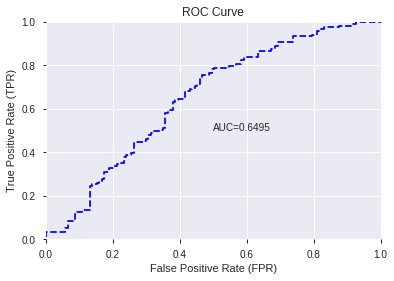

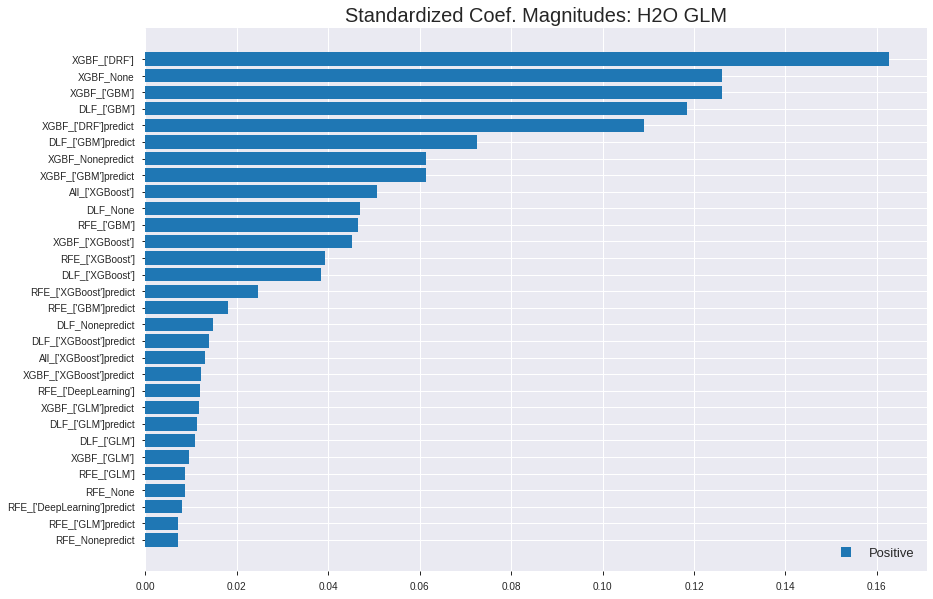

'log_likelihood'
--2019-12-07 23:43:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.120.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.120.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


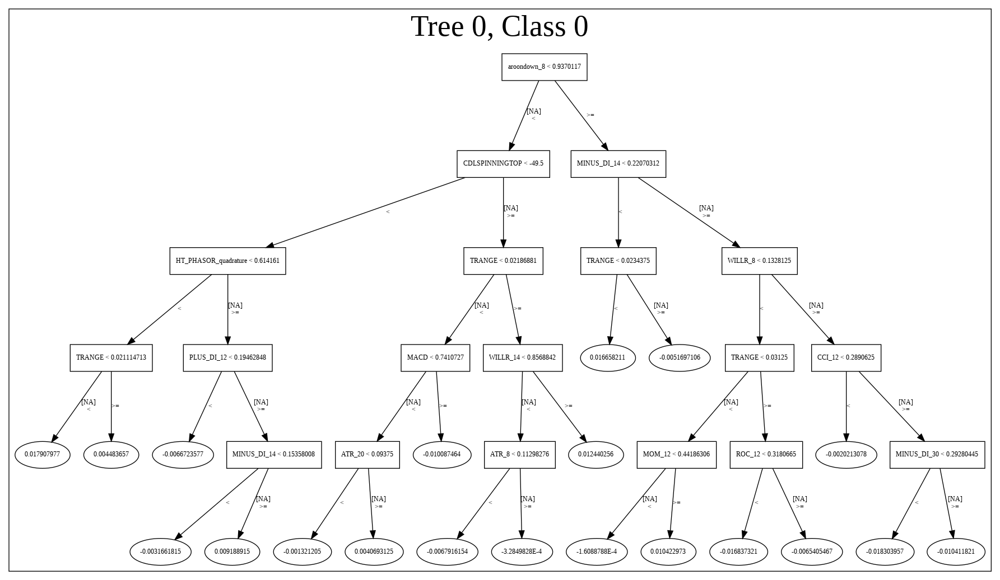

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_231321_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_231321_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_153_sid_9f32',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_153

["XGBF_['DRF']",
 'XGBF_None',
 "XGBF_['GBM']",
 "DLF_['GBM']",
 "XGBF_['DRF']predict",
 "DLF_['GBM']predict",
 'XGBF_Nonepredict',
 "XGBF_['GBM']predict",
 "All_['XGBoost']",
 'DLF_None',
 "RFE_['GBM']",
 "XGBF_['XGBoost']",
 "RFE_['XGBoost']",
 "DLF_['XGBoost']",
 "RFE_['XGBoost']predict",
 "RFE_['GBM']predict",
 'DLF_Nonepredict',
 "DLF_['XGBoost']predict",
 "All_['XGBoost']predict",
 "XGBF_['XGBoost']predict",
 "RFE_['DeepLearning']",
 "XGBF_['GLM']predict",
 "DLF_['GLM']predict",
 "DLF_['GLM']",
 "XGBF_['GLM']",
 "RFE_['GLM']",
 'RFE_None',
 "RFE_['DeepLearning']predict",
 "RFE_['GLM']predict",
 'RFE_Nonepredict']

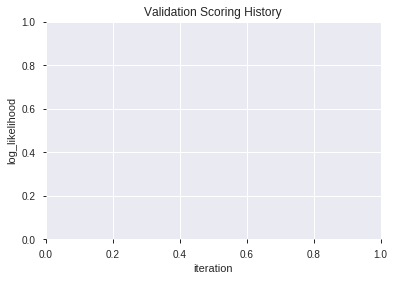

In [108]:
# Super learner
models_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_df[model_name] = pd.read_csv(model_name+".csv")['p1']
    models_df[model_name+'predict'] = pd.read_csv(model_name+".csv")['predict']

models_df[data_label_name] = pd.read_pickle('scaled_df')[[data_label_name]].values[-len(models_df):]

training_frame = h2o.H2OFrame(models_df)
training_frame[data_label_name] = training_frame[data_label_name].ascharacter().asfactor()

model_train(feature_name='Super_learner',model_algo=None,training_frame= training_frame,max_models=500)

In [109]:
# Majority Voting
models1_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models1_df[model_name] = pd.read_csv(model_name+".csv")['predict']

model_accuracy = accuracy_score(models1_df.mode(1)[0].values[index_splits[1]:],pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'MajorityVoting':[model_accuracy]},index=['All']))
display('MajorityVoting', model_accuracy)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


'MajorityVoting'

0.55859375

In [110]:
# LogReg SuperLearner
from sklearn.linear_model import LogisticRegression
models2_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models2_df[model_name] = pd.read_csv(model_name+".csv")['predict']
    models2_df[model_name+'p1'] = pd.read_csv(model_name+".csv")['p1']

clf = LogisticRegression(random_state=0, solver='lbfgs',
                         multi_class='multinomial').fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'LogReg':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.60546875

In [111]:
# DTree SuperLearner
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0).fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'DTree':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.55859375

In [112]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


All                0.637
DRF                0.609
DTree              0.559
DeepLearning       0.613
GBM                0.621
GLM                0.617
LogReg             0.605
MajorityVoting     0.559
StackedEnsemble    0.641
XGBoost            0.645
dtype: float64

,All,DRF,DTree,DeepLearning,GBM,GLM,LogReg,MajorityVoting,StackedEnsemble,XGBoost
All,NaN,NaN,0.559,0.598,NaN,0.559,0.605,0.559,0.641,0.621
DLF,0.609,0.559,NaN,0.578,0.621,0.613,NaN,NaN,NaN,0.625
Fwe,0.570,0.559,NaN,0.566,0.570,0.566,NaN,NaN,NaN,0.586
RFE,0.598,0.566,NaN,0.598,0.613,0.598,NaN,NaN,NaN,0.598
Super_learner,0.637,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.617,0.609,NaN,0.613,0.617,0.617,NaN,NaN,NaN,0.645






F1


All                0.681
DRF                0.665
DeepLearning       0.687
GBM                0.671
GLM                0.678
StackedEnsemble    0.678
XGBoost            0.677
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.636,NaN,0.646,0.678,0.671
DLF,0.681,0.644,0.646,0.671,0.669,NaN,0.677
Fwe,0.645,0.643,0.645,0.645,0.645,NaN,0.643
RFE,0.671,0.645,0.687,0.649,0.671,NaN,0.665
Super_learner,0.671,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.667,0.665,0.650,0.667,0.678,NaN,0.675






auc


All                0.650
DRF                0.618
DeepLearning       0.617
GBM                0.638
GLM                0.628
StackedEnsemble    0.653
XGBoost            0.645
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.573,NaN,0.543,0.653,0.641
DLF,0.624,0.563,0.581,0.628,0.603,NaN,0.641
Fwe,0.581,0.542,0.551,0.581,0.551,NaN,0.565
RFE,0.628,0.550,0.617,0.628,0.628,NaN,0.626
Super_learner,0.650,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.638,0.618,0.594,0.638,0.623,NaN,0.645






logloss


All                0.679
DRF                0.721
DeepLearning       0.702
GBM                0.682
GLM                0.688
StackedEnsemble    0.655
XGBoost            0.685
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.683,NaN,0.688,0.655,0.662
DLF,0.664,0.716,0.678,0.679,0.675,NaN,0.660
Fwe,0.679,0.707,0.702,0.679,0.686,NaN,0.685
RFE,0.666,0.721,0.656,0.682,0.666,NaN,0.663
Super_learner,0.650,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.668,0.673,0.680,0.668,0.665,NaN,0.658






mean_per_class_error


All                0.430
DRF                0.459
DeepLearning       0.457
GBM                0.430
GLM                0.456
StackedEnsemble    0.348
XGBoost            0.435
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.421,NaN,0.442,0.348,0.367
DLF,0.386,0.422,0.414,0.368,0.375,NaN,0.365
Fwe,0.430,0.459,0.457,0.430,0.456,NaN,0.435
RFE,0.390,0.427,0.382,0.388,0.390,NaN,0.394
Super_learner,0.355,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.379,0.390,0.377,0.379,0.366,NaN,0.348






rmse


All                0.494
DRF                0.509
DeepLearning       0.505
GBM                0.494
GLM                0.497
StackedEnsemble    0.482
XGBoost            0.496
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.495,NaN,0.497,0.482,0.485
DLF,0.486,0.508,0.493,0.493,0.491,NaN,0.484
Fwe,0.494,0.506,0.505,0.494,0.497,NaN,0.496
RFE,0.487,0.509,0.482,0.494,0.487,NaN,0.485
Super_learner,0.480,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.488,0.491,0.494,0.488,0.486,NaN,0.483






mse


All                0.244
DRF                0.259
DeepLearning       0.255
GBM                0.244
GLM                0.247
StackedEnsemble    0.232
XGBoost            0.246
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.245,NaN,0.247,0.232,0.235
DLF,0.236,0.258,0.243,0.243,0.242,NaN,0.234
Fwe,0.244,0.256,0.255,0.244,0.247,NaN,0.246
RFE,0.237,0.259,0.233,0.244,0.237,NaN,0.235
Super_learner,0.230,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.238,0.241,0.244,0.238,0.237,NaN,0.233


{'F1':                  All    DRF  DeepLearning    GBM    GLM  StackedEnsemble  XGBoost
 All              NaN    NaN         0.636    NaN    NaN              NaN      NaN
 DLF              NaN    NaN         0.646    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN    NaN  0.669              NaN      NaN
 DLF              NaN    NaN           NaN    NaN    NaN              NaN    0.677
 DLF              NaN  0.644           NaN    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN  0.671    NaN              NaN      NaN
 DLF            0.681    NaN           NaN    NaN    NaN              NaN      NaN
 All              NaN    NaN           NaN    NaN  0.646              NaN      NaN
 All              NaN    NaN           NaN    NaN    NaN              NaN    0.671
 XGBF             NaN    NaN         0.650    NaN    NaN              NaN      NaN
 XGBF             NaN    NaN           NaN    NaN  0.678              NaN      Na